In [295]:
import sys
import time
import datetime
import os
import random

import numpy as np
import pandas as pd

from scipy import stats

from bokeh.plotting import figure, output_file, save

from cycler import cycler

%matplotlib notebook
import matplotlib.pyplot as plt

# Functions

## reading data from .xlsx files

In [296]:
def readFile(ID, GR, testMode = False):
    try:
        if testMode:
            start = time.perf_counter()
            
        path = os.path.join(os.getcwd(),'MergedData/')
        fileName = str(ID) + "-" + str(GR) + ".xlsx"
        pathToData = os.path.join(path, fileName)
        
        data = pd.read_excel(pathToData, index_col=0, sheet_name = None)
        
        if testMode:
            print(f"readFile in {time.perf_counter() - start}s for participant {ID} group {GR}")
        
        return data
    except Exception as e:
        print("error in readFile")
        print(e)

In [297]:
def readAllData(participantsDict, testMode = False):
    try:
        if testMode:
            start = time.perf_counter()
        
        listOfDataFrames = []
        
        for key, value in participantsDict.items():
       
            listOfDataFrames.append(readFile(key, value))
        
        if testMode:# or fullTestMode:
            print(f"\nreadAllData in {time.perf_counter() - start}s")
            
        return listOfDataFrames

    except Exception as e:
        print("error in readAllData")
        print(e)

## Identifying indexes for phases

In [298]:
def getIndexForPhase(experimentDataList, testMode = False):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()            
        
        breakLenghts = []
        for dataDictionary in experimentDataList:

            firstInd = True
            secInd = False
            thirdInd = False
            fourthInd = False
            fifthInd = False

            adaptationPEphase = ()
            instructionPhase = ()
            breakPhase = ()
            adaptationVEphase = ()
            
            phaseStart = 0
            phaseEnd = 0

            i = 0
            for item in dataDictionary['Experiment_Data'].itertuples():
                if firstInd and item[3] == 'adaptation PE':
                    firstInd = False
                    phaseStart = i
                    secInd = True
                elif secInd and item[3] != 'adaptation PE' and item[18] == 'Audio_1' :
                    secInd = False
                    adaptationPEphase = (phaseStart, i-1)
                    phaseStart = i
                    thirdInd = True
                elif thirdInd and item[18] != 'Audio_1': 
                    #2ms difference in break start and audioClip playing caused an error here for sample 30 
                    thirdInd = False
                    instructionPhase = (phaseStart, i-1)
                    phaseStart = i
                    fourthInd = True
                elif fourthInd and item[3] != 'break':
                    fourthInd = False
                    breakPhase = (phaseStart, i - 1)
                    phaseStart = i
                    fifthInd = True
                elif fifthInd and item[3] != 'adaptation VE':
                    adaptationVEphase = (phaseStart, i - 1)
                    break
                i += 1
            dataDictionary['phases'] = adaptationPEphase, instructionPhase, breakPhase, adaptationVEphase
            
            breakLenghts.append(breakPhase)
            
            if testMode:
                print(f"adaptationPEphase : {adaptationPEphase}")
                print(f"instructionPhase : {instructionPhase}")
                print(f"breakPhase : {breakPhase}")
                print(f"adaptationVEphase : {adaptationVEphase}")
                print('_' * 100 + '1')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[0]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[0]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[0]+1])
                print("to")
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[1]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[1]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[1]+1])
                print('_' * 100+ '2')
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[0]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[0]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[0]+1])
                print("to")
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[1]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[1]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[1]+1])
                print('_' * 100+ '3')
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[0]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[0]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[0]+1])
                print("to")
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[1]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[1]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[1]+1])
                print('_' * 100+ '4')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[0]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[0]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[0]+1])
                print('to')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[1]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[1]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[1]+1])
                print('_' * 100+ '5')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[0]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[0]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[0]+1])
                print('to')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[1]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[1]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[1]+1])
                print('_' * 100)

        if testMode:    
            print('_'*100)
            print(breakLenghts)
            print('_'*100)
        breakLenghts = [tup[1] - tup[0] for tup in breakLenghts]
        breakLenghts.sort()
        
        if testMode:
            print(breakLenghts)
            print('_'*100)
            print(breakLenghts[0])
            print('_'*100)
            print(breakLenghts[-1])
            print('_'*100)

        converterToSeconds = lambda ms : divmod(ms,100)
        breakPhaseConverted = []

        for ms in breakLenghts:
            s = converterToSeconds(ms)
            breakPhaseConverted.append(f"{s[0]}''.{s[1]}")
        
        
        breakLenghts = [item/100 for item in breakLenghts]
        print('_'*100)
        print(f'Shortest break : {breakLenghts[0]}')
        print(f'Longest break : {breakLenghts[-1]}')
        print('_'*80)
        print(f'Mean break length : {np.mean(breakLenghts)}')
        print(f'SD break length : {np.std(breakLenghts)}')
        print('_'*40)
        print(f'Median break length : {np.median(breakLenghts)}')
        print(f'Q1 and Q3 break : {np.quantile(breakLenghts,[.25,.75])}')
        
        
        fig6, ax6 = plt.subplots(figsize=(8, 8))
        ax6.boxplot(breakLenghts, notch=True, vert = True, patch_artist = True, labels = ['Lenght of break stage'])
        ax6.yaxis.grid(True)
        ax6.set_ylabel('seconds')
        ax6.set_title('Lenght of break stage')

        ax6.set_prop_cycle(color=['red'])
        fig6.show()
        
        fig7, ax7 = plt.subplots(figsize=(8, 8))
        ax7.hist(breakLenghts,30)
        ax7.axvline(x=np.mean(breakLenghts), c = 'r')
        ax7.axvline(x=np.mean(breakLenghts) + np.std(breakLenghts), c = 'r', ls = '--')
        ax7.axvline(x=np.mean(breakLenghts) - np.std(breakLenghts), c = 'r', ls = '--')
        ax7.set_ylabel('samples')
        ax7.set_xlabel('seconds')
        ax7.set_title('Lenght of break stage')
        fig7.show()
        
        if testMode or fullTestMode:
            print(f"\ngetIndexForPhase in {time.perf_counter() - start}s")

        return experimentDataList
    except Exception as e:
        print("error in getIndexForPhase")
        print(e)

## Calculating sample age parameters

In [299]:
def calculateMeanAge(experimentDataList, testMode = False):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            
        malesAge = []
        femalesAge = []
        
        for item in experimentDataList:
            if item['Participant_Data'][0].get('Gender') == 0:
                malesAge.append(int(item['Participant_Data'][0].get('Age')))
            else:
                femalesAge.append(int(item['Participant_Data'][0].get('Age')))
        ageList = [*malesAge, *femalesAge]
        
        sampleAgeData = (np.mean(ageList), np.std(ageList), np.median(ageList), len(ageList)) 
        
        print(f"Average participant age : {sampleAgeData[0]}")
        print(f"Standard deviation of participant age : {sampleAgeData[1]}")
        print(f"Median of participant age : {sampleAgeData[2]}")
        print(f'N = {sampleAgeData[3]}')

        sampleFemaleAgeData = (np.mean(femalesAge), np.std(femalesAge), np.median(femalesAge), len(femalesAge)) 
        
        print('_'*80)
        print(f'Mean female age : {sampleFemaleAgeData[0]}')
        print(f"Standard deviation of female age : {sampleFemaleAgeData[1]}")
        print(f"Median of female age : {sampleFemaleAgeData[2]}")
        print(f'N = {sampleFemaleAgeData[3]}')

        sampleMaleAgeData = (np.mean(malesAge), np.std(malesAge), np.median(malesAge), len(malesAge)) 
        
        print(f'\nMean male age : {sampleMaleAgeData[0]}')
        print(f"Standard deviation of male age : {sampleMaleAgeData[1]}")
        print(f"Median of male age : {sampleMaleAgeData[2]}")
        print(f'N = {sampleMaleAgeData[3]}')

        l1 = [i for i in range(1, len(femalesAge)+1)]
        l2 = ['Mean','Standard Deviation', 'Median', 'N']
        l3 = ['-' for i in range(1, len(femalesAge)+1)]
        dfIndex = [*l1,* l2]
        ageDF = pd.DataFrame(columns = ['Females Age', 'Males Age', 'Average'], index = dfIndex)
        ageDF['Females age'] = [*femalesAge, *list(sampleFemaleAgeData)]
        ageDF['Males age'] = [*malesAge, *list(sampleMaleAgeData)]
        ageDF['Average age'] = [*l3, *list(sampleAgeData)]
        
        # on one plot:
        allAgeData = [femalesAge, ageList, malesAge]
        labels = ['Female age', 'Average age', 'Male age']
        colors = ['lightcoral', 'forestgreen', 'lightskyblue'] # https://matplotlib.org/stable/gallery/color/named_colors.html
        
        #plt.close()
        fig1, ax1 = plt.subplots(figsize=(8, 8))
        ax1.boxplot(allAgeData, notch=True, vert = True, patch_artist = True, labels = labels)
        ax1.yaxis.grid(True)
        ax1.set_ylabel('age')
        ax1.set_title('Participants age')
        #fig1.gca().set_color_cycle(['red', 'green', 'blue']) # deprecated
        #cy = cycler('color',  ['red', 'green', 'blue'])
        #ax1.set_prop_cycle(cy)# ['lightcoral', 'forestgreen', 'lightskyblue'])
        
        ax1.set_prop_cycle(color=['red', 'green', 'blue'])
        """
        for ax, color in zip(ax1.gca(), colors):
            ax.set_facecolor(color)
        """
        fig1.show()
        # to add violins:
        # https://matplotlib.org/stable/gallery/statistics/customized_violin.html#sphx-glr-gallery-statistics-customized-violin-py
        
        if testMode or fullTestMode:
            print(f"\ncalculateMeanAge in {time.perf_counter() - start}s")
        
        return ageDF
            
    except Exception as e:
        print('error in calculateMeanAge')
        print(e)

## Testing proportion of missing Heart Rate data in the sample

In [300]:
def testingHRQualityPerSample(experimentDataList, showGraphs = False, testMode = False):
    """
    Checking number of -1 in sample 'PPG_to_HR_CONSENSYS'
    Total and phase wise
    """
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            
        totalNa1all = []
        totalNa2all = []
        totalNa3all = []
        totalNa4all = []
        totalNaTotalAll = []
        
        total1all = []
        total2all = []
        total3all = []
        total4all = []
        totalTotalAll = []
        
        for item in experimentDataList:
            
            totalNa1 = 0
            totalNa2 = 0
            totalNa3 = 0
            totalNa4 = 0
            totalNaAll = 0
            
            total1 = 0
            total2 = 0
            total3 = 0
            total4 = 0
            totalAll = 0
            
            if testMode:
                ID = int(item['Participant_Data'][0].get('ID'))
                if ID > 9:
                    ID = f'00{ID}'
                elif ID > 99:
                    ID = 'f0{ID}'
                elif ID > 999:
                    ID = 'f{ID}'
                else:
                    ID = f'000{ID}'
                print(ID)
                
            totalNaInSample = 0
            
            totalNaInAdaptationPEphase = 0
            totalNaInInstructionPhase = 0
            totalNaInBreakPhase = 0
            totalNaInAdaptationVEphase = 0
            
            start1 = item['phases'][0][0]
            end1 = item['phases'][0][1]
            start2 = item['phases'][1][0]
            end2 = item['phases'][1][1]
            start3 = item['phases'][2][0]
            end3 = item['phases'][2][1]
            start4 = item['phases'][3][0]
            end4 = item['phases'][3][1]
            
            i = 0
            for val in item['Experiment_Data']['PPG_to_HR_CONSENSYS']:                   
                if val == -1:
                    totalNaInSample += 1
                    if i < end1:
                        totalNaInAdaptationPEphase += 1
                    elif i < end2: #sometimes audio phase was overlaping 
                        totalNaInInstructionPhase += 1
                    elif i < end3:
                        totalNaInBreakPhase += 1
                    elif i < end4:
                        totalNaInAdaptationVEphase += 1
                i += 1
                        
            totalRows = len(item['Experiment_Data']['PPG_to_HR_CONSENSYS'])
            
            if testMode:
                print(f"\nstart1 : {start1} | end1 : {end1}")
                print(f"start2 : {start2} | end2 : {end2}")
                print(f"start3 : {start3} | end3 : {end3}")
                print(f"start4 : {start4} | end4 : {end4}")
           
            totalRowsInAdaptationPEphase = end1 - start1 +1
            totalRowsInInstructionPhase = end2 - start2 +1
            totalRowsInBreakPhase = end3 - start3 +1
            totalRowsInAdaptationVEphase = end4 - start4 +1
            
            if testMode:
                print(f"\ntotalRows : {totalRows}")
                print(f"totalRowsInAdaptationPEphase : {totalRowsInAdaptationPEphase}")
                print(f"totalRowsInInstructionPhase : {totalRowsInInstructionPhase}")
                print(f"totalRowsInBreakPhase : {totalRowsInBreakPhase}")
                print(f"totalRowsInAdaptationVEphase : {totalRowsInAdaptationVEphase}")

            toAppendInAdaptationPEphase = (totalNaInAdaptationPEphase,
                                           totalRowsInAdaptationPEphase,
                                           totalNaInAdaptationPEphase/totalRowsInAdaptationPEphase)
            
            totalNa1all.append(totalNaInAdaptationPEphase)
            total1all.append(totalRowsInAdaptationPEphase)
            
            toAppendInInstructionPhase = (totalNaInInstructionPhase,                                           
                                          totalRowsInInstructionPhase,
                                          totalNaInInstructionPhase/totalRowsInInstructionPhase)
            
            totalNa2all.append(totalNaInInstructionPhase)
            total2all.append(totalRowsInInstructionPhase)
            
            toAppendInBreakPhase = (totalNaInBreakPhase,
                                    totalRowsInBreakPhase,
                                    totalNaInBreakPhase/totalRowsInBreakPhase)
            
            totalNa3all.append(totalNaInBreakPhase)
            total3all.append(totalRowsInBreakPhase)
            
            toAppendInAdaptationVEphase = (totalNaInAdaptationVEphase,
                                           totalRowsInAdaptationVEphase,
                                           totalNaInAdaptationVEphase/totalRowsInAdaptationVEphase)
            
            totalNa4all.append(totalNaInAdaptationVEphase)
            total4all.append(totalRowsInAdaptationVEphase)
            
            if testMode:
                print(f'\ntoAppendInAdaptationPEphase : {toAppendInAdaptationPEphase}')
                print(f'toAppendInInstructionPhase : {toAppendInInstructionPhase}')
                print(f'toAppendInBreakPhase : {toAppendInBreakPhase}')
                print(f'toAppendInAdaptationVEphase : {toAppendInAdaptationVEphase}')
            
            toAppendTotal = (totalNaInSample,
                             totalRows, 
                             totalNaInSample/totalRows)
            
            totalNaTotalAll.append(totalNaInSample)
            totalTotalAll.append(totalRows)
            
            toAppend = {}
            toAppend['adaptation PE phase'] = toAppendInAdaptationPEphase
            toAppend['instruction phase'] = toAppendInInstructionPhase
            toAppend['break phase'] = toAppendInBreakPhase
            toAppend['adaptation VE phase'] = toAppendInAdaptationVEphase
            toAppend['total'] = toAppendTotal
            
            if testMode:
                print(f"\ntoAppend for participant {ID} :\n {toAppend}")
                print('_'*100)
                        
            item['Missing_HR'] = toAppend

            totalNa1 += totalNaInAdaptationPEphase
            totalNa2 += totalNaInInstructionPhase
            totalNa3 += totalNaInBreakPhase
            totalNa4 += totalNaInAdaptationVEphase
            totalNaAll += totalNaInSample
            total1 += totalRowsInAdaptationPEphase
            total2 += totalRowsInInstructionPhase
            total3 += totalRowsInBreakPhase
            total4 += totalRowsInAdaptationVEphase
            totalAll += totalRows
                
        if testMode or fullTestMode:
                        
            totalErrors = (totalNa1/total1, totalNa2/total2, totalNa3/total3, total4 ,totalNa4/total4, totalNaAll/totalAll)
            
            allResults = {}
            allResults['total adaptation PE phase'] = (totalNa1, total1, totalErrors[0])
            allResults['total instruction phase'] = (totalNa2, total2, totalErrors[1])
            allResults['total break phase'] = (totalNa3, total3, totalErrors[2])
            allResults['total adaptation VE phase'] = (totalNa4, totalErrors[3])
            allResults['total mean'] = (totalNaAll, totalAll, totalErrors[4])
            
            if testMode:
                print('='*100)
                print(allResults)
                      
            
            allPhaseErrorData = [[na / total for na, total in zip(totalNa1all, total1all)],
                                 [na / total for na, total in zip(totalNa2all, total2all)],
                                 [na / total for na, total in zip(totalNa3all, total3all)],
                                 [na / total for na, total in zip(totalNa4all, total4all)],
                                 [na / total for na, total in zip(totalNaTotalAll, totalTotalAll)]]
            
            if testMode:
                print('_'*200)
                print('allPhaseErrorData')
                print(allPhaseErrorData)
            
            if showGraphs:
                labels = ['Adaptation PE', 'Instruction', 'Break', 'Adaptation VE']
                fig4, ax4 = plt.subplots(figsize=(8, 8))
                ax4.boxplot(allPhaseErrorData[0:4], notch=True, vert = True, patch_artist = True, labels = labels)
                ax4.yaxis.grid(True)
                ax4.set_ylabel('Interpolated HR')
                ax4.set_title('Per phase error distribution')

                ax4.set_prop_cycle(color=['red', 'green', 'blue','yellow'])
                fig4.show()

                fig5, ax5 = plt.subplots(figsize=(8, 8))
                ax5.boxplot(allPhaseErrorData[4], notch=True, vert = True, patch_artist = True, labels = ['Total error'])
                ax5.yaxis.grid(True)
                ax5.set_ylabel('Interpolated HR')
                ax5.set_title('Total error distribution')

                ax5.set_prop_cycle(color=['red'])
                fig5.show()
            
            if testMode or fullTestMode:
                print(f"\ntestingHRQualityPerSample in {time.perf_counter() - start}s")
            
        return experimentDataList

    except Exception as e:
        print("error in testingHRQualityPerSample")
        print(e)

## Calculating mean value of parameter 

In [301]:
def calculateMeansPerPhase(experimentDataList, thresholds = [1], testMode = False): 
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
        
        phases = ['adaptation PE', 'instruction', 'break', 'adaptation VE']
        newNames = lambda item : f'threshold : {int((1-item) * 100)}%'
        
        columnNames1 = [newNames(item) for item in thresholds]
        columnNames3 = [f'targeted {newNames(item)}' for item in thresholds]

        d = {}
        for thresholdLevel in [*columnNames1, *columnNames3]:
            d[thresholdLevel] = pd.DataFrame(columns = phases, index = pd.RangeIndex(0, len(experimentDataList)))        
        meansHR = pd.concat(d, axis=1)
        
        columnNames2 = ['Skin Conductance', 'Phasic Component', 'Tonic Component']
        d = {}
        for parameter in columnNames2:
            d[parameter] = pd.DataFrame(columns = phases, index = pd.RangeIndex(0, len(experimentDataList)))        
        meansSC = pd.concat(d, axis=1)
        
        i = 0
        for item in experimentDataList:
            ID = int(item['Participant_Data'][0].get('ID'))
            
            error1 = item['Missing_HR'].get('adaptation PE phase')[-1]
            error2 = item['Missing_HR'].get('instruction phase')[-1]
            error3 = item['Missing_HR'].get('break phase')[-1]
            error4 = item['Missing_HR'].get('adaptation VE phase')[-1]
            
            errorsDict = dict(zip(phases, [error1, error2, error3, error4]))
            
            phaseLengths = []
            rejected = False
            j = 0
            for phase in item['phases']:
                                
                sampleMeanPhaseHR = np.mean(item['Experiment_Data']['HR_CONSENSYS_interpolated'].iloc[phase[0]:phase[1]])
                phaseLengths.append((phase[1] - phase[0])/100)
                k = 0
                for cutOff in thresholds:
                    #strict cutOff:
                    if error1 <= cutOff and error2 <= cutOff and error3 <= cutOff and error4 <= cutOff:
                        meansHR.loc[i,(columnNames1[k], phases[j])] = sampleMeanPhaseHR
                    elif testMode and not rejected:
                        rejected = True
                        print(f'{i}) At threshold : {1 - cutOff} sample {ID} was rejected from HR analysis')
                    
                    #targeted cutOff:                        
                    if errorsDict[phases[j]] <= cutOff:
                        meansHR.loc[i,(columnNames3[k], phases[j])] = sampleMeanPhaseHR
                    elif testMode:
                        print(f'{i}) At threshold : {1 - cutOff} sample {ID} was rejected from targeted HR analysis in {phases[j]}')
                    
                    k += 1 
                    
                meansSC.loc[i,(columnNames2[0], phases[j])] = np.mean(item['Experiment_Data']['Skin_Conductance'].iloc[phase[0]:phase[1]])
                meansSC.loc[i,(columnNames2[1], phases[j])] = np.mean(item['Experiment_Data']['Skin_Conductance_Phasic_CVX'].iloc[phase[0]:phase[1]])
                meansSC.loc[i,(columnNames2[2], phases[j])] = np.mean(item['Experiment_Data']['Skin_Conductance_Tonic_CVX'].iloc[phase[0]:phase[1]])                
                j += 1
            
            for l in range(len(phases)):
                meansHR.loc[i,('Phases lengths', phases[l])] = meansSC.loc[i,('Phases lengths', phases[l])] = phaseLengths[l]
            meansHR.loc[i,'Gender'] = meansSC.loc[i,'Gender'] = int(item['Participant_Data'][0].get('Gender'))
            meansHR.loc[i,'Age'] = meansSC.loc[i,'Age'] = int(item['Participant_Data'][0].get('Age'))
            meansHR.loc[i,'MSSQ'] = meansSC.loc[i,'MSSQ'] = int(item['Participant_Data'][0].get('MSSQ'))
            meansHR.loc[i,'ID'] = meansSC.loc[i,'ID'] = ID
            
            i += 1
        
        if testMode or fullTestMode:
            print('_'*100)
            print('meansHR : \n')
            display(meansHR)
            print('_'*100)
            print('\nmeansSC : \n')
            display(meansSC)
            print(f"\ncalculateMeansPerPhase in {time.perf_counter() - start}s")
        return meansHR, meansSC
        
    except Exception as e:
        print('error in calculateMeansPerPhase')
        print(e)

## Calculating statistics for the experiment

In [302]:
def statisticalTestsOnData(meansSC, meansHR, thresholds = [1], testMode = False):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()

        startHighlight0 = '\x1b[30;43m'
        startHighlight1 = '\x1b[33;42m'
        startHighlight2 = '\x1b[32;40m'
        endHifghlight = '\x1b[0m'

        phases = ['adaptation PE', 'instruction', 'break', 'adaptation VE']
        parameters = ['Skin Conductance', 'Phasic Component', 'Tonic Component']
        
        tests = []        
        phasesNo = len(phases)
        for i in range(phasesNo):
            if i == 0:
                for j in range(1, phasesNo):
                    tests.append((phases[i], phases[j]))
            elif i == phasesNo:
                break
            else:
                for j in range(i+1, phasesNo):
                    tests.append((phases[i],phases[j]))
        
        correls = ['Phases lengths','Age','MSSQ']# 'Gender' would had to be between groups as its 0 1 - further work
        
        condition = lambda cond : f'{cond[0]} - {cond[1]}'
        outerIndex = [condition(test) for test in tests]

        newName = lambda item : f'threshold : {int((1-item) * 100)}%'
        hrIndexes = [newName(threshold) for threshold in thresholds]

        innerIndex = [*parameters, *hrIndexes]

        columnNames = ['N',
                       'mean difference',
                       'standard deviation',
                       'Shapiro-Wilk statistic','Shapiro-Wilk pvalue',
                       'kurtosis statistic','kurtosis pvalue', 'skew', 
                       'Ttest statistic', 'Ttest pvalue',
                       'Wilcoxon statistic', 'Wilcoxon pvalue']

        d = {}
        for outerInd in outerIndex:
            d[outerInd] = pd.DataFrame(columns = columnNames, index = hrIndexes)       
        resultsDF = pd.concat(d, axis=0)


        for test in tests:
            outerI = condition(test)

            for parameter in parameters:        
                df = pd.DataFrame({test[0] : meansSC.loc[:,(parameter, test[0])],
                                  test[1] : meansSC.loc[:,(parameter, test[1])]})
                df['delta'] = df[test[0]] - df[test[1]]
                 
                if testMode:
                    print('*-'*50)
                    print('df in statisticalTestsOnData :')
                    display(df)
                    print('-*'*40)
                    print('meansSC')
                    display(meansSC)
                    print('-*'*40)
                    print('meansHR')
                    display(meansHR)
                    print('*-'*50)
                
                meanVal = np.mean(df['delta'])
                stdVal = np.std(df['delta'])
                shapiro = stats.shapiro(df['delta'])
                kurtosis = stats.kurtosistest(df['delta'])
                skew = stats.skew(df["delta"])
                if testMode or fullTestMode:
                    print('\n' * 3 + startHighlight0 + f'_ ' * 12 
                          + f'Test of {parameter} for : {test[0]} - {test[1]}'
                          + f' _' * 12 + endHifghlight)
                    print('_' * 100)
                    if testMode:
                        display(df)
                        display(df.dropna())
                        
                    print('_' * 80 + '\n')
                    print(f'mean for differences in {parameter} for {test[0]} - {test[1]} : {meanVal}')
                    print(f'standard deviation for differences in {parameter} for {test[0]} - {test[1]} : {stdVal}')
                    print('_' * 80)
                    print('Shapiro-Wilk :')
                    print(shapiro)
                    print('_'*50)
                    print('kurtosistest :')
                    print(kurtosis)
                    print('_'*50)
                    print(f'Skew : {skew}')
                    print('_'*50)
                
                fig2, ax2 = plt.subplots(figsize=(8, 8))
                ax2.hist(df['delta'],20)
                ax2.axvline(x=meanVal, c = 'r',
                            label = f'Mean {parameter} for {test[0]} - {test[1]} : {meanVal}')
                ax2.axvline(x=meanVal + stdVal, c = 'r', ls = '--', 
                            label = f'+SD : {meanVal + stdVal}')
                ax2.axvline(x=meanVal - stdVal, c = 'r', ls = '--', 
                            label = f'-SD : {meanVal - stdVal}')
                ax2.legend()
                fig2.show()
                
                tTest = stats.ttest_rel(df[test[0]], df[test[1]])
                wilcoxon = stats.wilcoxon(df[test[0]], df[test[1]])

                print(startHighlight1 + '~' * 100 + endHifghlight)
                print(startHighlight2 + f'>>> test results of {parameter} for {test[0]} - {test[1]} : ' + endHifghlight)
                print(f'\nTtest results : {tTest}')
                print('.'*100)
                print(f'Wilcoxon signed-rank test results : {wilcoxon}\n')
                print(startHighlight1 + '~' * 100 + endHifghlight)

                results = [len(df[test[0]].dropna()),
                                  meanVal, stdVal,
                                  shapiro[0], shapiro[1], 
                                  kurtosis[0], kurtosis[1], skew,
                                  tTest[0], tTest[1],
                                  wilcoxon[0], wilcoxon[1]]

                i = 0
                for colName in columnNames:
                    resultsDF.loc[(outerI, parameter), colName] = results[i]
                    i += 1
                
                #added for correlations: # 'Gender' would had to be between groups as its 0 1
                for param in correls:
                    if param == 'Phases lengths':                        
                        df[param] = meansSC.loc[:,(param, 'break')]
                        title = 'Break length[s]'
                    else:
                        df[param] = meansSC.loc[:, param]
                        title = param
                        
                    df.dropna(inplace = True)
                    
                    print("_"*100)
                    print(f"correlation for {title} and {test[0]} - {test[1]} in {parameter} :")
                    pearsR = stats.pearsonr(df[param], df['delta'])
                    regressiveLineOrder1 = np.polynomial.polynomial.polyfit(df[param], df['delta'].astype(float), 1)
                    
                    print(f'pearson r = {pearsR[0]} (p = {pearsR[1]})')
                    linearRegLineFunction = f' y = {regressiveLineOrder1[1]} * x + {regressiveLineOrder1[0]}'
                    print(f'regressive line first order : {linearRegLineFunction}')
                    
                    fig8, ax8 = plt.subplots(figsize=(8, 8))
                    ax8.scatter(df[param], df['delta'])
                    ax8.plot(df[param], regressiveLineOrder1[1] * df[param] + regressiveLineOrder1[0],
                             '-', c = 'r', label = f'{linearRegLineFunction}')
                    ax8.set_title(f'{test[0]} - {test[1]} for {parameter} with {title} \n{pearsR}')
                    ax8.set_xlabel(f'{title}')
                    ax8.set_ylabel(f'{parameter} : {test[0]} - {test[1]}')
                    ax8.grid(True)
                    ax8.legend()
                    fig8.show()
                
            for threshold in thresholds:
                newName = lambda item : f'threshold : {int((1-threshold) * 100)}%'
                parameter = newName(threshold)
                
                if testMode:
                    print('=-'*50)
                    print('meansHR.loc[:,(parameter, test[0])]')
                    print(meansHR.loc[:,(parameter, test[0])])

                df = pd.DataFrame({test[0] : meansHR.loc[:,(parameter, test[0])],
                                  test[1] : meansHR.loc[:,(parameter, test[1])]})
                df['delta'] = df[test[0]] - df[test[1]]
                
                meanVal = np.mean(df['delta'])
                stdVal = np.std(df['delta'])
                shapiro = stats.shapiro(df['delta'].dropna())
                kurtosis = stats.kurtosistest(df['delta'].dropna())
                skew = stats.skew(df["delta"].dropna())
                if testMode or fullTestMode:
                    print('\n' * 3 + startHighlight0 + f'_ ' * 12 
                          + f'Test of Heart Rate(HR)[{parameter}] for {test[0]} - {test[1]}'
                          + f' _' * 12 + endHifghlight)
                    print('_' * 100)
                    if testMode:
                        display(df)
                        display(df.dropna())
                    print('_' * 80 + '\n')
                    print(f'mean for differences in HR[{parameter}] for {test[0]} - {test[1]} : {meanVal}')
                    print(f'standard deviation for differences in HR[{threshold}] for {test[0]} - {test[1]} : {stdVal}')
                    print('_' * 80)
                    print('Shapiro-Wilk :')
                    print(shapiro)
                    print('_'*50)
                    print('kurtosistest :')
                    print(kurtosis)
                    print('_'*50)
                    print(f'Skew : {skew}')
                    print('_'*50)
                
                fig3, ax3 = plt.subplots(figsize=(8, 8))
                ax3.hist(df['delta'].dropna(),20)
                ax3.axvline(x=meanVal, c = 'r')
                ax3.axvline(x=meanVal + stdVal, c = 'r', ls = '--')
                ax3.axvline(x=meanVal - stdVal, c = 'r', ls = '--')
                fig3.show()
                
                tTest = stats.ttest_rel(df[test[0]].dropna(), df[test[1]].dropna())
                wilcoxon = stats.wilcoxon(df[test[0]].dropna(), df[test[1]].dropna())

                print(startHighlight1 + '~' * 100 + endHifghlight)
                print(startHighlight2 + f'>>> test results of {parameter} for {test[0]} - {test[1]} : ' + endHifghlight)
                print(f'\nTtest results : {tTest}')
                print('.'*100)
                print(f'Wilcoxon signed-rank test results : {wilcoxon}\n')
                print(startHighlight1 + '~' * 100 + endHifghlight)

                results = [len(df[test[0]].dropna()),
                                  meanVal, stdVal,
                                  shapiro[0], shapiro[1], 
                                  kurtosis[0], kurtosis[1], skew,
                                  tTest[0], tTest[1],
                                  wilcoxon[0], wilcoxon[1]]

                i = 0
                for colName in columnNames:
                    resultsDF.loc[(outerI, parameter), colName] = results[i]
                    i += 1
                
                #added for correlations:                
                for param in correls:
                    if param == 'Phases lengths':                        
                        df[param] = meansSC.loc[:,(param, 'break')]
                        title = 'Break length[s]'
                    else:
                        df[param] = meansSC.loc[:,param]
                        title = param
                        
                    df.dropna(inplace = True)
                    
                    print("_"*100)
                    print(f"correlation for {title} and {test[0]} - {test[1]} in Heart Rate(HR)[{parameter}] :")
                    pearsR = stats.pearsonr(df[param], df['delta'])
                    regressiveLineOrder1 = np.polynomial.polynomial.polyfit(df[param], df['delta'].astype(float), 1)
                    
                    print(f'pearson r = {pearsR[0]} (p = {pearsR[1]})')
                    linearRegLineFunction = f' y = {regressiveLineOrder1[1]} * x + {regressiveLineOrder1[0]}'
                    print(f'regressive line first order : {linearRegLineFunction}')
                    
                    fig8, ax8 = plt.subplots(figsize=(8, 8))
                    ax8.scatter(df[param], df['delta'])
                    ax8.plot(df[param], regressiveLineOrder1[1] * df[param] + regressiveLineOrder1[0],
                             '-', c = 'r', label = f'{linearRegLineFunction}')
                    ax8.set_title(f'{test[0]} - {test[1]} for {parameter} with {title} \n{pearsR}')
                    ax8.set_xlabel(f'{title}')
                    ax8.set_ylabel(f'{parameter} : {test[0]} - {test[1]}')
                    ax8.grid(True)
                    ax8.legend()
                    fig8.show()
                
        if testMode or fullTestMode:    
            print(f"\nstatisticalTestsOnData in {time.perf_counter() - start}s")
            
        return resultsDF
    
    except Exception as e:
        print("error in statisticalTestsOnData")
        print(e)

## Saving results

In [303]:
def saveResults(statisticalResults, meansSC, meansHR, ageDF, pathToSaveData = 'Results/'):
    try:
        filePath = pathToSaveData + 'ExperimentResults.xlsx'
        with pd.ExcelWriter(os.path.join(os.getcwd(),filePath)) as writer:
            statisticalResults.to_excel(writer, sheet_name='Statistical Results')
            meansHR.to_excel(writer, sheet_name='Means Heart Rate')
            meansSC.to_excel(writer, sheet_name='Means Skin Conductance')
            ageDF.to_excel(writer, sheet_name='Means Age')
            
    except Exception as e:
        print("error in saveResults")
        print(e)

# Main function analysing data from the experiment

In [304]:
def main(experimentDataList, testMode = False, devMode = False):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            
        randomSample = False

        pd.options.display.max_rows = 100
        pd.options.display.float_format = '{:.3f}'.format

        thresholds = [1, .9, .5, .1]

        AllParticipantsGr = {'0002':2,'0003':1,'0004':2,'0005':2,'0006':1,'0007':1,'0008':1,'0009':2,'0010':2,
                         '0011':2,'0012':2,'0013':2,'0014':1,'0015':2,'0016':1,'0017':2,'0018':2,'0019':2,'0020':1,
                         '0021':2,'0022':1,'0023':1,'0024':1,'0025':1,'0026':1,'0027':1,'0028':1,'0029':2,'0030':1,
                         '0032':2,'0033':2,'0034':2,'0035':1,'0036':2,'0037':1,'0038':1,'0039':2,'0040':2,
                         '0041':2,'0042':2,'0043':1,'0044':2,'0045':1,'0046':1,'0047':1,'0048':1,'0049':2,'0050':1,
                         '0051':1,'0052':1,'0053':2,'0054':2,'0055':2,'0056':1,'0057':1,'0058':1,'0059':1,'0060':2,
                         '0061':2,'0062':2,'0063':1,
                         '0071':2,'0072':1,'0073':2
                        }

        if randomSample:
            numberOfRandomSamples = 4
            randoms = random.sample(range(0, len(AllParticipantsGr)), numberOfRandomSamples)
            AllParticipantsGrList = list(AllParticipantsGr)
            newDict = {}
            for item in randoms:
                keys = AllParticipantsGrList[item]
                newDict[keys] = AllParticipantsGr.get(keys)
            AllParticipantsGr = newDict
        
        if not devMode:
            experimentDataList = readAllData(AllParticipantsGr)

        ageDF = calculateMeanAge(experimentDataList)
        
        experimentDataListProcessed = getIndexForPhase(experimentDataList)
        
        experimentDataListProcessed = testingHRQualityPerSample(experimentDataListProcessed, showGraphs = True)
        
        meansHR, meansSC = calculateMeansPerPhase(experimentDataListProcessed, thresholds = thresholds)
        
        statisticalResults = statisticalTestsOnData(meansSC, meansHR, thresholds = thresholds, testMode = False)
        
        saveResults(statisticalResults, meansSC, meansHR, ageDF)
        
        if testMode or fullTestMode: 
            display(statisticalResults)   
            print(f"\nmain in {time.perf_counter() - start}s")
    
    except Exception as e:
        print("error in main")
        print(e)

# Execution

___________________

# data holder

In [305]:
devMode = True

In [12]:
global experimentDataList

if devMode:
    AllParticipantsGr = {'0002':2,'0003':1,'0004':2,'0005':2,'0006':1,'0007':1,'0008':1,'0009':2,'0010':2,
                         '0011':2,'0012':2,'0013':2,'0014':1,'0015':2,'0016':1,'0017':2,'0018':2,'0019':2,'0020':1,
                         '0021':2,'0022':1,'0023':1,'0024':1,'0025':1,'0026':1,'0027':1,'0028':1,'0029':2,'0030':1,
                         '0032':2,'0033':2,'0034':2,'0035':1,'0036':2,'0037':1,'0038':1,'0039':2,'0040':2,
                         '0041':2,'0042':2,'0043':1,'0044':2,'0045':1,'0046':1,'0047':1,'0048':1,'0049':2,'0050':1,
                         '0051':1,'0052':1,'0053':2,'0054':2,'0055':2,'0056':1,'0057':1,'0058':1,'0059':1,'0060':2,
                         '0061':2,'0062':2,'0063':1,
                         '0071':2,'0072':1,'0073':2
                        }
    experimentDataList = readAllData(AllParticipantsGr)
#else: # maybe check if empty ???
    #experimentDataList = []

__________

In [306]:
fullTestMode = True

Average participant age : 28.71875
Standard deviation of participant age : 10.479844867053139
Median of participant age : 25.0
N = 64
________________________________________________________________________________
Mean female age : 29.03125
Standard deviation of female age : 11.114417368332898
Median of female age : 24.0
N = 32

Mean male age : 28.40625
Standard deviation of male age : 9.794320340763825
Median of male age : 25.5
N = 32


<IPython.core.display.Javascript object>


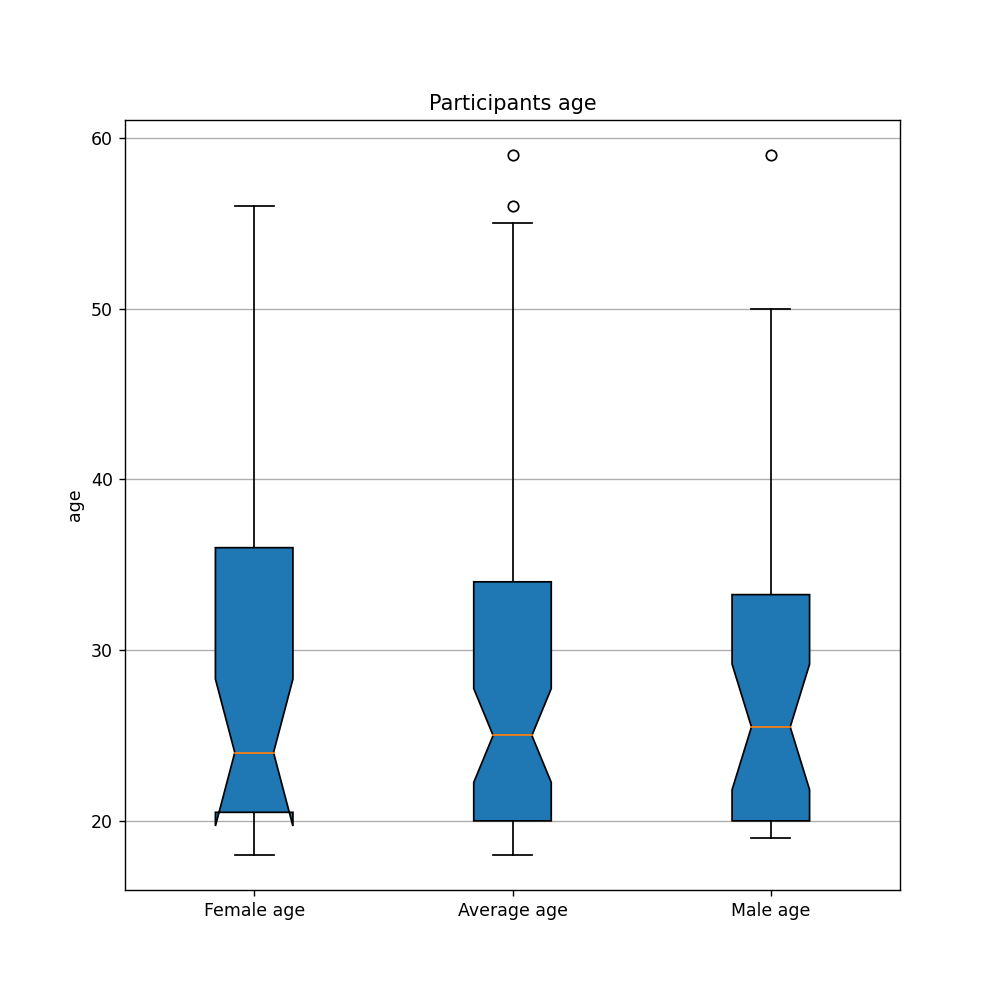


calculateMeanAge in 0.029754100018180907s
____________________________________________________________________________________________________
Shortest break : 15.06
Longest break : 82.5
________________________________________________________________________________
Mean break length : 37.819218750000005
SD break length : 13.889500452757416
________________________________________
Median break length : 36.905
Q1 and Q3 break : [27.52 44.6 ]


<IPython.core.display.Javascript object>


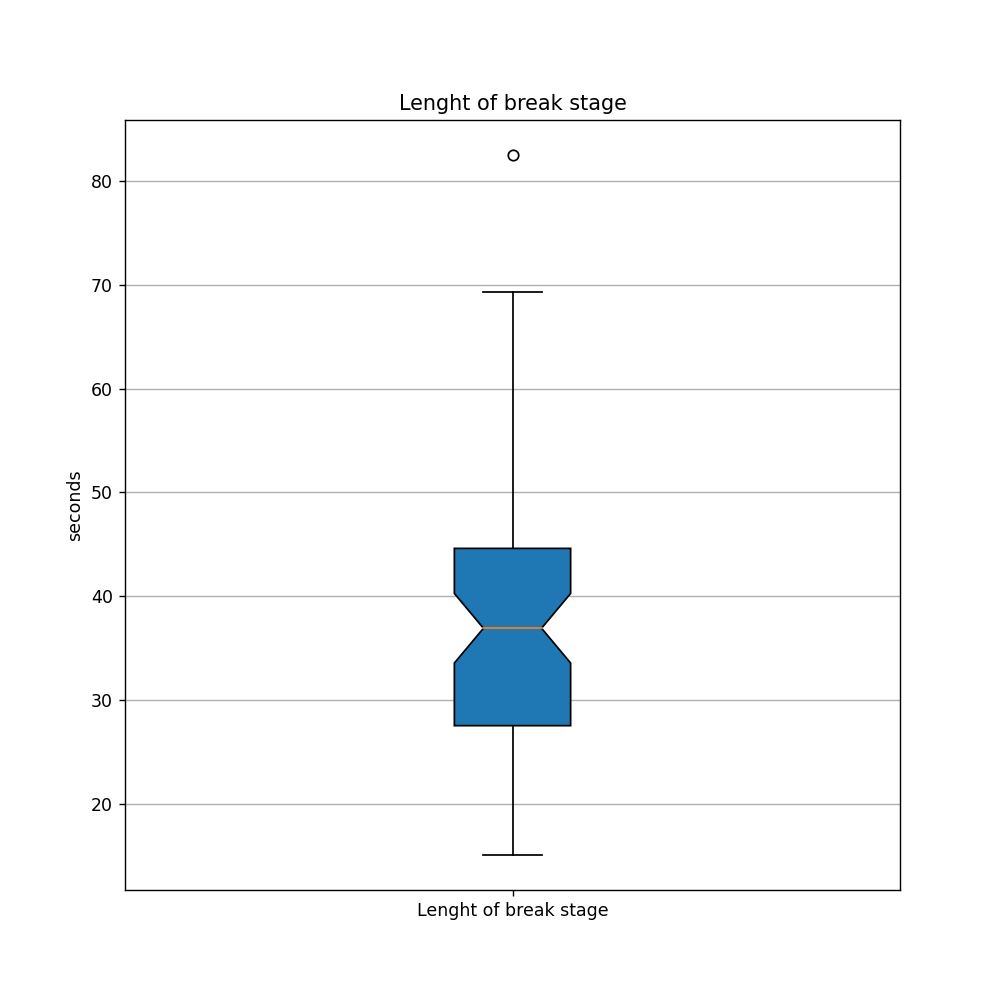

<IPython.core.display.Javascript object>


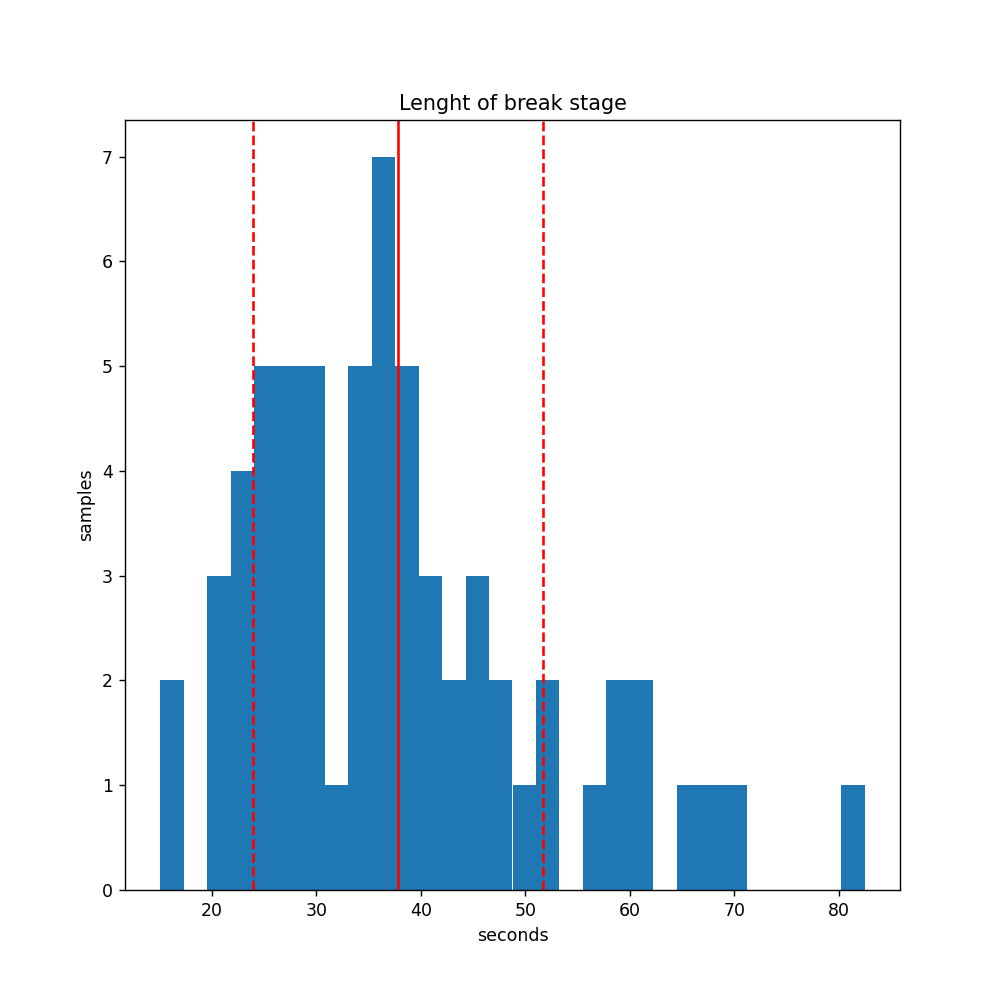


getIndexForPhase in 7.868109200033359s


<IPython.core.display.Javascript object>


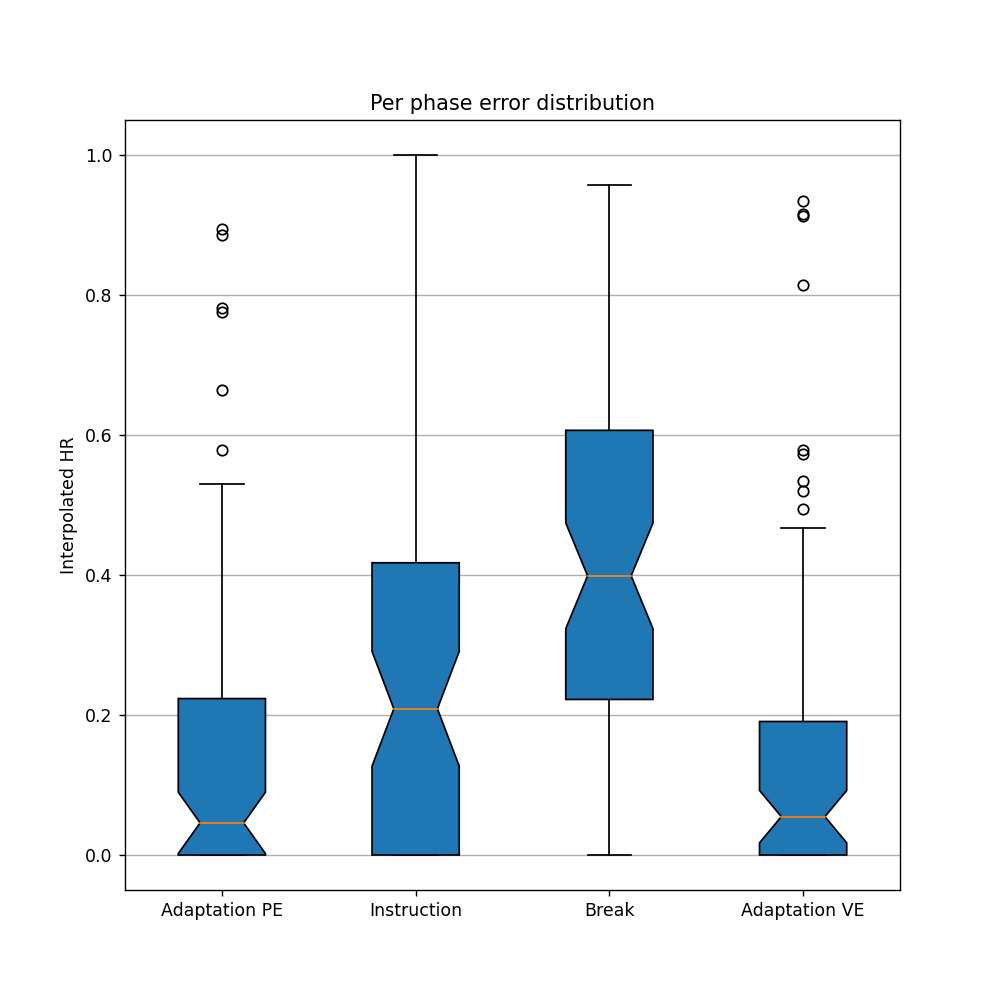

<IPython.core.display.Javascript object>


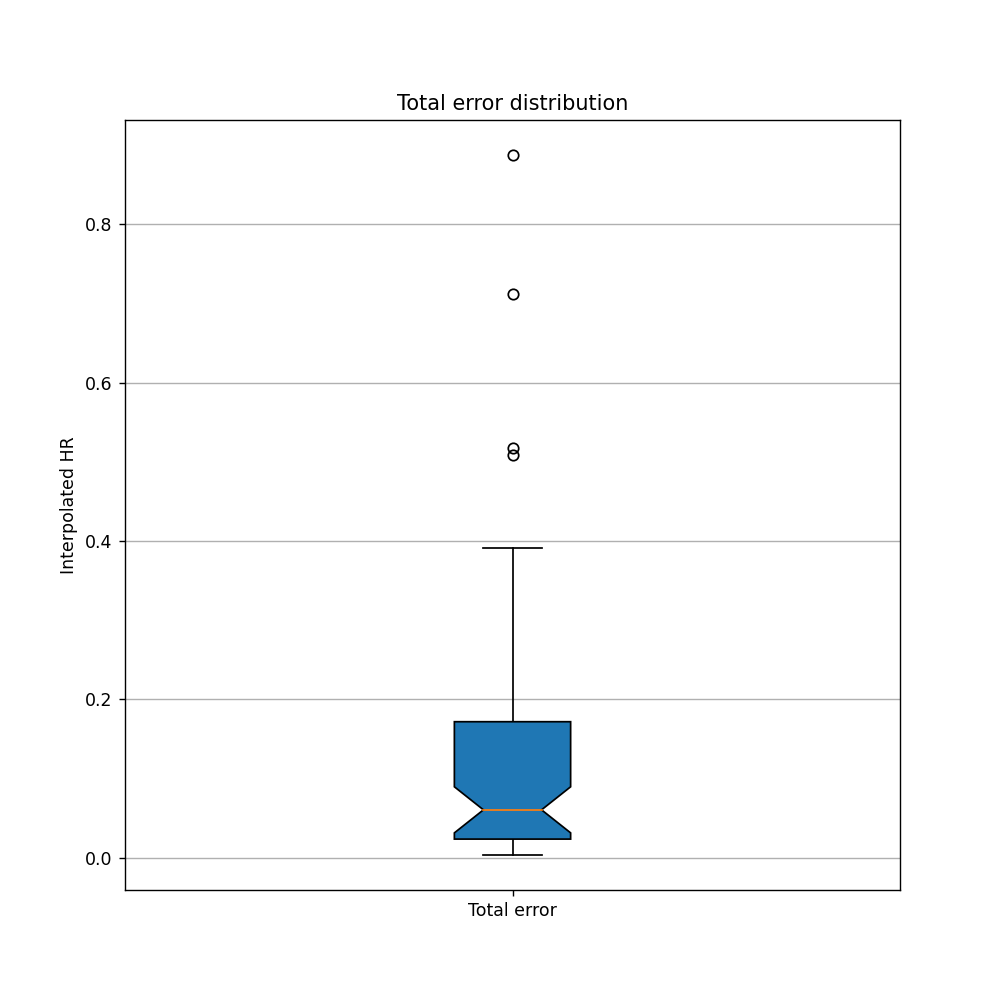


testingHRQualityPerSample in 0.7257573999813758s
____________________________________________________________________________________________________
meansHR : 



threshold : 0%                                   threshold : 9%  \
    adaptation PE instruction   break adaptation VE  adaptation PE   
0          85.236      83.382 101.932        92.675         85.236   
1         101.153     102.931 118.315       109.265        101.153   
2          76.114      79.260  94.969        78.355         76.114   
3          90.888      99.455 102.640        89.783         90.888   
4          73.799      87.859  86.673        74.219         73.799   
5          79.555      78.763  92.231        79.915         79.555   
6          90.530     124.432 119.617        91.481            NaN   
7          70.301      80.795 117.689        68.245         70.301   
8          79.088      81.571  87.270        74.460         79.088   
9          70.492      79.437  79.064        68.414         70.492   
10         59.377      60.844  83.050        59.550         59.377   
11         60.795      62.545  68.301        58.271         60.795   
12         59.112      61.374  70.564        58.074         59.112   
13         71.382      85.782  97.895        98.323         71.382   
14         66.578      75.552  81.535        64.677            NaN   
15         81.326      86.189  96.499        78.064         81.326   
16         85.046      93.154 156.897       157.215            NaN   
17         61.917      59.502  74.137        64.656         61.917   
18        108.361     115.214 133.078       104.255        108.361   
19         66.279      63.632  81.327        66.092         66.279   
20         70.996      75.160  82.369        73.624         70.996   
21         63.246      70.250  75.047        64.154         63.246   
22         75.215      74.492  82.492        73.516         75.215   
23         91.640     104.832 112.660        92.141         91.640   
24         73.494      74.361  87.418        75.076         73.494   
25         68.106      78.410 140.570        91.677         68.106   
26         91.405      93.378 128.038        88.546         91.405   
27         90.982      90.850 102.663        92.380         90.982   
28        103.072      86.465  94.188        88.042        103.072   
29         75.621      70.590  97.271        77.279         75.621   
30         87.902      99.117 107.438        93.139         87.902   
31         63.758      78.770  94.701        55.395         63.758   
32         84.639      86.959  92.363        86.833         84.639   
33         63.586      65.042  78.221        63.294         63.586   
34         84.891      84.008  86.258        82.967         84.891   
35         79.653      84.339 103.334       176.380            NaN   
36         92.462      93.509 112.415        96.702         92.462   
37         71.710      70.785  83.848        74.510         71.710   
38         79.336      86.487  98.962        79.810         79.336   
39         76.486      78.736 110.618        94.243         76.486   
40         57.317      57.628  64.330        57.190         57.317   
41         76.426      80.515 124.975        91.202         76.426   
42         78.259      80.652  88.259        74.167         78.259   
43        111.003     112.192 174.618       164.242            NaN   
44         57.534      63.060  67.108        57.773         57.534   
45         80.055     106.873  78.157        69.742            NaN   
46         69.141      74.775  78.541        72.868         69.141   
47         62.515      62.301 115.804        59.010         62.515   
48         66.346      71.146 127.744        67.197            NaN   
49         78.854      87.195 112.294        75.585         78.854   
50         70.607      70.246  78.726        69.529         70.607   
51         62.050      65.298  72.020        60.224         62.050   
52         82.003      82.152  85.867        74.750         82.003   
53         69.640      75.352  80.205        71.341         69.640   
54         81.271      78.429  84.813        73.274         81.271   
55         72

____________________________________________________________________________________________________

meansSC : 



Skin Conductance                                 Phasic Component  \
      adaptation PE instruction break adaptation VE    adaptation PE   
0             1.558       1.302 1.332         1.425            0.081   
1             1.989       2.130 2.049         2.022            0.112   
2             1.133       1.169 1.394         1.173            0.076   
3             3.131       3.473 4.491         4.543            0.134   
4             1.960       2.055 3.132         2.220            0.020   
5             1.346       1.397 1.839         1.739            0.108   
6             2.904       2.647 2.653         2.580            0.081   
7             0.356       0.313 0.467         0.431            0.014   
8             2.158       1.979 1.953         1.955            0.044   
9             1.988       2.266 2.770         2.443            0.034   
10            1.394       1.259 1.362         1.642            0.043   
11            0.904       0.895 0.993         0.998            0.026   
12            1.612       1.571 1.818         1.983            0.074   
13            2.199       2.298 2.330         2.780            0.148   
14            4.287       3.873 3.976         3.613            0.293   
15            4.503       4.803 5.273         4.993            0.379   
16            1.154       0.989 1.489         1.502            0.050   
17            1.364       0.956 0.840         0.890            0.031   
18            2.667       2.968 4.469         2.808            0.053   
19            1.065       1.009 1.343         1.409            0.202   
20            0.777       0.682 1.043         1.172            0.333   
21            4.003       4.676 4.189         4.410            0.495   
22            1.536       1.142 1.329         1.199            0.003   
23            1.888       1.812 2.775         2.048            0.080   
24            4.375       4.164 6.932         4.268            0.068   
25            1.356       1.306 1.784         1.752            0.083   
26            3.230       3.727 4.812         3.437            0.045   
27            1.974       2.109 2.253         2.367            0.249   
28            5.267       5.451 6.971         6.766            0.216   
29            1.582       1.662 1.779         1.851            0.317   
30            1.090       1.205 1.248         1.289            1.208   
31            1.527       1.553 1.415         1.460            0.708   
32            2.678       3.021 2.999         3.022            0.146   
33            0.799       0.746 0.980         1.006            0.046   
34            6.765       7.206 8.117         7.478            0.304   
35            5.894       6.239 6.807         6.822            0.430   
36            1.324       1.356 1.577         1.718            0.127   
37            0.434       0.414 0.380         0.375            0.374   
38            3.549       4.685 4.904         4.283            0.181   
39            1.516       1.527 1.626         1.645            1.692   
40            1.943       1.887 2.665         2.602            0.035   
41            1.798       1.870 1.713         2.221            0.099   
42            2.149       2.071 2.267         1.897            0.133   
43            1.626       1.350 2.432         2.430            0.022   
44            2.264       2.637 3.454         2.673            0.115   
45            1.566       1.588 1.591         1.657            3.382   
46            4.024       3.952 4.166         3.905            0.278   
47            1.679       1.577 1.826         1.773            0.344   
48            2.647       3.089 3.957         3.033            0.005   
49            2.877       3.068 3.475         3.406            0.070   
50            1.179       1.108 1.118         1.147            0.313   
51            3.015       3.490 3.910         3.011            0.225   
52            1.453       1.440 1.480         1.521            0.040   
53            0.934       0.964 1.113      


calculateMeansPerPhase in 0.6135291999671608s



_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for adaptation PE - instruction : -0.04158676492803516
standard deviation for differences in Skin Conductance for adaptation PE - instruction : 0.2762758884200016
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9399993419647217, pvalue=0.00379479443654418)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.8554775596213147, pvalue=0.0042972159502872274)
__________________________________________________
Skew : -1.0244087325216287
__________________________________________________


<IPython.core.display.Javascript object>


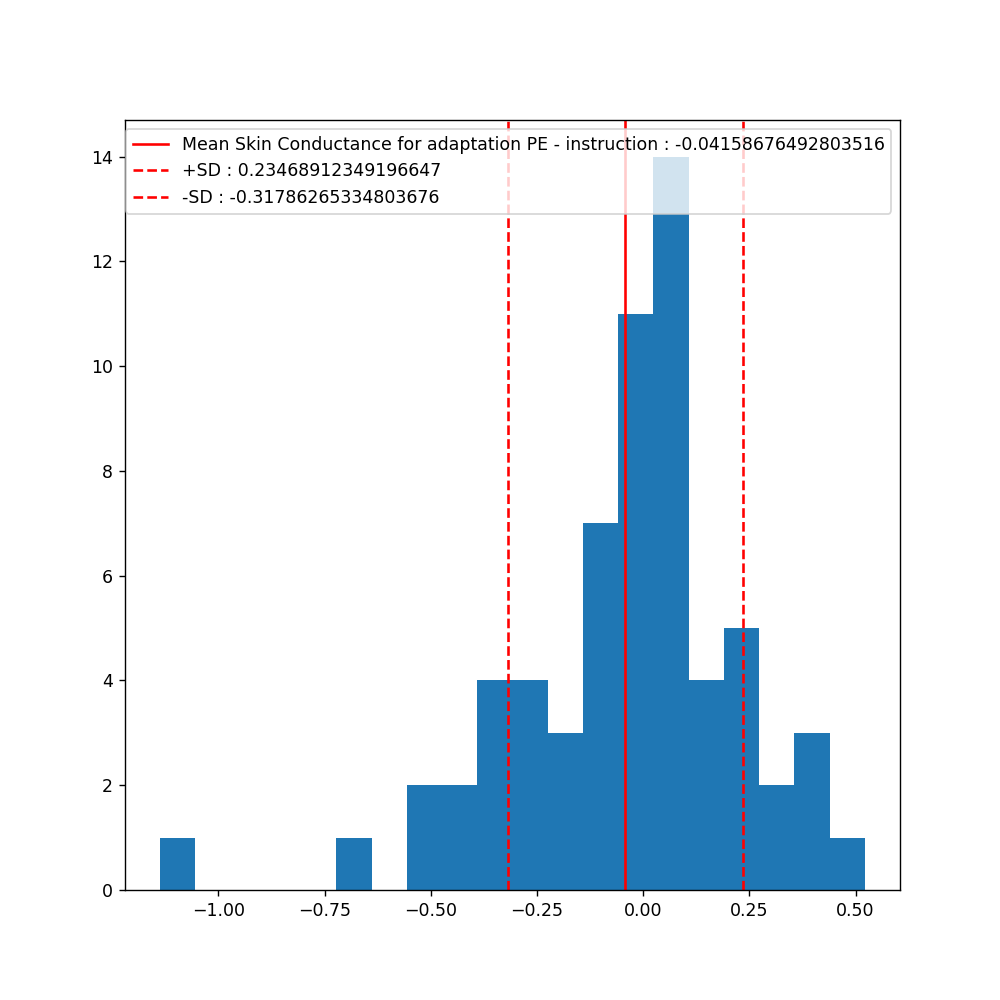

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-1.1947648250507066, pvalue=0.23665753802076023)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=943.0, pvalue=0.5165400906836031)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Skin Conductance :
pearson r = 0.22495728455619718 (p = 0.07390967004398297)
regressive line first order :  y = 0.004474622673342874 * x + -0.21081349863489893


<IPython.core.display.Javascript object>


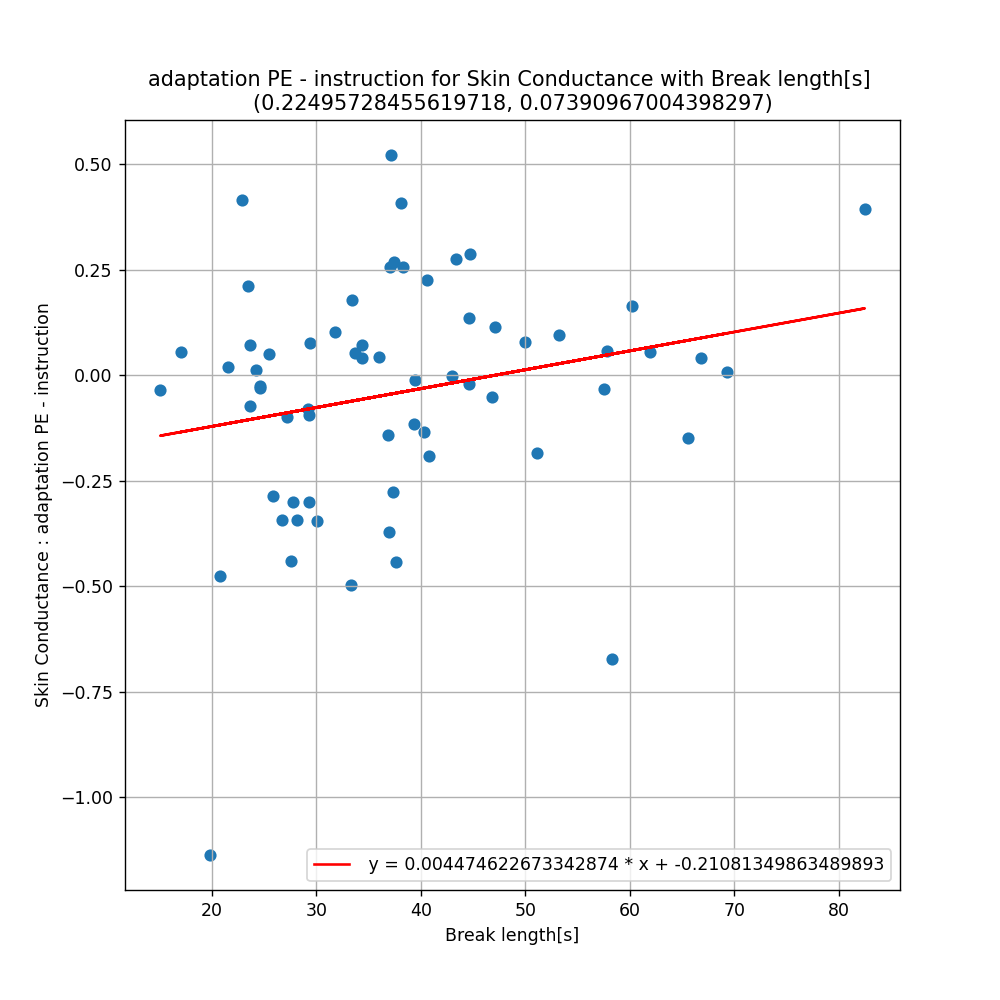

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Skin Conductance :
pearson r = -0.049799036167205685 (p = 0.6959577028131353)
regressive line first order :  y = -0.001312831738836924 * x + -0.0038838784283122324


<IPython.core.display.Javascript object>


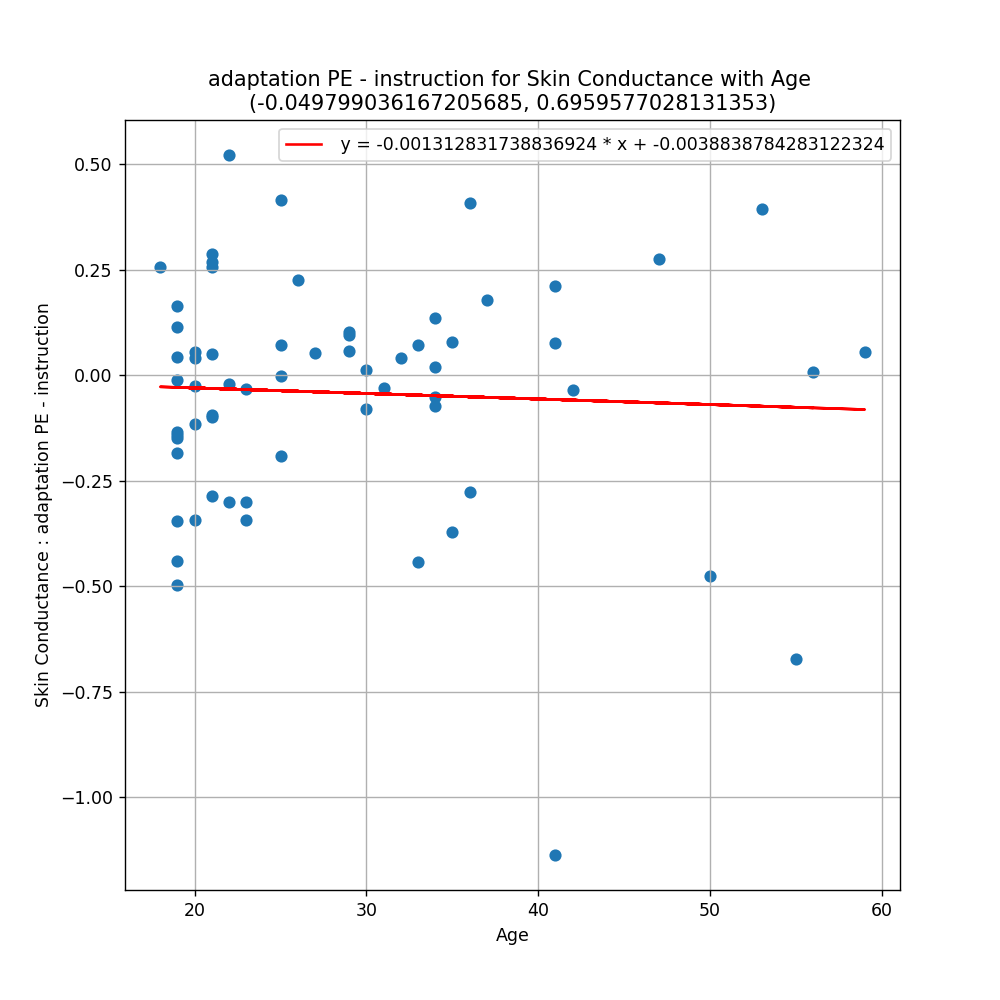

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Skin Conductance :
pearson r = 0.1166206671269302 (p = 0.3587686259476603)
regressive line first order :  y = 0.0013833121705076681 * x + -0.06933946534884519


<IPython.core.display.Javascript object>


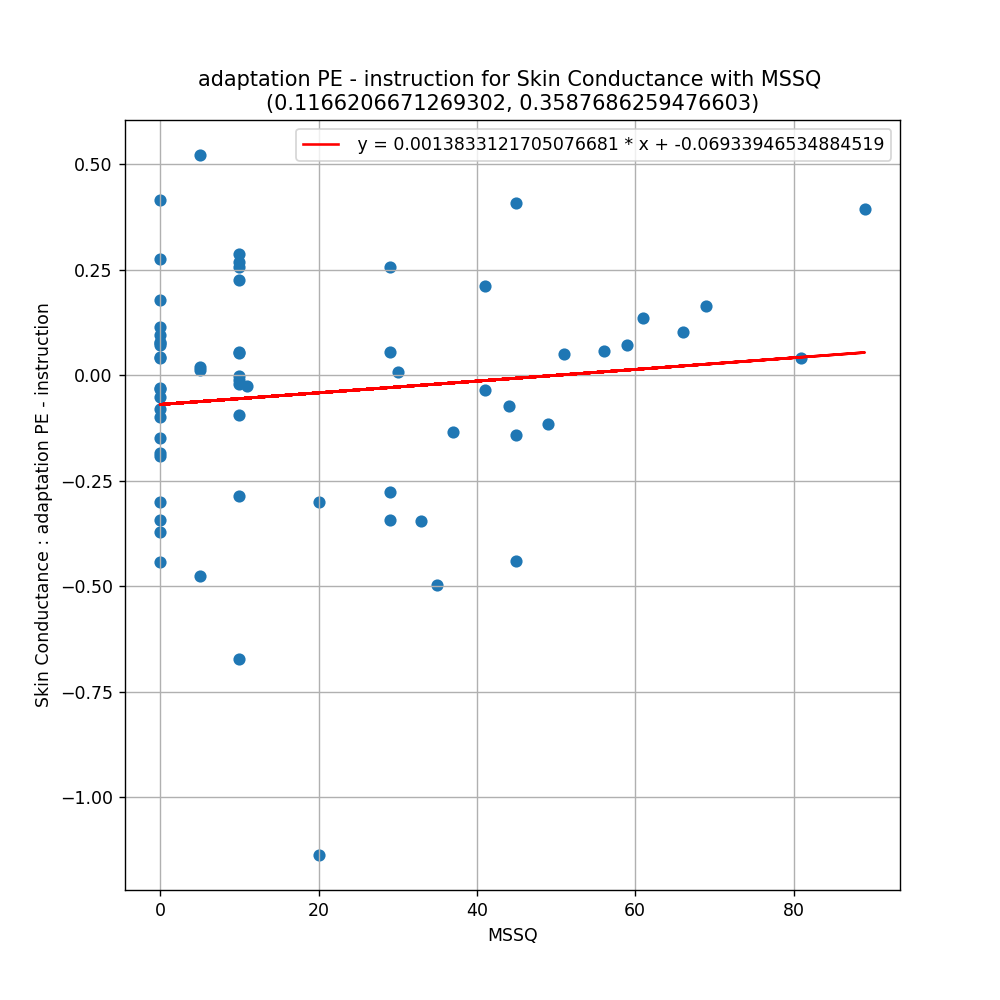




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for adaptation PE - instruction : -1.0591250391742832
standard deviation for differences in Phasic Component for adaptation PE - instruction : 2.5674681440788514
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.3989065885543823, pvalue=9.638019447474628e-15)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.78967274344623, pvalue=7.052369382028885e-09)
__________________________________________________
Skew : -4.409717522049862
__________________________________________________


<IPython.core.display.Javascript object>


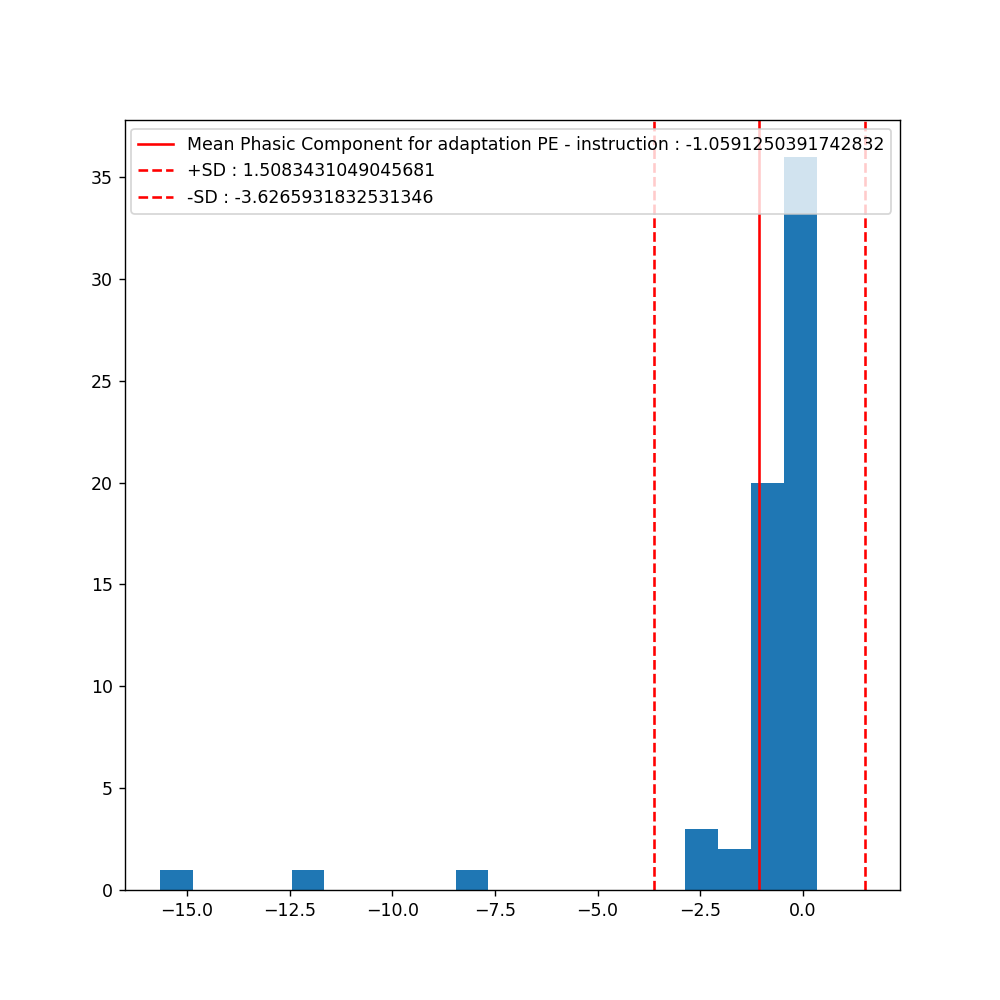

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-3.2742546007113793, pvalue=0.0017232559817109956)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=78.0, pvalue=1.2479751925932432e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Phasic Component :
pearson r = 0.20424592923737012 (p = 0.10547323696516059)
regressive line first order :  y = 0.03775477157428116 * x + -2.4869810041983027


<IPython.core.display.Javascript object>


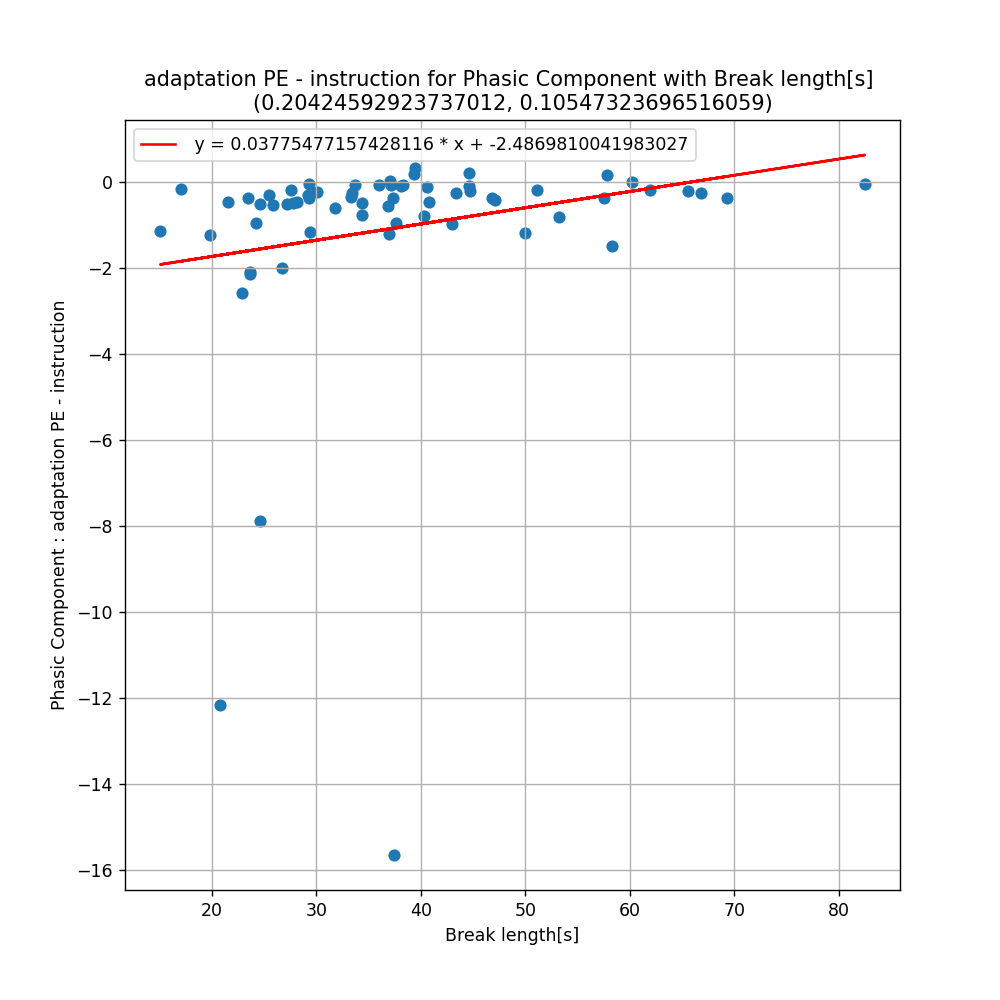

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Phasic Component :
pearson r = -0.07909605369914664 (p = 0.5344209316120916)
regressive line first order :  y = -0.019377824841028707 * x + -0.5026181320209892


<IPython.core.display.Javascript object>


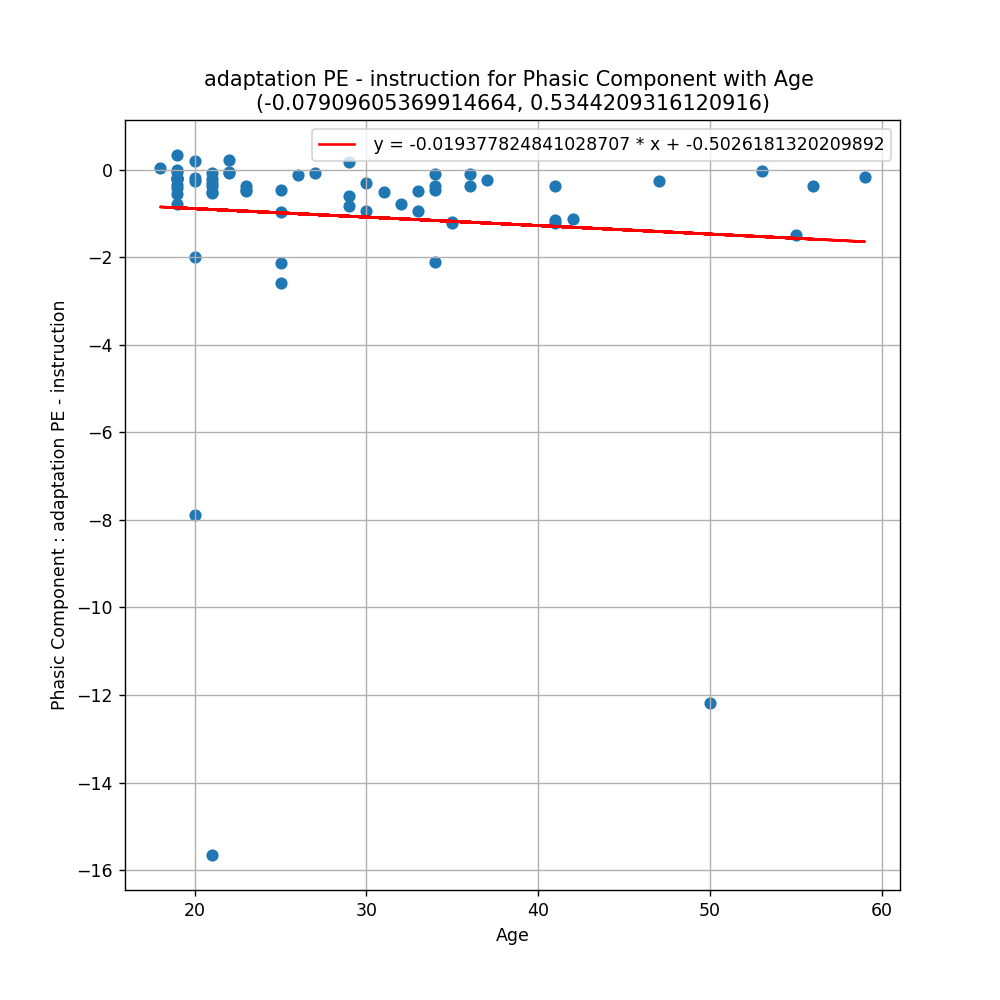

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Phasic Component :
pearson r = 0.11124599184799833 (p = 0.3814932897058098)
regressive line first order :  y = 0.012262841884288821 * x + -1.3051483044778267


<IPython.core.display.Javascript object>


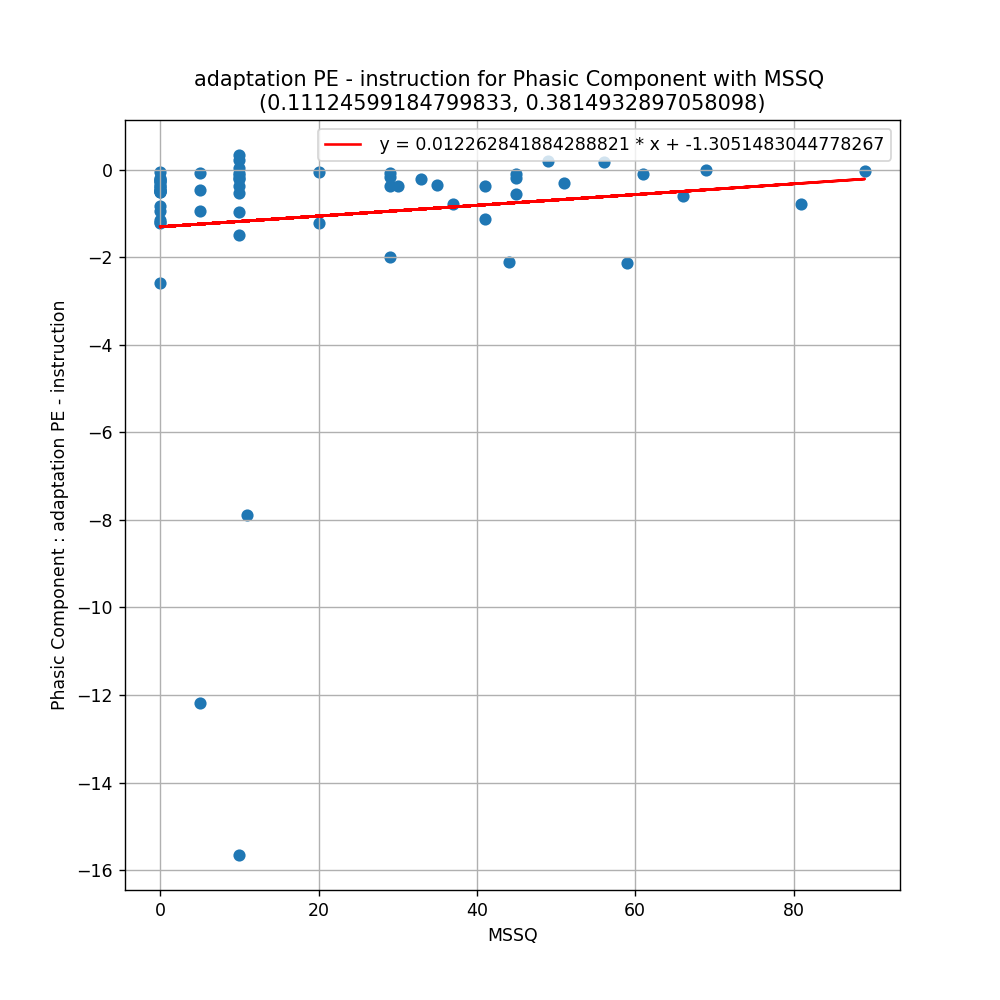




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for adaptation PE - instruction : 1.047740686699888
standard deviation for differences in Tonic Component for adaptation PE - instruction : 2.6030403832127345
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.477039635181427, pvalue=9.61008480909395e-14)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.827463014688632, pvalue=5.627631665127431e-09)
__________________________________________________
Skew : 4.311035898718172
__________________________________________________


<IPython.core.display.Javascript object>


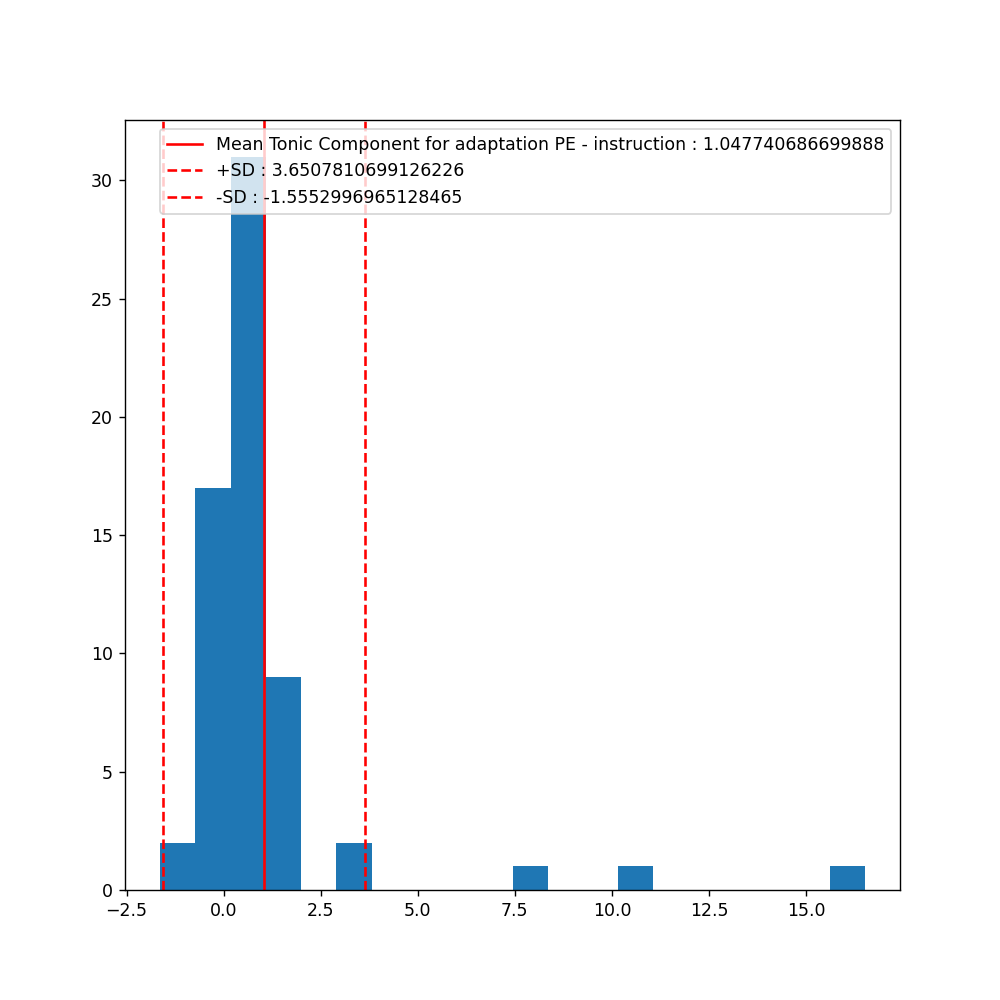

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=3.194796338968739, pvalue=0.0021867580101948892)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=267.0, pvalue=2.347950751147718e-07)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Tonic Component :
pearson r = -0.14817049470077284 (p = 0.24261946914781266)
regressive line first order :  y = -0.027768729524764904 * x + 2.097932343006554


<IPython.core.display.Javascript object>


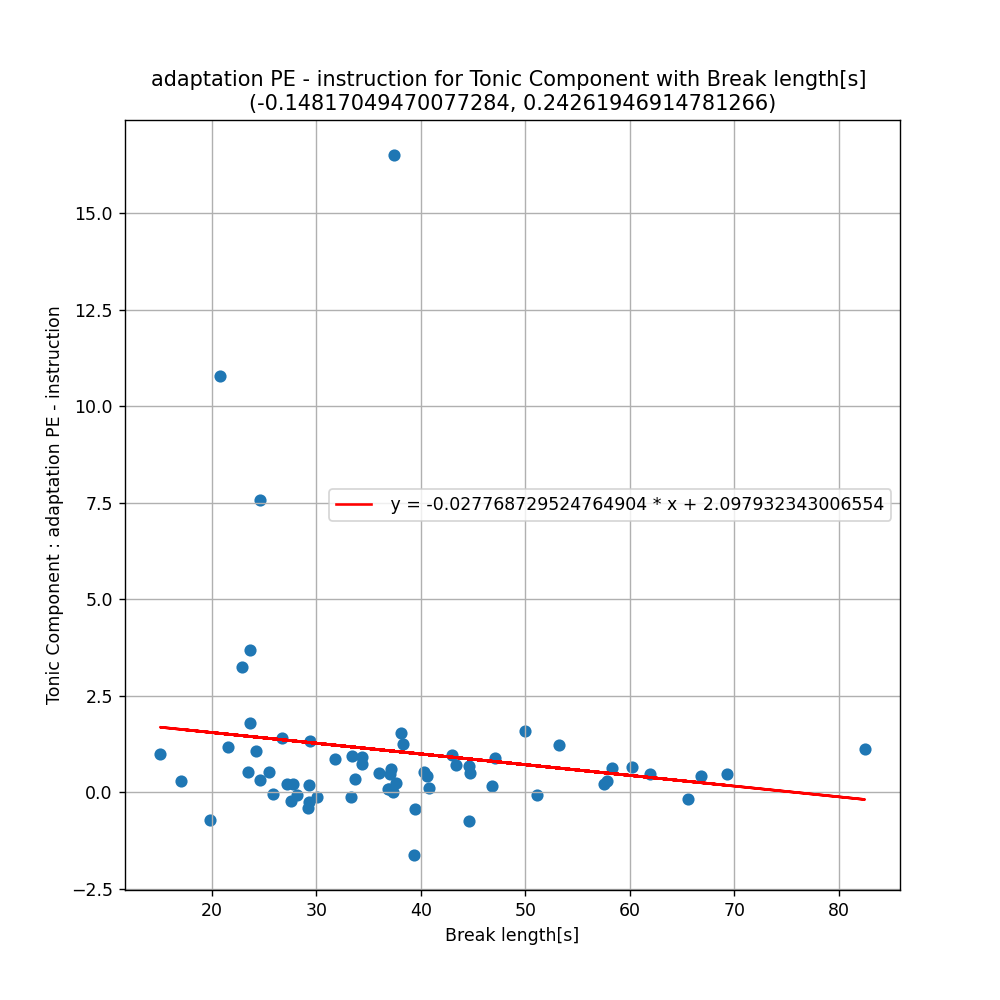

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Tonic Component :
pearson r = 0.07086432527355602 (p = 0.5779090828136)
regressive line first order :  y = 0.017601663264702406 * x + 0.5422429198167152


<IPython.core.display.Javascript object>


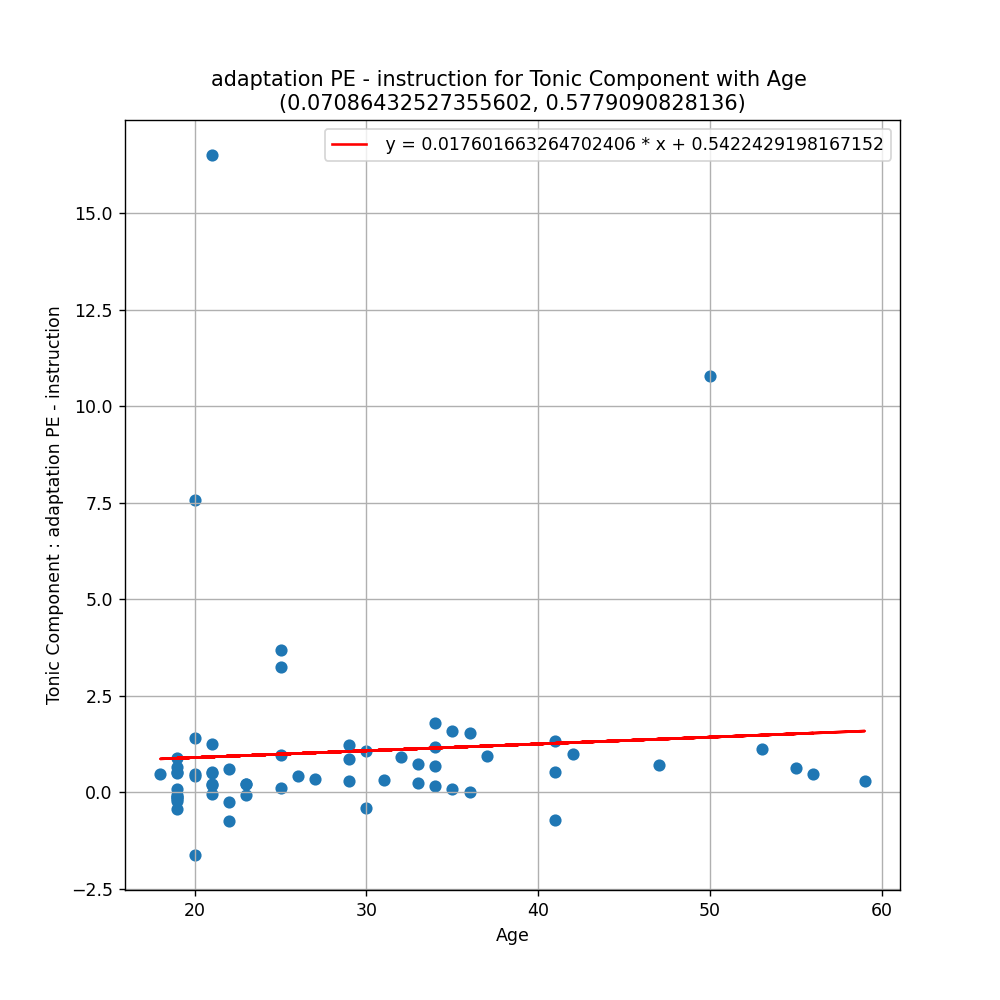

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Tonic Component :
pearson r = -0.055420143551086376 (p = 0.6635933434764806)
regressive line first order :  y = -0.006193701119781962 * x + 1.172001815415513


<IPython.core.display.Javascript object>


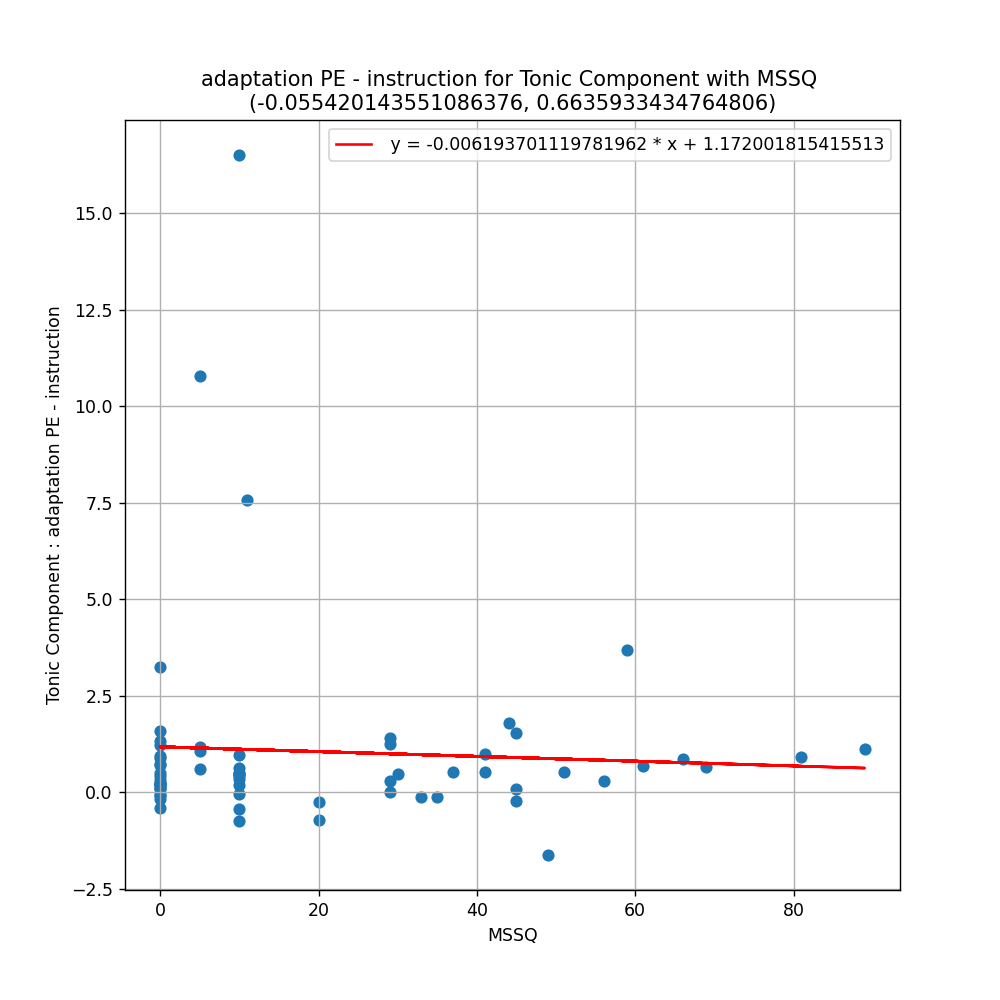




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for adaptation PE - instruction : -3.6732210499662887
standard deviation for differences in HR[1] for adaptation PE - instruction : 8.921645545953382
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.792171835899353, pvalue=4.215728566236976e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.811382424427113, pvalue=1.4988990161357825e-06)
__________________________________________________
Skew : 1.0679396011288729
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-3.2679272087377584, pvalue=0.0017564743365040298)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=329.0, pvalue=1.986273900017716e-06)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.2690497273620118 (p = 0.03157198592072313)
regressive line first order :  y = 0.17281876406740967 * x + -10.209091692336289


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.05967598751941125 (p = 0.6394868343185006)
regressive line first order :  y = 0.050803042889186724 * x + -5.132220937940118


<IPython.core.display.Javascript object>


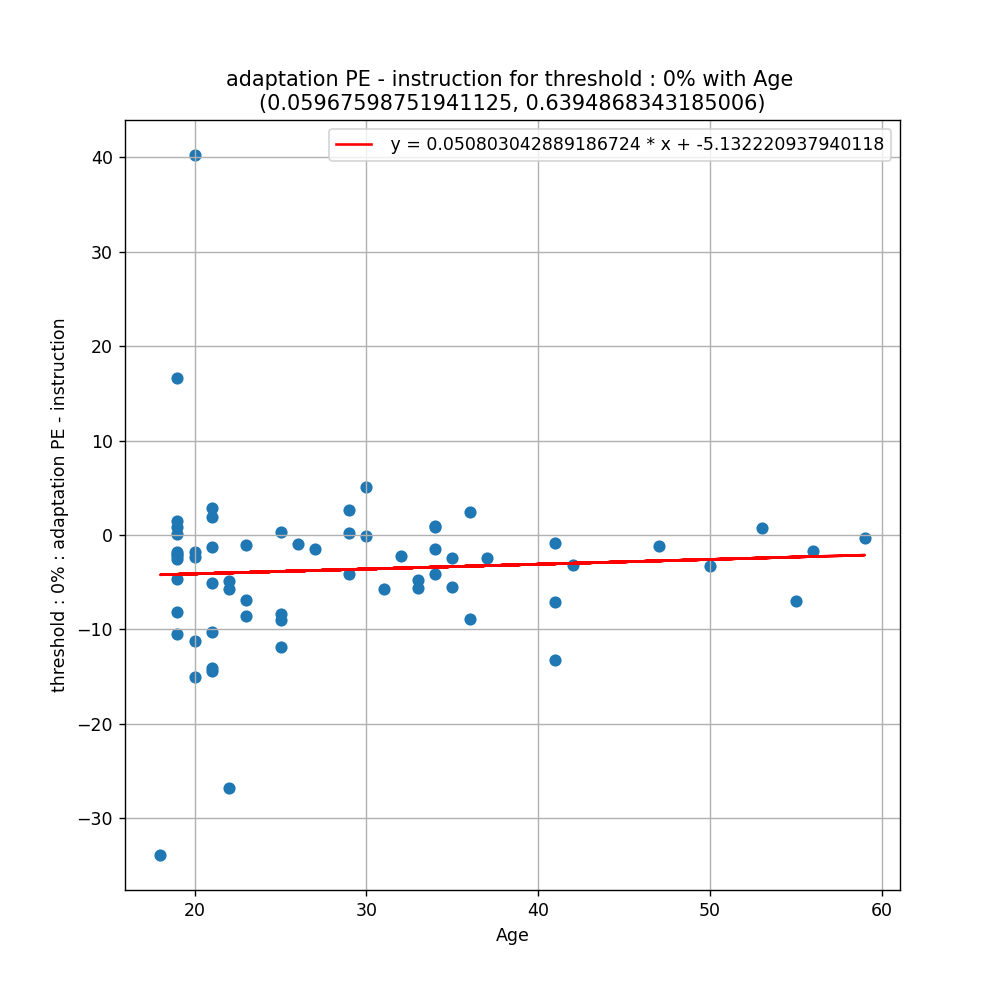

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.056027226319201776 (p = 0.6601330477386912)
regressive line first order :  y = 0.02146079371309181 * x + -4.103778223835191


<ipython-input-302-8d36e867c83d>:249: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig8, ax8 = plt.subplots(figsize=(8, 8))


<IPython.core.display.Javascript object>


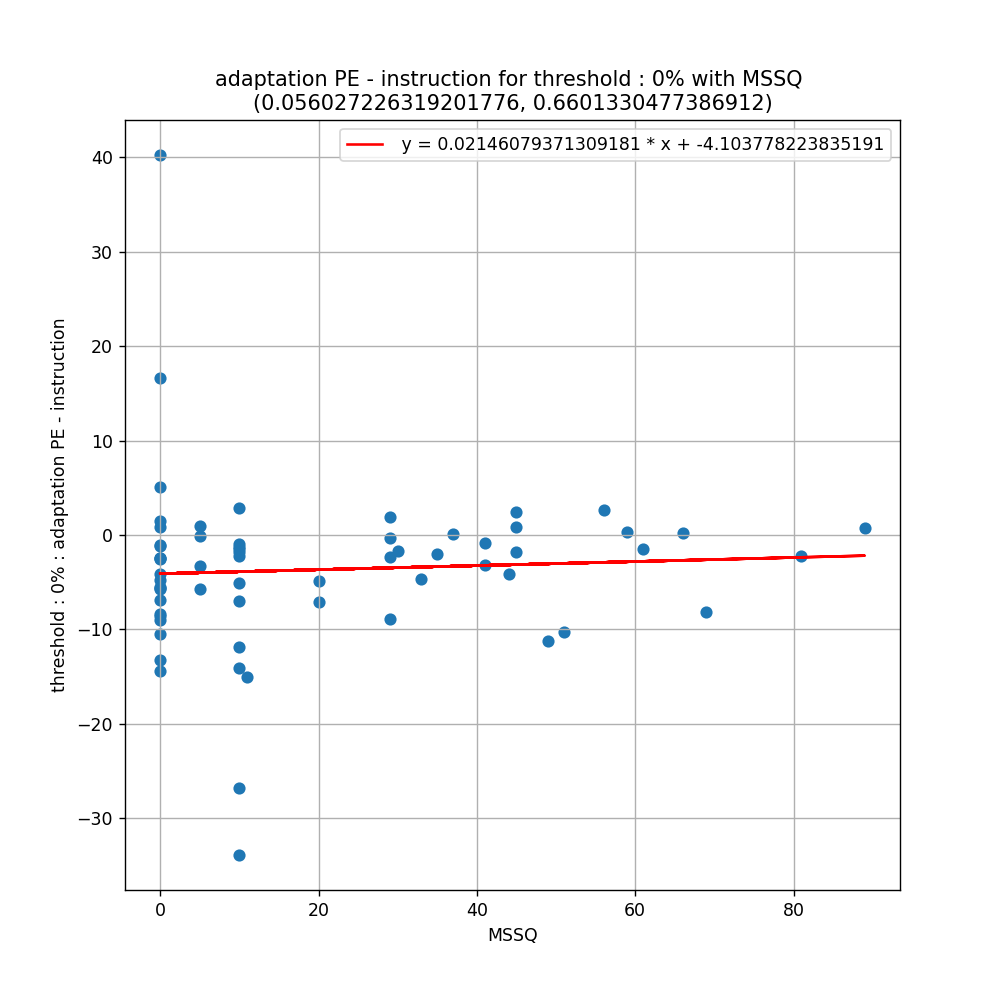




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 9%] for adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 9%] for adaptation PE - instruction : -3.336788808609637
standard deviation for differences in HR[0.9] for adaptation PE - instruction : 5.4327989383880615
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9357489347457886, pvalue=0.005134544335305691)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.453882585511608, pvalue=0.014132311729913537)
__________________________________________________
Skew : 0.26374170634815264
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 9% for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-4.554979559304449, pvalue=2.950917612307009e-05)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=252.0, pvalue=8.437623175505592e-06)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.24009338984425913 (p = 0.07469346107750645)
regressive line first order :  y = 0.09474414051389106 * x + -6.852151712201922


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.043113575945613956 (p = 0.7523802090776602)
regressive line first order :  y = 0.022216089701716724 * x + -3.9854192847222576


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.17337839953985537 (p = 0.2012898616955424)
regressive line first order :  y = 0.04048170356129745 * x + -4.17678415750656


<IPython.core.display.Javascript object>


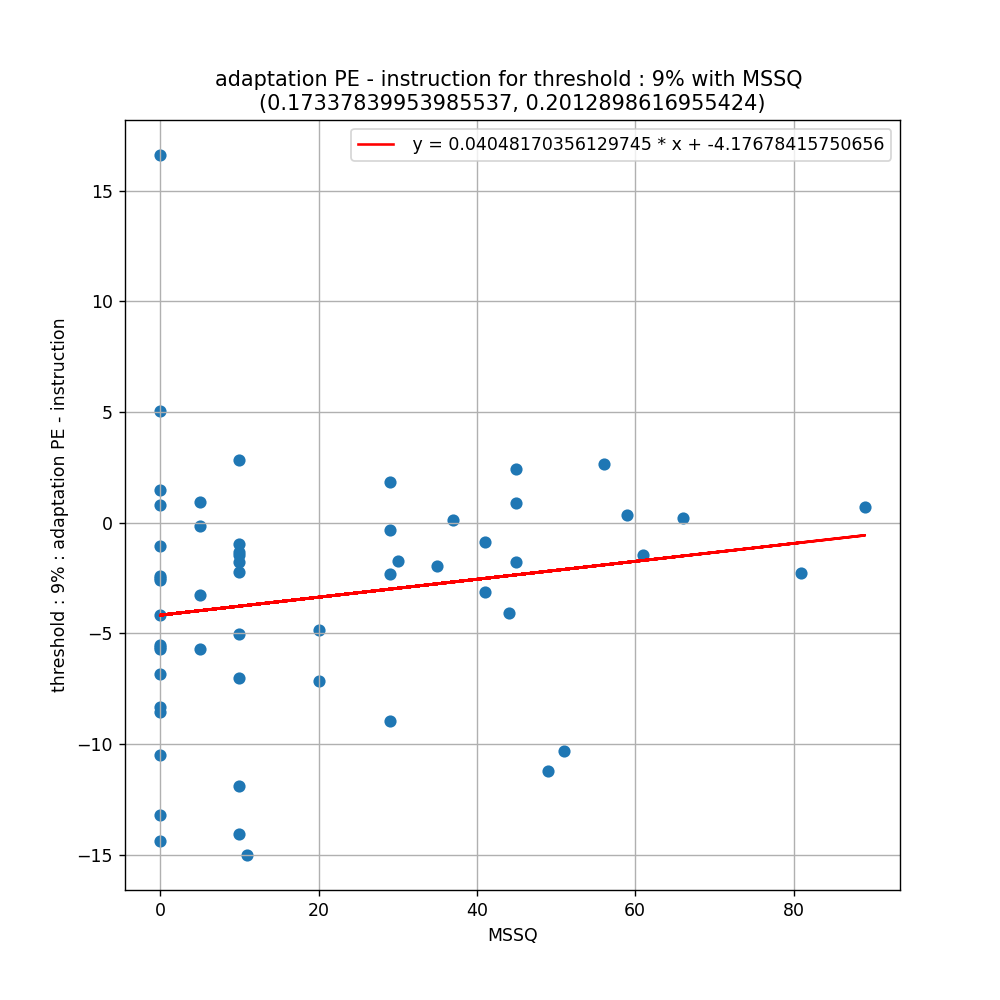




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 50%] for adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 50%] for adaptation PE - instruction : -3.1621240539980255
standard deviation for differences in HR[0.5] for adaptation PE - instruction : 4.573568469061766
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9403843879699707, pvalue=0.057486630976200104)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=0.8825252382756238, pvalue=0.37749283772417097)
__________________________________________________
Skew : -0.8355236138588078
__________________________________________________


<IPython.core.display.Javascript object>


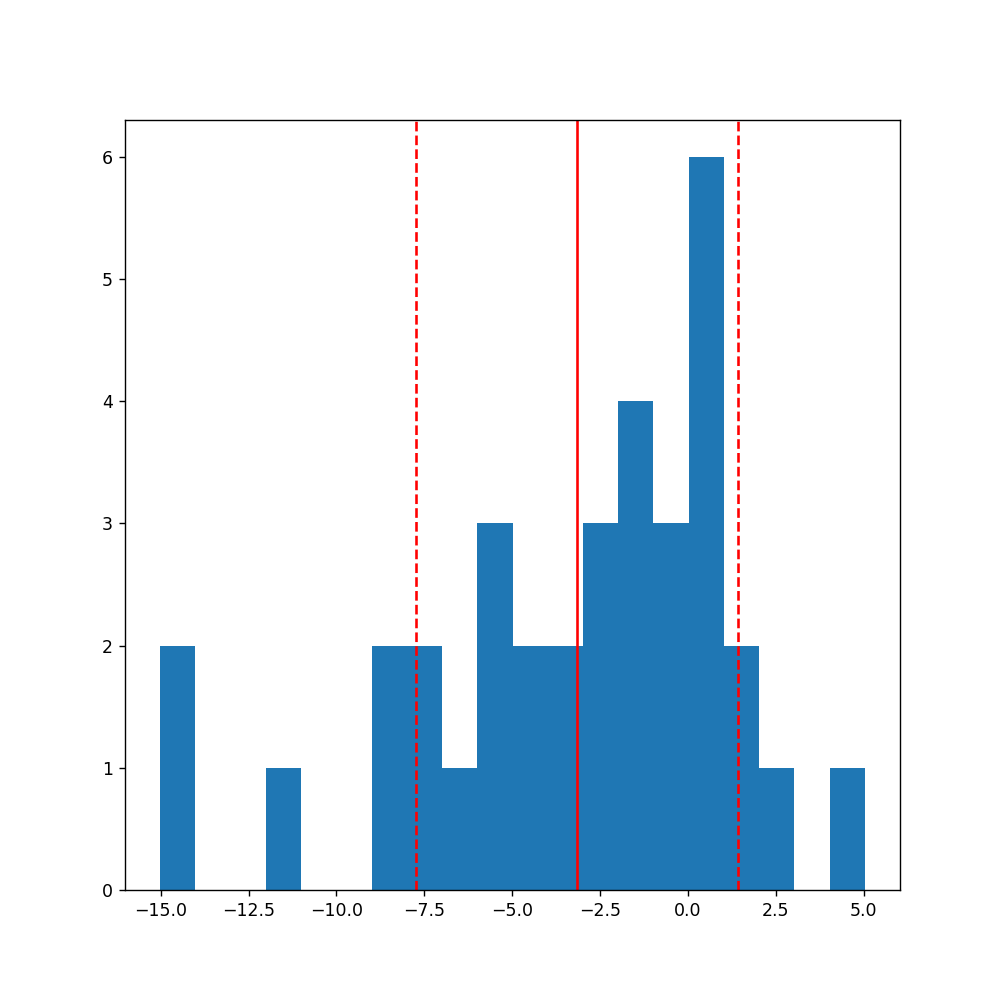

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 50% for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-4.031467631702068, pvalue=0.0002958639235468706)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=103.0, pvalue=0.0005158688241665825)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.1968306617501258 (p = 0.2570859502156249)
regressive line first order :  y = 0.05538088975217651 * x + -5.289921130722076


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.10345082162443539 (p = 0.5542614174839909)
regressive line first order :  y = 0.040944670616358245 * x + -4.4641645795982186


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.27290741372595395 (p = 0.11269771529413267)
regressive line first order :  y = 0.053301874690654505 * x + -4.215978262167536


<IPython.core.display.Javascript object>


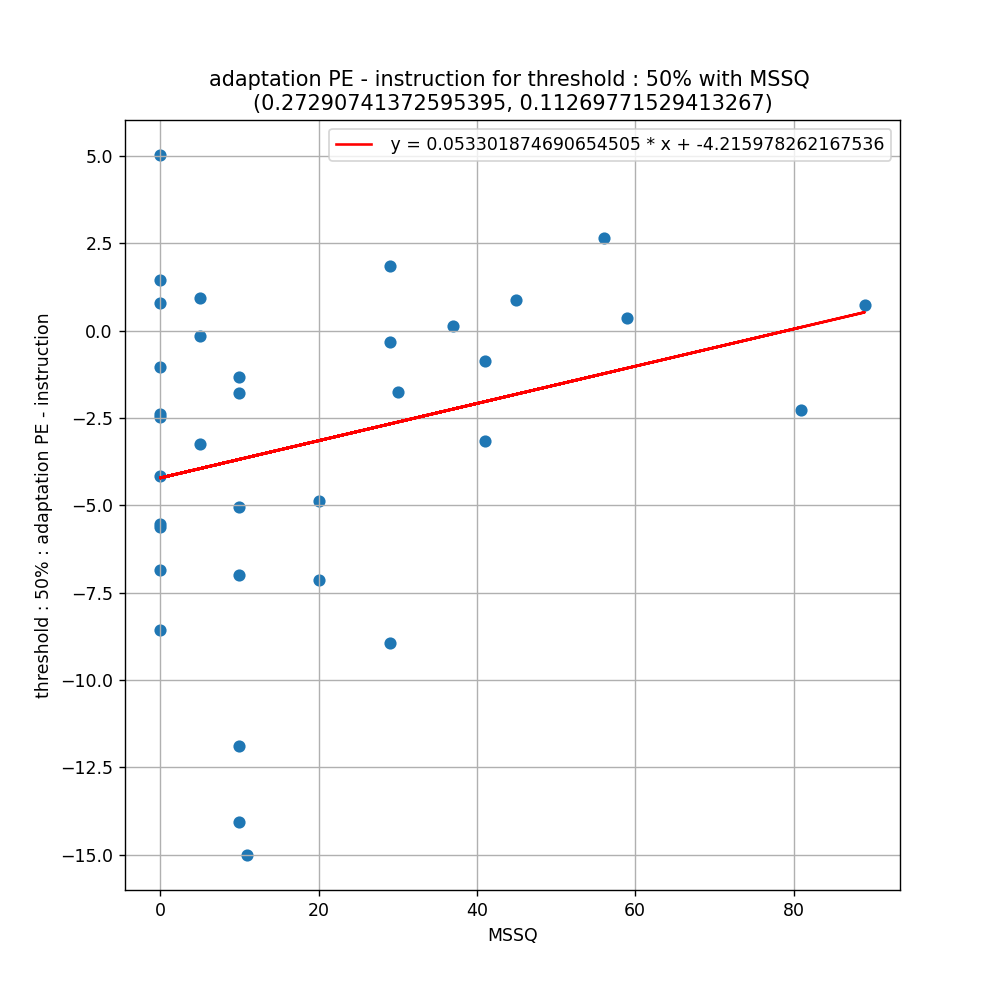




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 90%] for adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 90%] for adaptation PE - instruction : -2.5514685245712427
standard deviation for differences in HR[0.1] for adaptation PE - instruction : 3.759161597984916
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9176590442657471, pvalue=0.5149521231651306)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=-0.5189623974263257, pvalue=0.6037869635562181)
__________________________________________________
Skew : -0.49634963650788416
__________________________________________________


C:\Users\Krzyniu\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=5
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<IPython.core.display.Javascript object>


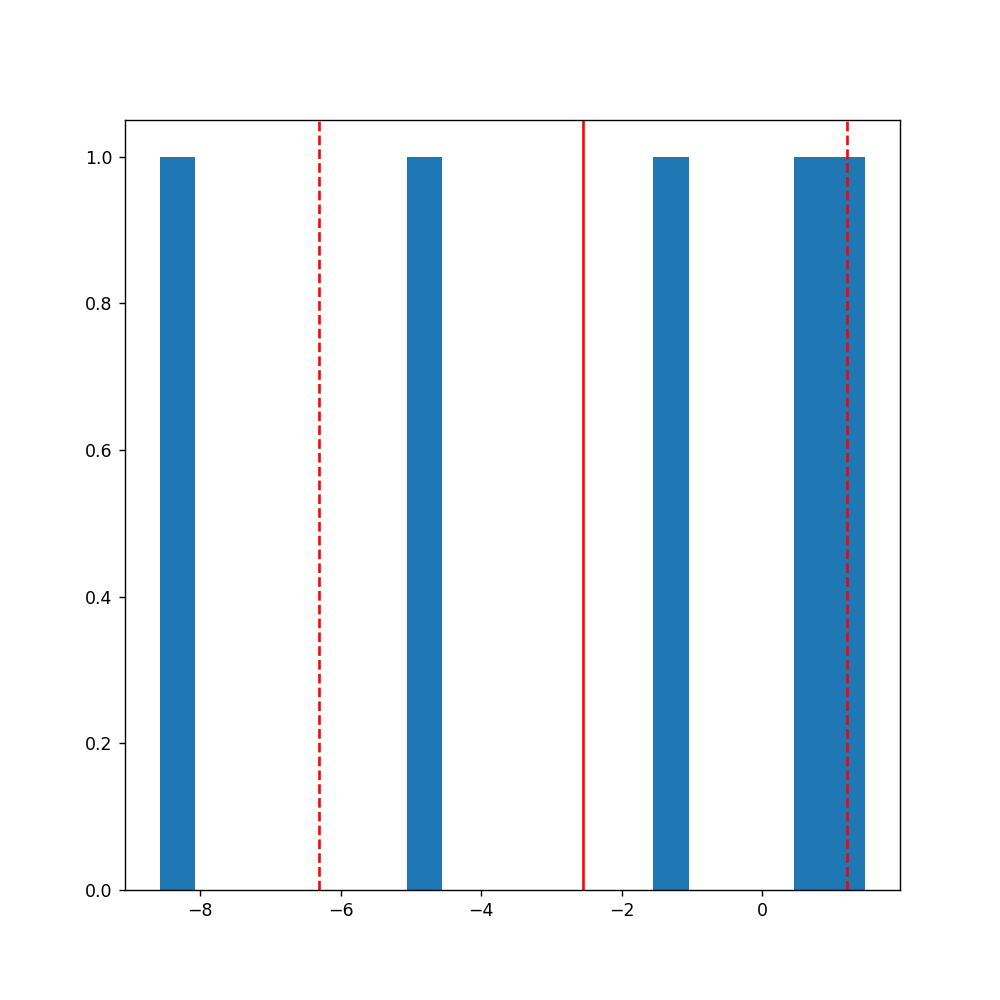

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 90% for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-1.3574667957551745, pvalue=0.24616979854242724)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=4.0, pvalue=0.4375)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.8036867914396143 (p = 0.10128312462091907)
regressive line first order :  y = 0.153104265213092 * x + -10.463284533722984


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.3504616275117042 (p = 0.5630889466320482)
regressive line first order :  y = 0.10242623478029385 * x + -5.3579473575512955


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.43750588002602125 (p = 0.46126992418116863)
regressive line first order :  y = 0.04852018354126351 * x + -3.6092085257707875


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for adaptation PE - break : -0.4457325098173891
standard deviation for differences in Skin Conductance for adaptation PE - break : 0.5988067805546274
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8821191787719727, pvalue=1.8070706573780626e-05)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.003276154121549, pvalue=0.0451476555340976)
__________________________________________________
Skew : -1.2466230898160848
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-5.908236565764221, pvalue=1.519548448533127e-07)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=226.0, pvalue=5.220594547594895e-08)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Skin Conductance :
pearson r = 0.19775457367563284 (p = 0.11726235058991033)
regressive line first order :  y = 0.008525632725628356 * x + -0.7681652788500858


<IPython.core.display.Javascript object>


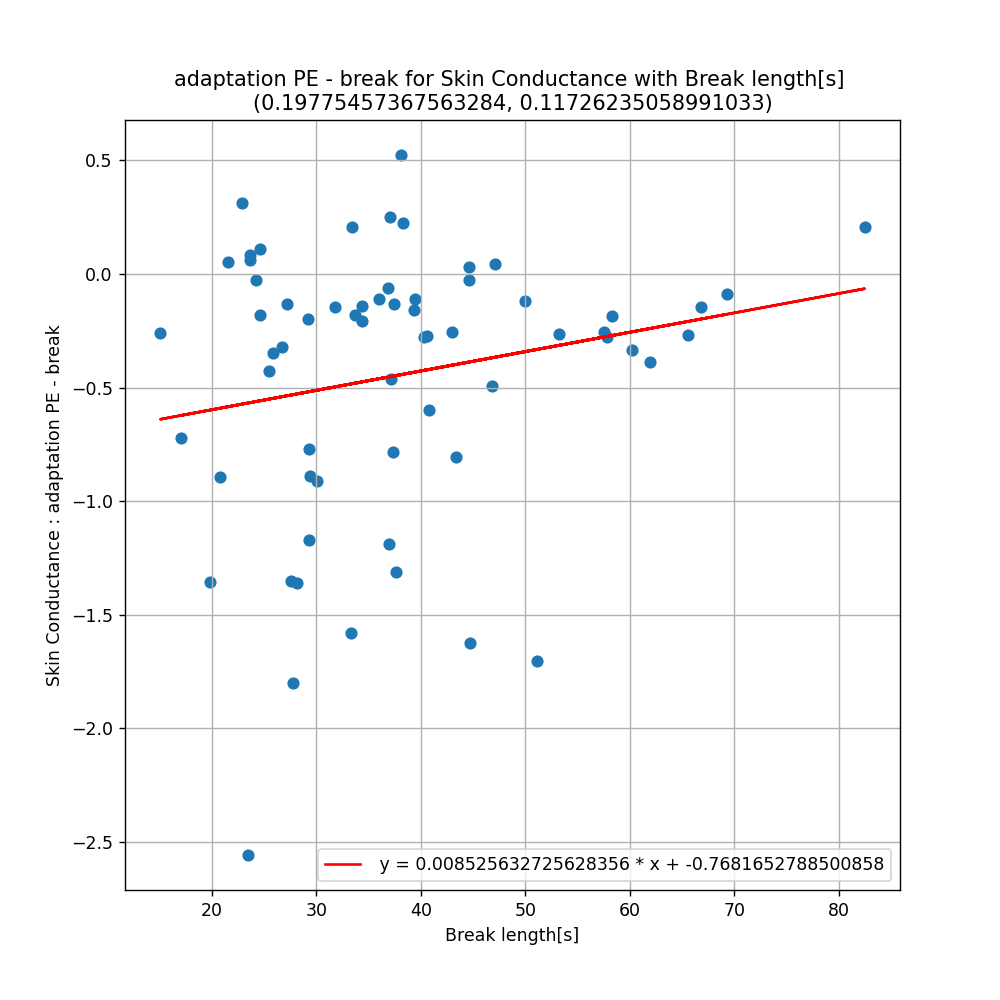

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Skin Conductance :
pearson r = -0.023918494944029634 (p = 0.8511875302545213)
regressive line first order :  y = -0.0013666764284053768 * x + -0.40648327113912164


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Skin Conductance :
pearson r = 0.12622620451583985 (p = 0.32027664245695897)
regressive line first order :  y = 0.003245173533478997 * x + -0.510838803832811


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for adaptation PE - break : -3.3722686611209163
standard deviation for differences in Phasic Component for adaptation PE - break : 6.1654532804507856
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5300037860870361, pvalue=5.276682411327338e-13)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.544015651991301, pvalue=5.5192556911887885e-06)
__________________________________________________
Skew : -2.9253866760922436
__________________________________________________


<IPython.core.display.Javascript object>


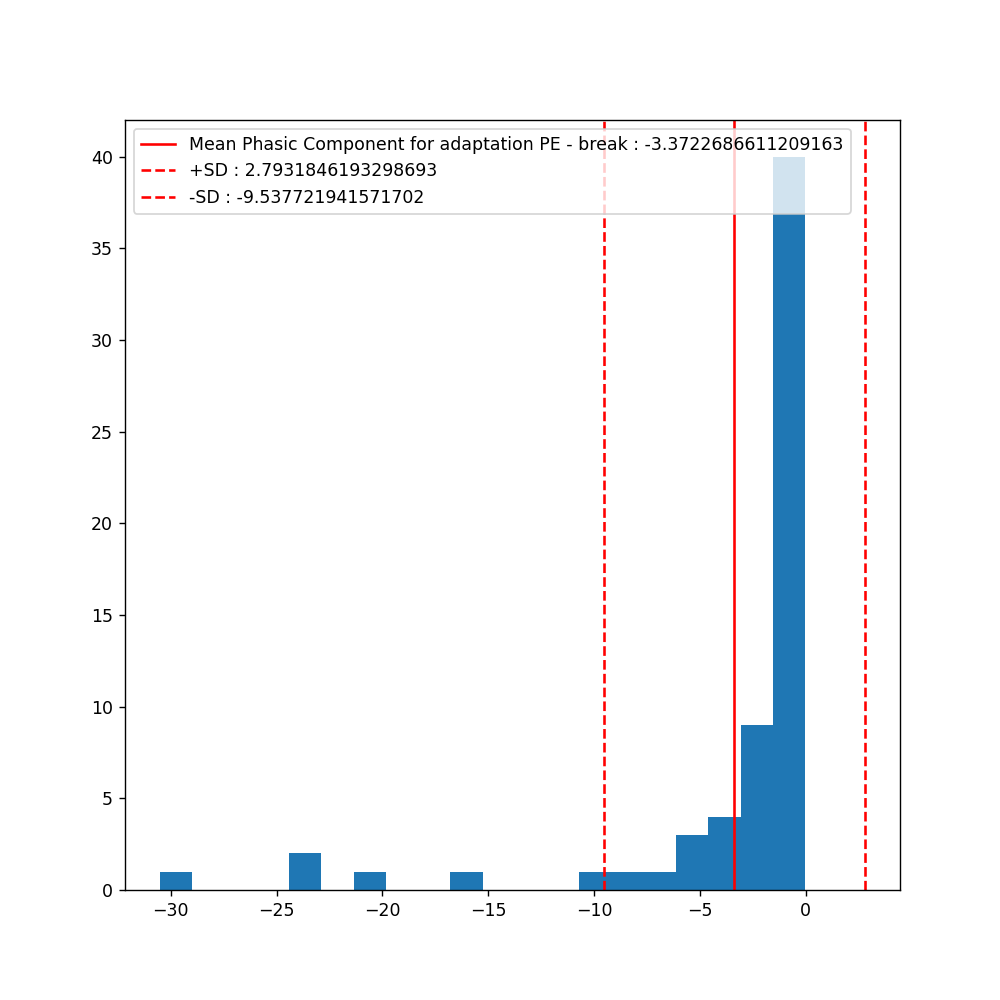

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-4.341376290878497, pvalue=5.234863462308522e-05)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=3.5254980732707397e-12)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Phasic Component :
pearson r = 0.17605821688588302 (p = 0.16404264971596172)
regressive line first order :  y = 0.07815102598840325 * x + -6.327879408513269


<IPython.core.display.Javascript object>


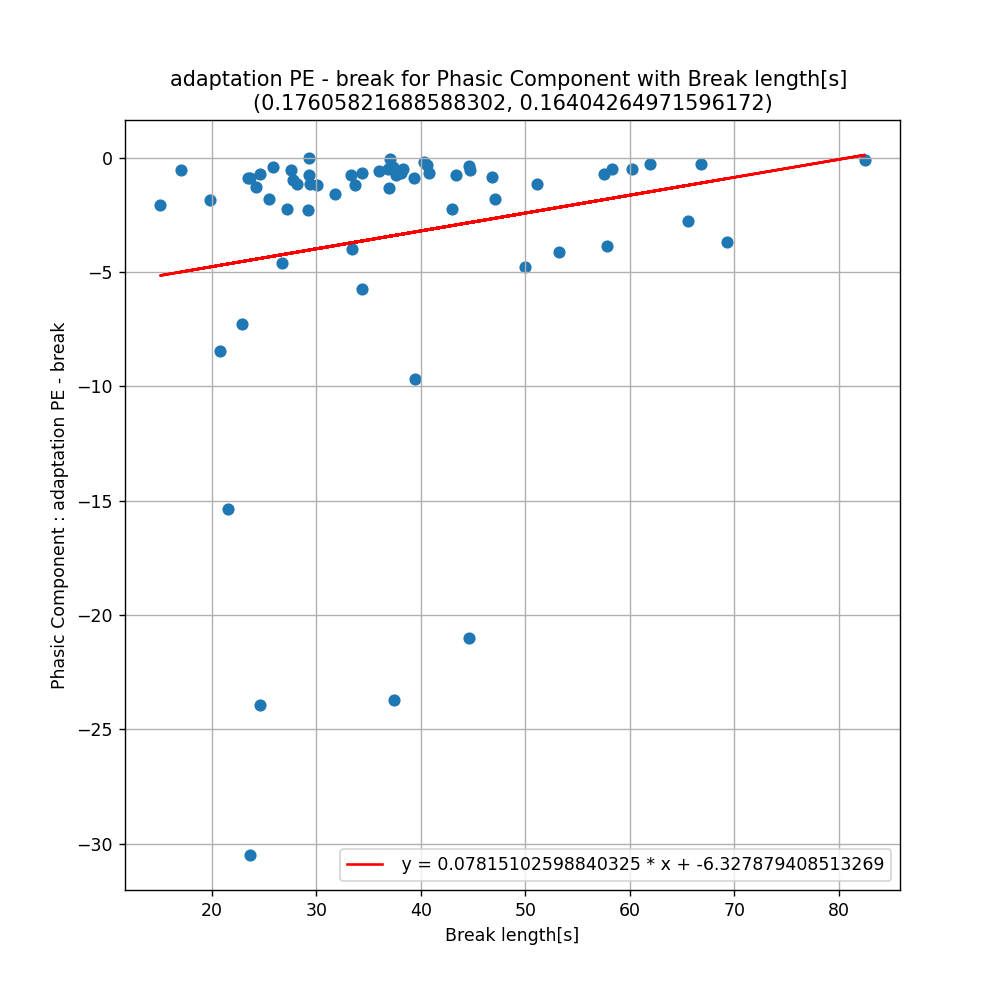

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Phasic Component :
pearson r = 0.03054829198560656 (p = 0.810620538190978)
regressive line first order :  y = 0.01797202815730106 * x + -3.888402844763403


<IPython.core.display.Javascript object>


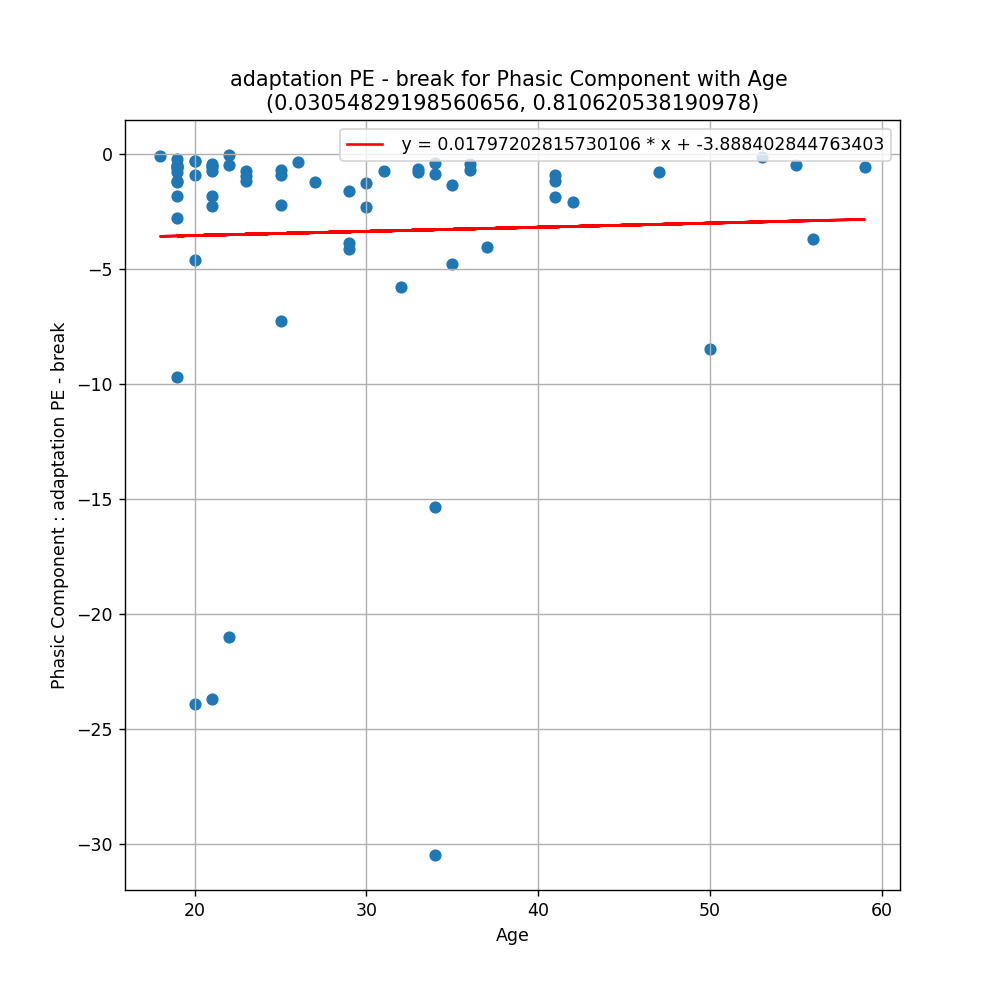

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Phasic Component :
pearson r = 0.038603443207981133 (p = 0.7620013511364361)
regressive line first order :  y = 0.01021863169753519 * x + -3.5772799595527136


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for adaptation PE - break : 2.529901908202659
standard deviation for differences in Tonic Component for adaptation PE - break : 6.576278383327561
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5779573321342468, pvalue=2.784567715297115e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.446720432402023, pvalue=8.719119124066543e-06)
__________________________________________________
Skew : 2.8265866546748195
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=3.0534707779988124, pvalue=0.0033119345614391845)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=706.0, pvalue=0.02550765413881958)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Tonic Component :
pearson r = -0.16857334039577707 (p = 0.18300519307679514)
regressive line first order :  y = -0.07981462099524148 * x + 5.548428519070034


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Tonic Component :
pearson r = -0.03569359936950389 (p = 0.779469771543885)
regressive line first order :  y = -0.02239833212558111 * x + 3.1731540089341883


<IPython.core.display.Javascript object>


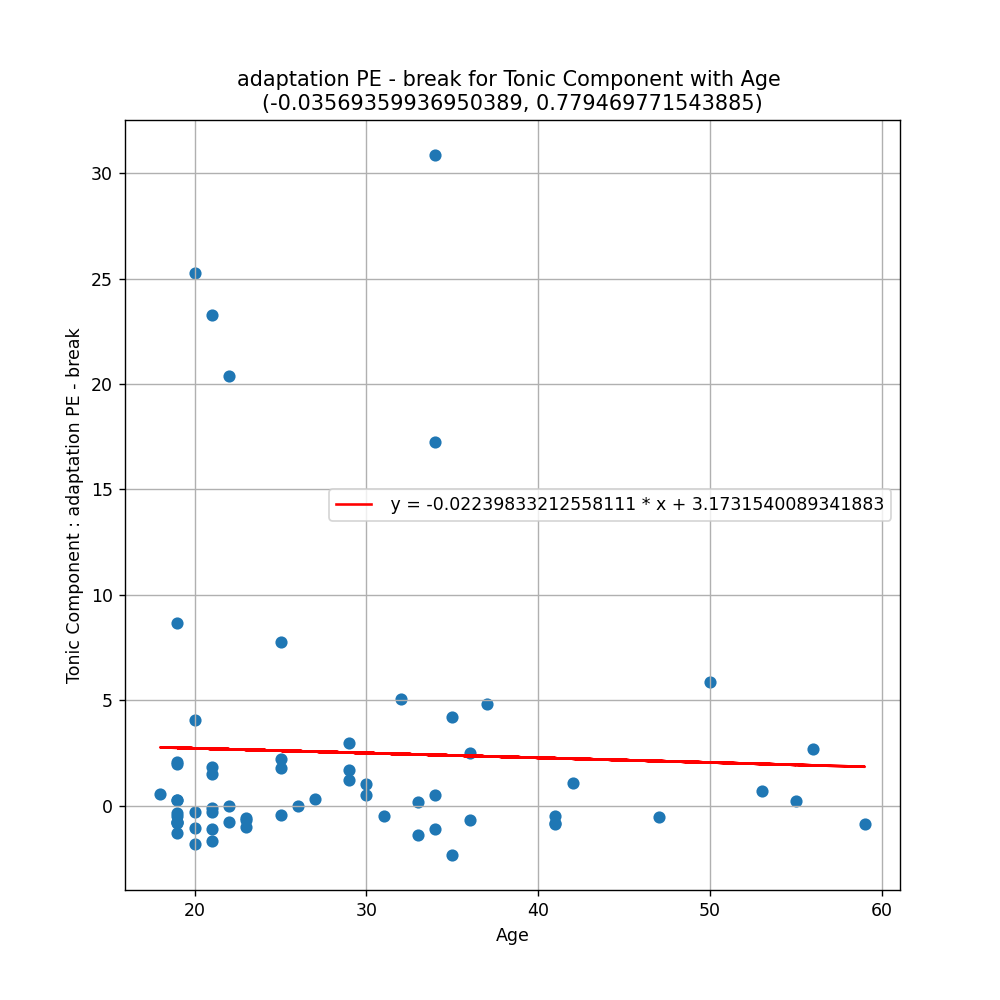

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Tonic Component :
pearson r = -0.005258833219721763 (p = 0.967103166319851)
regressive line first order :  y = -0.0014848113518934338 * x + 2.559690935950019


<IPython.core.display.Javascript object>


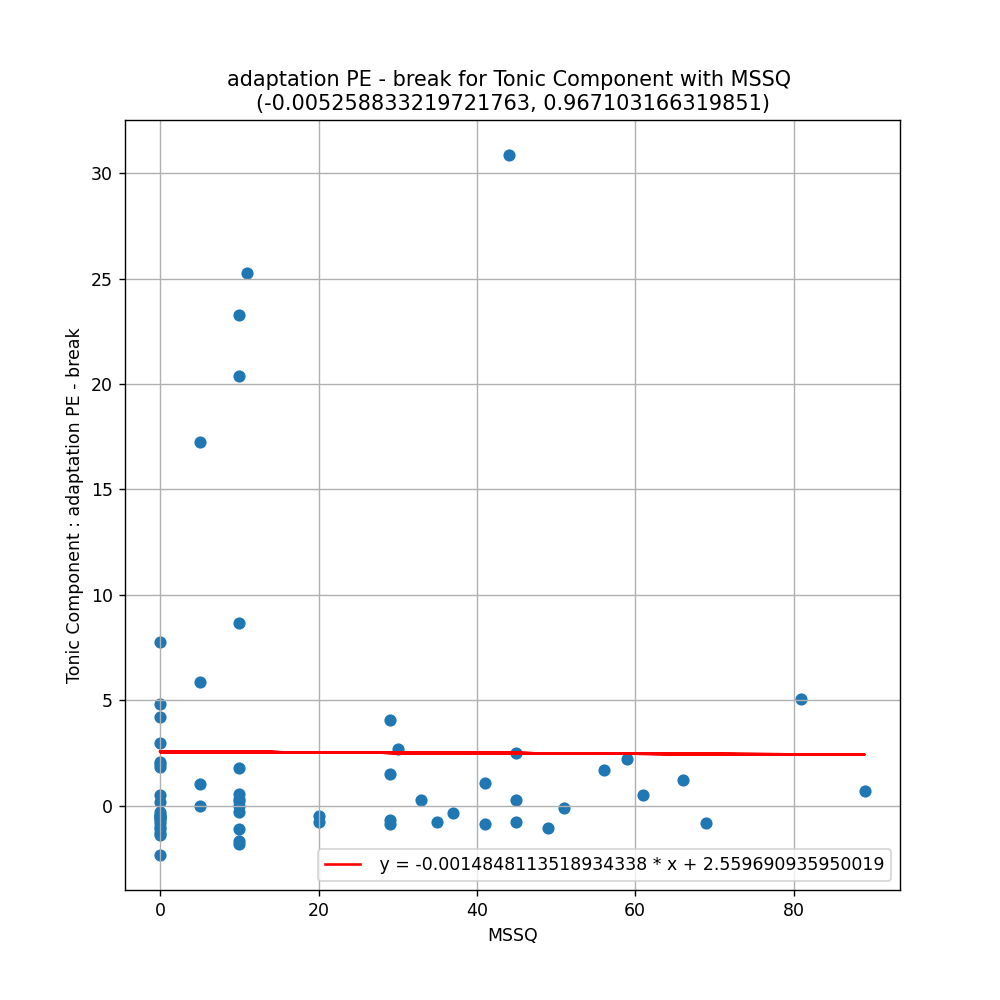




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for adaptation PE - break : -18.64199508846803
standard deviation for differences in HR[1] for adaptation PE - break : 20.914472043316376
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8059670925140381, pvalue=9.49068379441087e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.394080455712731, pvalue=1.112426143075688e-05)
__________________________________________________
Skew : 0.7490733508982098
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-7.074825916335157, pvalue=1.479944738655821e-09)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=79.0, pvalue=1.3041066034311836e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.1940646625404734 (p = 0.12439938344895488)
regressive line first order :  y = 0.29221784995821015 * x + -29.693445878692238


<IPython.core.display.Javascript object>


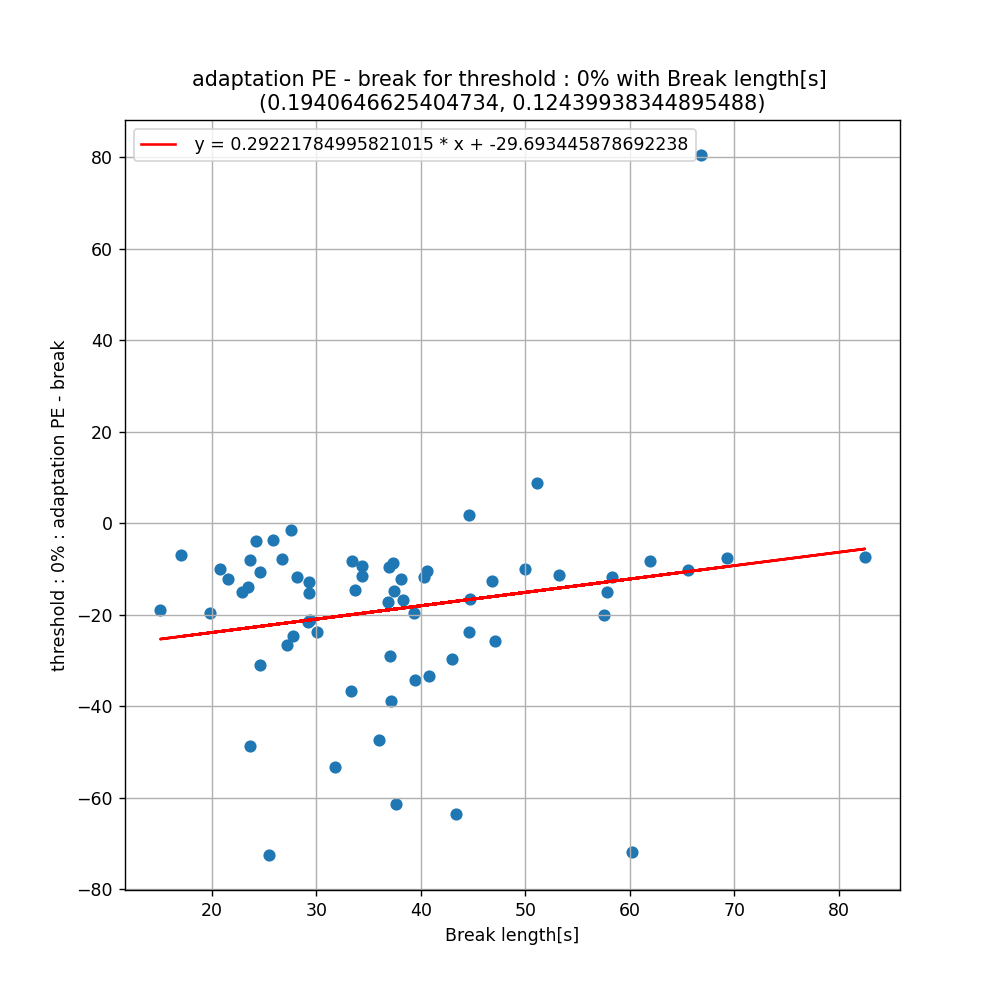

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.04667010482545472 (p = 0.7142144647802925)
regressive line first order :  y = 0.09313884079517726 * x + -21.316826172554507


<IPython.core.display.Javascript object>


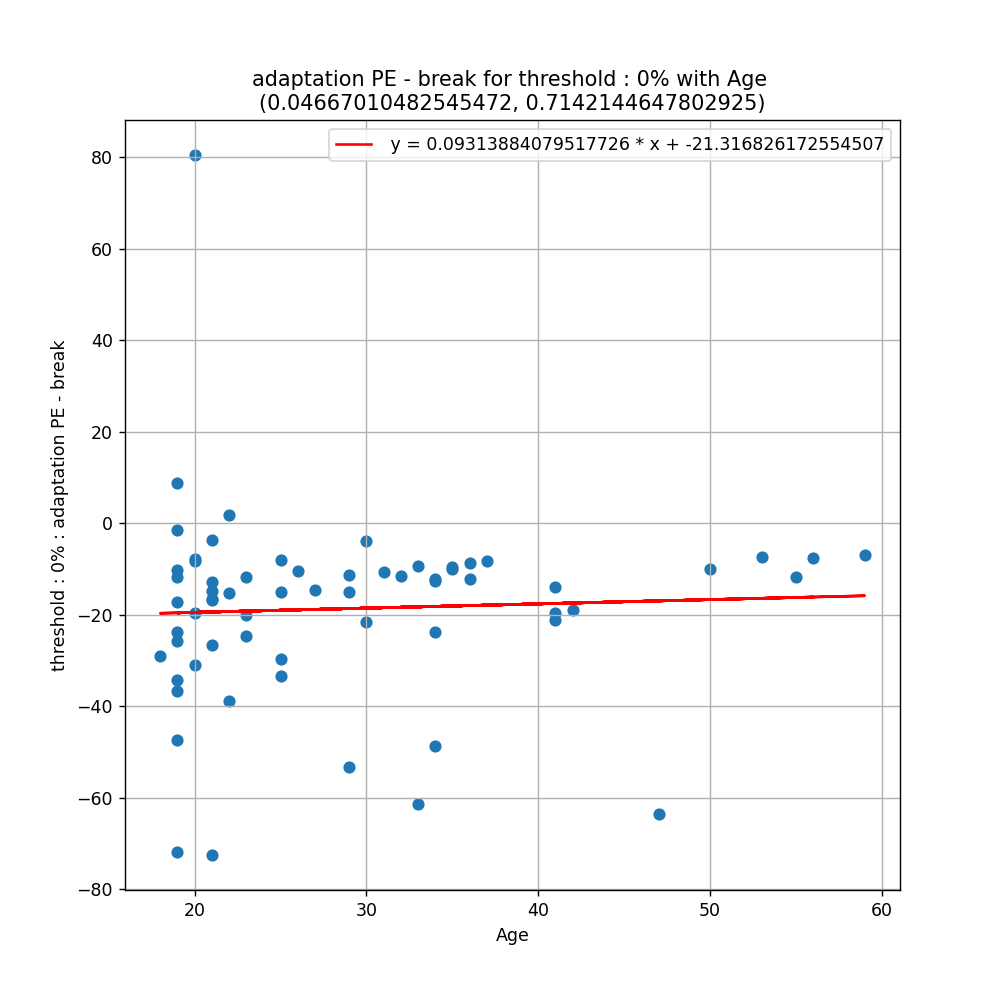

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.17555985972497198 (p = 0.16525845769708883)
regressive line first order :  y = -0.15764268504530604 * x + -15.479288719746563


<IPython.core.display.Javascript object>


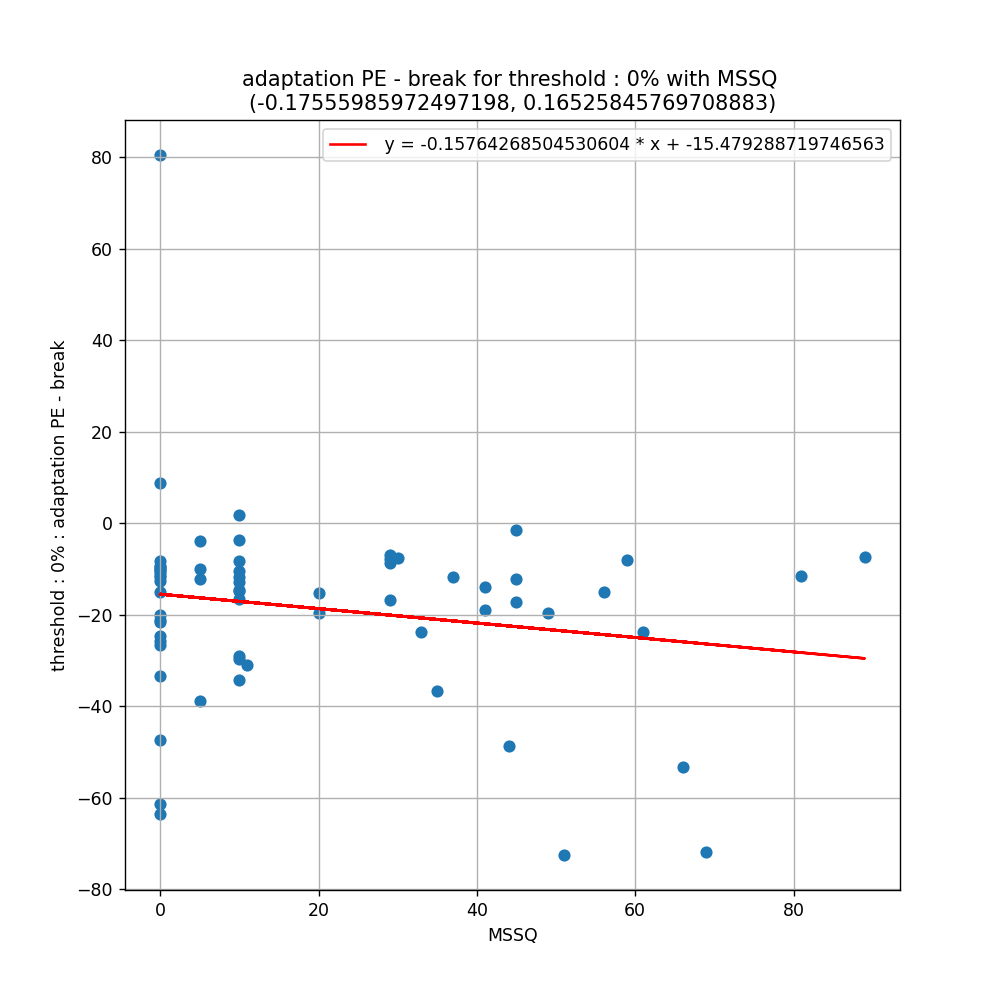




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 9%] for adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 9%] for adaptation PE - break : -18.051345700773588
standard deviation for differences in HR[0.9] for adaptation PE - break : 13.950344004737254
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8552100658416748, pvalue=8.128967238008045e-06)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=3.1037410060015005, pvalue=0.0019109052878476303)
__________________________________________________
Skew : -1.5936335613155985
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 9% for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-9.596348493675679, pvalue=2.390419005929095e-13)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=12.0, pvalue=1.4412466780473427e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.19139637243660962 (p = 0.15763311830251267)
regressive line first order :  y = 0.19393988946820248 * x + -25.247242874629407


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.2406271207899987 (p = 0.07403049249443815)
regressive line first order :  y = 0.3183900107236746 * x + -27.347196906723724


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Heart Rate(HR)[threshold : 9%] :
pearson r = -0.13328973492884216 (p = 0.32741648678272806)
regressive line first order :  y = -0.07991379945904087 * x + -16.39313436199849


<IPython.core.display.Javascript object>


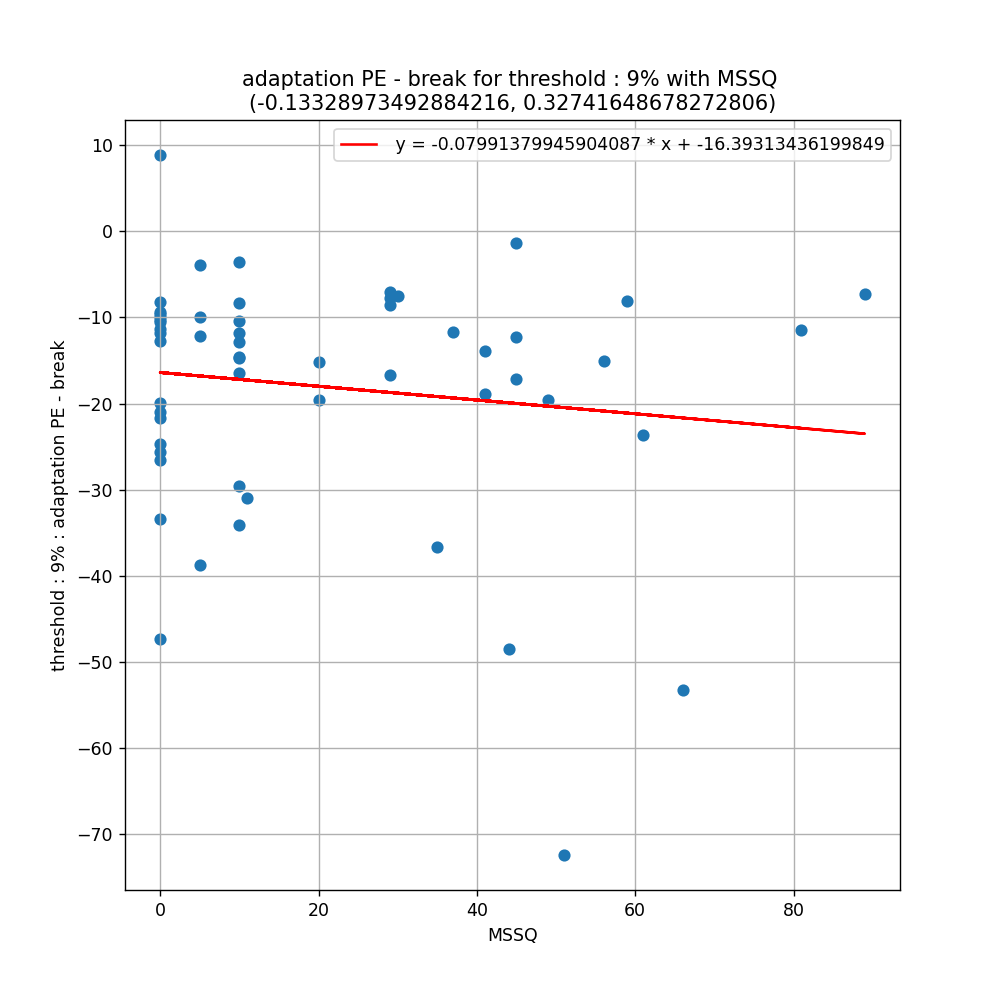




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 50%] for adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 50%] for adaptation PE - break : -13.214311749548658
standard deviation for differences in HR[0.5] for adaptation PE - break : 6.41601948912551
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9245086908340454, pvalue=0.019269609823822975)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=1.5165846752901542, pvalue=0.12937157692956971)
__________________________________________________
Skew : -0.9891786297814428
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 50% for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-12.009317656485063, pvalue=8.80843968474649e-14)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=2.4770276393652366e-07)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.15893669508356525 (p = 0.3617954705761054)
regressive line first order :  y = 0.06273383592395337 * x + -15.624617421559433


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.2877655507594347 (p = 0.09368252702535507)
regressive line first order :  y = 0.15977643578923229 * x + -18.295202407646247


<IPython.core.display.Javascript object>


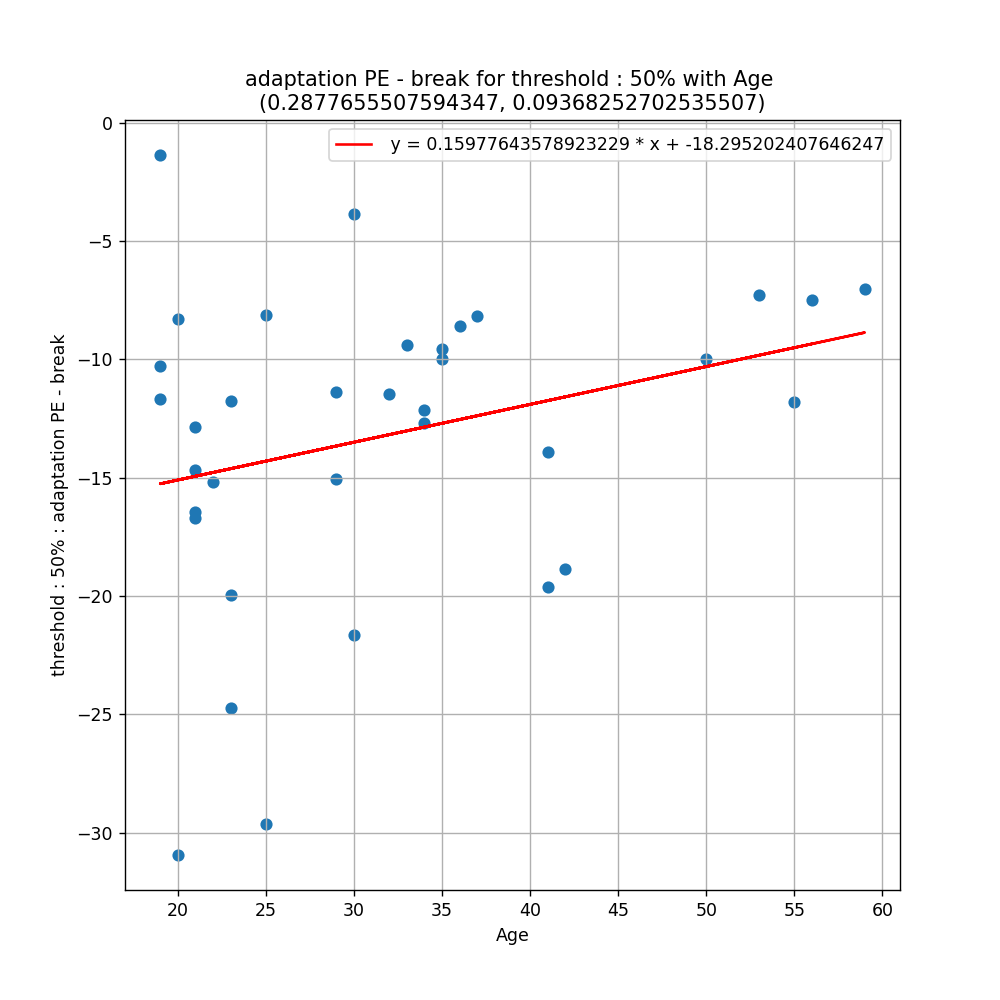

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.21775099010222815 (p = 0.20890193965103612)
regressive line first order :  y = 0.059661995905182945 * x + -14.393914640016849


<IPython.core.display.Javascript object>


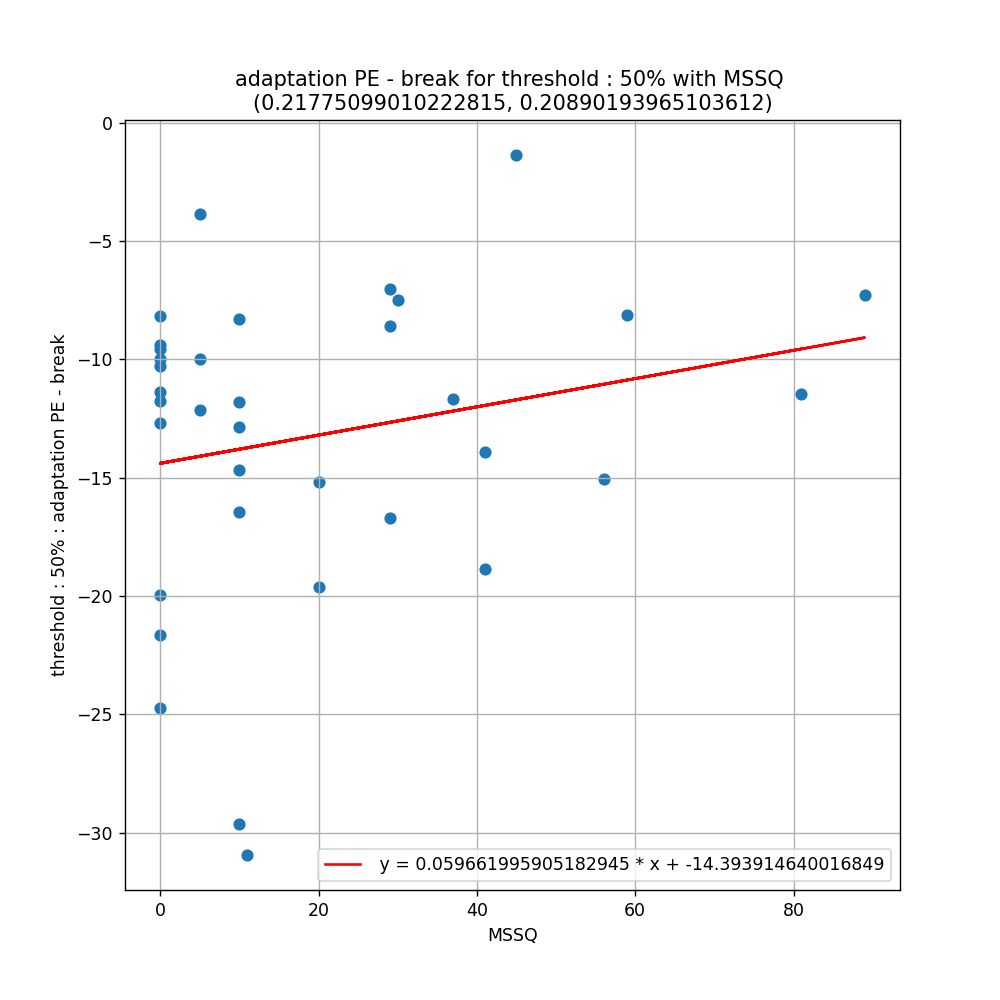




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 90%] for adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 90%] for adaptation PE - break : -12.088191428215913
standard deviation for differences in HR[0.1] for adaptation PE - break : 3.230967532703601
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.980011522769928, pvalue=0.9346803426742554)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=-0.4778987691652218, pvalue=0.6327222574825806)
__________________________________________________
Skew : 0.1027277462327408
__________________________________________________


C:\Users\Krzyniu\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=5
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<IPython.core.display.Javascript object>


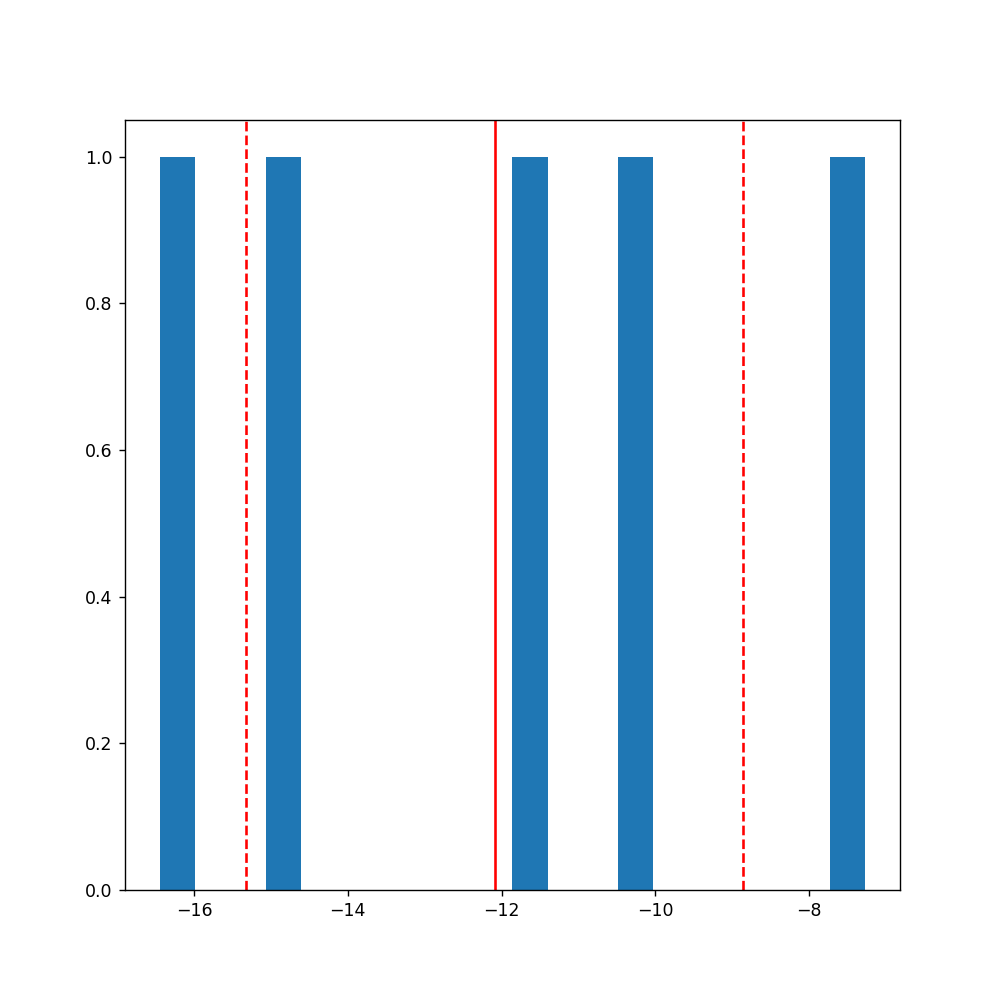

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 90% for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-7.482706839892499, pvalue=0.0017056808099062436)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=0.0625)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.7294550190056841 (p = 0.16189445089414872)
regressive line first order :  y = 0.11943746413778324 * x + -18.260241824999994


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.7268554319996954 (p = 0.16416309196985962)
regressive line first order :  y = 0.18258301469442592 * x + -17.090966030843187


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.6550826511383132 (p = 0.23017108224584912)
regressive line first order :  y = 0.06244191836726519 * x + -13.449425248622294


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for adaptation PE - adaptation VE : -0.25290591424191866
standard deviation for differences in Skin Conductance for adaptation PE - adaptation VE : 0.3871170050801228
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.963276743888855, pvalue=0.05395703390240669)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.1495573618316897, pvalue=0.031590244162566374)
__________________________________________________
Skew : -0.6533623649964706
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-5.1854566867429694, pvalue=2.4300226837938967e-06)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=338.0, pvalue=2.6709193274650893e-06)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Skin Conductance :
pearson r = -0.0361522227975298 (p = 0.7767090867055705)
regressive line first order :  y = -0.0010076057280800738 * x + -0.21479905279790512


<IPython.core.display.Javascript object>


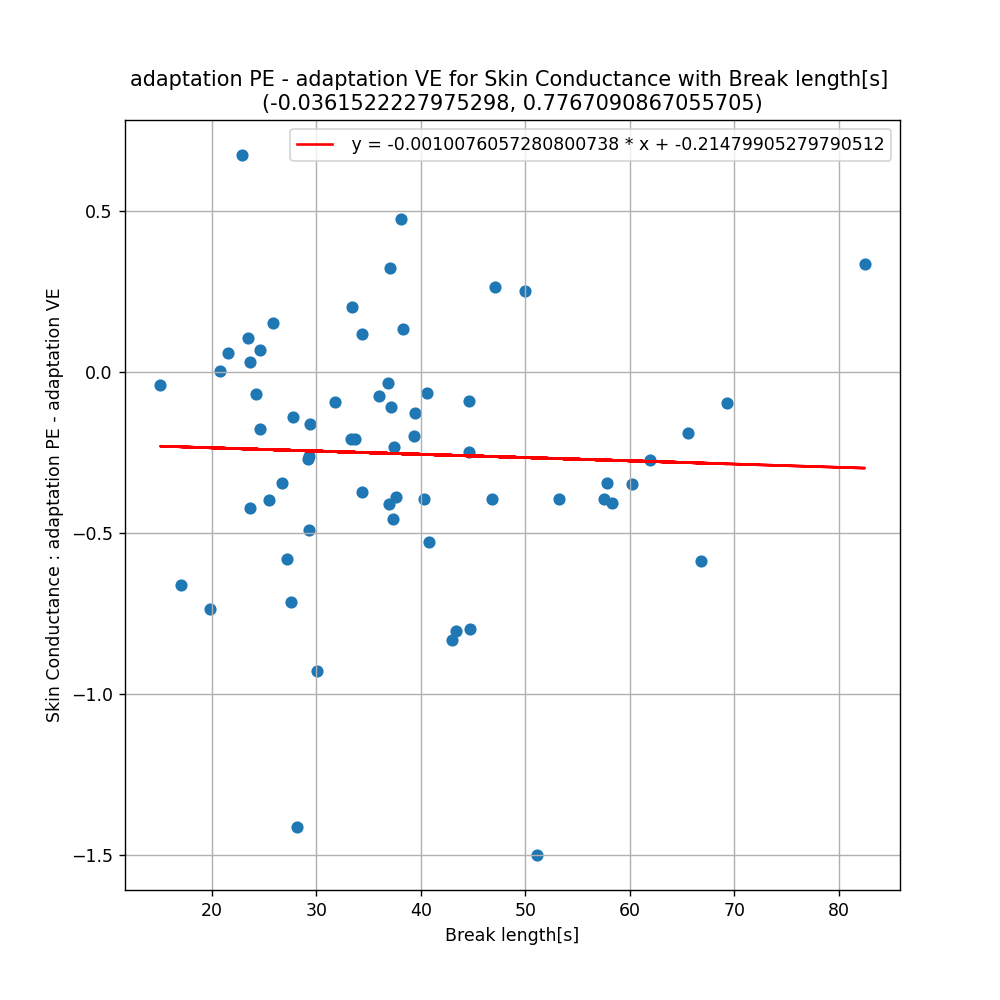

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Skin Conductance :
pearson r = 0.09895485315192819 (p = 0.43659942235688265)
regressive line first order :  y = 0.0036553123520700983 * x + -0.35788191585293155


<IPython.core.display.Javascript object>


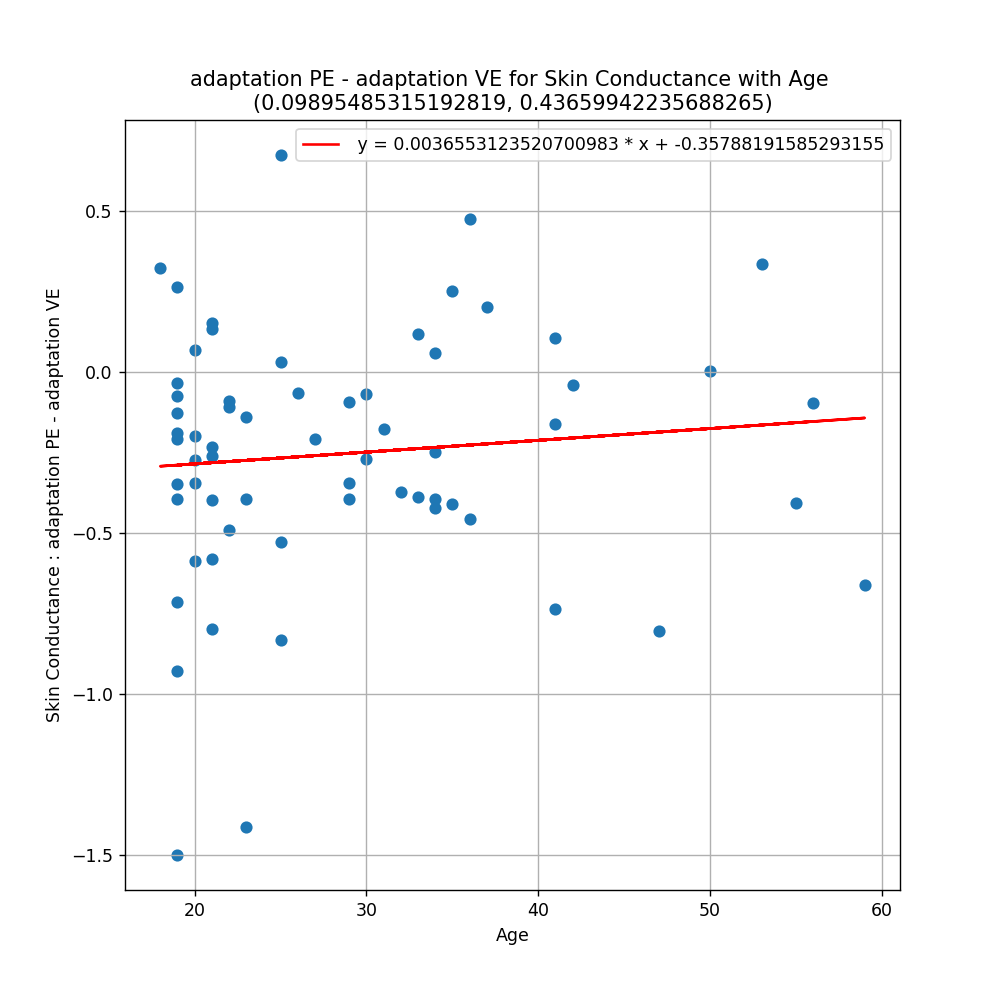

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Skin Conductance :
pearson r = 0.09979742663960654 (p = 0.43268484460308765)
regressive line first order :  y = 0.0016586825827092943 * x + -0.2861832335575237


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for adaptation PE - adaptation VE : -0.11594100306745878
standard deviation for differences in Phasic Component for adaptation PE - adaptation VE : 0.625816080668854
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.567838728427887, pvalue=1.939559407179714e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.59121504769811, pvalue=2.2548610341279905e-08)
__________________________________________________
Skew : -1.6107607894578506
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-1.4704850371247709, pvalue=0.1464074945010088)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=640.0, pvalue=0.007472883093784643)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Phasic Component :
pearson r = 0.16529091308558658 (p = 0.1918028571677723)
regressive line first order :  y = 0.007447475288923172 * x + -0.3975987001544634


<IPython.core.display.Javascript object>


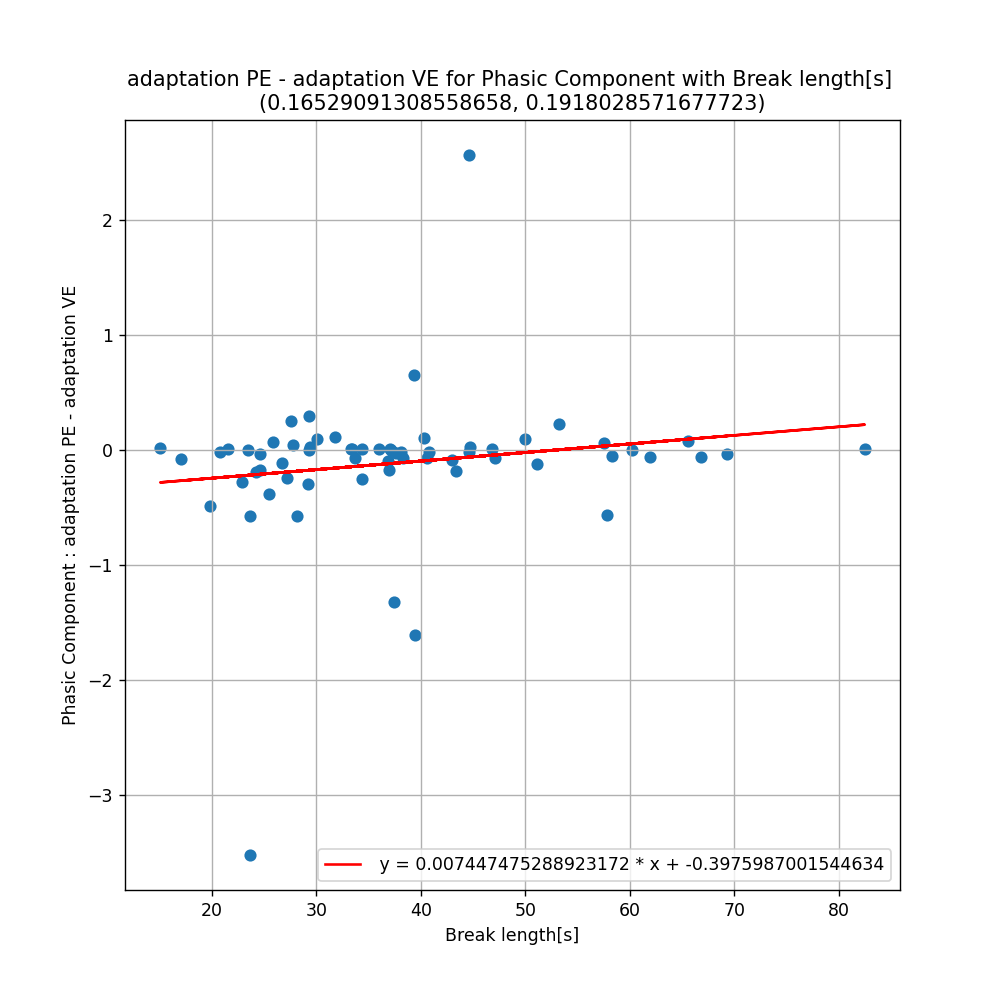

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Phasic Component :
pearson r = -0.05423699789038881 (p = 0.6703572226830937)
regressive line first order :  y = -0.0032388251808685774 * x + -0.022925992404389268


<IPython.core.display.Javascript object>


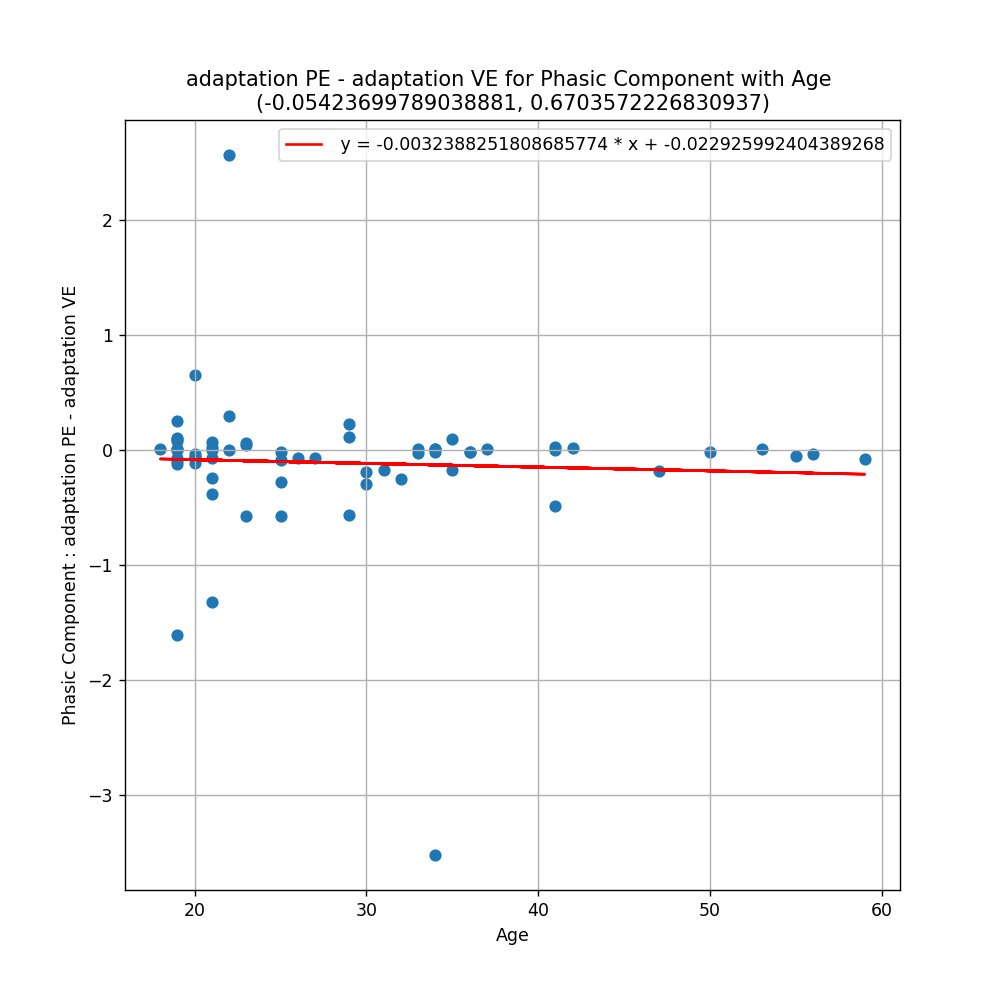

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Phasic Component :
pearson r = -0.09007226441970748 (p = 0.4790590346023314)
regressive line first order :  y = -0.0024201344386394685 * x + -0.06738705589225441


<IPython.core.display.Javascript object>


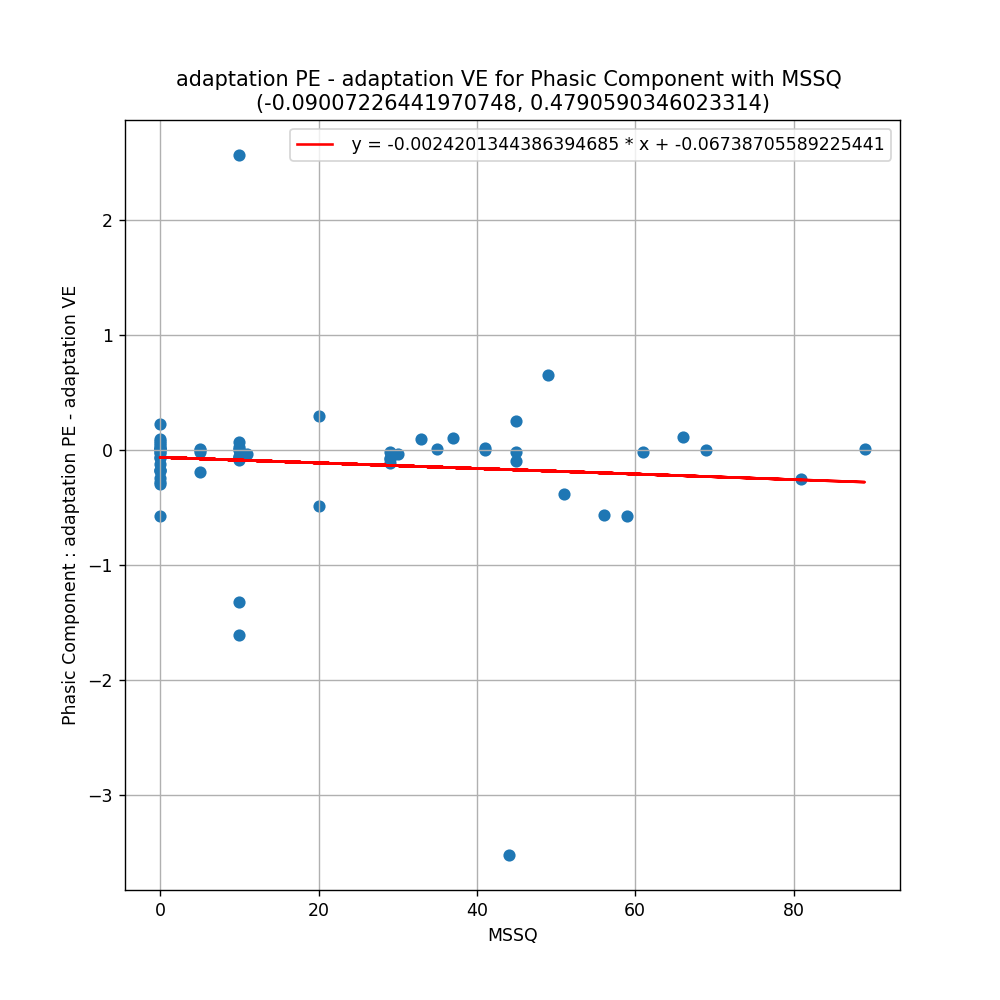




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for adaptation PE - adaptation VE : -0.5472503234449438
standard deviation for differences in Tonic Component for adaptation PE - adaptation VE : 1.2015799560317284
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.969699501991272, pvalue=0.11668615788221359)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.093588634139755, pvalue=0.03629664091359675)
__________________________________________________
Skew : -0.42771982571161743
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-3.614961085527834, pvalue=0.000597862935199117)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=538.0, pvalue=0.0007875682553027494)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Tonic Component :
pearson r = -0.26126975664280666 (p = 0.037039012645387365)
regressive line first order :  y = -0.02260243295049247 * x + 0.30755603259193875


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Tonic Component :
pearson r = 0.14394423575981716 (p = 0.2564678099306155)
regressive line first order :  y = 0.01650410961893723 * x + -1.0212277215637968


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Tonic Component :
pearson r = 0.06468996414144243 (p = 0.6115569377069762)
regressive line first order :  y = 0.0033372694880866877 * x + -0.6142042925496826


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for adaptation PE - adaptation VE : -2.4365443237287394
standard deviation for differences in HR[1] for adaptation PE - adaptation VE : 23.003712016968468
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5553779602050781, pvalue=1.2525511227171049e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.4380003514130495, pvalue=5.388186837656961e-08)
__________________________________________________
Skew : 0.5549217050422672
__________________________________________________


<IPython.core.display.Javascript object>


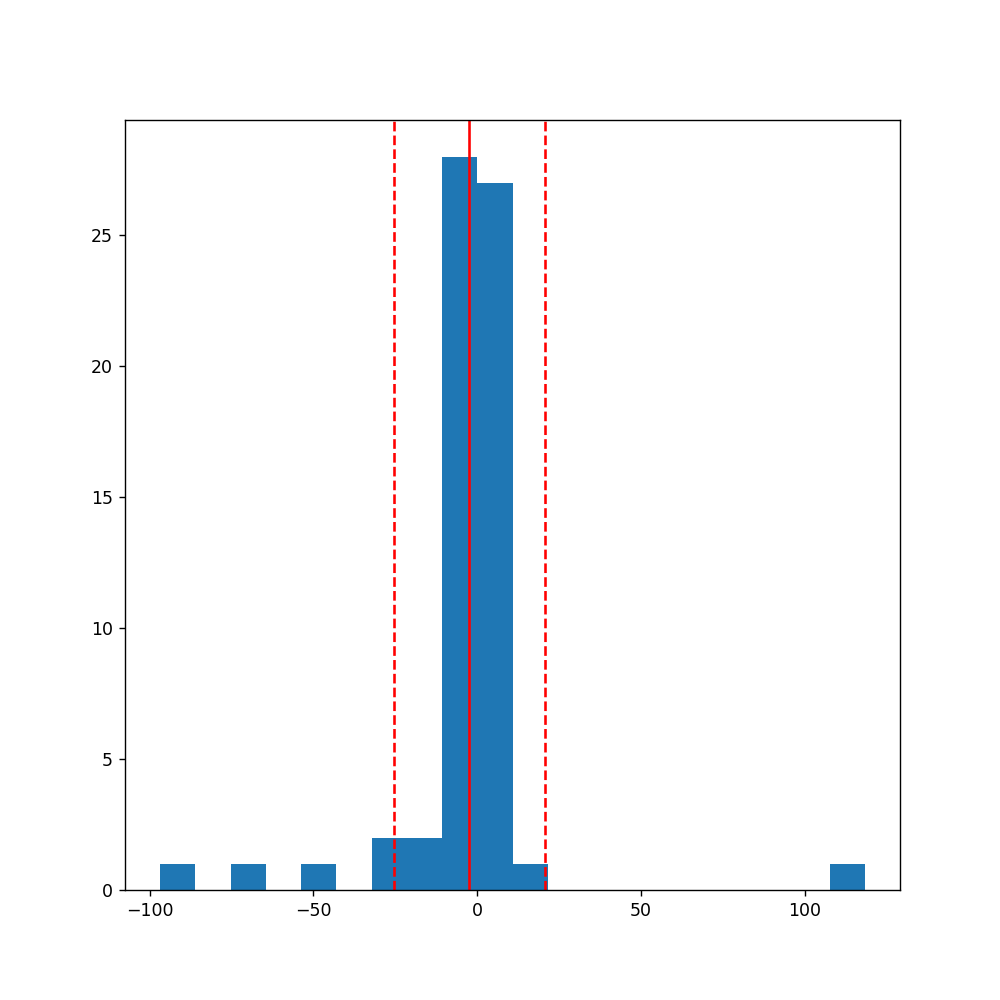

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-0.8407108819068557, pvalue=0.40368949505406004)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=944.0, pvalue=0.5208728899052881)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.15061181144345323 (p = 0.23485800903063644)
regressive line first order :  y = 0.24944242945118578 * x + -11.87026212867457


<IPython.core.display.Javascript object>


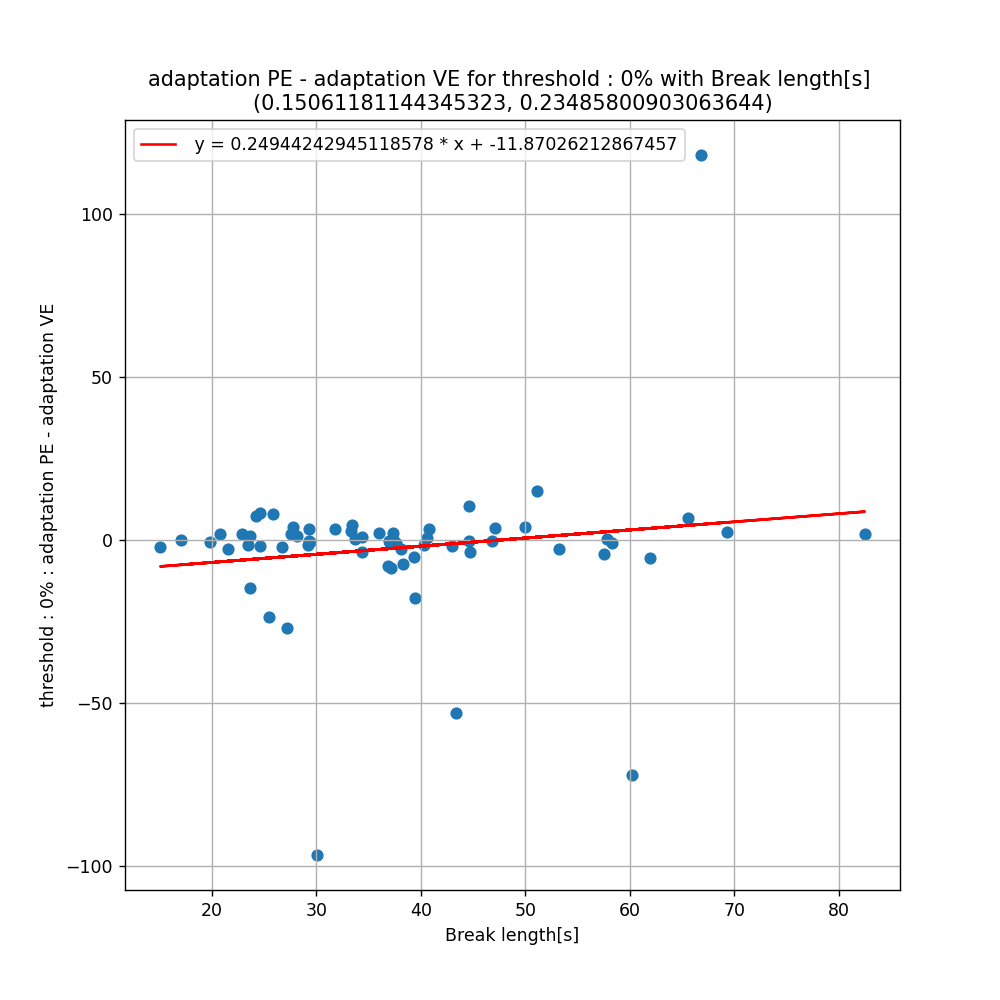

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.001177598584542229 (p = 0.9926315515895575)
regressive line first order :  y = 0.0025848797433599842 * x + -2.5107788388583567


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.21168890955866504 (p = 0.09310859244512269)
regressive line first order :  y = -0.20907288886542505 * x + 1.7579805091338514


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 9%] for adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 9%] for adaptation PE - adaptation VE : -1.1150511488653765
standard deviation for differences in HR[0.9] for adaptation PE - adaptation VE : 6.929790648940066
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8503413796424866, pvalue=5.881916877115145e-06)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=3.4409835097330403, pvalue=0.0005796038554688752)
__________________________________________________
Skew : -1.5510472187092326
__________________________________________________


<IPython.core.display.Javascript object>


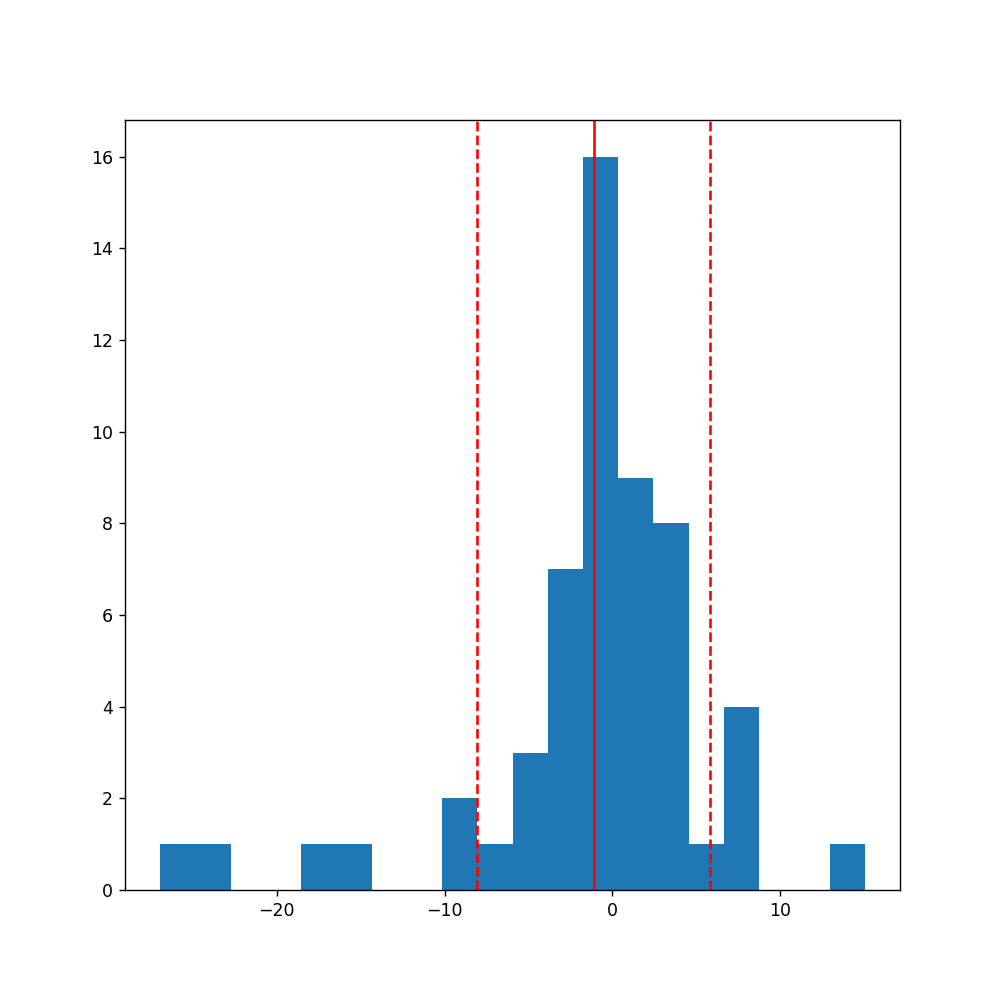

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 9% for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-1.1933175274947914, pvalue=0.23786721923893522)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=738.0, pvalue=0.624540793570172)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.13609682240354537 (p = 0.3172389108431163)
regressive line first order :  y = 0.06850410937361749 * x + -3.6568104970367363


<IPython.core.display.Javascript object>


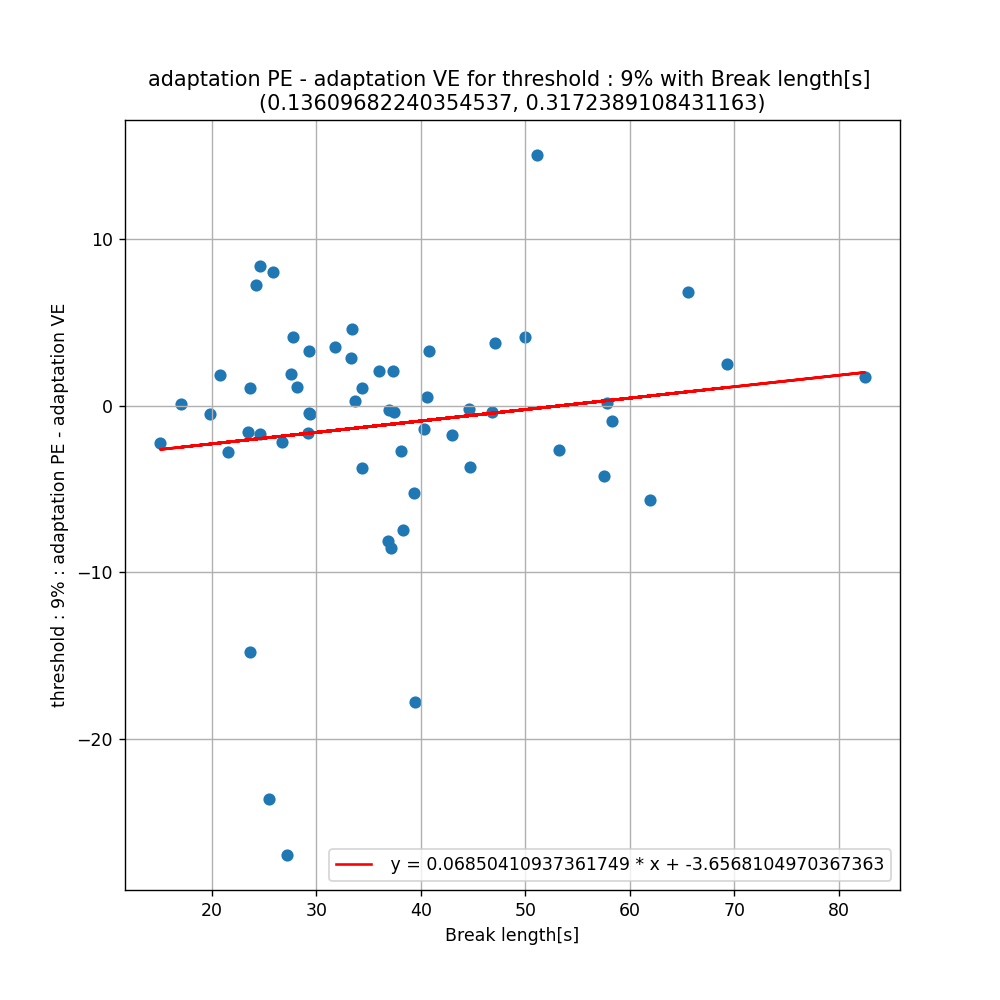

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.11741258778842378 (p = 0.3887950467751543)
regressive line first order :  y = 0.07717288154657968 * x + -3.3682236725914074


<IPython.core.display.Javascript object>


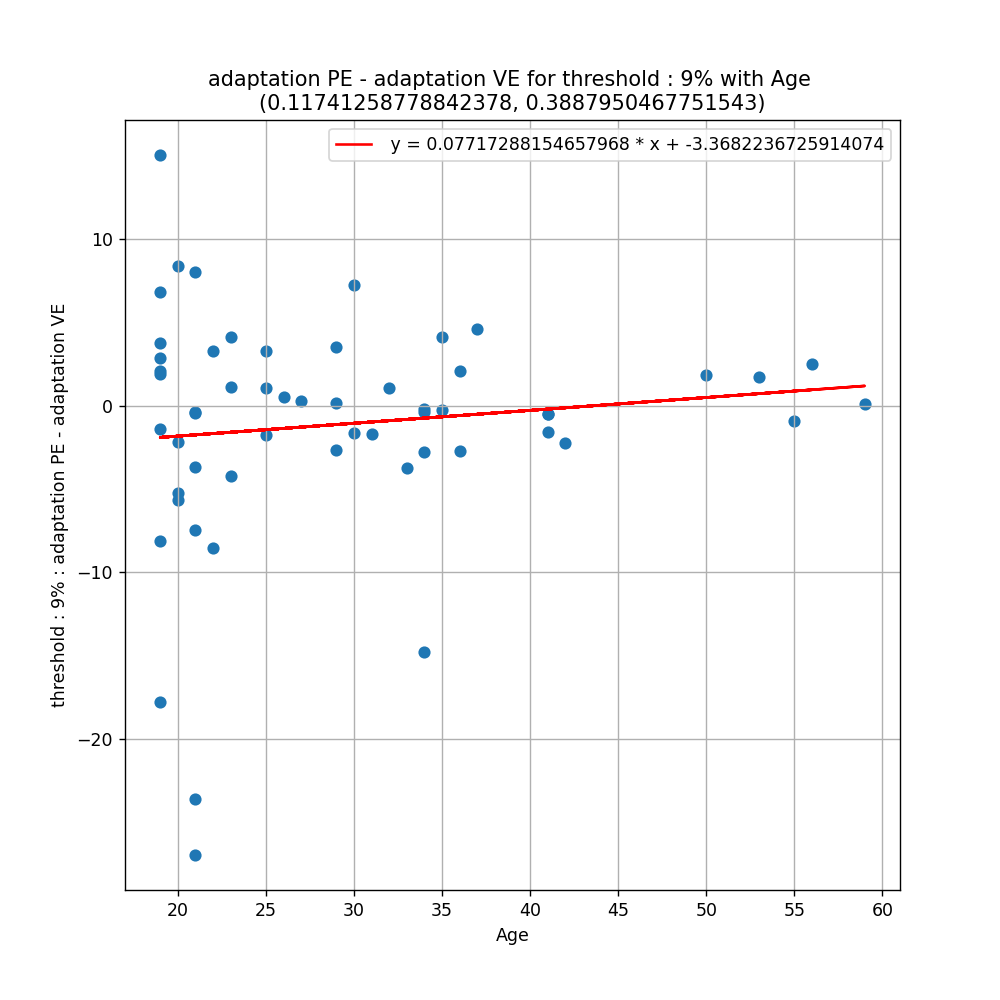

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = -0.11226789153048888 (p = 0.41005535520509934)
regressive line first order :  y = -0.03343611721736765 * x + -0.42125171660499716


<IPython.core.display.Javascript object>


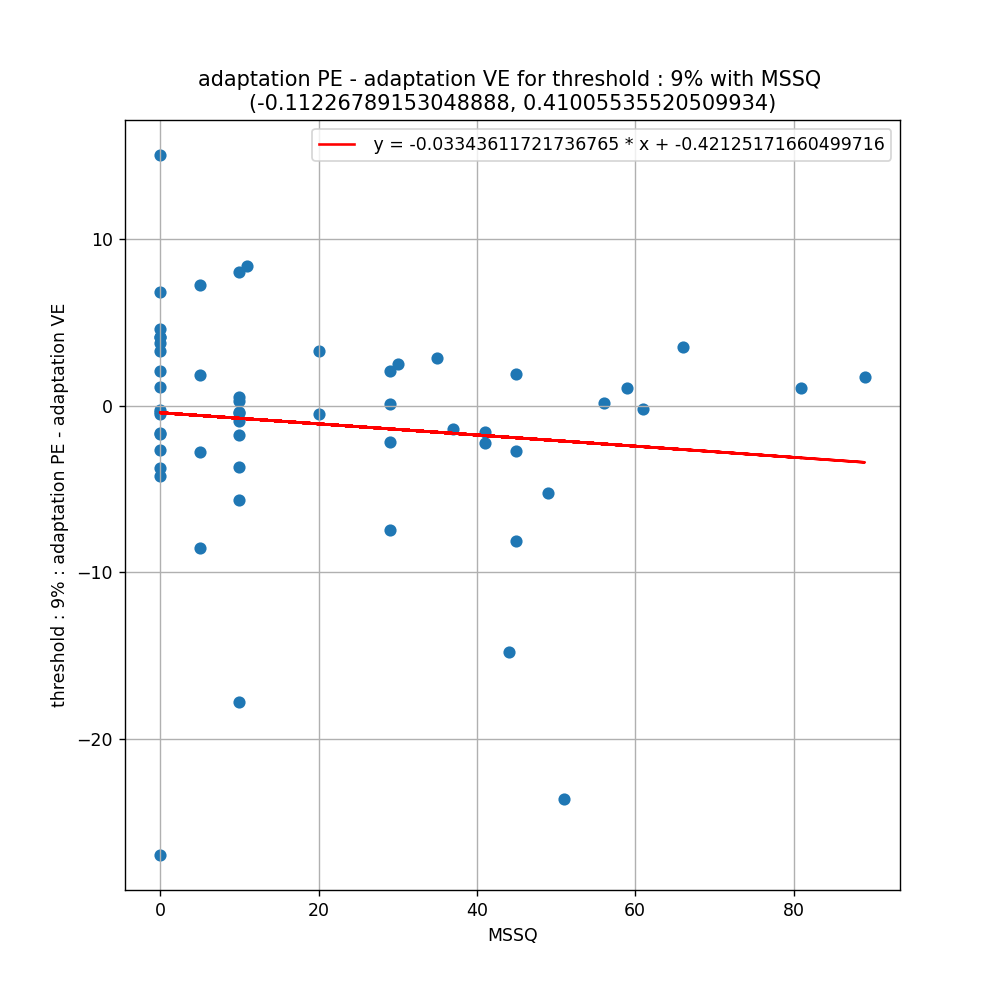




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 50%] for adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 50%] for adaptation PE - adaptation VE : 0.29988461129600075
standard deviation for differences in HR[0.5] for adaptation PE - adaptation VE : 3.4630094515060867
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9844468832015991, pvalue=0.890385091304779)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=0.5371692863068526, pvalue=0.5911506846816894)
__________________________________________________
Skew : 0.26008609309383074
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 50% for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=0.5049402165826831, pvalue=0.6168582276487)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=298.0, pvalue=0.780670449239729)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.0798276385493368 (p = 0.6485022325055363)
regressive line first order :  y = -0.01700665690347314 * x + 0.9532998057067572


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.04926633486859512 (p = 0.7786727957735421)
regressive line first order :  y = 0.01476427696852377 * x + -0.16961939630305495


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.015817900417883432 (p = 0.928138697590123)
regressive line first order :  y = -0.002339238370371656 * x + 0.3461346956473491


<IPython.core.display.Javascript object>


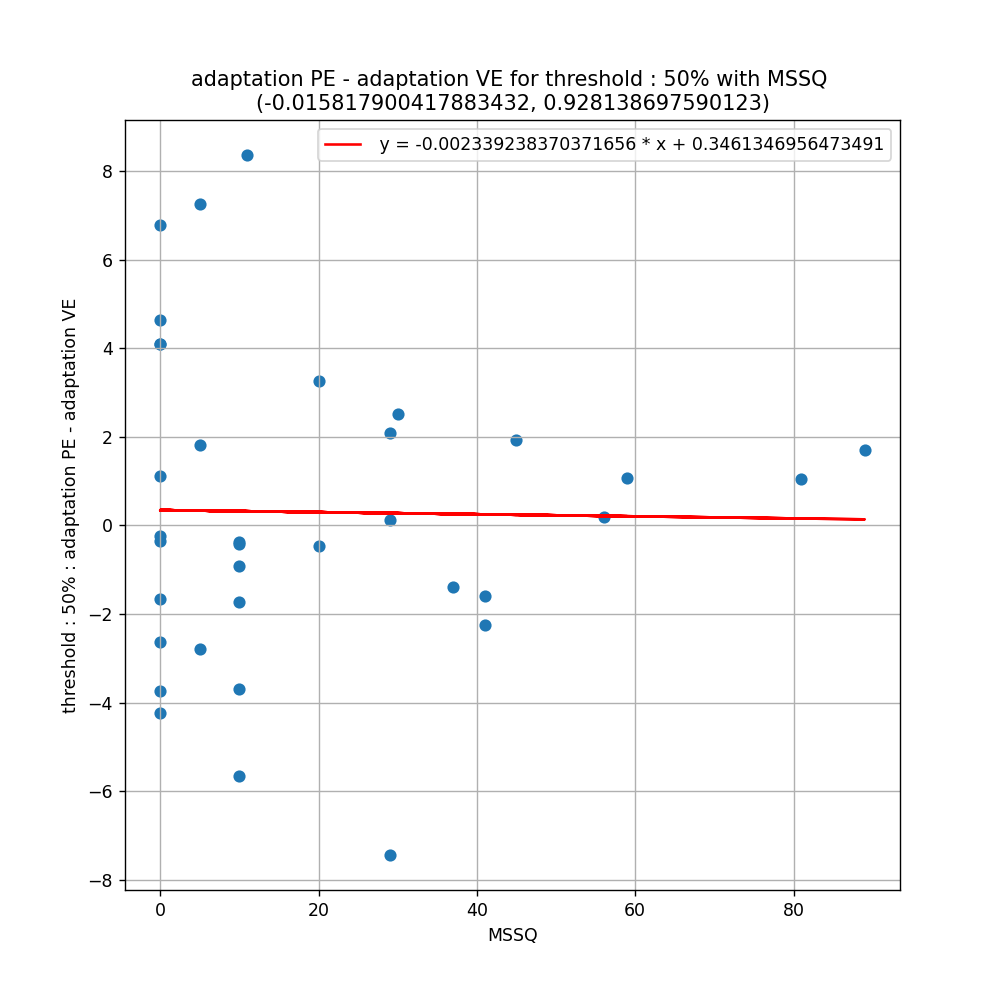




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 90%] for adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 90%] for adaptation PE - adaptation VE : 1.104808569566336
standard deviation for differences in HR[0.1] for adaptation PE - adaptation VE : 3.4018700006524143
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9635338187217712, pvalue=0.8323512077331543)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=0.7404104939061542, pvalue=0.45905095325918344)
__________________________________________________
Skew : 0.3550743676202116
__________________________________________________


C:\Users\Krzyniu\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=5
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<IPython.core.display.Javascript object>


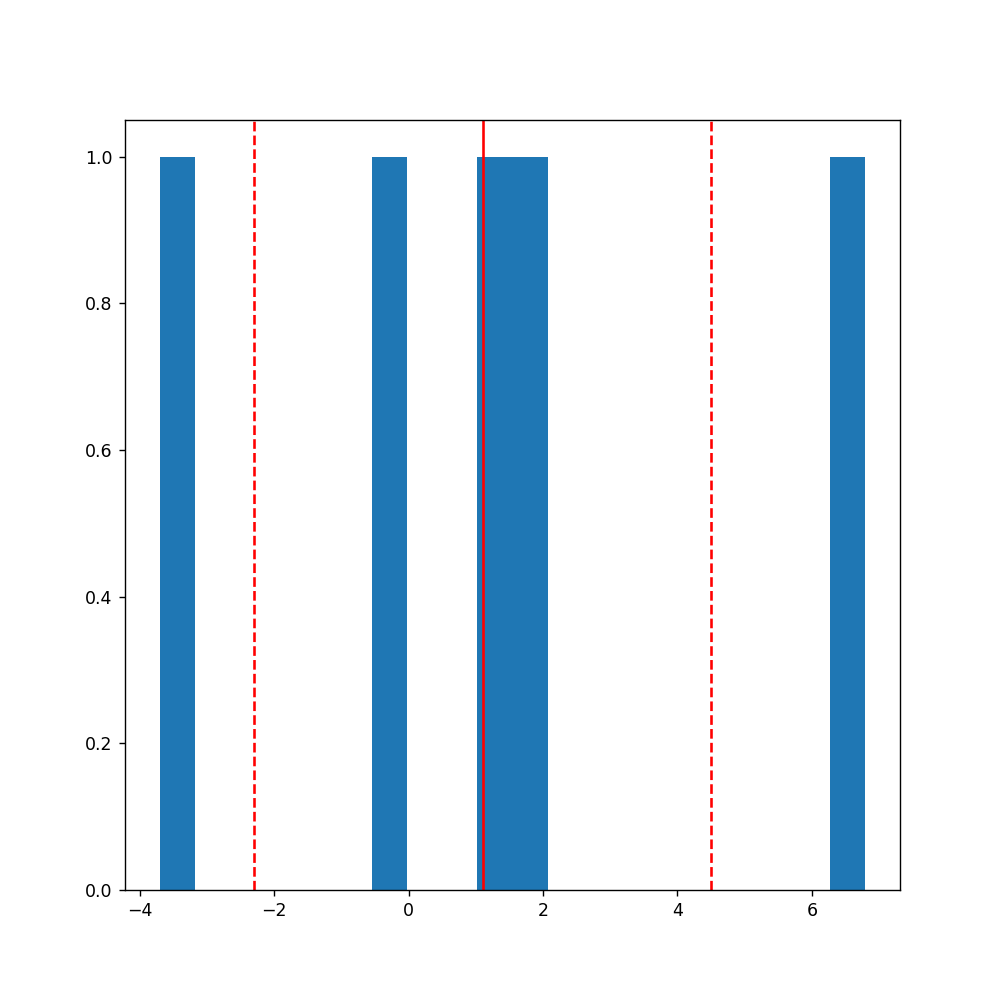

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 90% for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=0.6495301521542297, pvalue=0.5514092408726096)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=5.0, pvalue=0.625)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.4513625834261687 (p = 0.44546540567041565)
regressive line first order :  y = 0.07781310246179056 * x + -2.916261313249153


<IPython.core.display.Javascript object>


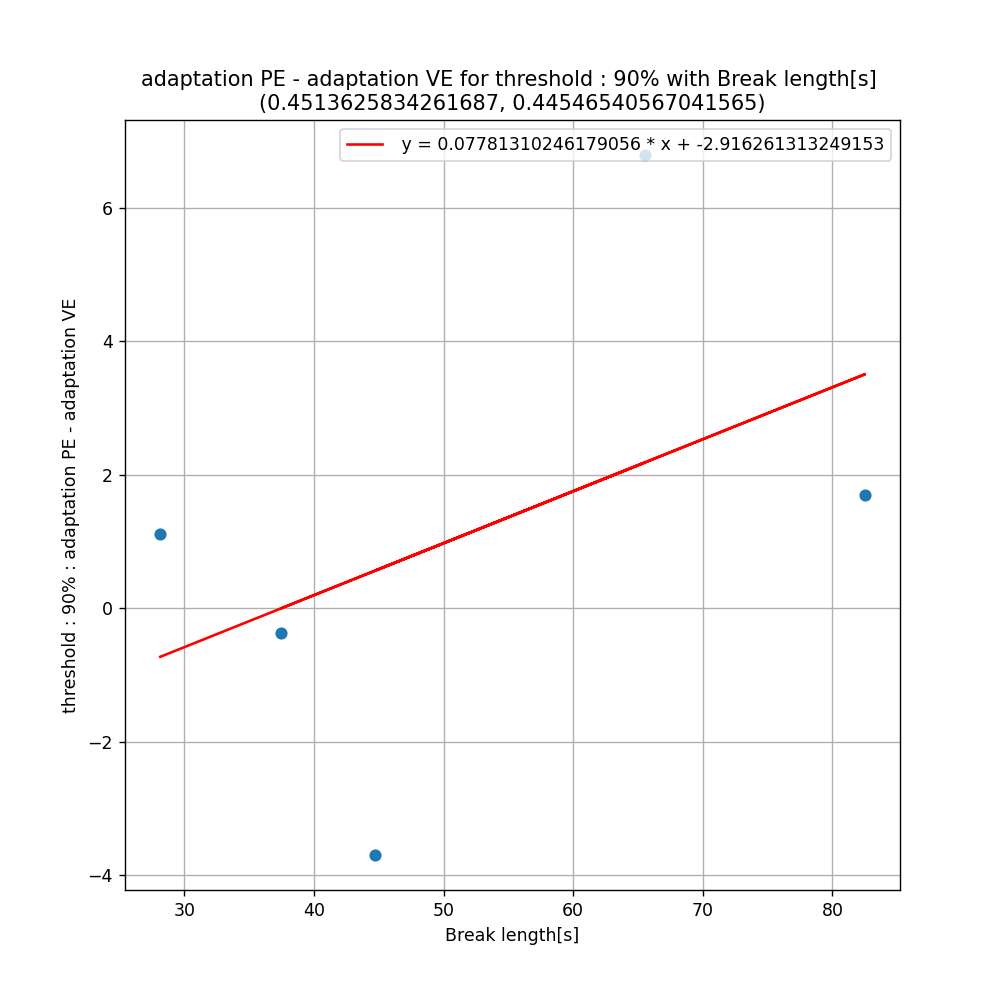

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.03494051002081941 (p = 0.955521414629247)
regressive line first order :  y = 0.009241164322147838 * x + 0.8516006671394856


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.017169525564716598 (p = 0.9781401552070448)
regressive line first order :  y = -0.0017231518611926927 * x + 1.1423732801403368


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for instruction - break : -0.40414574488935395
standard deviation for differences in Skin Conductance for instruction - break : 0.5360395926921621
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8234680891036987, pvalue=2.7998075324831007e-07)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=3.8245208402144644, pvalue=0.00013102666315449672)
__________________________________________________
Skew : -1.923677258222796
__________________________________________________


<IPython.core.display.Javascript object>


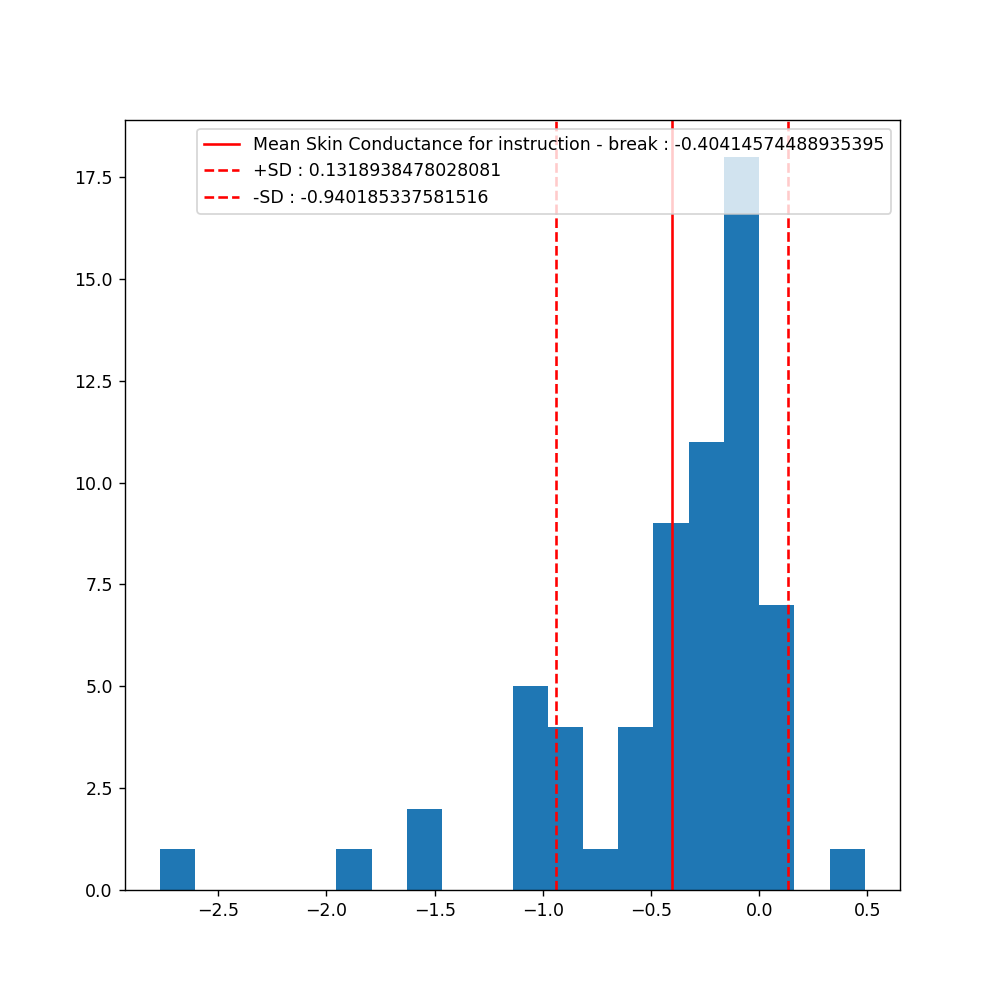

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for instruction - break : 

Ttest results : Ttest_relResult(statistic=-5.984273264398095, pvalue=1.128904761940322e-07)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=140.0, pvalue=1.7576449327996724e-09)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Skin Conductance :
pearson r = 0.10496707094480781 (p = 0.4091048626949124)
regressive line first order :  y = 0.004051010052285478 * x + -0.5573517802151869


<IPython.core.display.Javascript object>


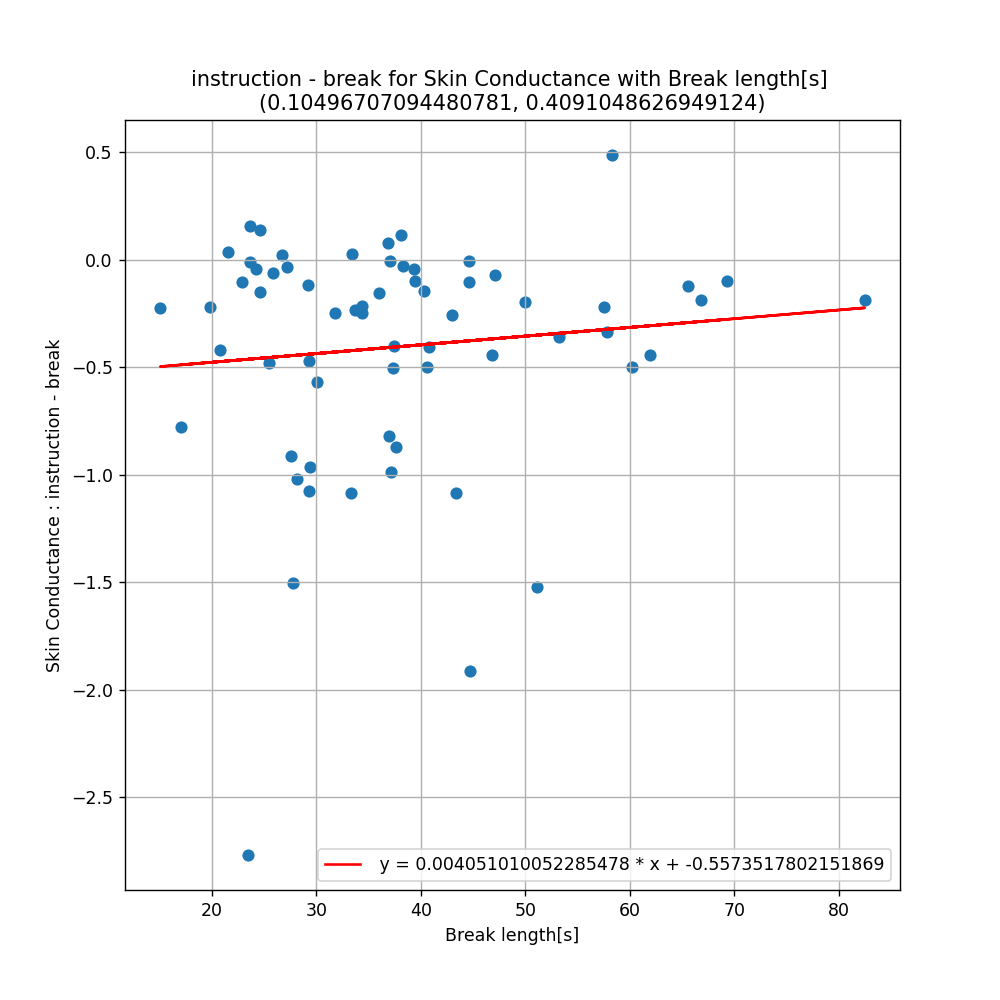

____________________________________________________________________________________________________
correlation for Age and instruction - break in Skin Conductance :
pearson r = -0.0010526908856824321 (p = 0.993413103417778)
regressive line first order :  y = -5.3844689568450106e-05 * x + -0.4025993927108097


<IPython.core.display.Javascript object>


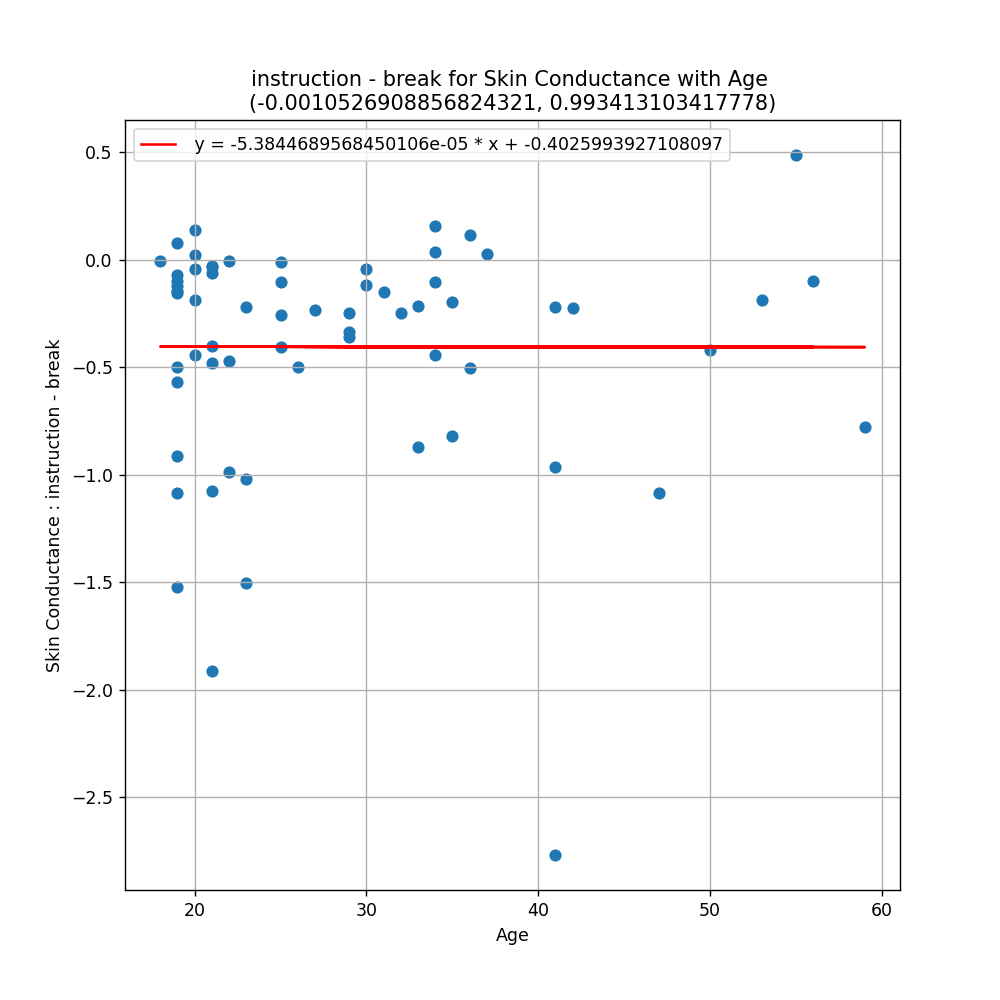

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Skin Conductance :
pearson r = 0.08090004790753993 (p = 0.5251105114489395)
regressive line first order :  y = 0.0018618613629713327 * x + -0.44149933848396605


<IPython.core.display.Javascript object>


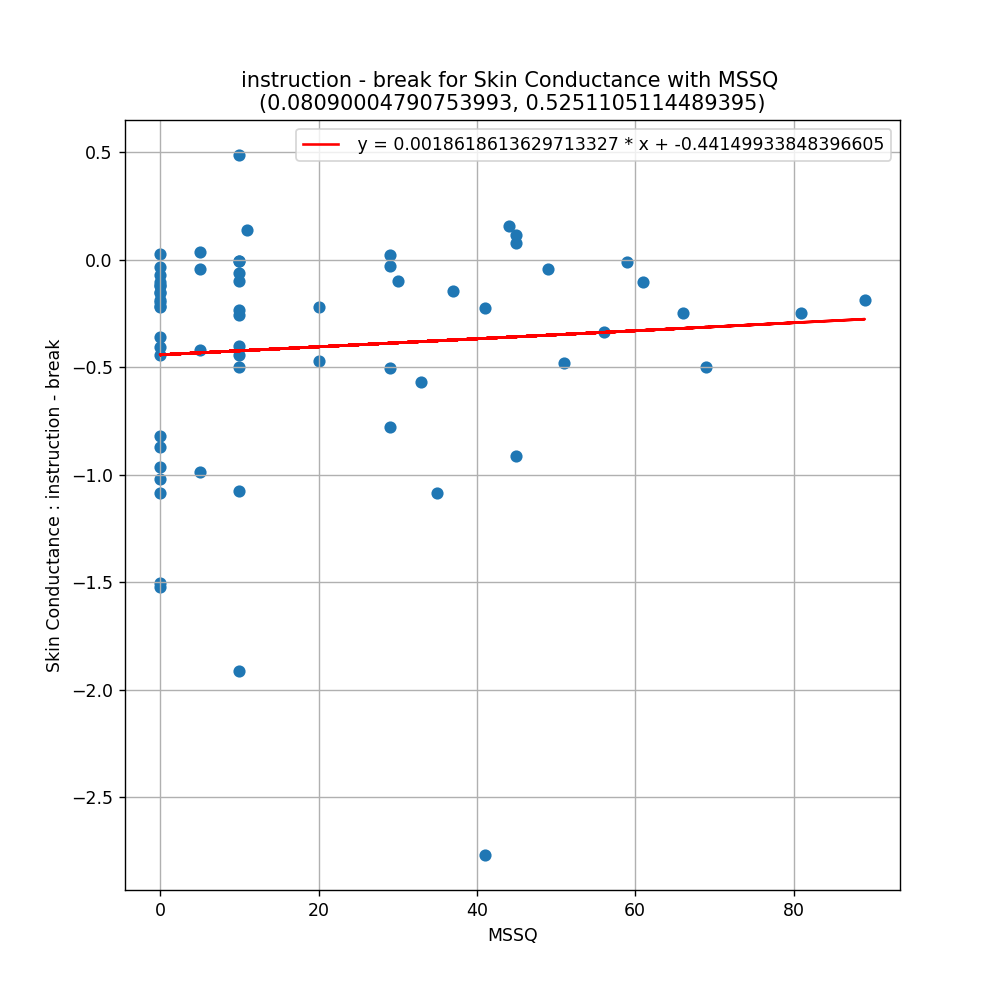




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for instruction - break : -2.3131436219466335
standard deviation for differences in Phasic Component for instruction - break : 5.18889058527904
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5529558658599854, pvalue=1.1516412823375788e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.036104573905845, pvalue=4.751010715433824e-07)
__________________________________________________
Skew : -3.2584888749295473
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for instruction - break : 

Ttest results : Ttest_relResult(statistic=-3.538330209433519, pvalue=0.0007624544221168367)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=200.0, pvalue=1.9373574696720898e-08)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Phasic Component :
pearson r = 0.10813174507214608 (p = 0.3950459850638382)
regressive line first order :  y = 0.04039625441412207 * x + -3.8408984043149674


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and instruction - break in Phasic Component :
pearson r = 0.07543436478313917 (p = 0.5535653683438613)
regressive line first order :  y = 0.037349852998329755 * x + -3.3857847127424145


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Phasic Component :
pearson r = -0.009175914172853558 (p = 0.942632148317975)
regressive line first order :  y = -0.002044210186753647 * x + -2.2721316550748876


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for instruction - break : 1.4821612215027704
standard deviation for differences in Tonic Component for instruction - break : 5.601800573609638
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5783933997154236, pvalue=2.8286932258342334e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.943369770894517, pvalue=7.67836483475594e-07)
__________________________________________________
Skew : 3.173512911878682
__________________________________________________


<IPython.core.display.Javascript object>


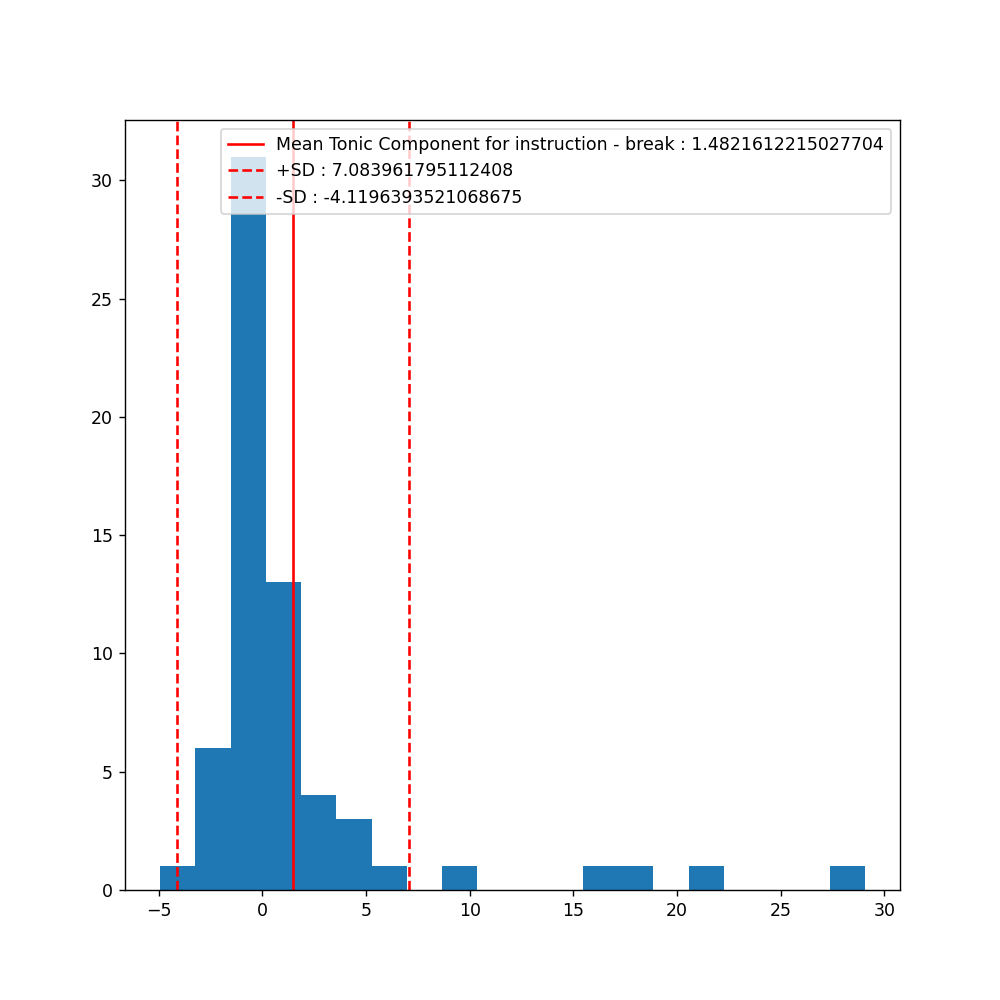

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for instruction - break : 

Ttest results : Ttest_relResult(statistic=2.100090824443539, pvalue=0.03973076449934634)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=1011.0, pvalue=0.8462247135727818)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Tonic Component :
pearson r = -0.1290462635440692 (p = 0.3094960685427498)
regressive line first order :  y = -0.05204589147047654 * x + 3.45049617606348


<IPython.core.display.Javascript object>


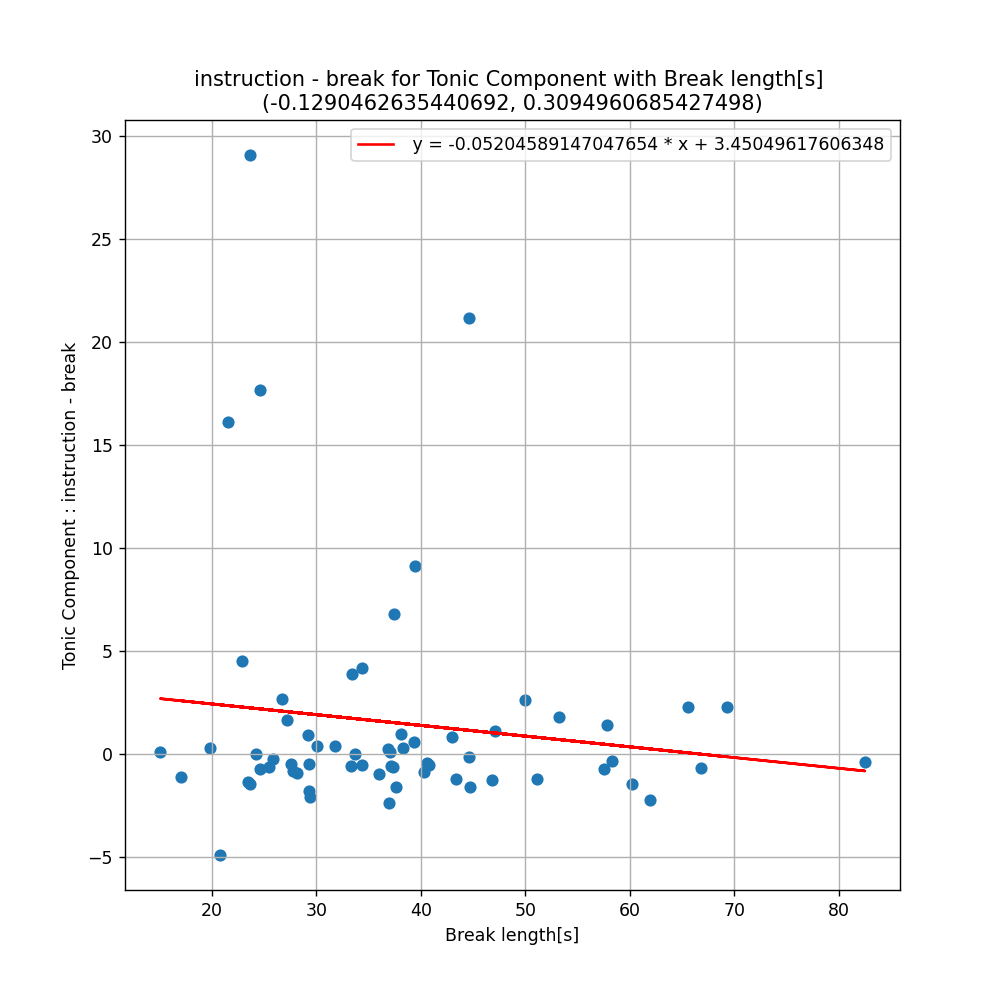

____________________________________________________________________________________________________
correlation for Age and instruction - break in Tonic Component :
pearson r = -0.07483196534126091 (p = 0.5567459975643289)
regressive line first order :  y = -0.039999995390283545 * x + 2.6309110891174745


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Tonic Component :
pearson r = 0.01957894056408199 (p = 0.8779573749258435)
regressive line first order :  y = 0.0047088897678885236 * x + 1.3876891205345065


<IPython.core.display.Javascript object>


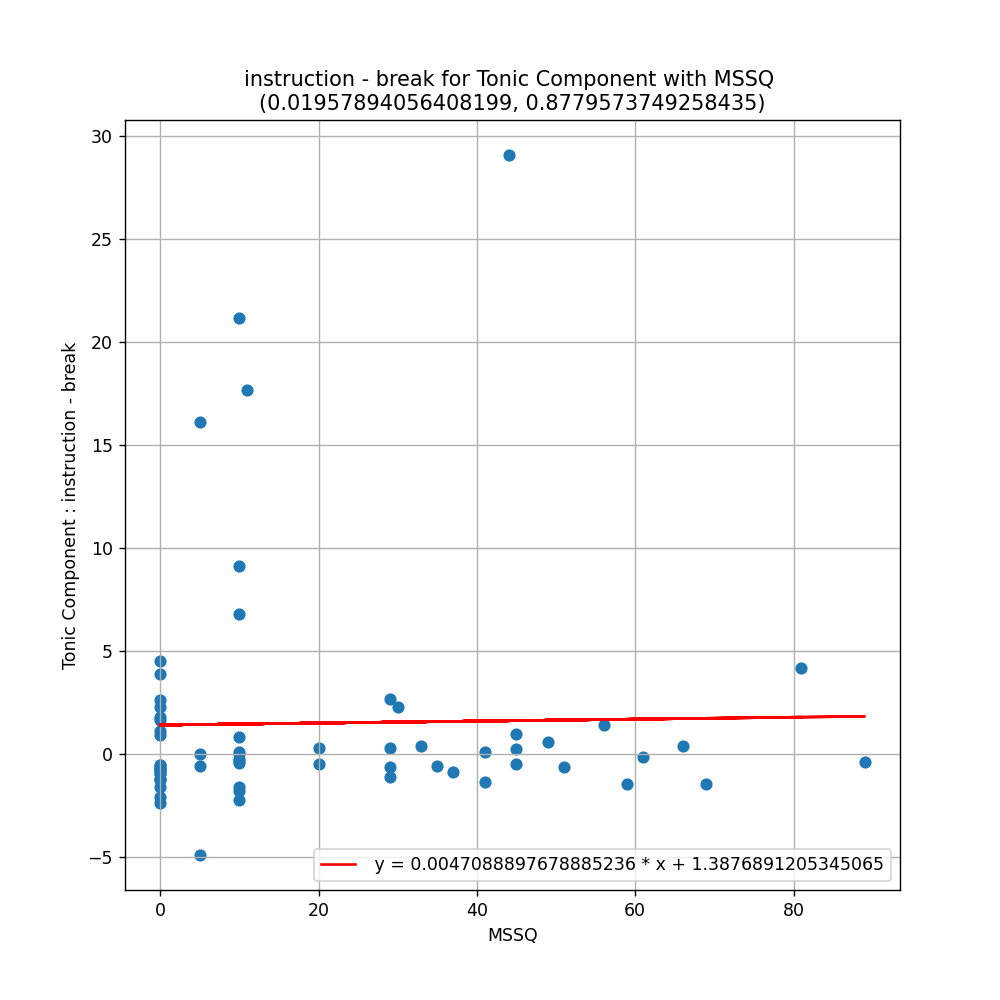




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for instruction - break : -14.968774038501737
standard deviation for differences in HR[1] for instruction - break : 17.984629792583238
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8593689799308777, pvalue=3.201282197551336e-06)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.731680270362165, pvalue=0.006301225823510125)
__________________________________________________
Skew : -0.6178015882858184
__________________________________________________


<IPython.core.display.Javascript object>


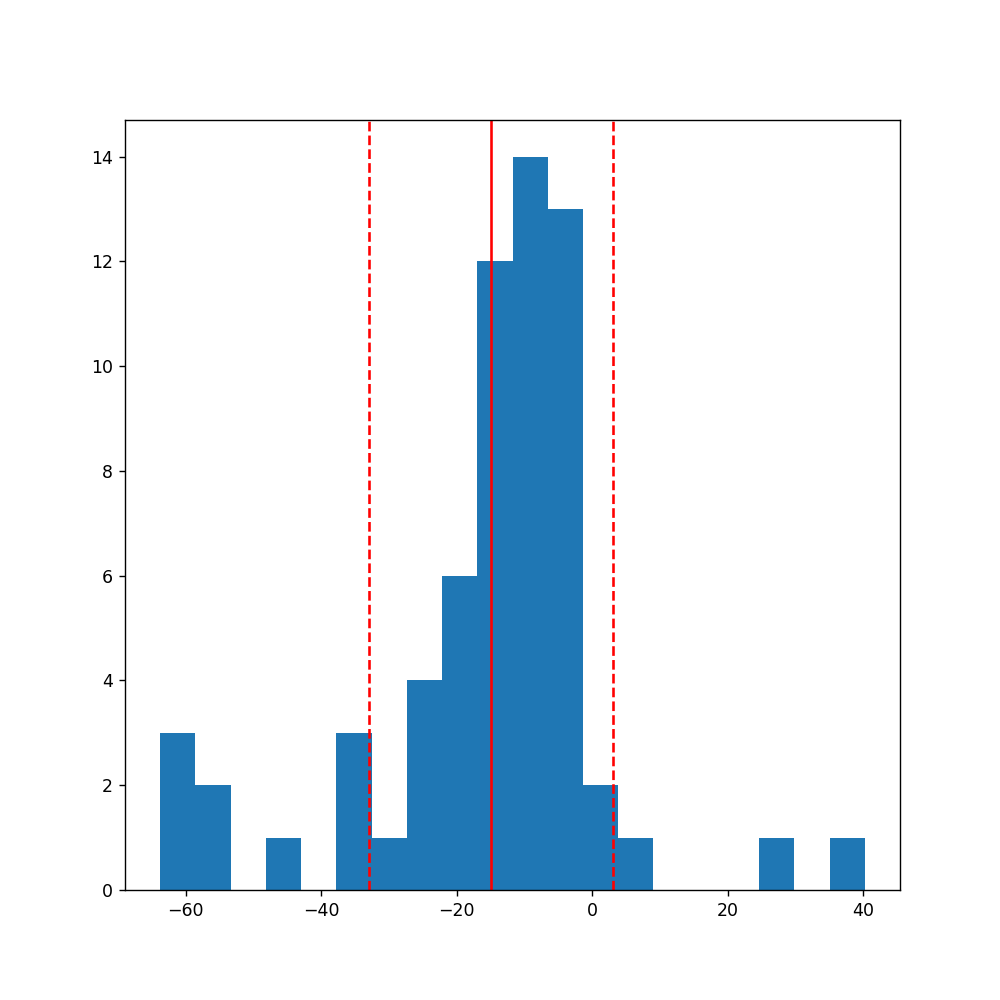

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for instruction - break : 

Ttest results : Ttest_relResult(statistic=-6.60625000249845, pvalue=9.656036140112103e-09)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=123.0, pvalue=8.654036635008001e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.09221172060061006 (p = 0.46863574395300606)
regressive line first order :  y = 0.11939908589080062 * x + -19.48435418635595


<IPython.core.display.Javascript object>


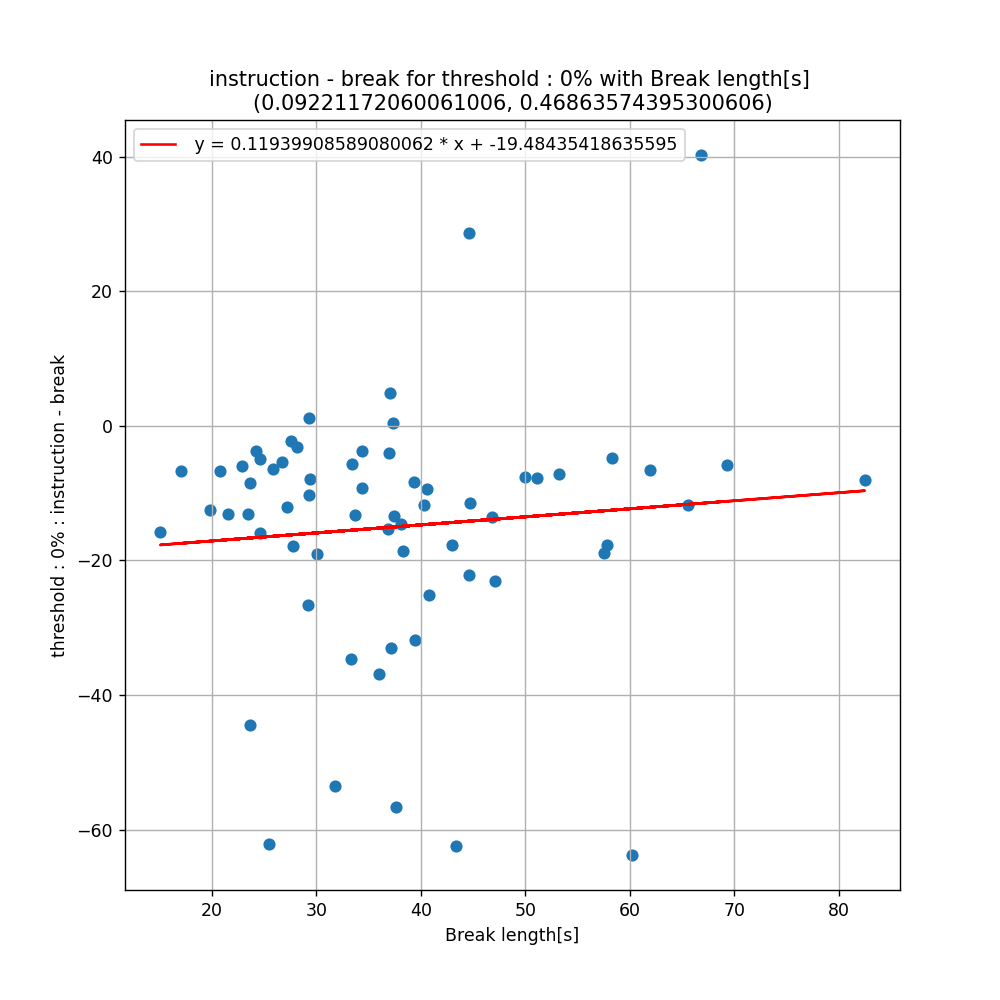

____________________________________________________________________________________________________
correlation for Age and instruction - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.02466954279818764 (p = 0.8465705296356542)
regressive line first order :  y = 0.04233579790599054 * x + -16.18460523461439


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.2319534447136433 (p = 0.06514005305820197)
regressive line first order :  y = -0.17910347875839785 * x + -11.375510495911373


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 9%] for instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 9%] for instruction - break : -14.71455689216395
standard deviation for differences in HR[0.9] for instruction - break : 12.59928535818303
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8213378190994263, pvalue=9.57415068114642e-07)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=3.1752781236165846, pvalue=0.001496929502456302)
__________________________________________________
Skew : -1.8006258429749622
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 9% for instruction - break : 

Ttest results : Ttest_relResult(statistic=-8.661290816075827, pvalue=7.390310765676266e-12)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=3.0, pvalue=8.880118337733133e-11)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.1083923480154099 (p = 0.4265051236076558)
regressive line first order :  y = 0.09919574895431138 * x + -18.395091162427487


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and instruction - break in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.24783974911993092 (p = 0.06552183359672469)
regressive line first order :  y = 0.296173921021958 * x + -23.361777622001473


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Heart Rate(HR)[threshold : 9%] :
pearson r = -0.2223433758247007 (p = 0.09955258306805641)
regressive line first order :  y = -0.12039550302033838 * x + -12.216350204491935


<IPython.core.display.Javascript object>


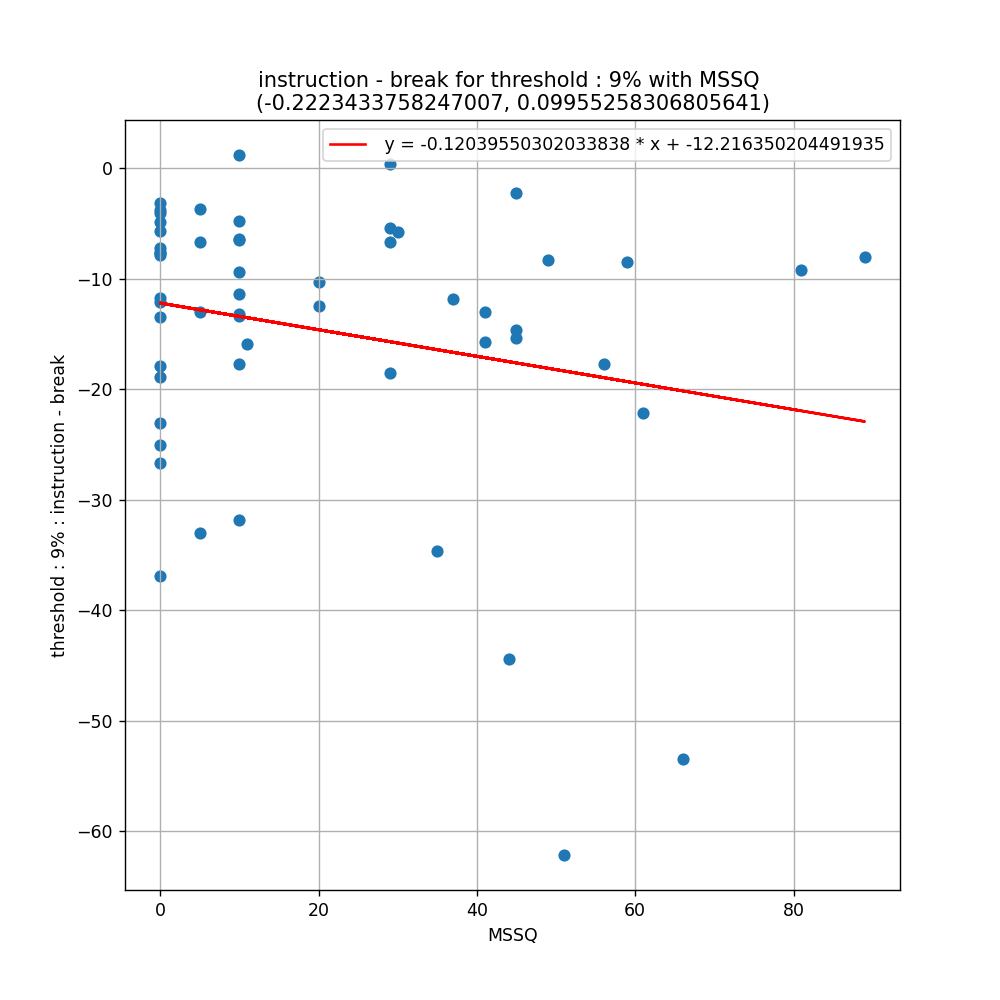




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 50%] for instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 50%] for instruction - break : -10.05218769555063
standard deviation for differences in HR[0.5] for instruction - break : 6.1096656520340975
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9744642376899719, pvalue=0.5767477750778198)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=0.32965276675347893, pvalue=0.7416623470569804)
__________________________________________________
Skew : -0.4102588035848532
__________________________________________________


<IPython.core.display.Javascript object>


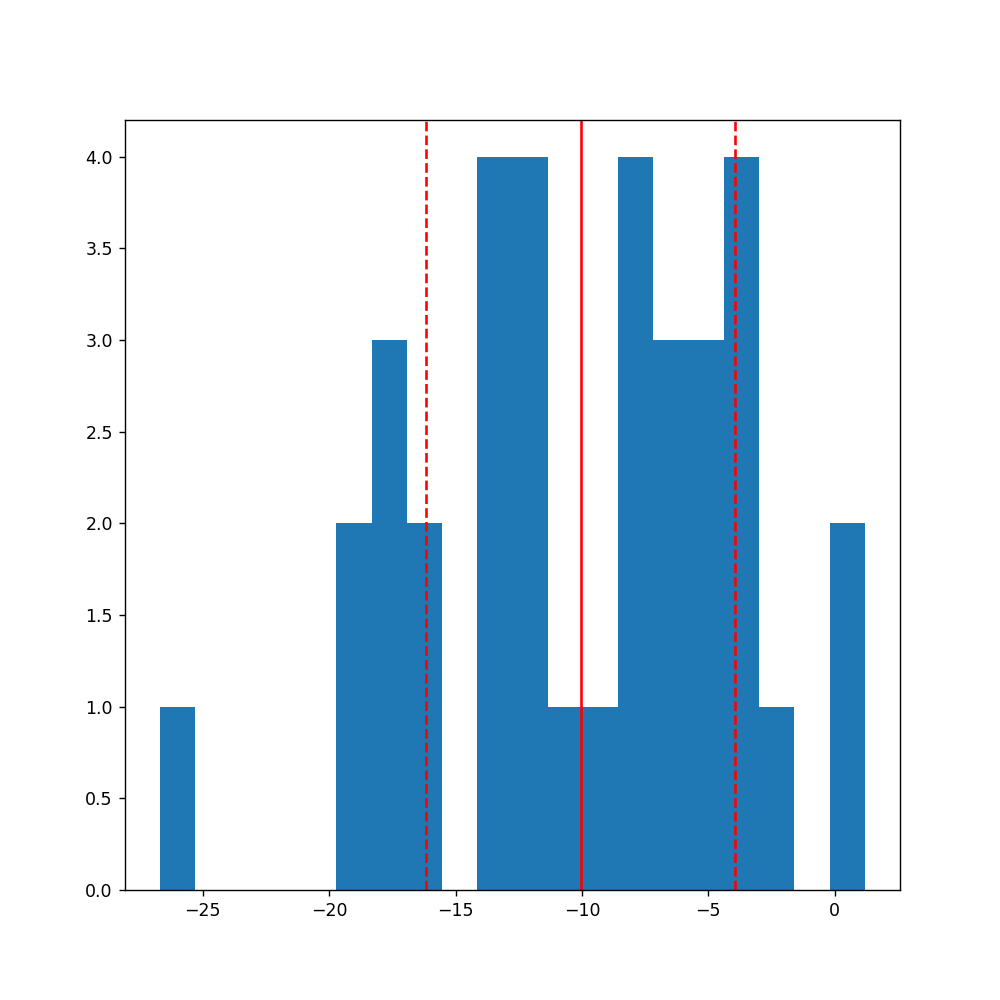

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 50% for instruction - break : 

Ttest results : Ttest_relResult(statistic=-9.593622012883344, pvalue=3.338578877137246e-11)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=3.0, pvalue=3.21660235864676e-07)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.0195628421710153 (p = 0.9111860425041008)
regressive line first order :  y = 0.007352946171776947 * x + -10.334696290837357


<IPython.core.display.Javascript object>


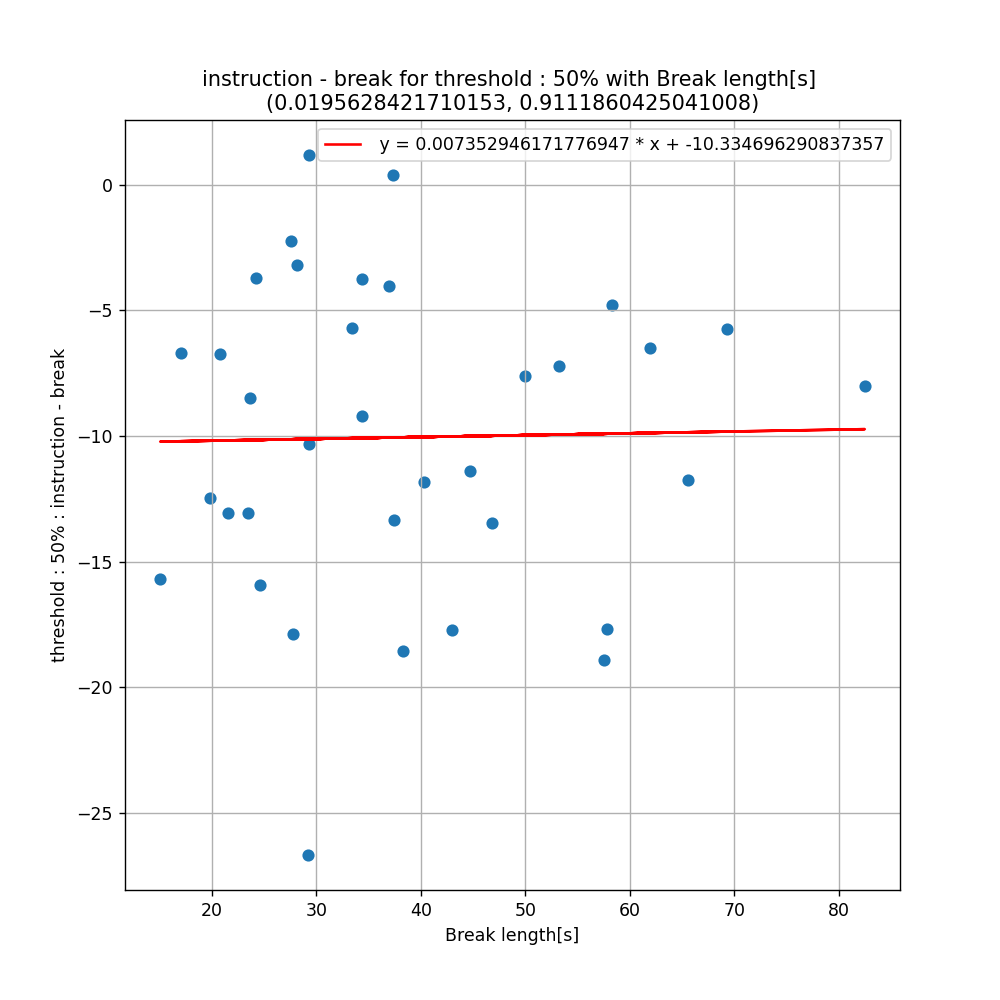

____________________________________________________________________________________________________
correlation for Age and instruction - break in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.22475370082391466 (p = 0.19426934379638847)
regressive line first order :  y = 0.11883176517287398 * x + -13.831037828048029


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Heart Rate(HR)[threshold : 50%] :
pearson r = 0.024376760098561174 (p = 0.8894518574965075)
regressive line first order :  y = 0.006360121214528381 * x + -10.17793637784931


<IPython.core.display.Javascript object>


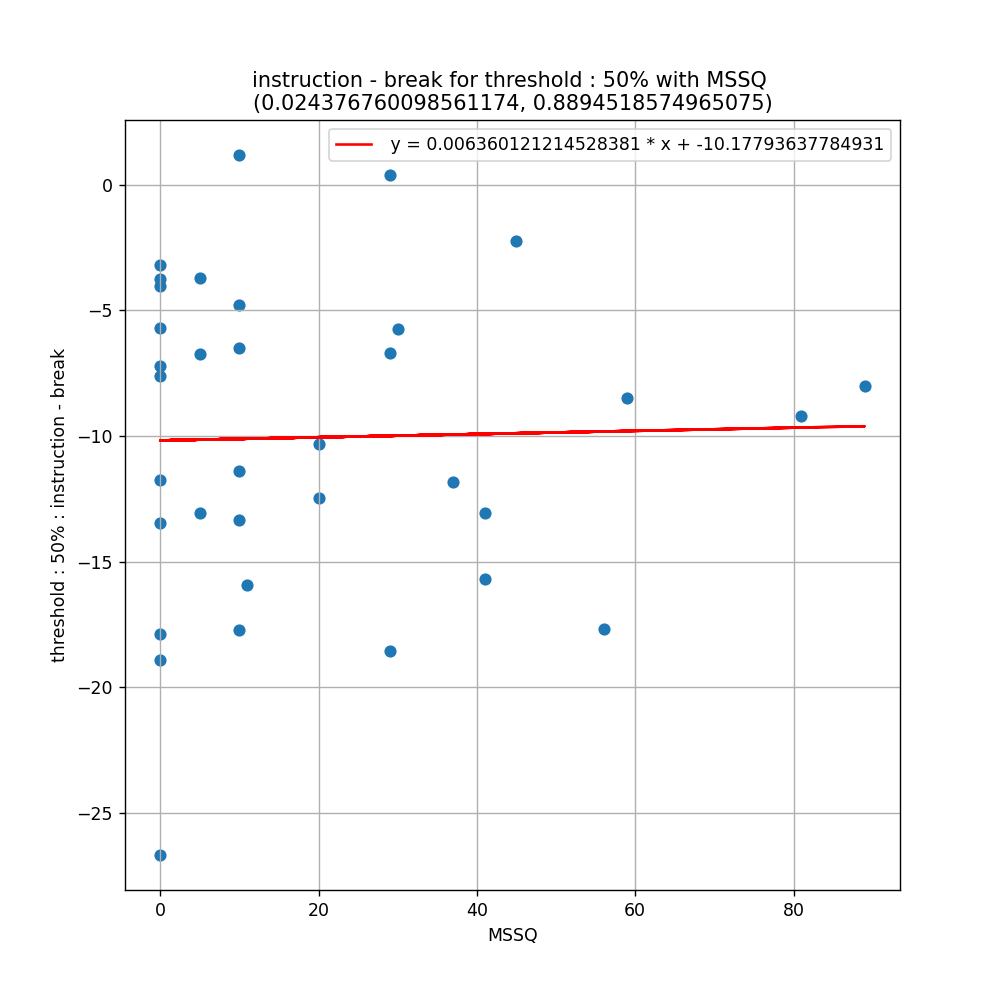




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 90%] for instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 90%] for instruction - break : -9.53672290364467
standard deviation for differences in HR[0.1] for instruction - break : 3.6233332372614484
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8950603008270264, pvalue=0.38318881392478943)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=0.41024448808797165, pvalue=0.6816266090403336)
__________________________________________________
Skew : 0.7856190341524252
__________________________________________________


C:\Users\Krzyniu\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=5
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<IPython.core.display.Javascript object>


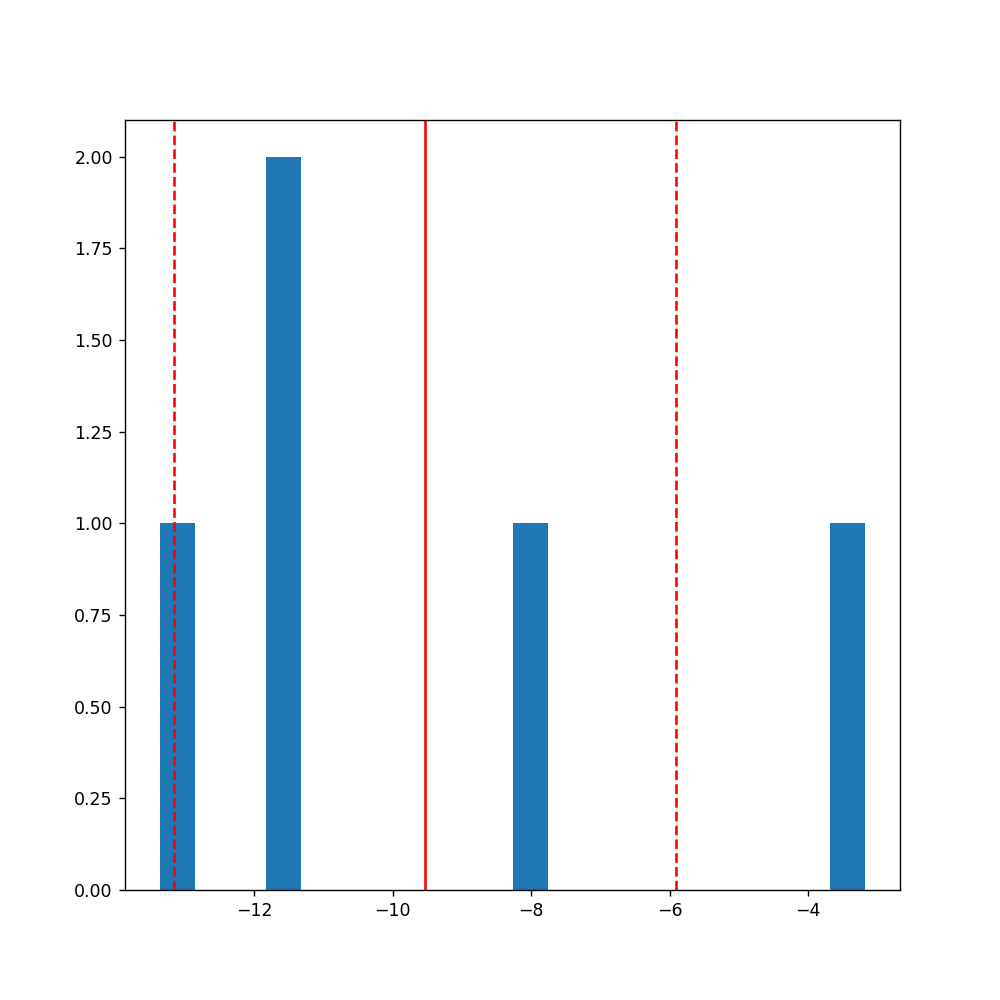

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 90% for instruction - break : 

Ttest results : Ttest_relResult(statistic=-5.264060619968048, pvalue=0.006237255803204973)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=0.0625)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.18335134990635685 (p = 0.767864497498319)
regressive line first order :  y = -0.03366680107530871 * x + -7.796957291277017


<IPython.core.display.Javascript object>


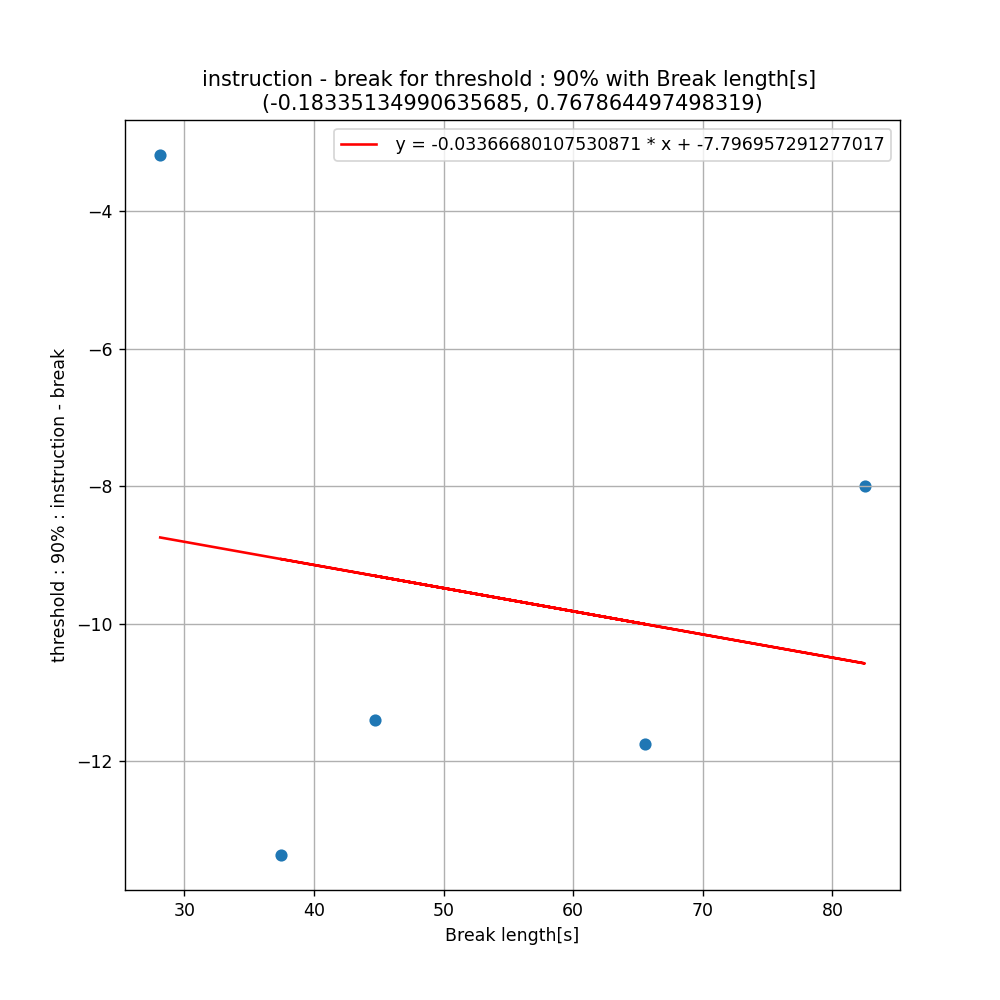

____________________________________________________________________________________________________
correlation for Age and instruction - break in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.2845458428853254 (p = 0.6426550945252999)
regressive line first order :  y = 0.08015677991413198 * x + -11.733018673291891


<IPython.core.display.Javascript object>


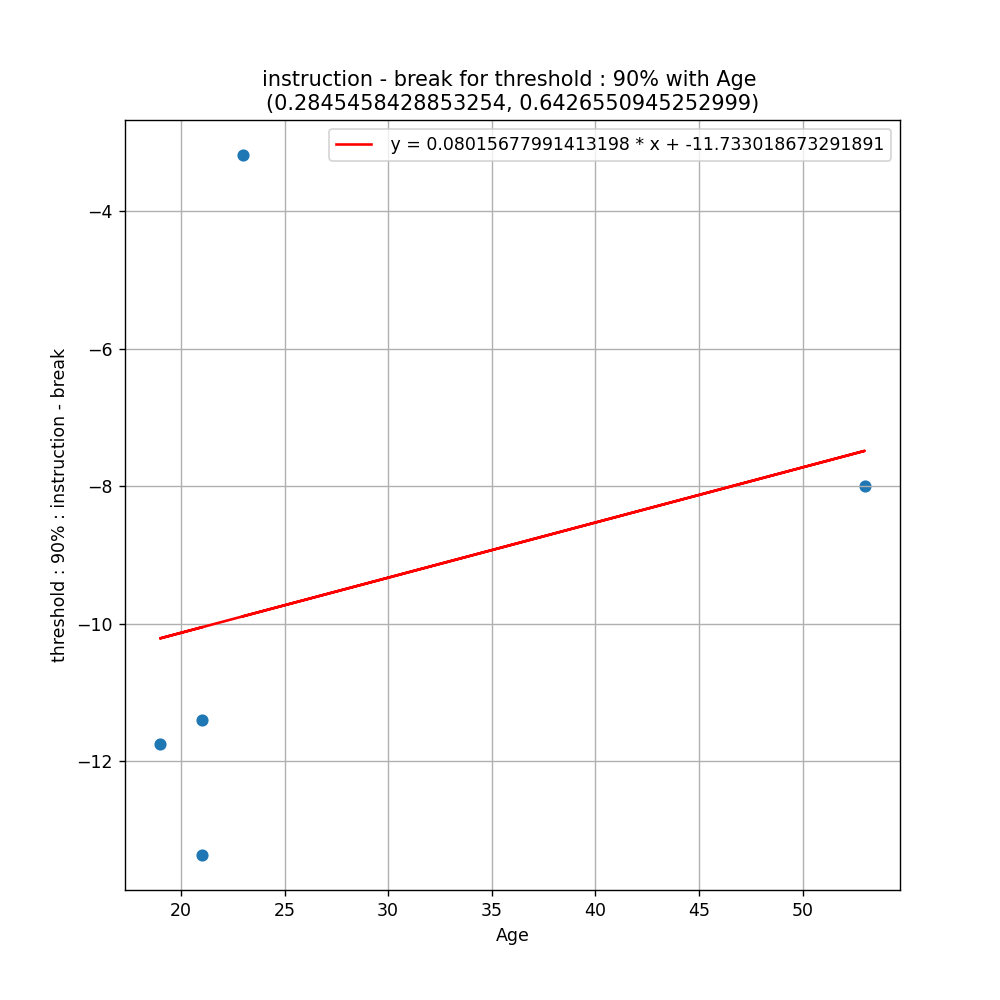

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Heart Rate(HR)[threshold : 90%] :
pearson r = 0.1302379447537478 (p = 0.8346458811042021)
regressive line first order :  y = 0.01392173482600168 * x + -9.84021672285151


<IPython.core.display.Javascript object>


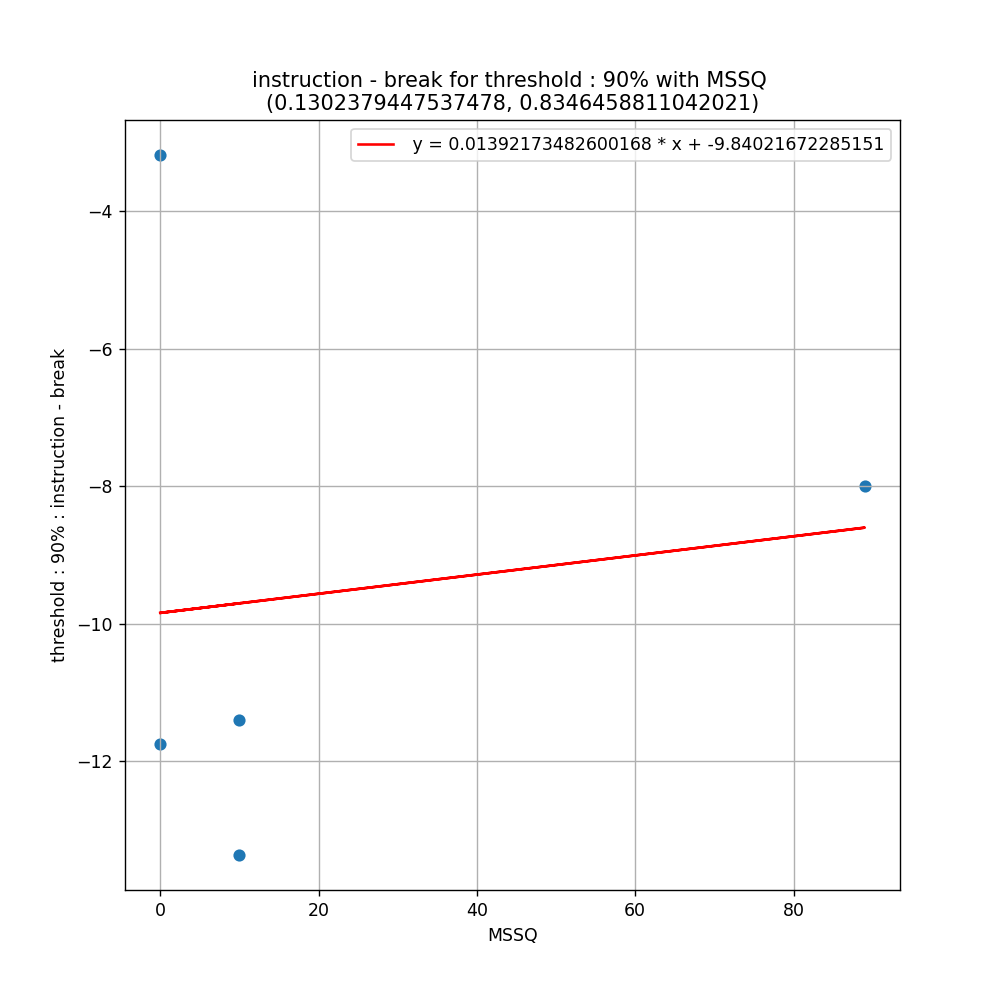




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for instruction - adaptation VE : -0.21131914931388346
standard deviation for differences in Skin Conductance for instruction - adaptation VE : 0.3643904832279706
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9540634155273438, pvalue=0.018221784383058548)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=1.5576741378995747, pvalue=0.11931051418163126)
__________________________________________________
Skew : -0.7926019908207348
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-4.603011950785312, pvalue=2.0700622492450034e-05)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=417.0, pvalue=3.095623039605578e-05)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Skin Conductance :
pearson r = -0.20896652730649212 (p = 0.09749232737241775)
regressive line first order :  y = -0.005482228401422949 * x + -0.003985554163006124


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Skin Conductance :
pearson r = 0.14288347733082568 (p = 0.26002605969373366)
regressive line first order :  y = 0.004968144090907025 * x + -0.3539980374246194


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Skin Conductance :
pearson r = 0.017601454461666714 (p = 0.8902032715414826)
regressive line first order :  y = 0.0002753704122016278 * x + -0.21684376820867848


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for instruction - adaptation VE : 0.9431840361068242
standard deviation for differences in Phasic Component for instruction - adaptation VE : 2.4923945138059085
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.44935137033462524, pvalue=4.141976881920015e-14)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.635651902352348, pvalue=1.7439733948080454e-08)
__________________________________________________
Skew : 4.1233048209851875
__________________________________________________


<IPython.core.display.Javascript object>


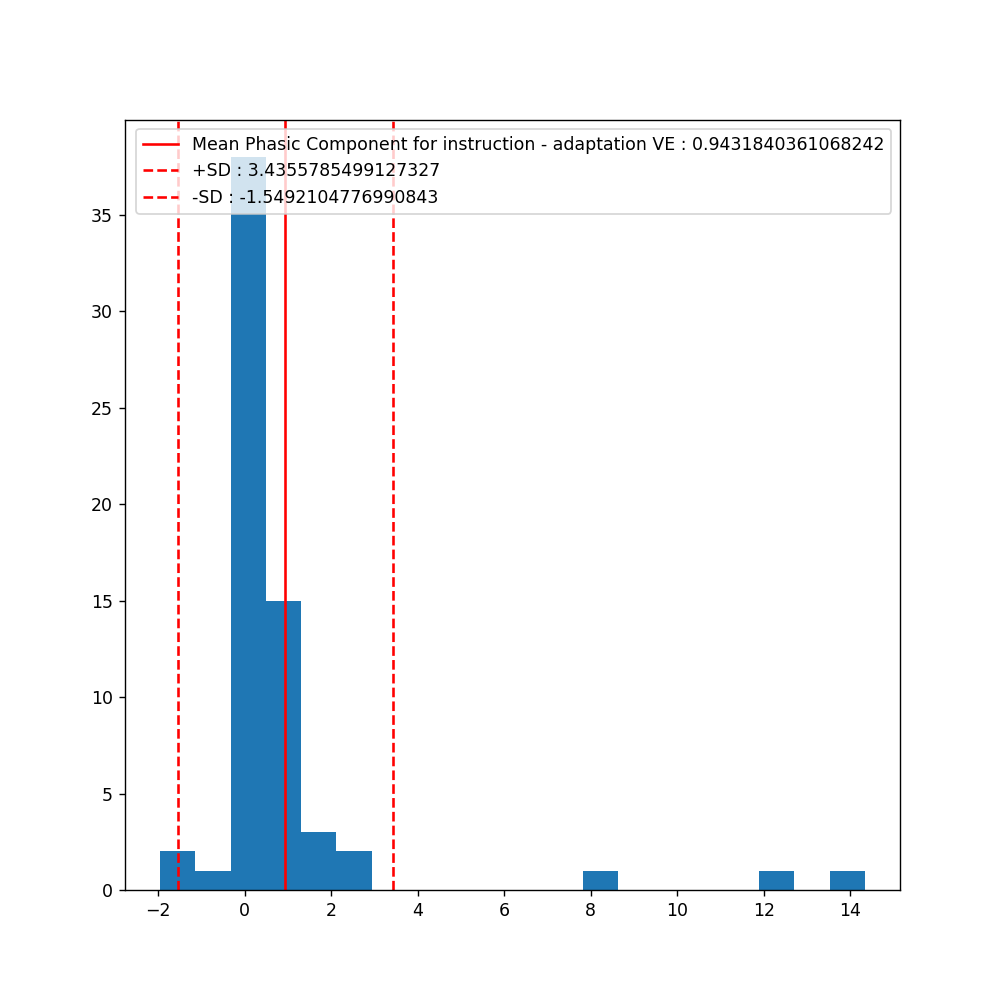

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=3.0036541802857823, pvalue=0.0038235529074255145)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=195.0, pvalue=1.5957142030065998e-08)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Phasic Component :
pearson r = -0.1688950939129351 (p = 0.18215878835806035)
regressive line first order :  y = -0.030307296285357988 * x + 2.0893823040438395


<IPython.core.display.Javascript object>


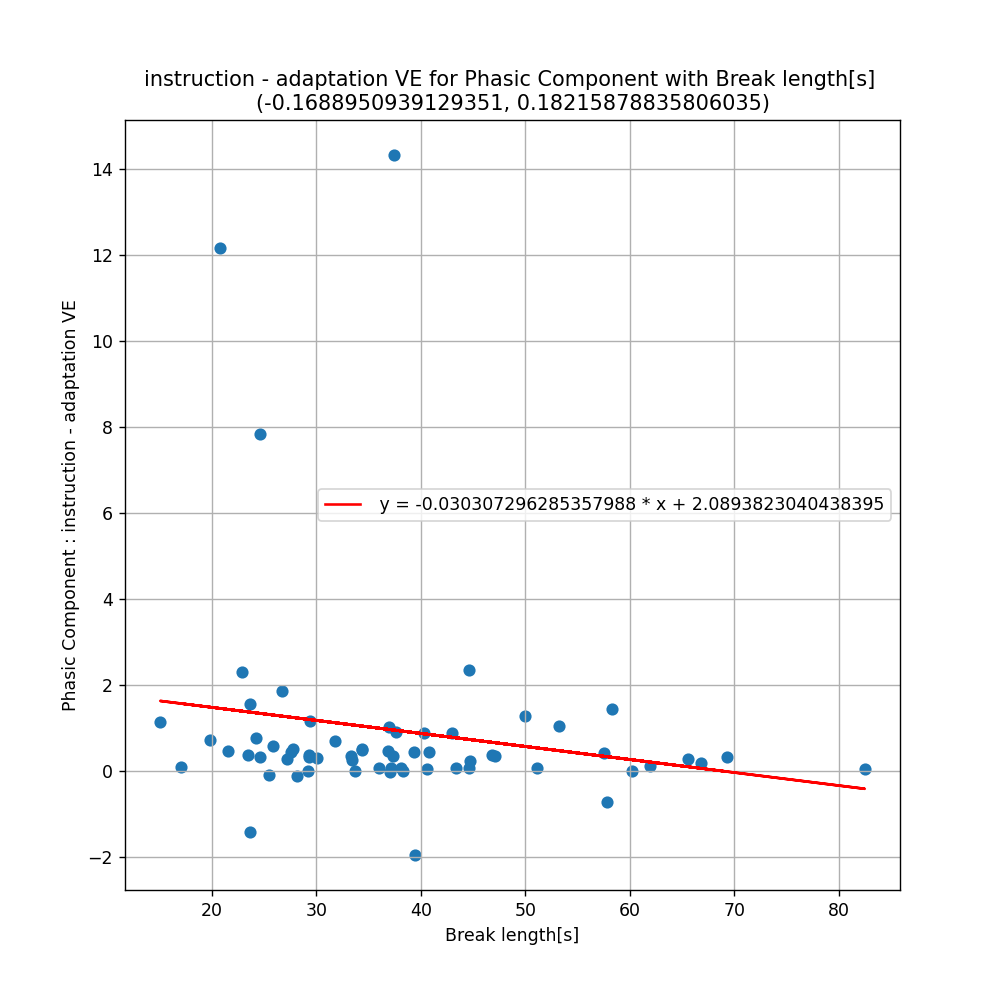

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Phasic Component :
pearson r = 0.06786012880827275 (p = 0.5941747356711409)
regressive line first order :  y = 0.016138999660160126 * x + 0.4796921396166003


<IPython.core.display.Javascript object>


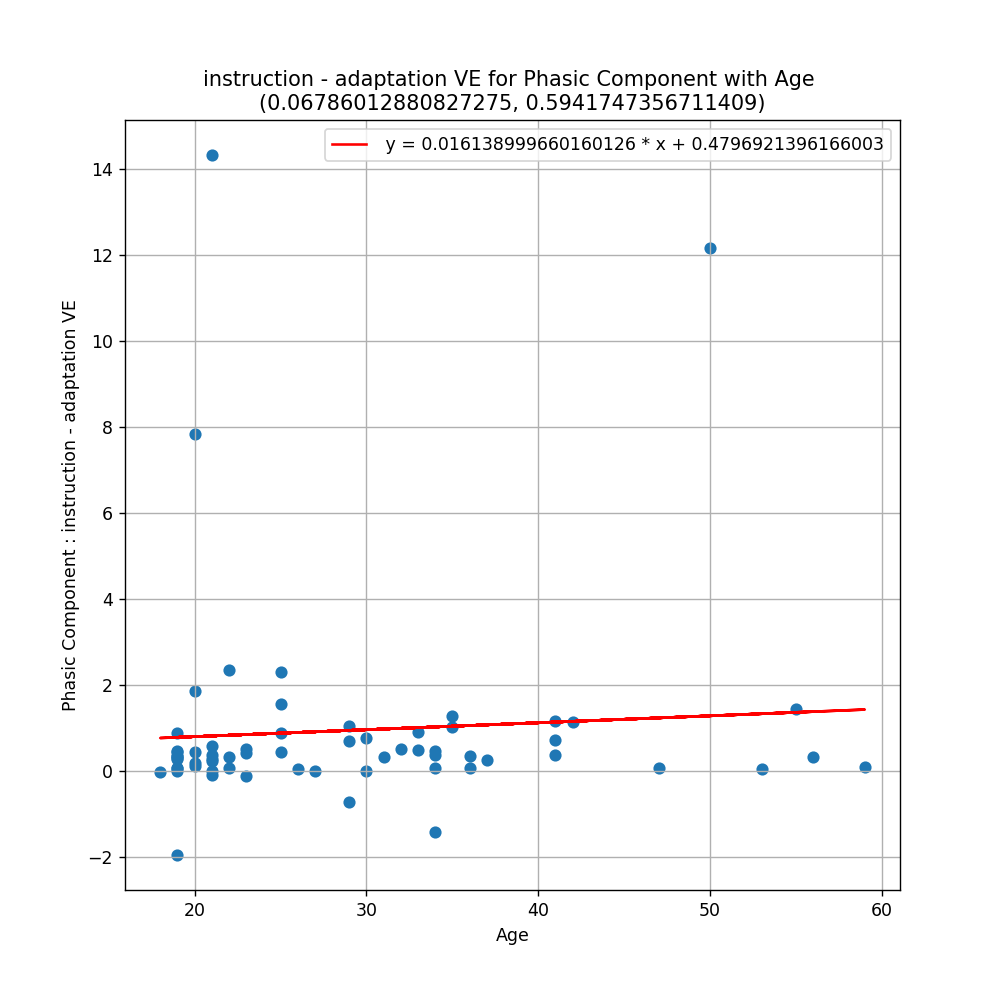

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Phasic Component :
pearson r = -0.1372131136655733 (p = 0.2796109323660665)
regressive line first order :  y = -0.014682976322928285 * x + 1.2377612485855725


<IPython.core.display.Javascript object>


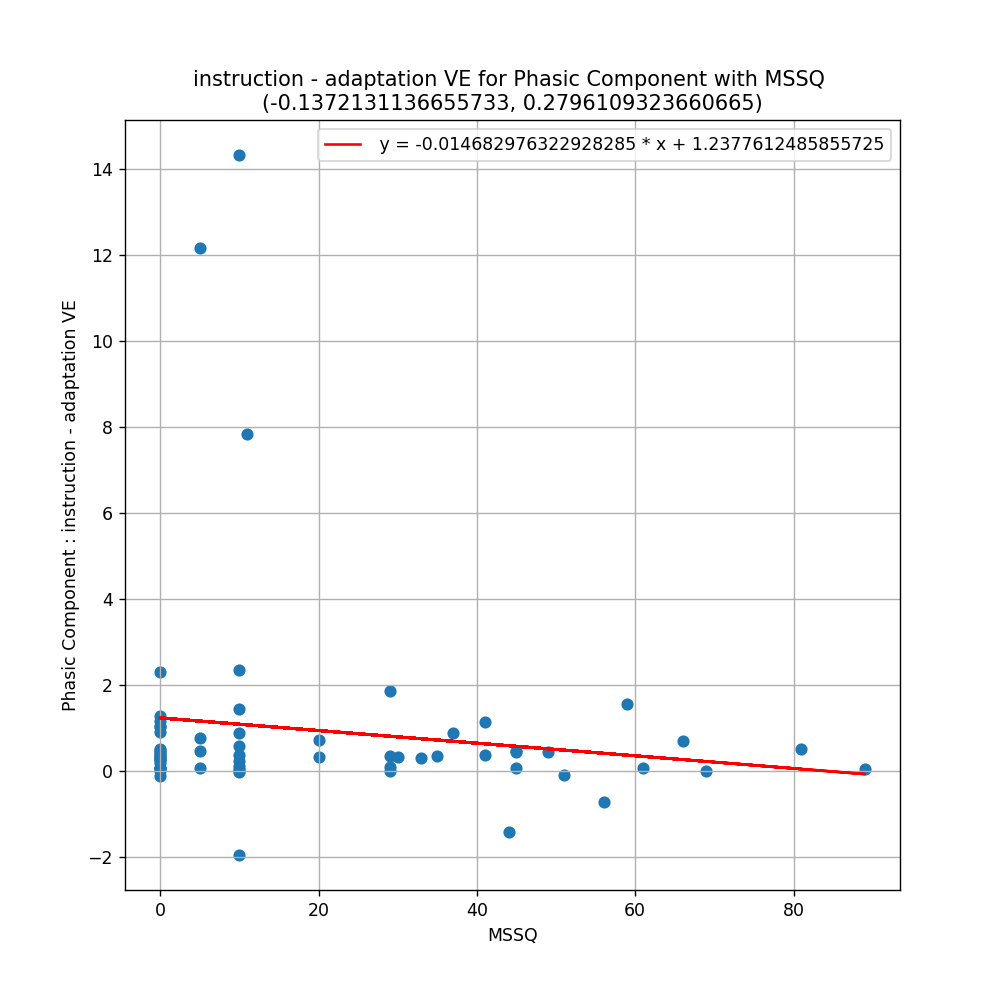




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for instruction - adaptation VE : -1.5949910101448315
standard deviation for differences in Tonic Component for instruction - adaptation VE : 2.4518956763160484
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5671716928482056, pvalue=1.8942753182010774e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.732440153006553, pvalue=9.899596980085408e-09)
__________________________________________________
Skew : -4.015532215344958
__________________________________________________


<IPython.core.display.Javascript object>


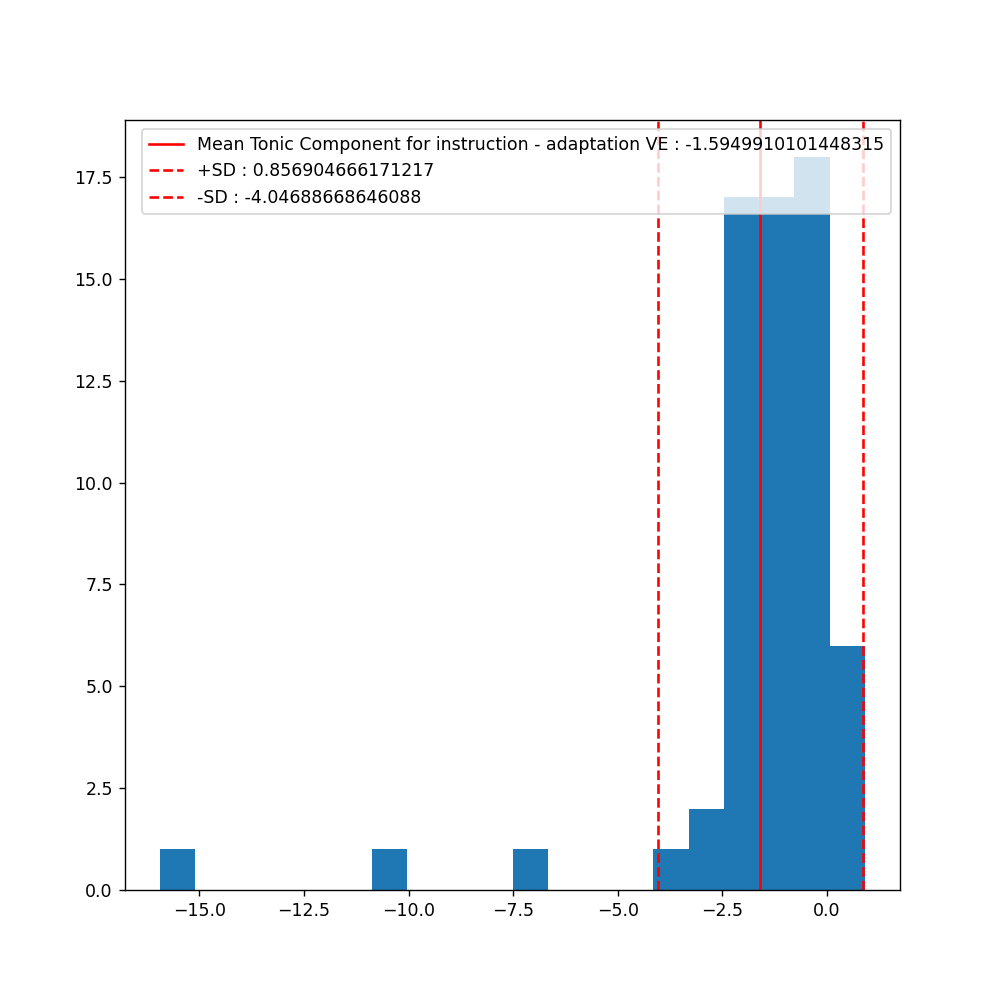

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-5.163290098745998, pvalue=2.640929922791321e-06)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=80.0, pvalue=1.362703043012955e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Tonic Component :
pearson r = 0.02926604068051169 (p = 0.8184313746239368)
regressive line first order :  y = 0.005166296574272427 * x + -1.7903763104146153


<IPython.core.display.Javascript object>


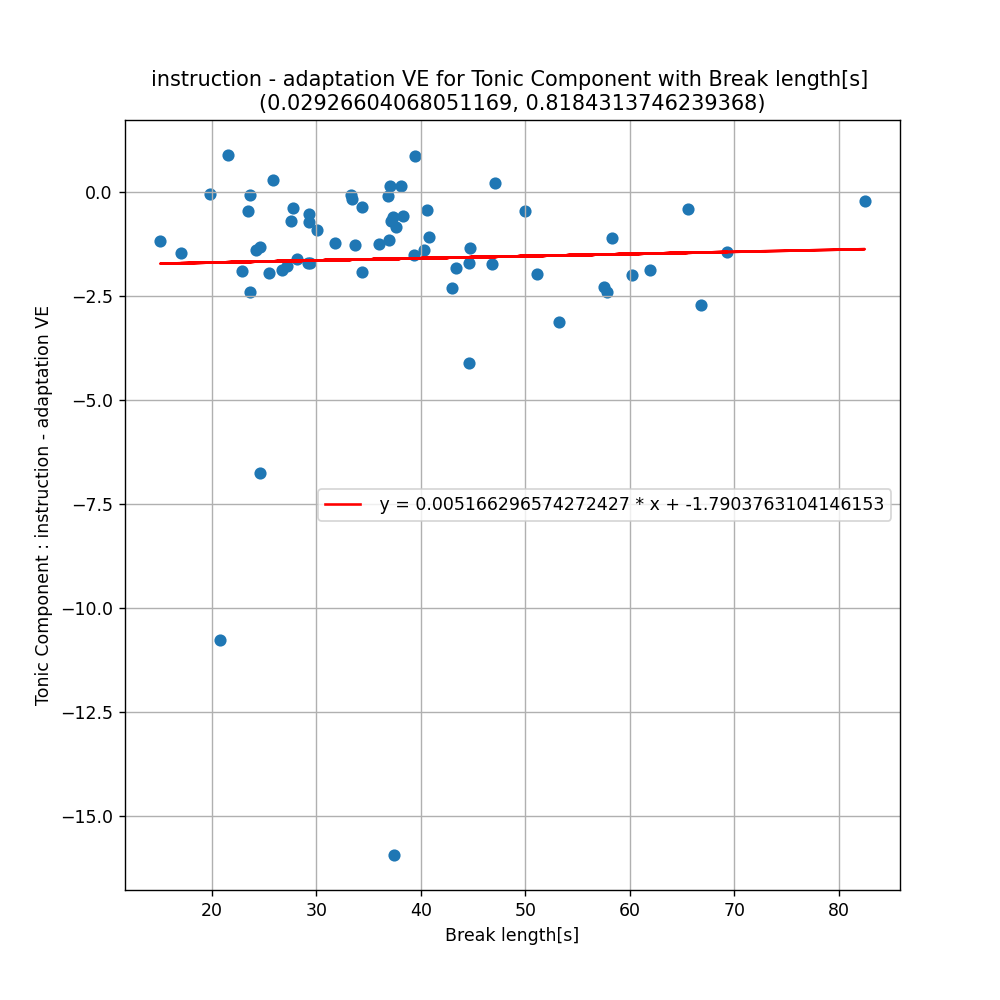

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Tonic Component :
pearson r = -0.0046911424706981425 (p = 0.9706527203250558)
regressive line first order :  y = -0.0010975536457651636 * x + -1.5634706413805124


<IPython.core.display.Javascript object>


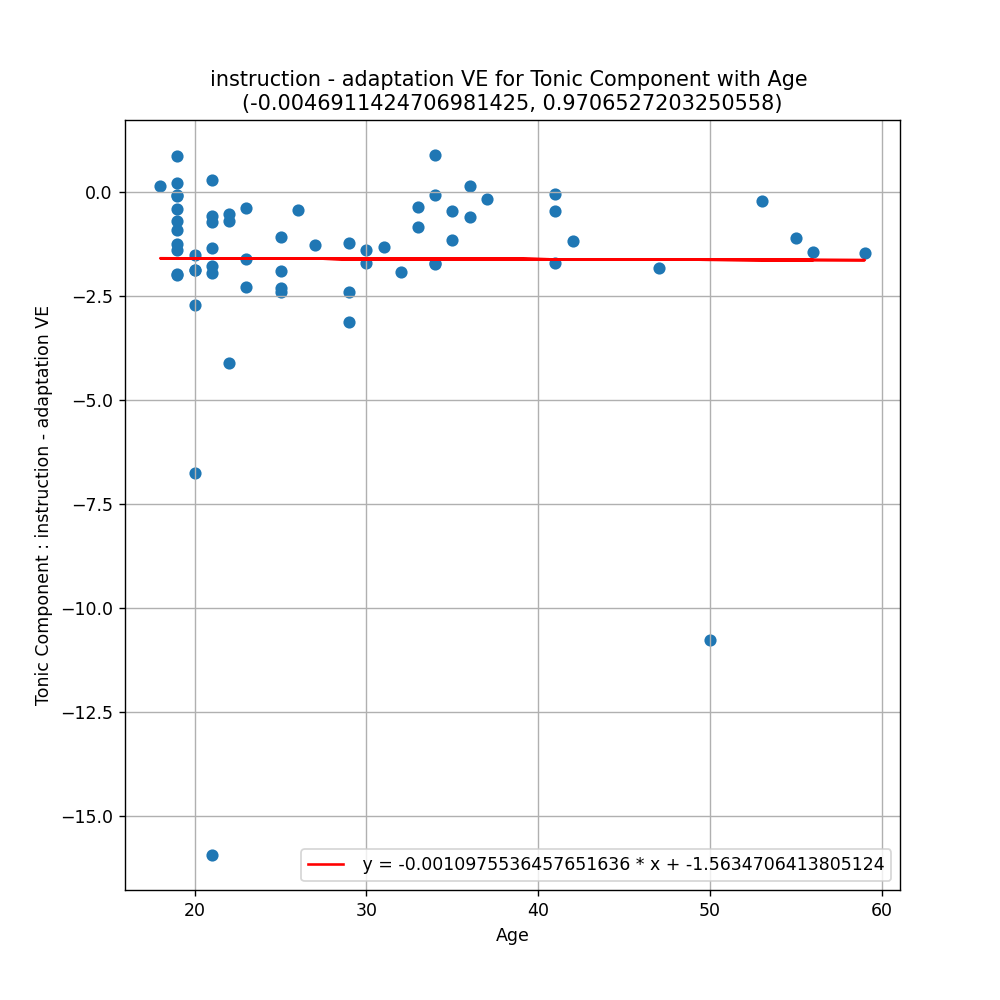

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Tonic Component :
pearson r = 0.09053853233642986 (p = 0.47677694022933664)
regressive line first order :  y = 0.009530970607868654 * x + -1.7862061079651956


<IPython.core.display.Javascript object>


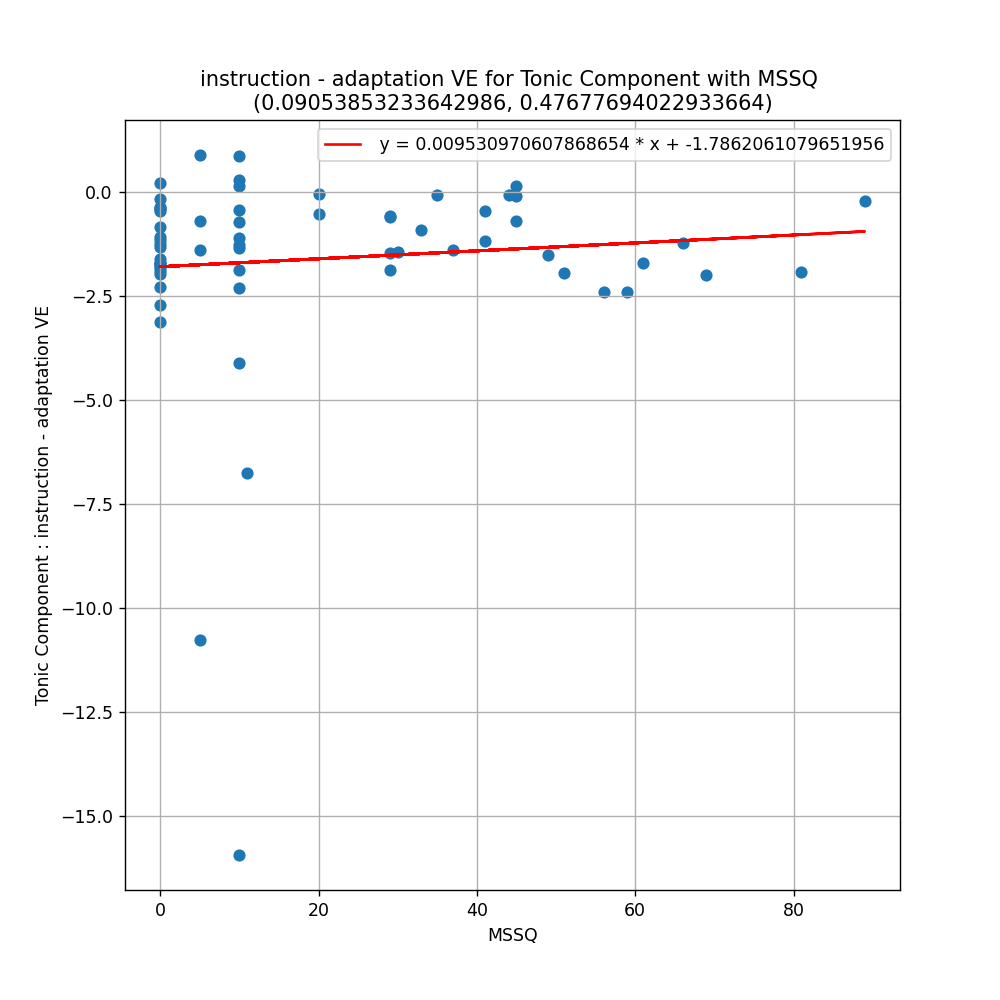




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for instruction - adaptation VE : 1.2366767262375506
standard deviation for differences in HR[1] for instruction - adaptation VE : 20.54475290004109
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.7100059390068054, pvalue=6.068925917368517e-10)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.7659693216883685, pvalue=1.8794785774867397e-06)
__________________________________________________
Skew : -1.267607737897151
__________________________________________________


<IPython.core.display.Javascript object>


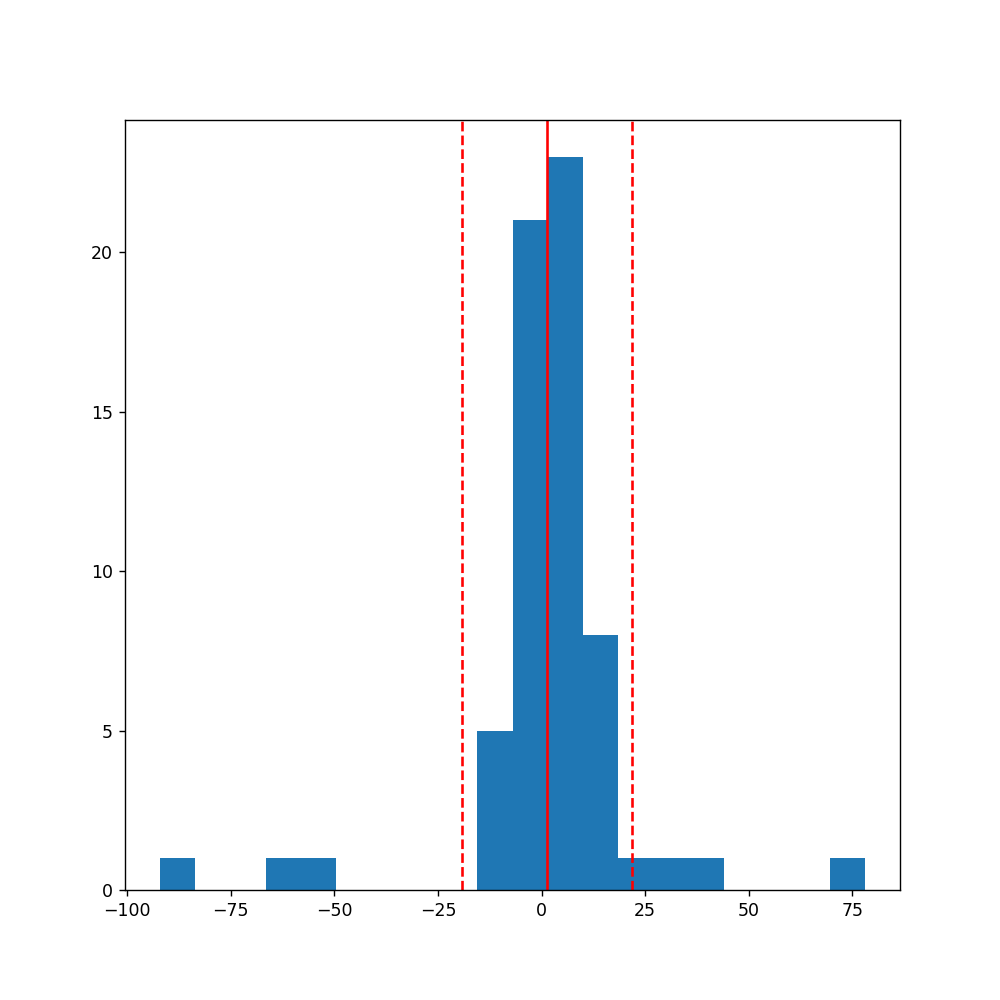

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=0.4777773311354142, pvalue=0.6344622958755326)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=692.0, pvalue=0.0199518762104551)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.051802250444090786 (p = 0.6843581447055661)
regressive line first order :  y = 0.07662366538377605 * x + -1.661170436338277


<IPython.core.display.Javascript object>


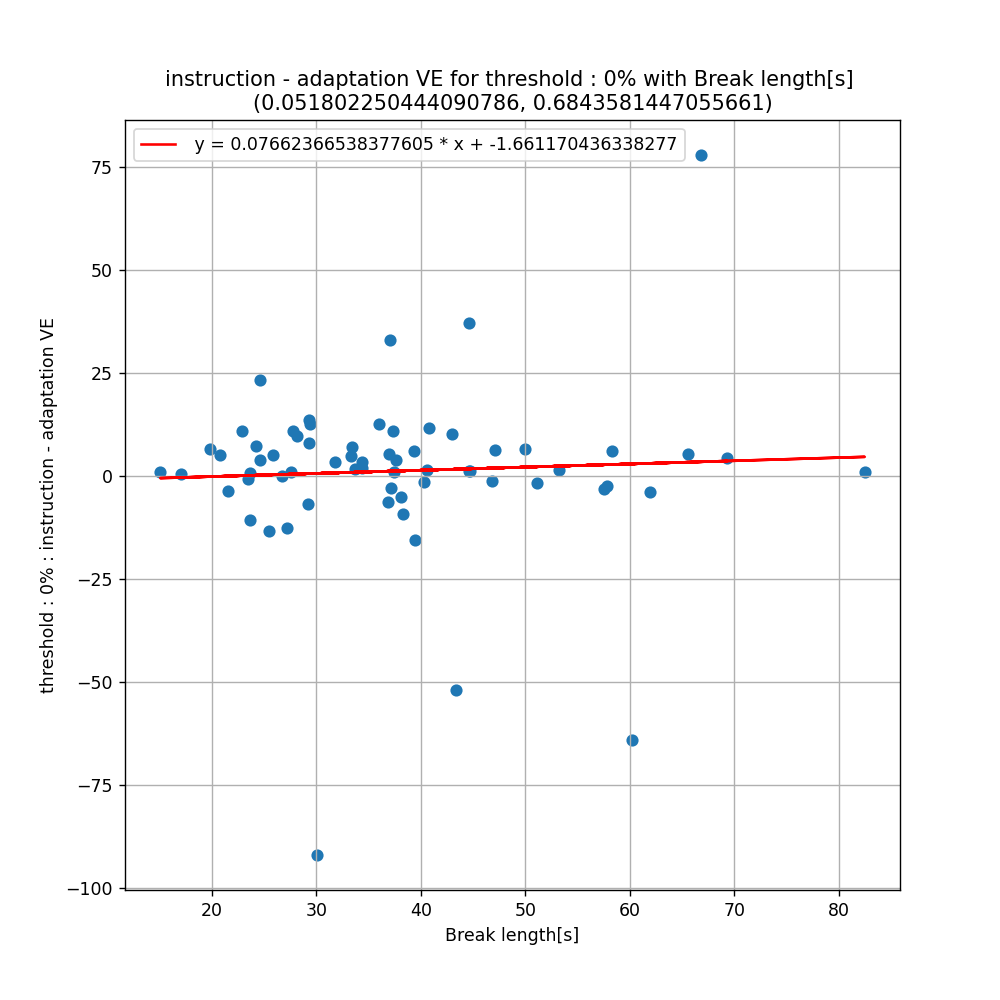

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.024596006192000256 (p = 0.8470223652085702)
regressive line first order :  y = -0.048218163145826706 * x + 2.62144209908176


<IPython.core.display.Javascript object>


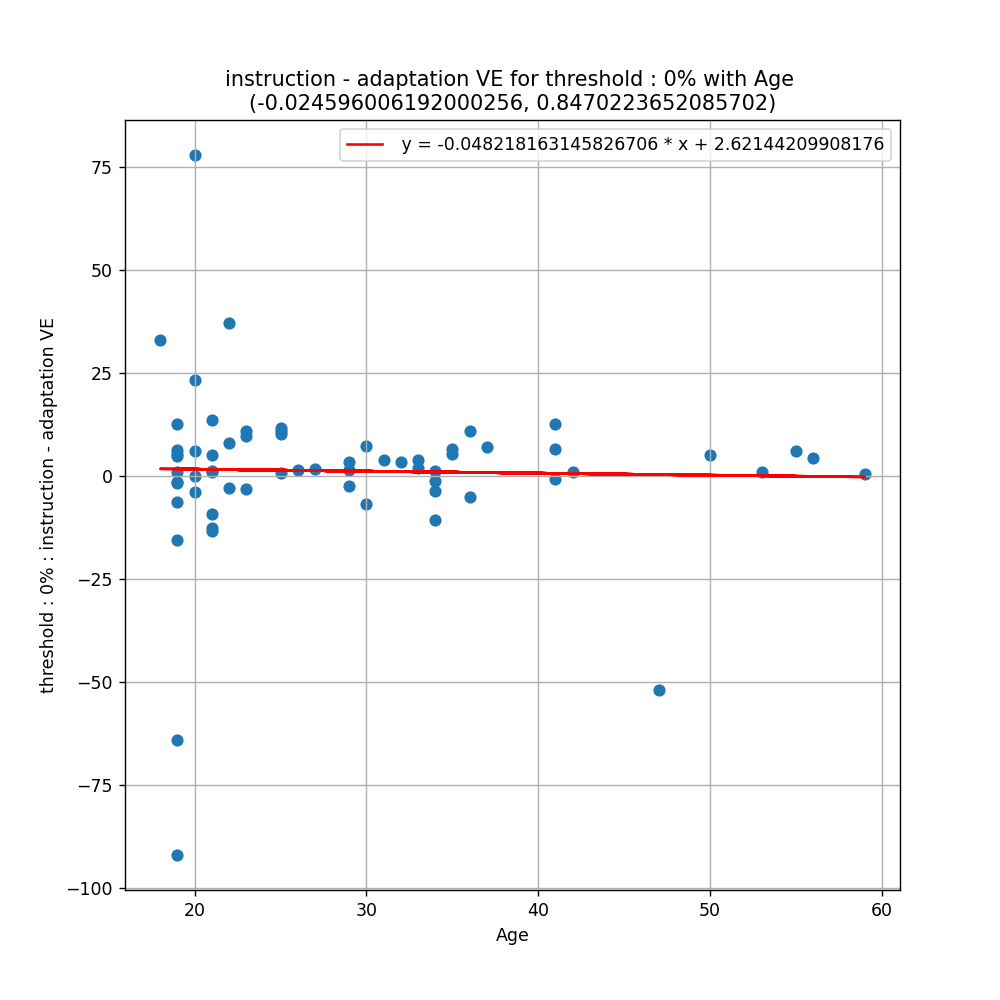

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.2613555778909223 (p = 0.03697467251767135)
regressive line first order :  y = -0.2305336825785169 * x + 5.861758732969044


<IPython.core.display.Javascript object>


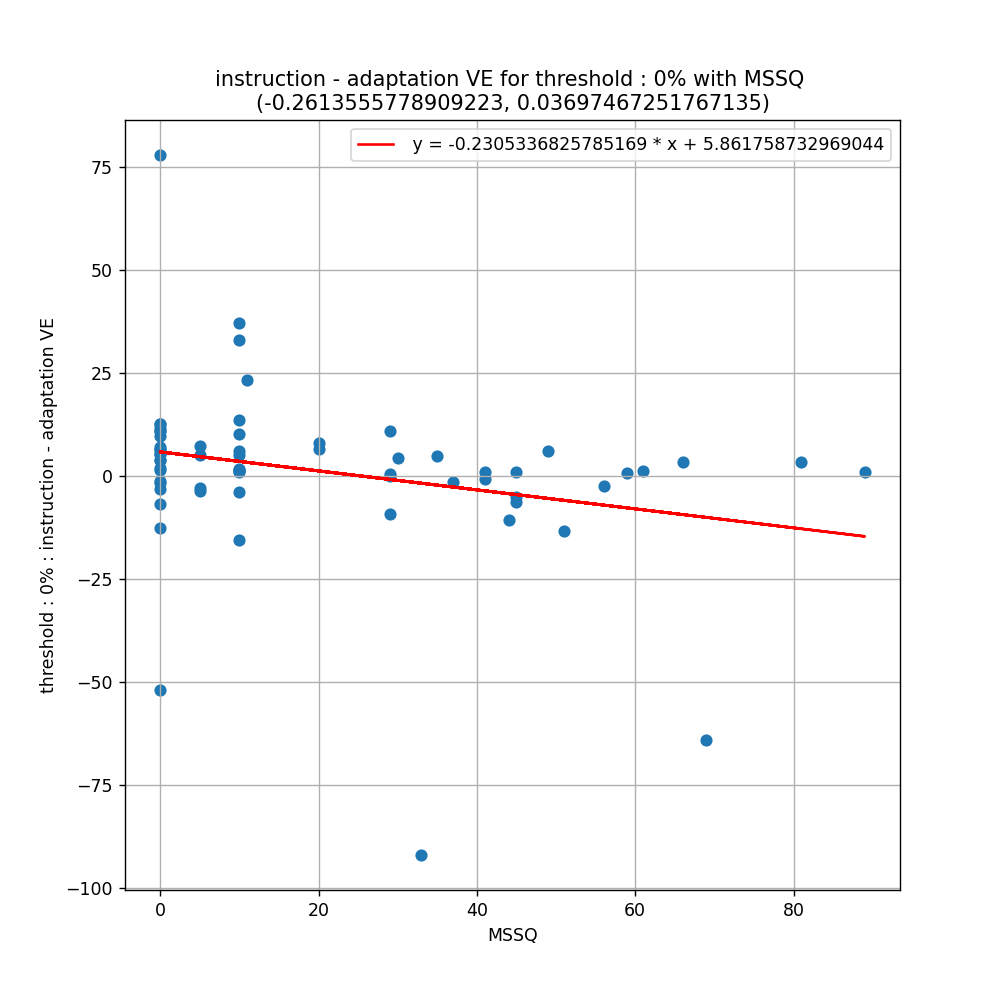




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 9%] for instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 9%] for instruction - adaptation VE : 2.221737659744261
standard deviation for differences in HR[0.9] for instruction - adaptation VE : 7.161175288216645
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9794214963912964, pvalue=0.4513145089149475)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=1.3379143488999006, pvalue=0.1809243590995755)
__________________________________________________
Skew : -0.08261438191811776
__________________________________________________


<IPython.core.display.Javascript object>


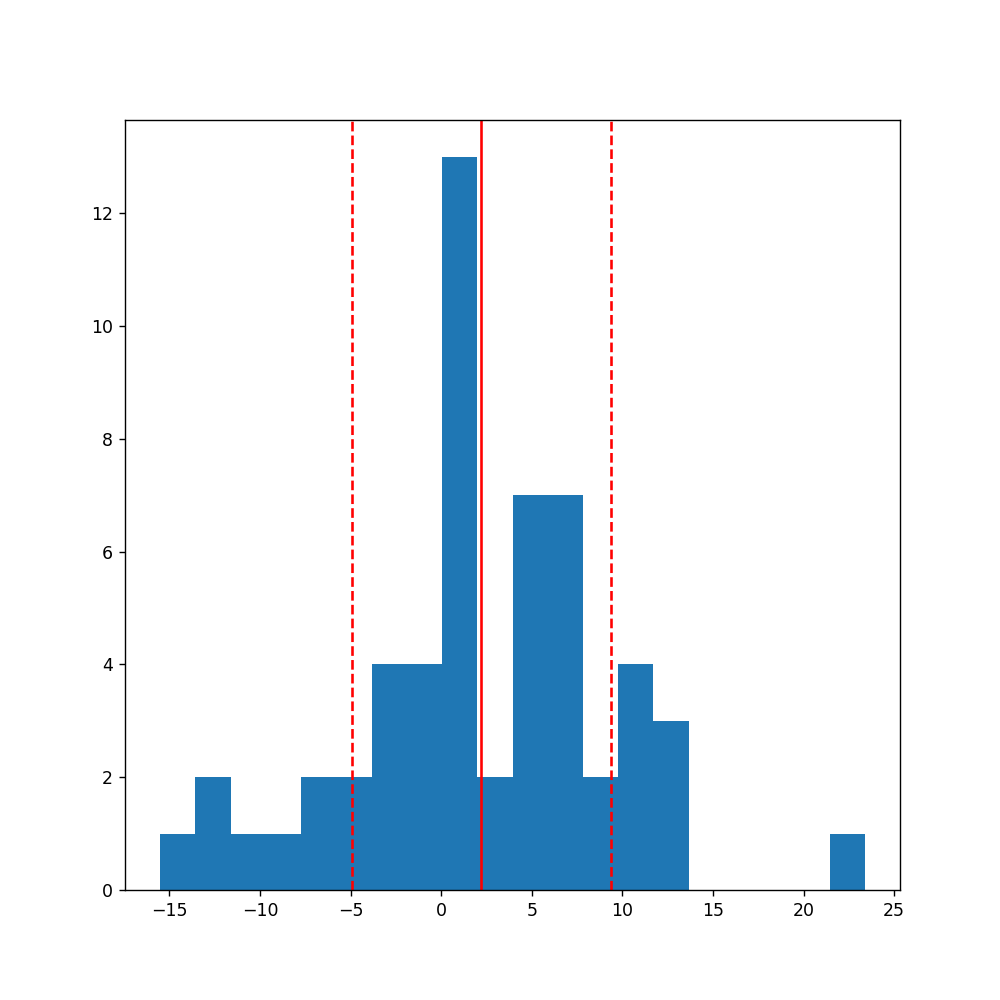

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 9% for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=2.300858002740231, pvalue=0.02521538825713963)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=494.0, pvalue=0.013147317535407698)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = -0.05044655544345725 (p = 0.7119576032773096)
regressive line first order :  y = -0.02624003114027355 * x + 3.1953412151651865


<IPython.core.display.Javascript object>


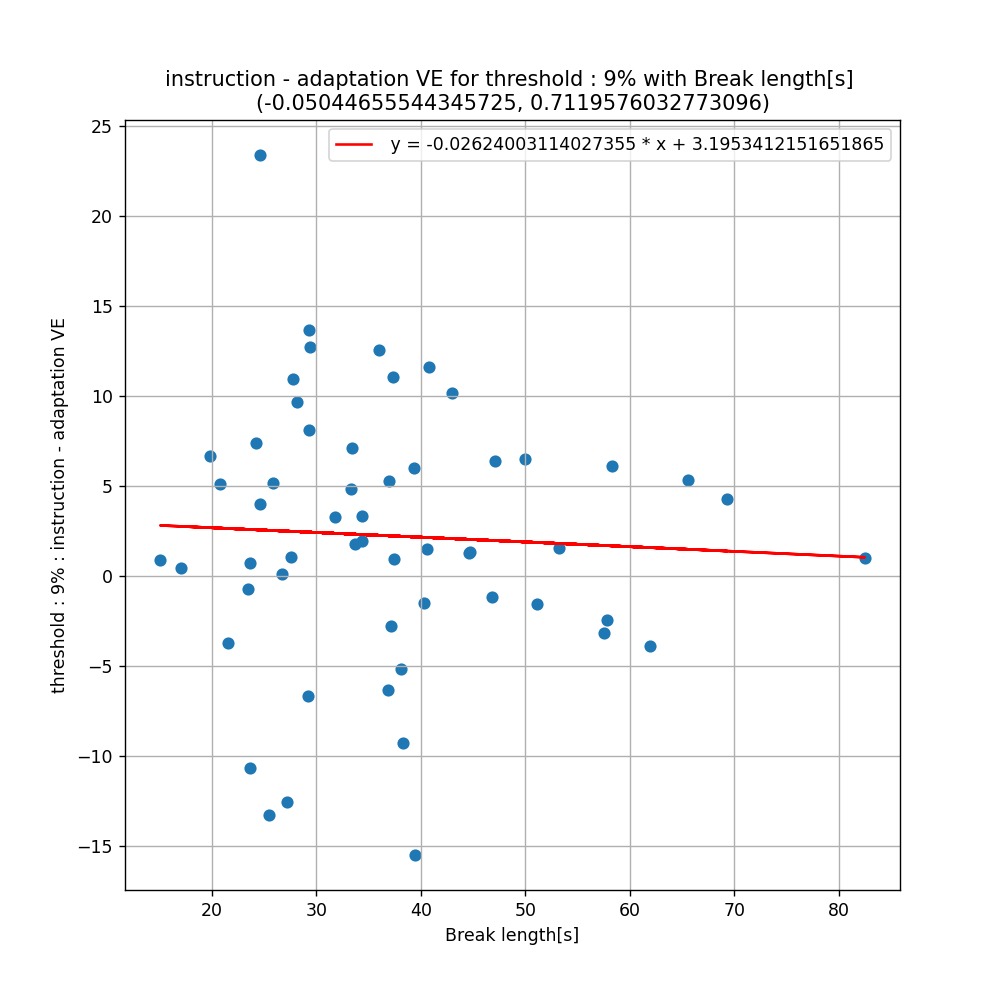

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.08091091754869223 (p = 0.5533157879848903)
regressive line first order :  y = 0.05495679184486299 * x + 0.6171956121308503


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = -0.2401732817089109 (p = 0.07459392531929972)
regressive line first order :  y = -0.0739178207786651 * x + 3.755532440901563


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 50%] for instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 50%] for instruction - adaptation VE : 3.462008665294026
standard deviation for differences in HR[0.5] for instruction - adaptation VE : 6.212039295202644
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9628006219863892, pvalue=0.2770136594772339)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=1.8462124806633415, pvalue=0.06486135948005661)
__________________________________________________
Skew : 0.695324230428211
__________________________________________________


<IPython.core.display.Javascript object>


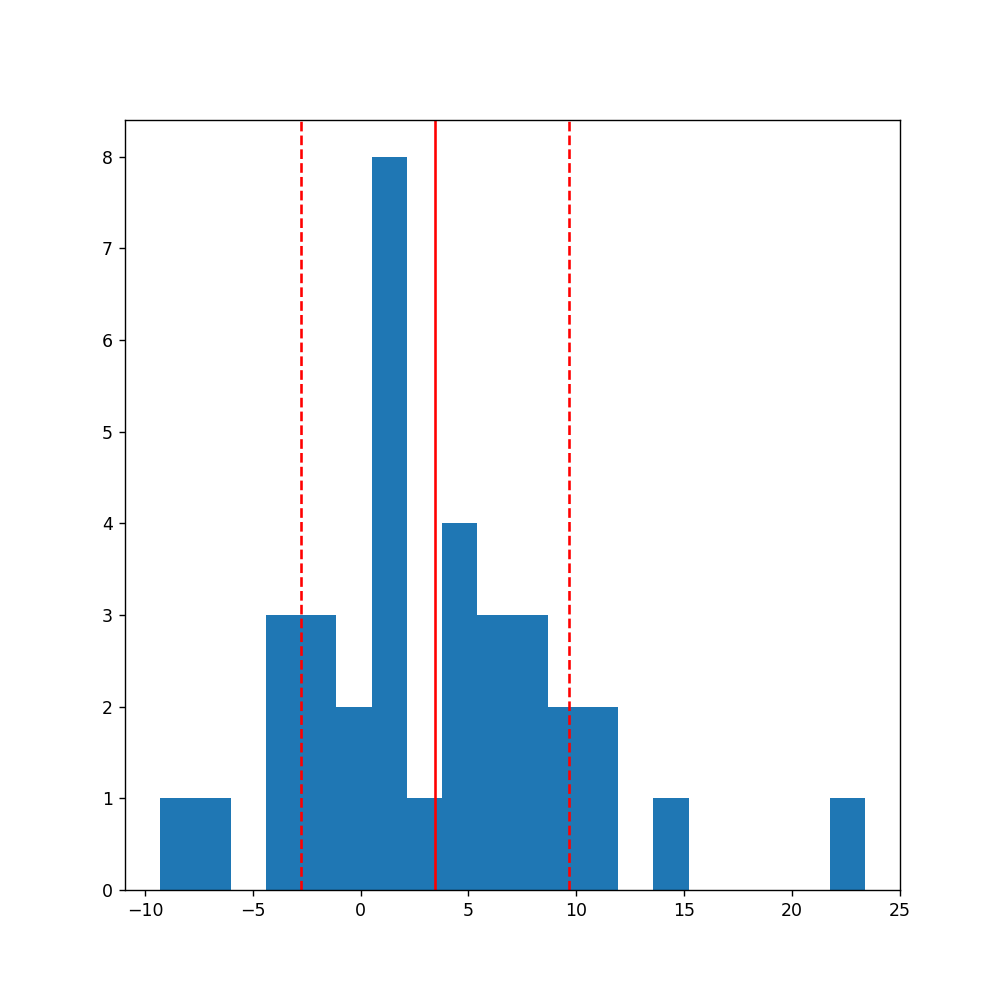

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 50% for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=3.249626254369747, pvalue=0.00260540822093728)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=134.0, pvalue=0.00303052215866995)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.189416441074576 (p = 0.27579750961722743)
regressive line first order :  y = -0.07238754665564967 * x + 6.243220936428836


<IPython.core.display.Javascript object>


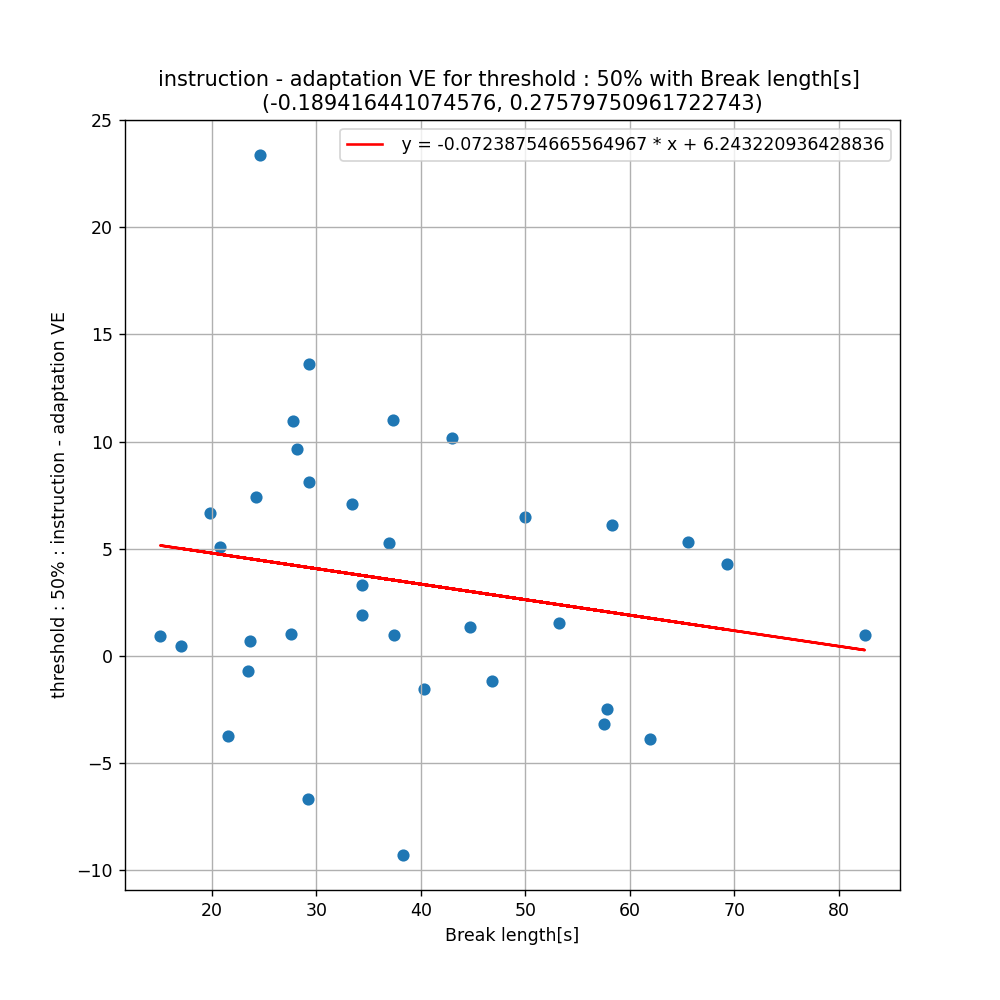

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.04870053427103645 (p = 0.7811524989086359)
regressive line first order :  y = -0.026180393647834452 * x + 4.294545183295162


<IPython.core.display.Javascript object>


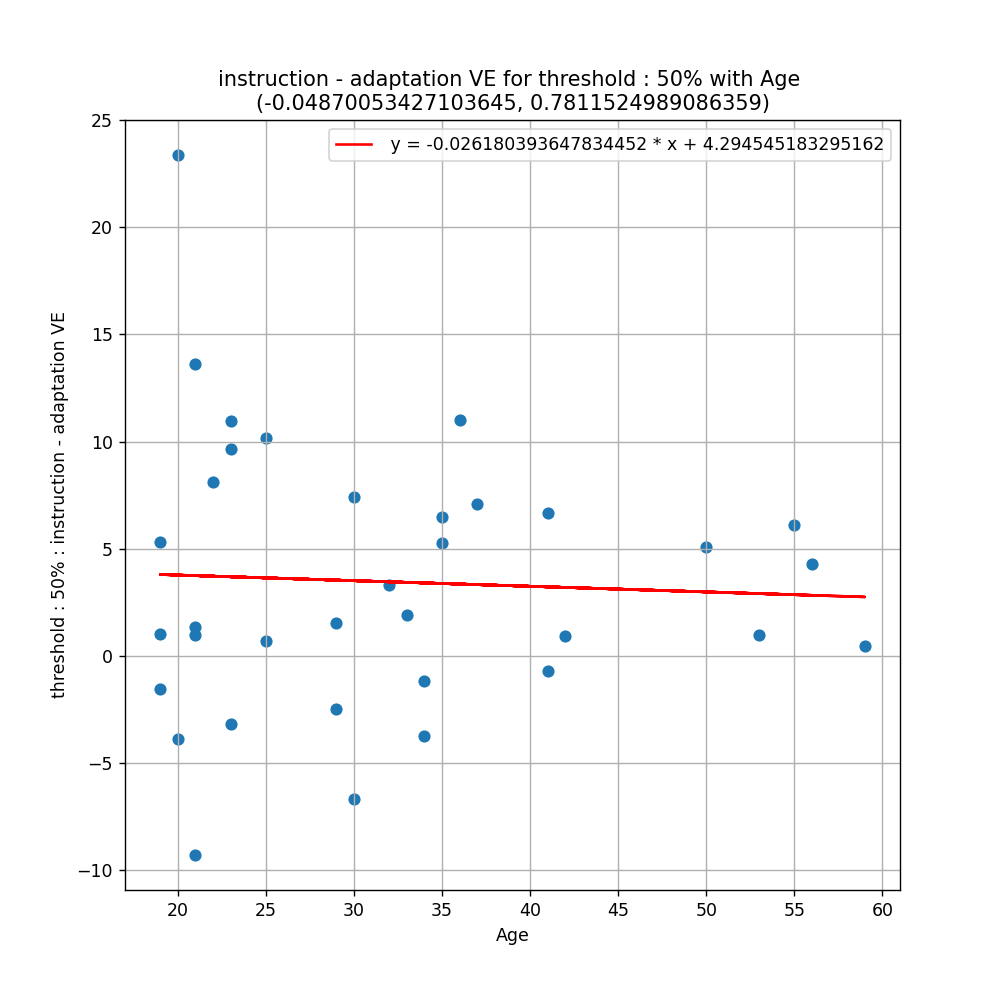

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.20974405008135513 (p = 0.22654563631893504)
regressive line first order :  y = -0.05564111306102616 * x + 4.562112957814885


<IPython.core.display.Javascript object>


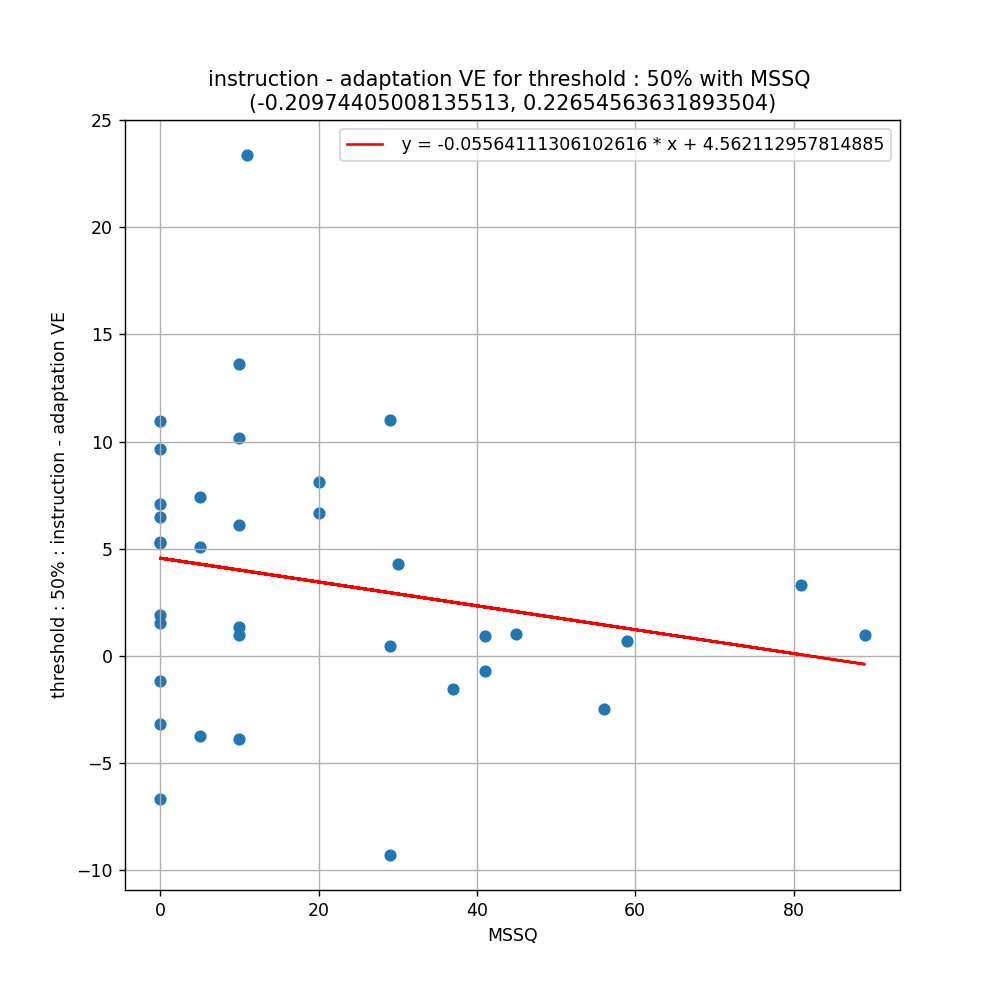




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 90%] for instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 90%] for instruction - adaptation VE : 3.656277094137579
standard deviation for differences in HR[0.1] for instruction - adaptation VE : 3.429569135982622
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.7966683506965637, pvalue=0.0761021226644516)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=0.24044300380442118, pvalue=0.8099868436016422)
__________________________________________________
Skew : 0.8483124503702244
__________________________________________________


C:\Users\Krzyniu\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=5
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<IPython.core.display.Javascript object>


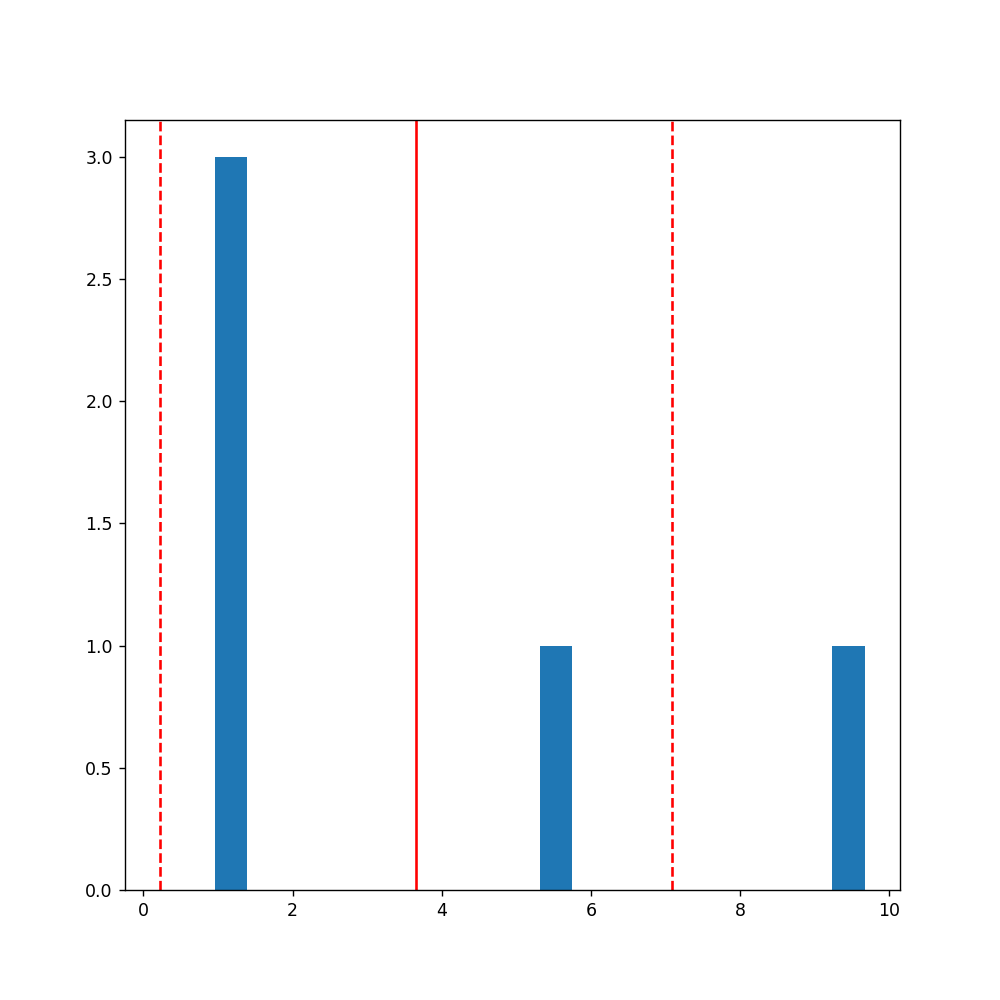

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 90% for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=2.1322078367083286, pvalue=0.09995940895638043)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=0.0625)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.43320651437673263 (p = 0.46619804241778295)
regressive line first order :  y = -0.07529116275130147 * x + 7.547023220473834


<IPython.core.display.Javascript object>


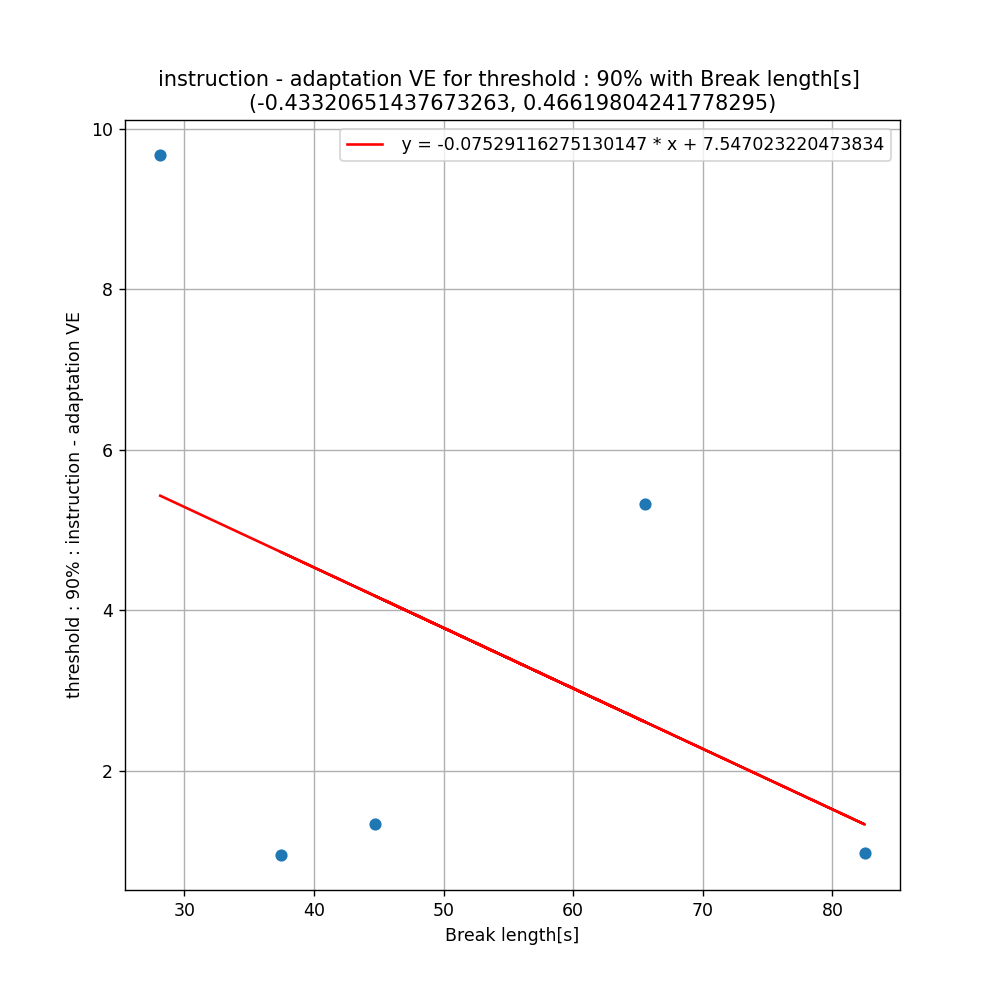

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.34948378975266253 (p = 0.5642552329731696)
regressive line first order :  y = -0.09318507045814604 * x + 6.209548024690783


<IPython.core.display.Javascript object>


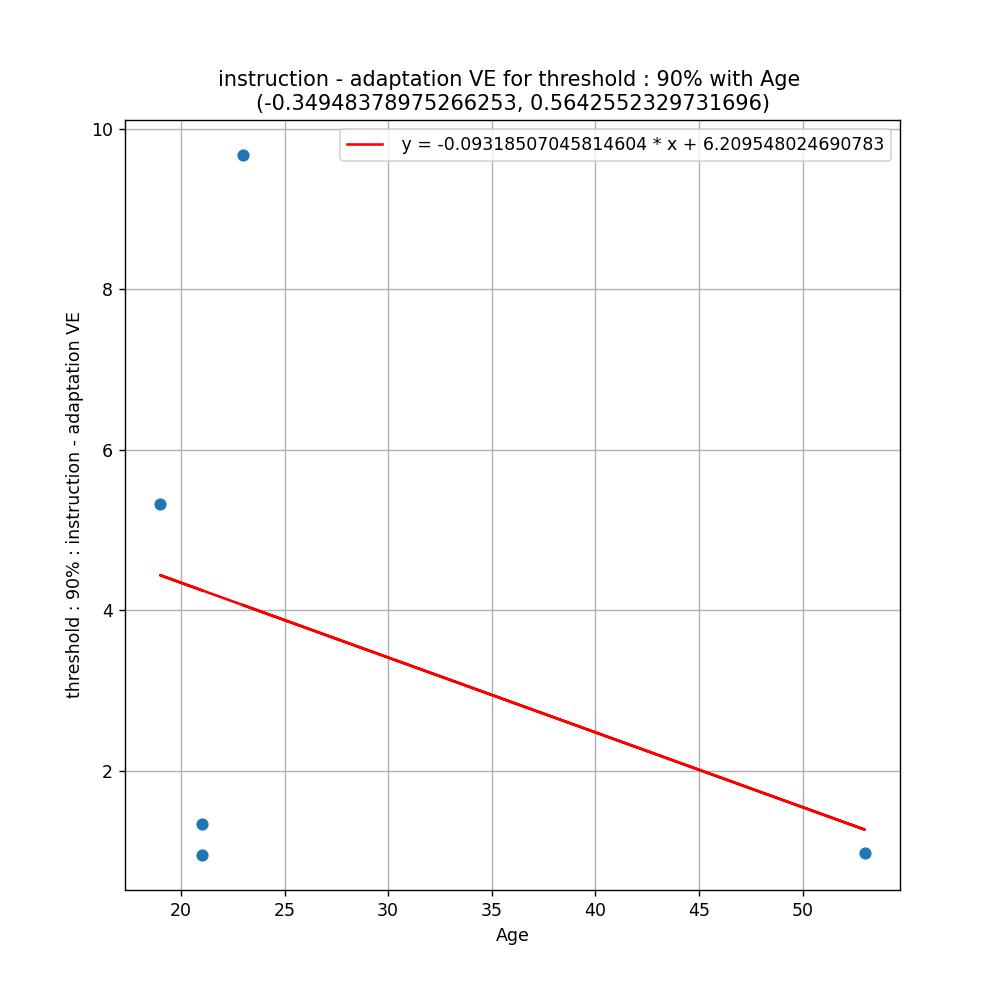

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.49658243630726695 (p = 0.394774902087647)
regressive line first order :  y = -0.05024333540245621 * x + 4.751581805911126


<IPython.core.display.Javascript object>


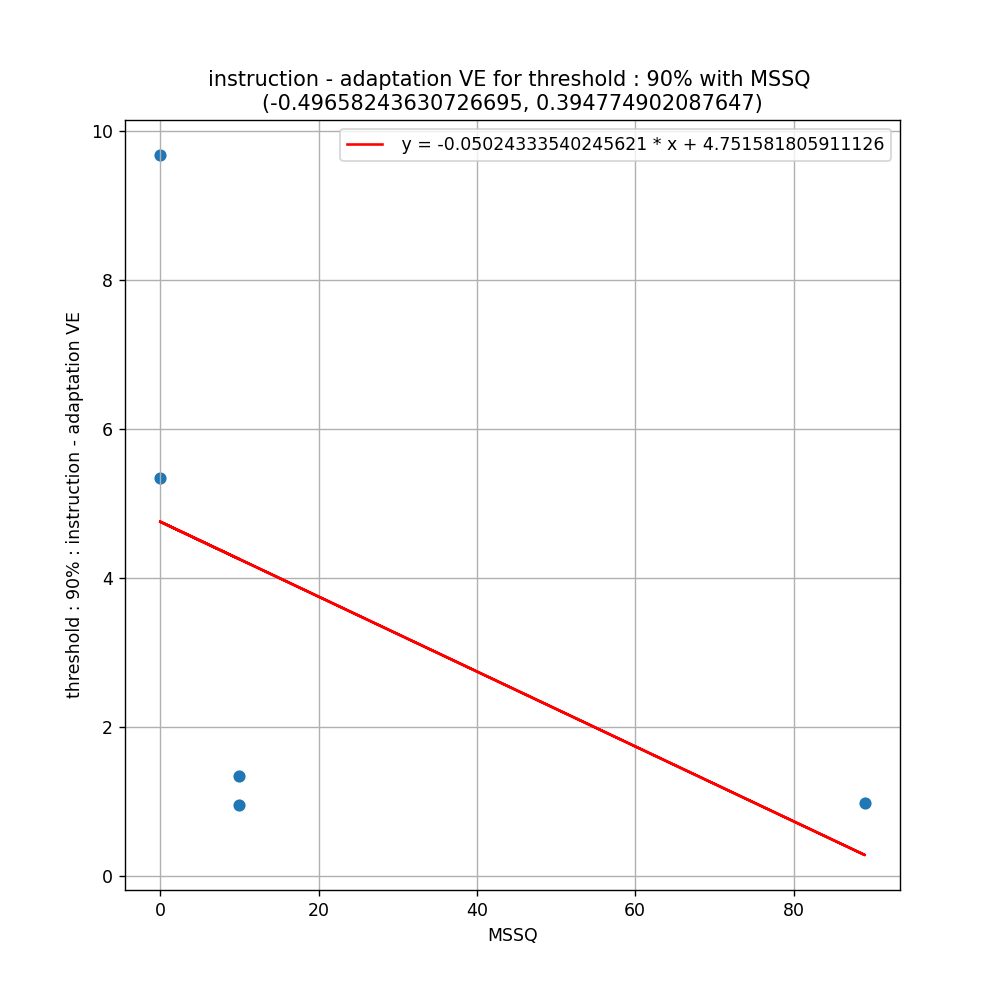




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for break - adaptation VE : 0.19282659557547036
standard deviation for differences in Skin Conductance for break - adaptation VE : 0.5133051934311436
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.78011155128479, pvalue=2.1304321862203324e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.438558985586015, pvalue=9.056316645032197e-06)
__________________________________________________
Skew : 2.3017707600203092
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=2.981683555401383, pvalue=0.004071783573931597)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=697.0, pvalue=0.021801178429516347)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Skin Conductance :
pearson r = -0.2579594391670416 (p = 0.03959266122139927)
regressive line first order :  y = -0.009533238453708428 * x + 0.5533662260521808


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Skin Conductance :
pearson r = 0.10253093874165958 (p = 0.4201223490676054)
regressive line first order :  y = 0.005021988780475475 * x + 0.04860135528619019


<IPython.core.display.Javascript object>


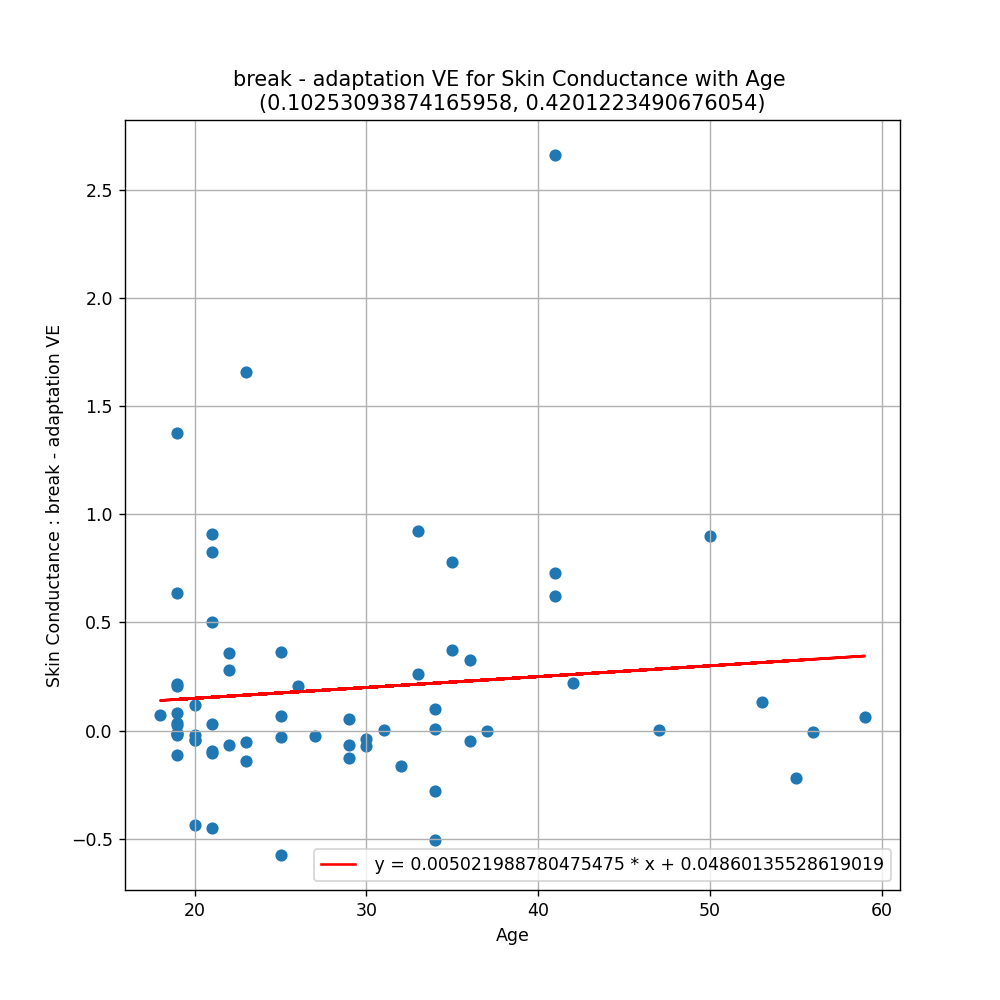

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Skin Conductance :
pearson r = -0.07198802331480617 (p = 0.5718780160644552)
regressive line first order :  y = -0.001586490950769704 * x + 0.22465557027528738


<IPython.core.display.Javascript object>


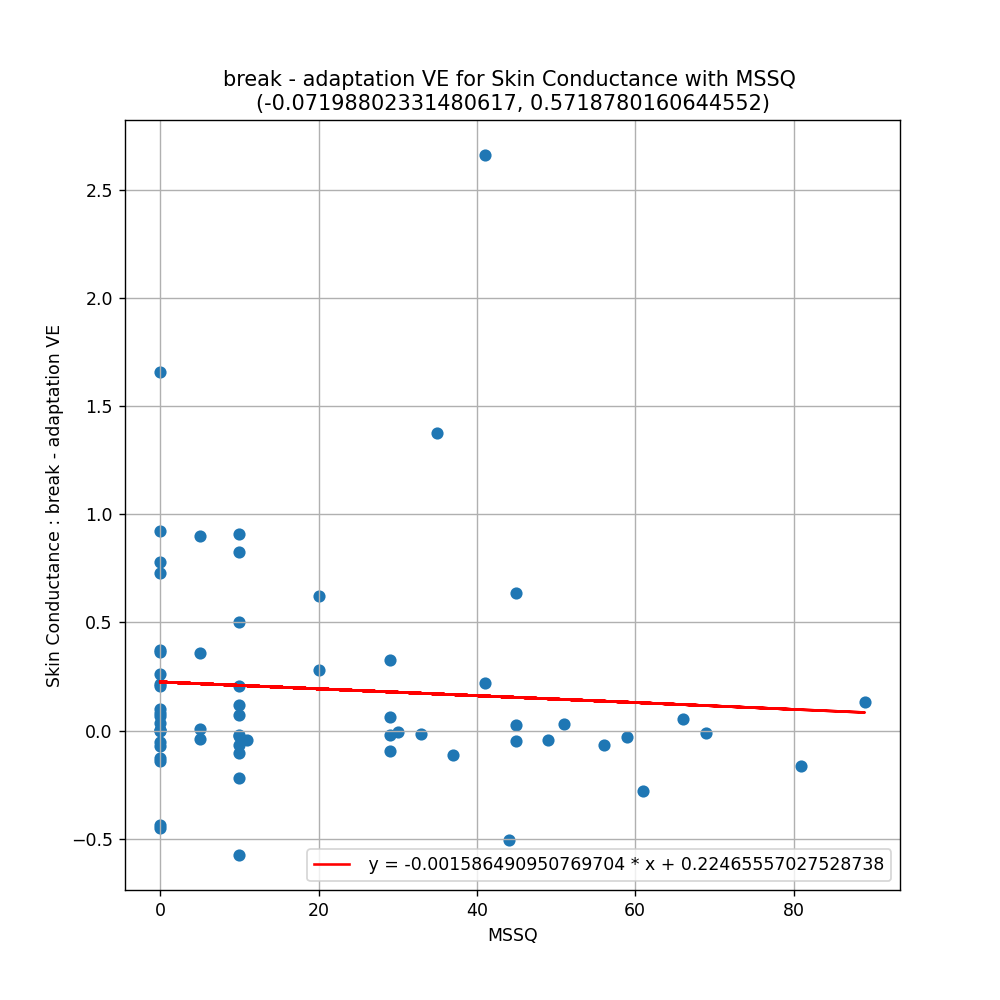




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for break - adaptation VE : 3.2563276580534573
standard deviation for differences in Phasic Component for break - adaptation VE : 5.976564003679676
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.523467481136322, pvalue=4.245969081970863e-13)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.3807231299776035, pvalue=1.1828609464351587e-05)
__________________________________________________
Skew : 2.841939894962698
__________________________________________________


<IPython.core.display.Javascript object>


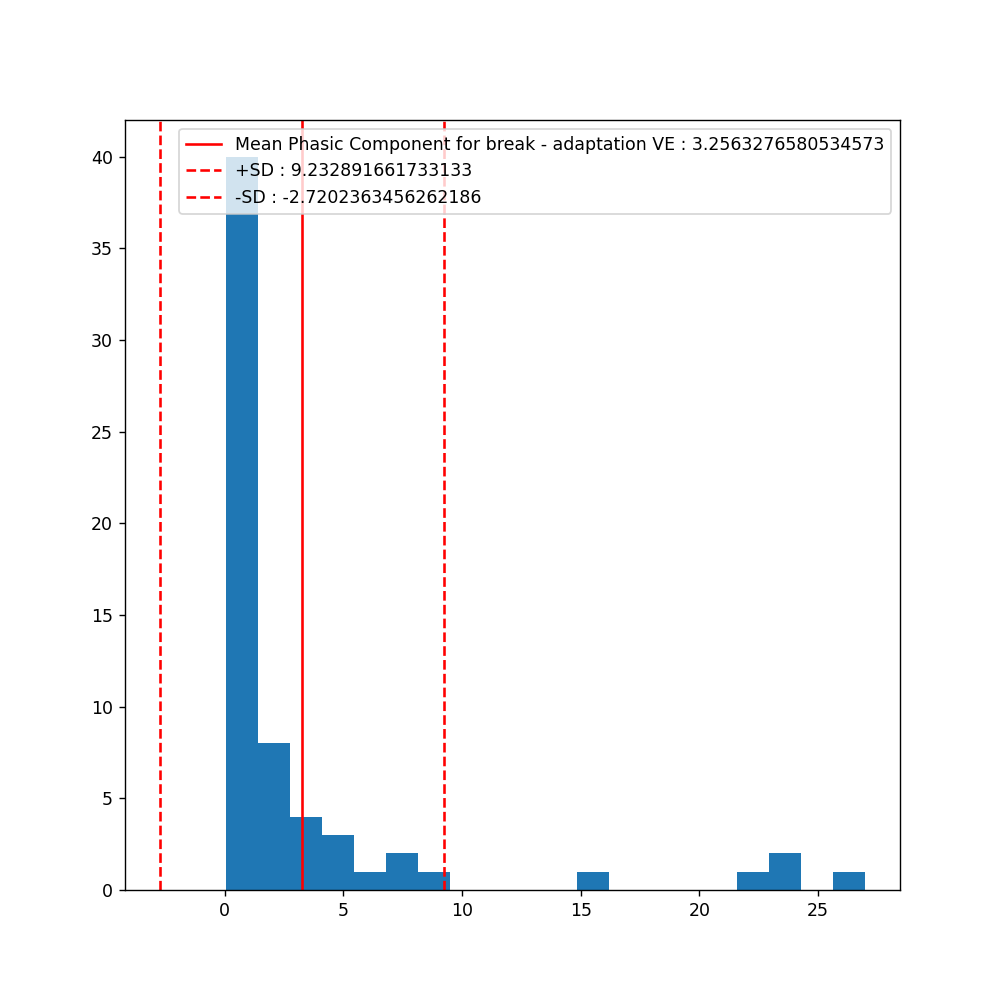

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=4.324608503437646, pvalue=5.550959324501533e-05)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=3.5254980732707397e-12)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Phasic Component :
pearson r = -0.16431464614908511 (p = 0.19447707754375823)
regressive line first order :  y = -0.07070355069948006 * x + 5.930280708358807


<IPython.core.display.Javascript object>


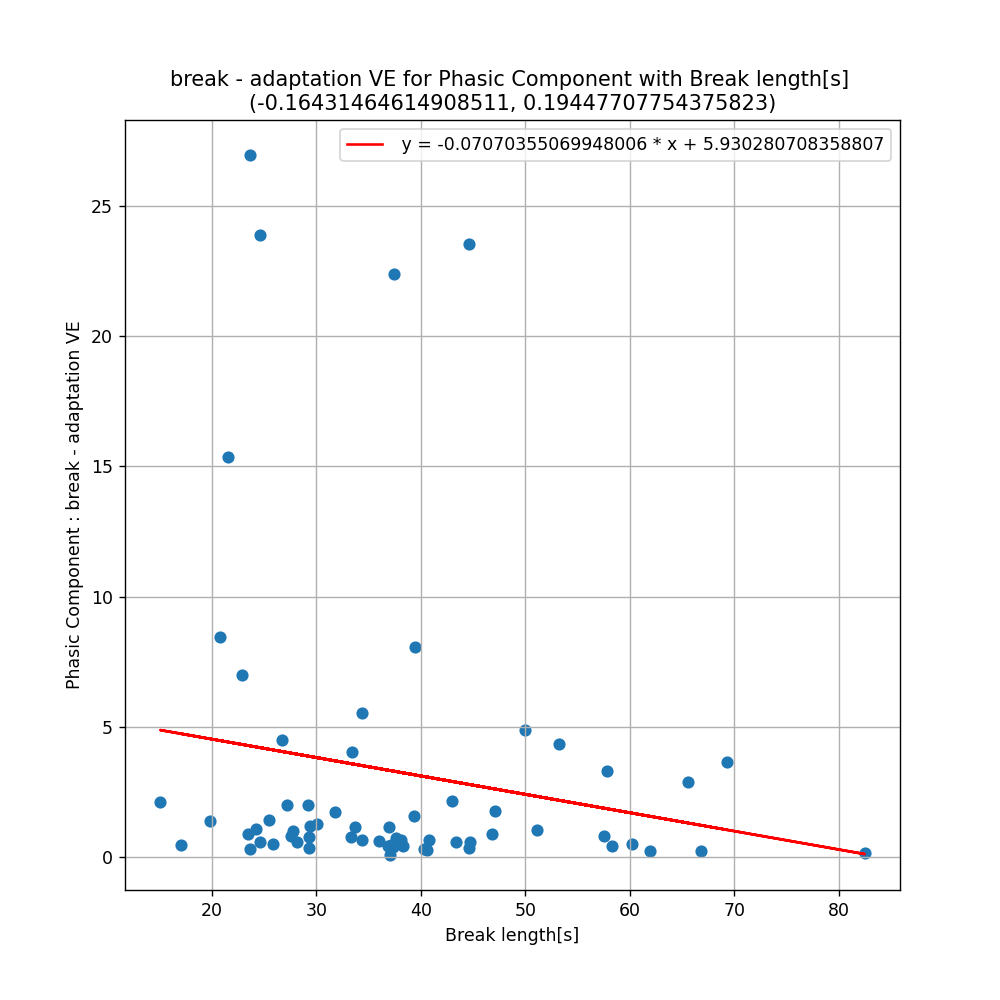

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Phasic Component :
pearson r = -0.03719301798574838 (p = 0.7704542646563473)
regressive line first order :  y = -0.021210853338169647 * x + 3.8654768523590146


<IPython.core.display.Javascript object>


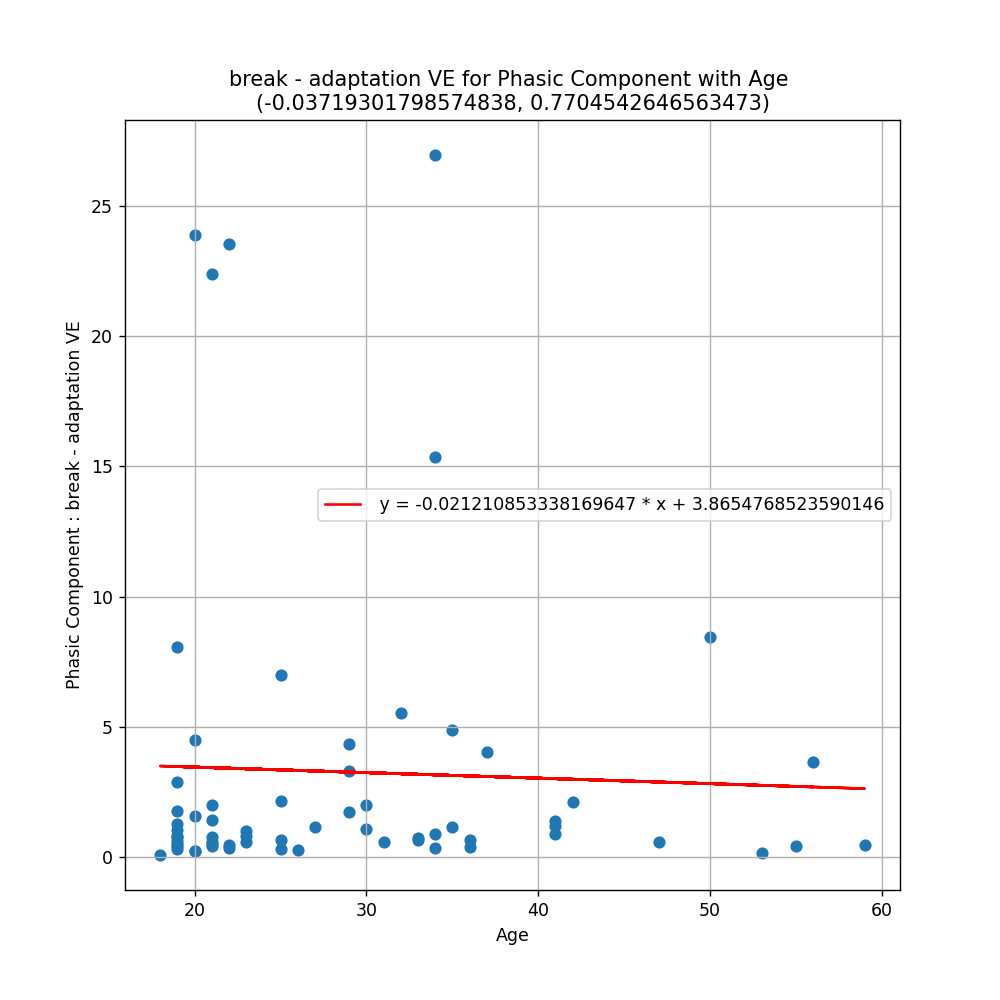

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Phasic Component :
pearson r = -0.049255123324741454 (p = 0.6991193669357942)
regressive line first order :  y = -0.012638766136174632 * x + 3.5098929036604596


<IPython.core.display.Javascript object>


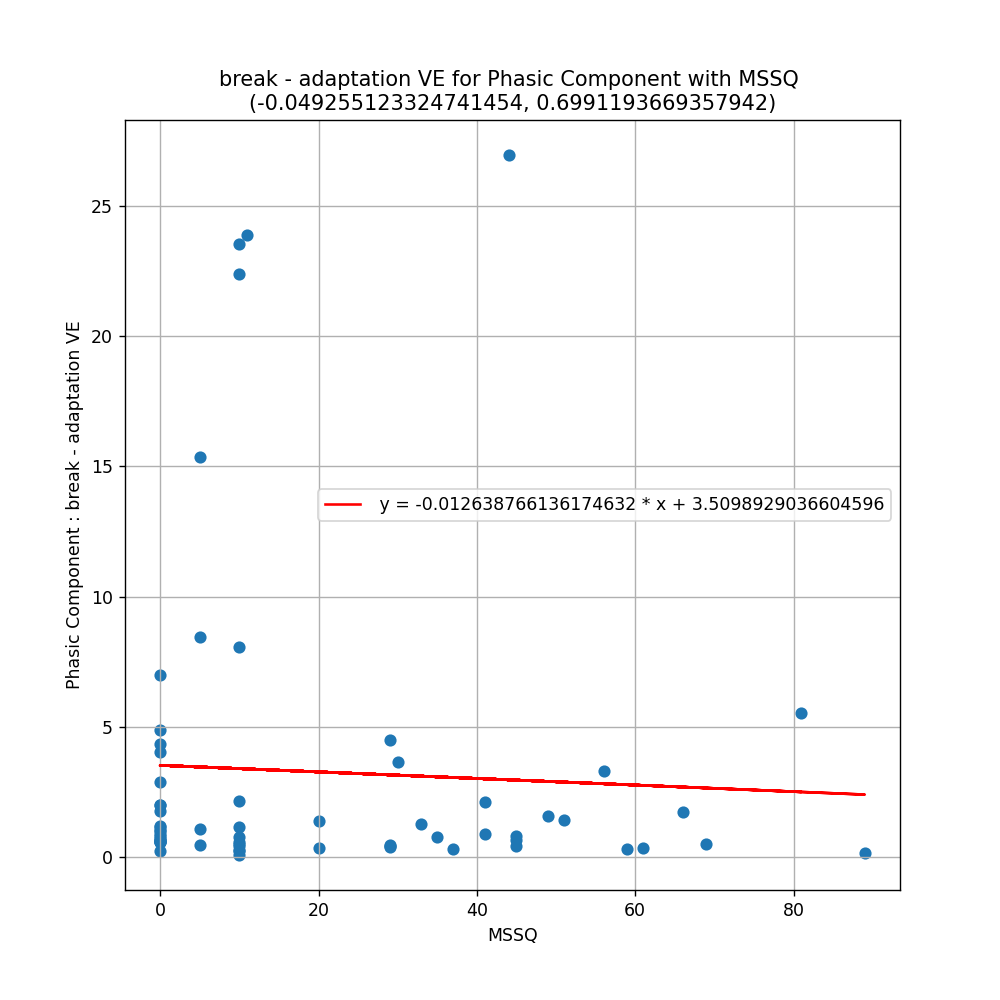




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for break - adaptation VE : -3.077152231647603
standard deviation for differences in Tonic Component for break - adaptation VE : 6.337228035247639
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5624464750289917, pvalue=1.603458685273118e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.4542323580636545, pvalue=8.419388186623977e-06)
__________________________________________________
Skew : -2.8696175119841616
__________________________________________________


<IPython.core.display.Javascript object>


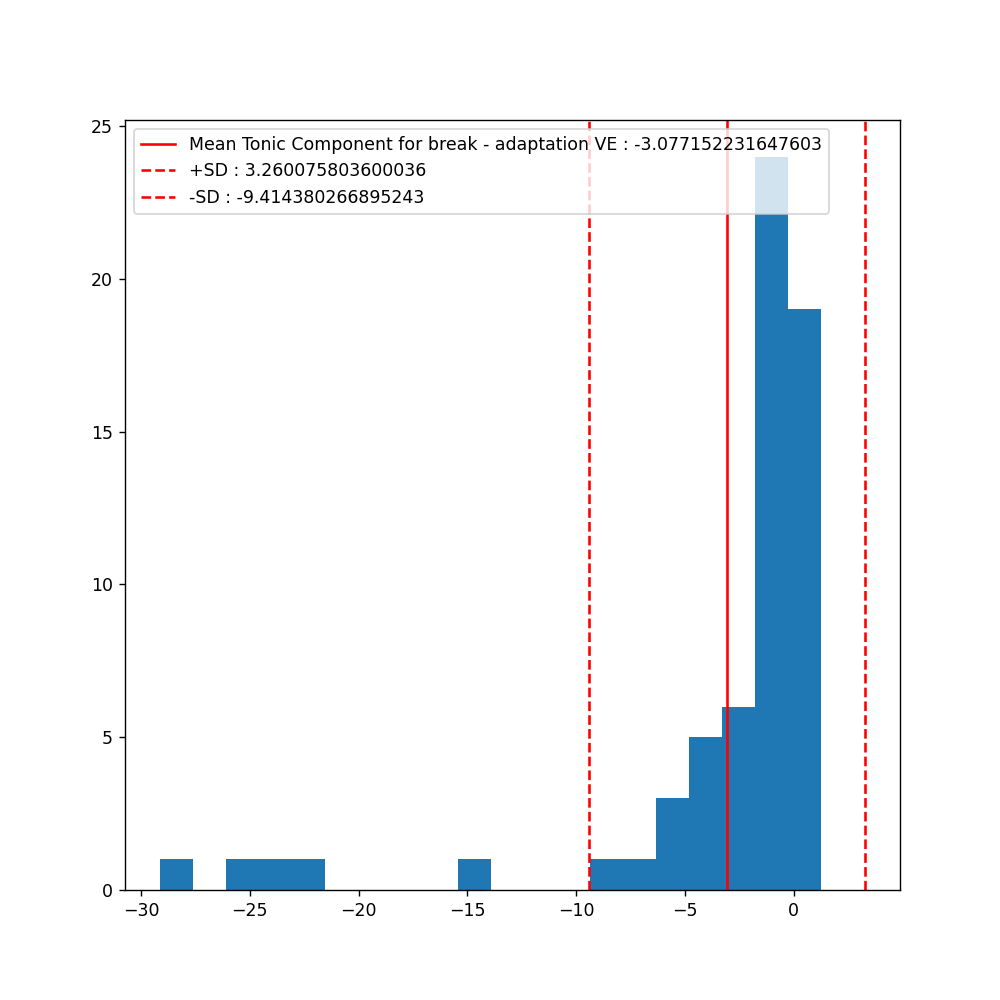

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-3.854072871898242, pvalue=0.00027499341373340584)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=253.0, pvalue=1.416725365381946e-07)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Tonic Component :
pearson r = 0.12539373797675427 (p = 0.323504242484653)
regressive line first order :  y = 0.05721218804474897 * x + -5.240872486478096


<IPython.core.display.Javascript object>


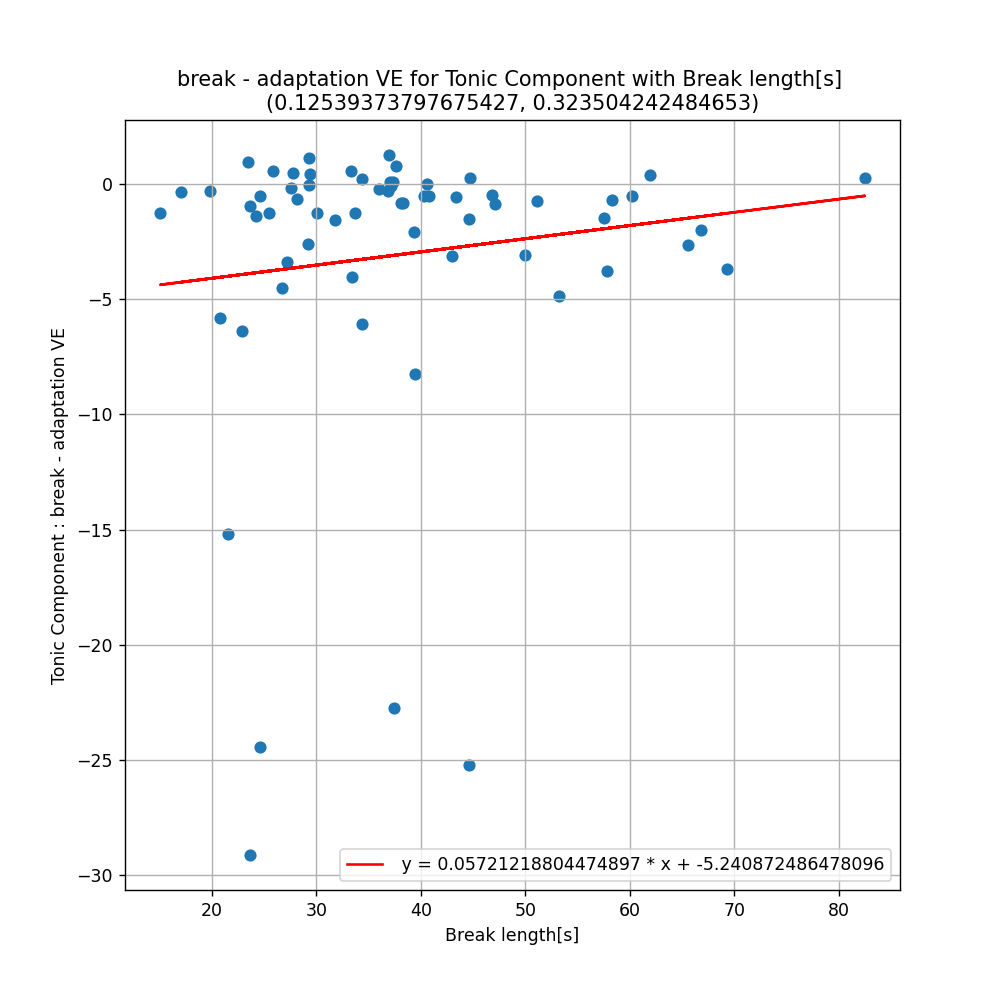

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Tonic Component :
pearson r = 0.06433278906243327 (p = 0.6135290442075828)
regressive line first order :  y = 0.038902441744518346 * x + -4.1943817304979865


<IPython.core.display.Javascript object>


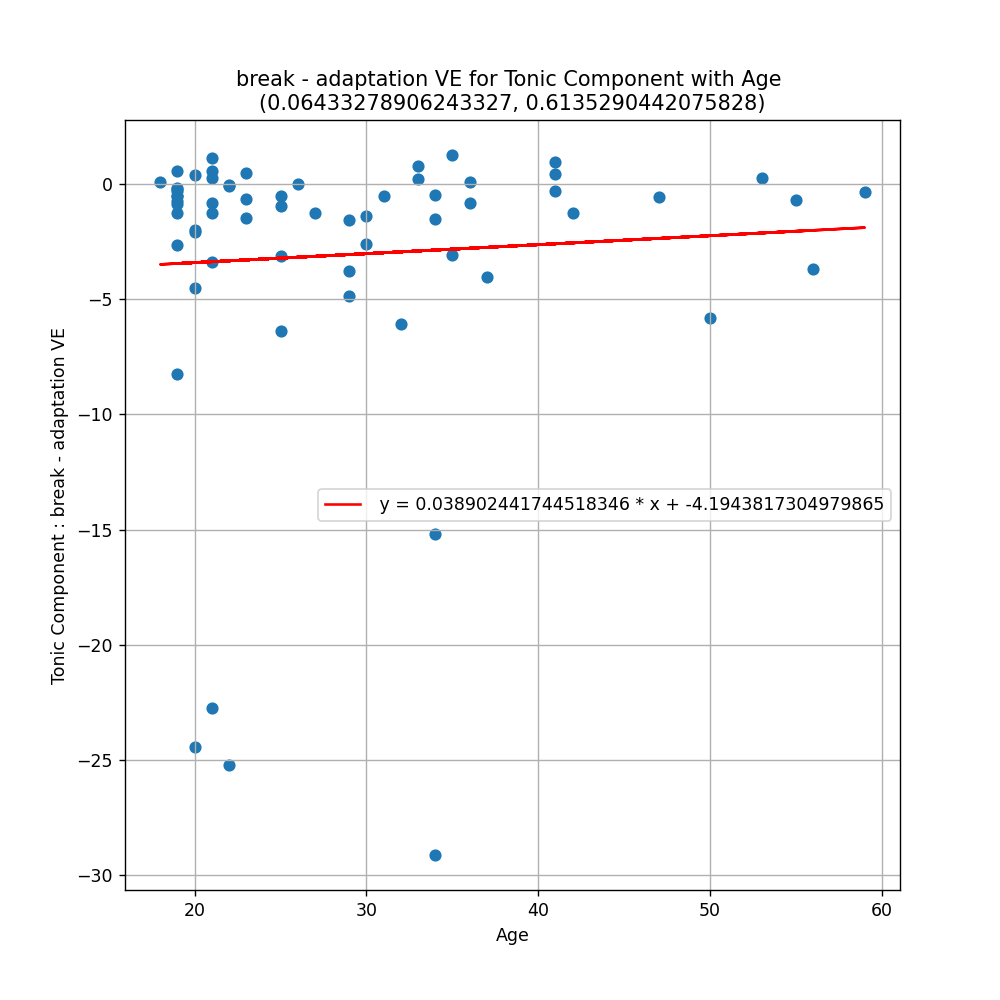

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Tonic Component :
pearson r = 0.017722845835507428 (p = 0.8894507696318197)
regressive line first order :  y = 0.004822080839980141 * x + -3.1738952284997013


<IPython.core.display.Javascript object>


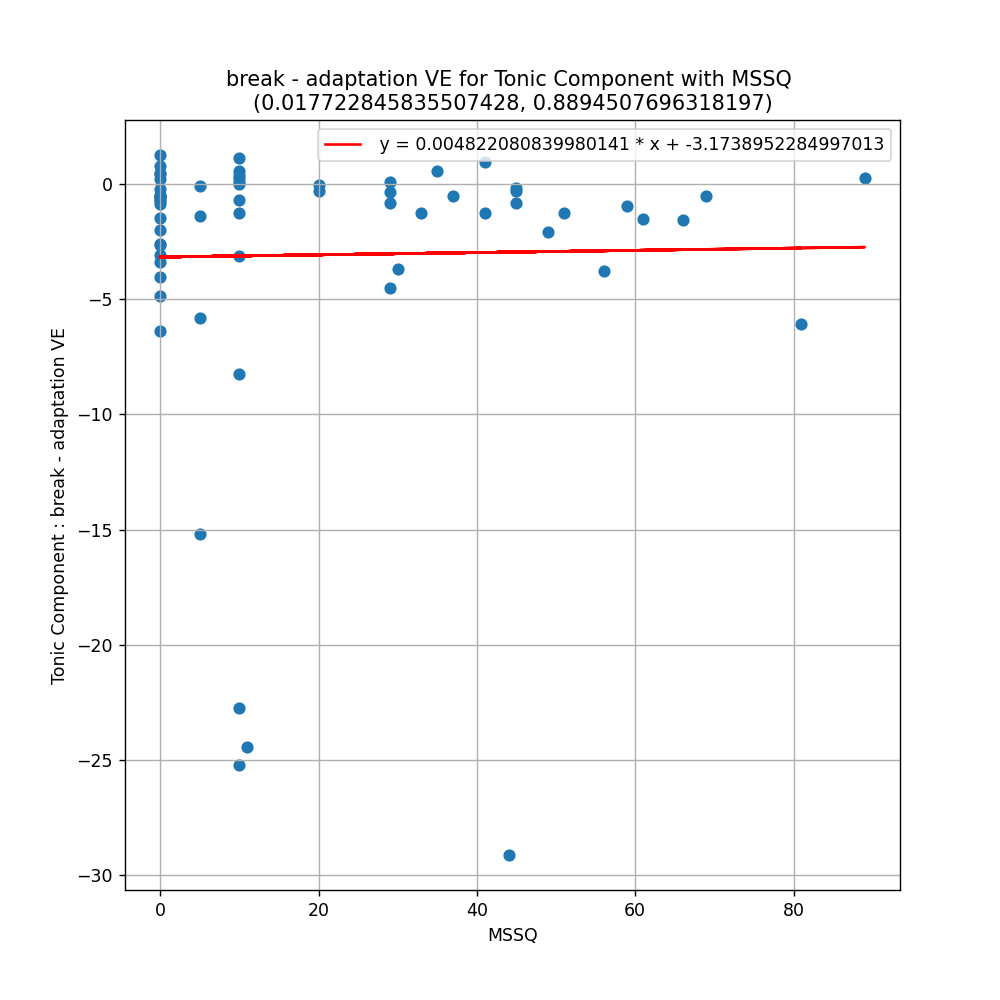




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for break - adaptation VE : 16.20545076473929
standard deviation for differences in HR[1] for break - adaptation VE : 17.28466248834081
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.7679628729820251, pvalue=1.0965713670429977e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.866630057417685, pvalue=1.1351723086025046e-06)
__________________________________________________
Skew : -1.3577566312203637
__________________________________________________


<IPython.core.display.Javascript object>


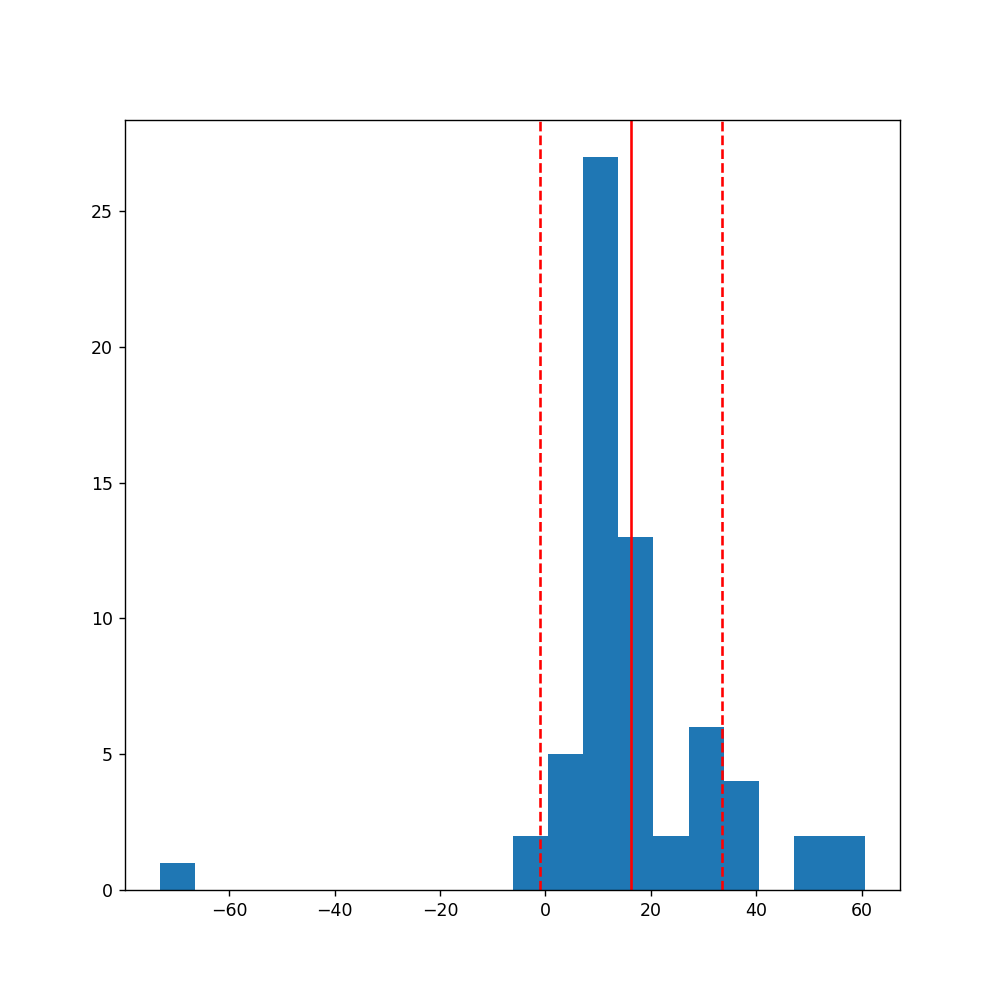

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=7.4416713608593055, pvalue=3.383334483006864e-10)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=67.0, pvalue=7.669596820068871e-11)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.034373203578604385 (p = 0.7874329517735762)
regressive line first order :  y = -0.0427754205070244 * x + 17.823183750017673


<IPython.core.display.Javascript object>


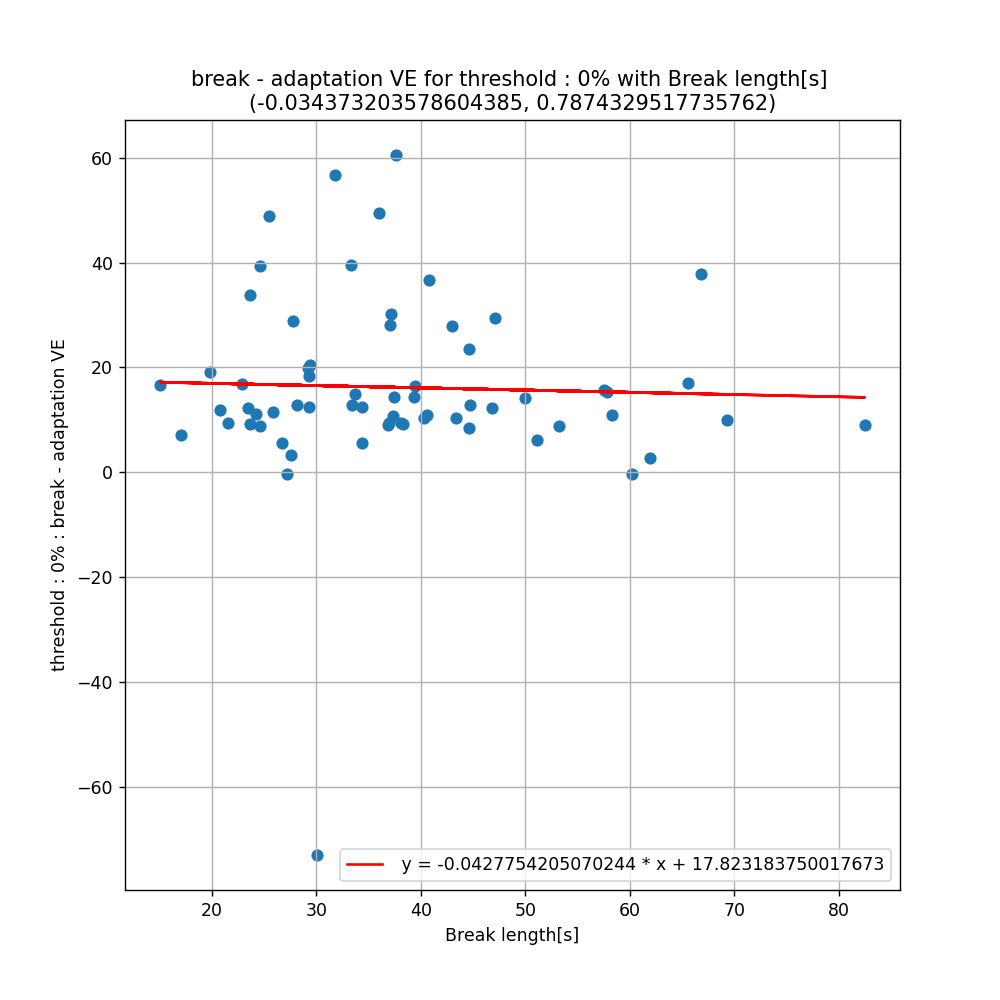

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.05490367339022965 (p = 0.6665426828162897)
regressive line first order :  y = -0.09055396105181729 * x + 18.806047333696153


<IPython.core.display.Javascript object>


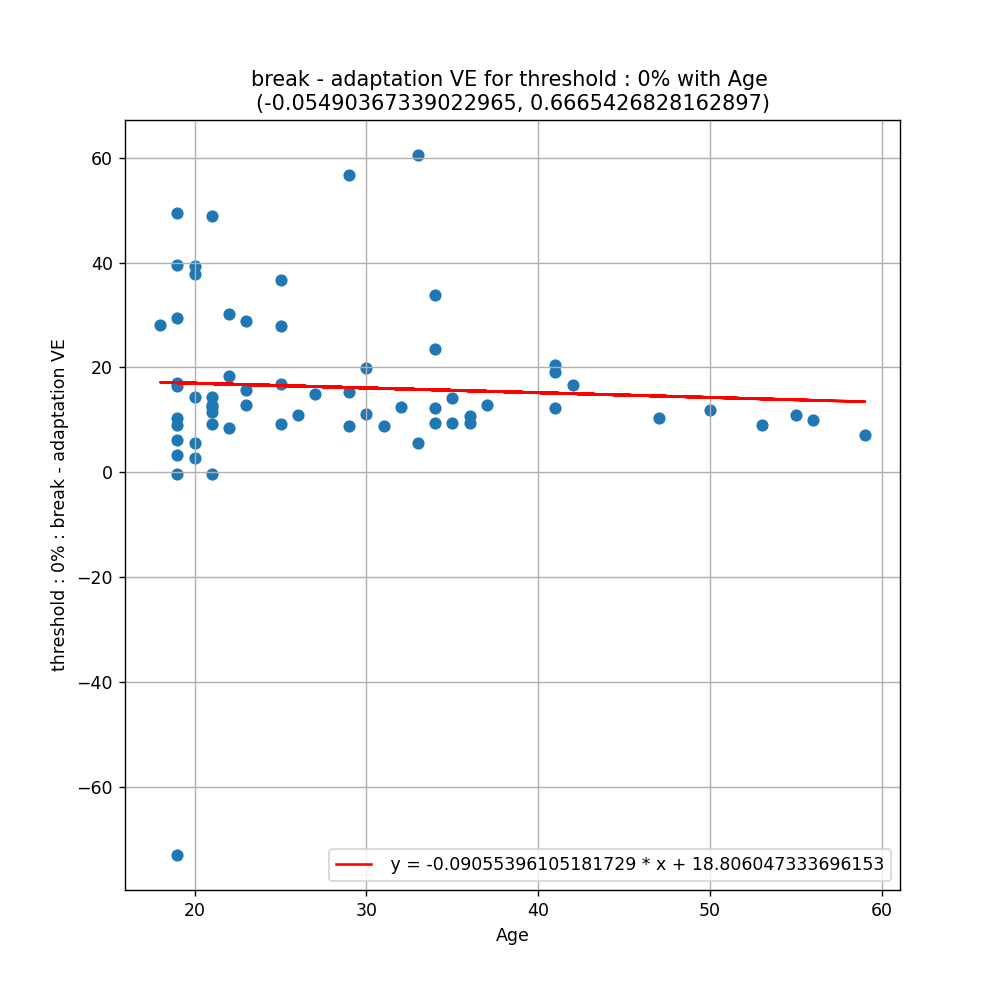

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.06930357681760722 (p = 0.5863339608386696)
regressive line first order :  y = -0.05143020382011904 * x + 17.237269228880418


<IPython.core.display.Javascript object>


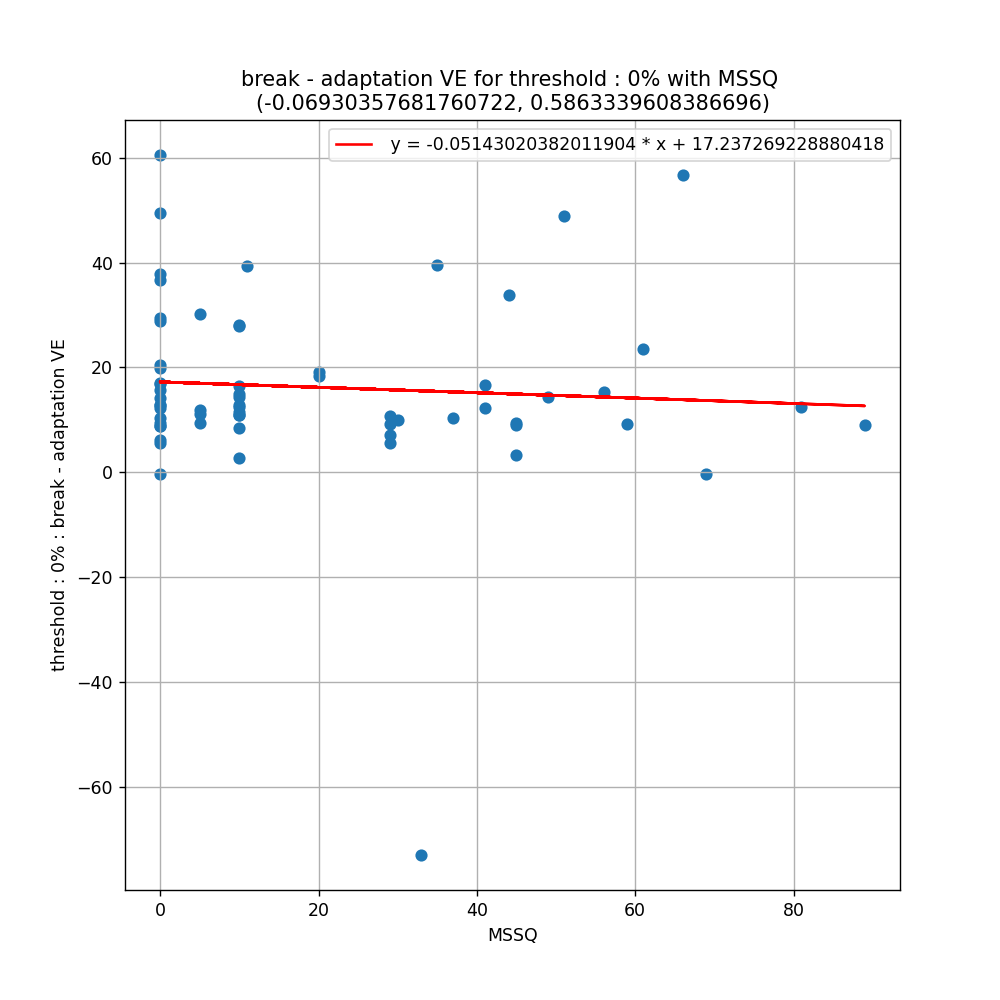




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 9%] for break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 9%] for break - adaptation VE : 16.936294551908215
standard deviation for differences in HR[0.9] for break - adaptation VE : 12.089059078988381
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8302947282791138, pvalue=1.6453141142847016e-06)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.351456509048589, pvalue=0.018700075542518235)
__________________________________________________
Skew : 1.5219306867879703
__________________________________________________


<IPython.core.display.Javascript object>


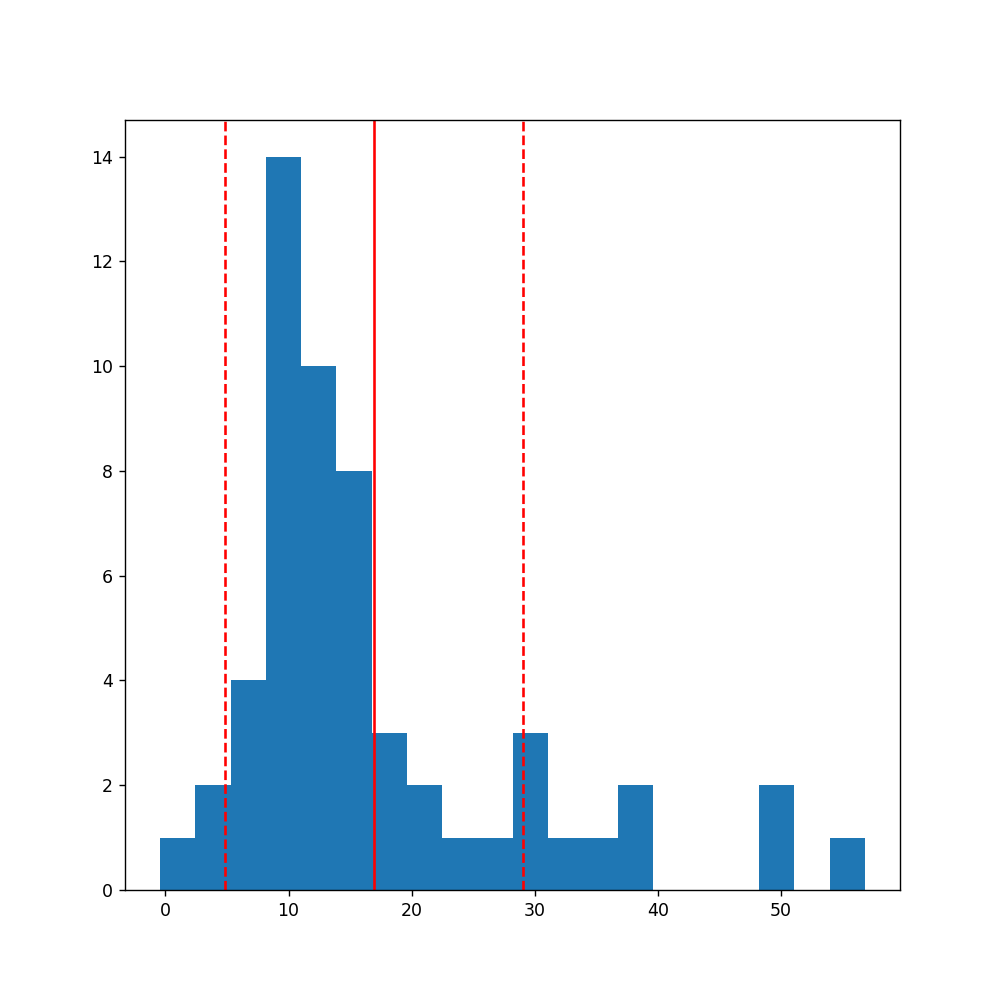

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 9% for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=10.389801324668413, pvalue=1.3932452681948422e-14)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=1.0, pvalue=7.968377335678e-11)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = -0.1428500546008978 (p = 0.2935896048569698)
regressive line first order :  y = -0.12543578009458498 * x + 21.590432377592673


<IPython.core.display.Javascript object>


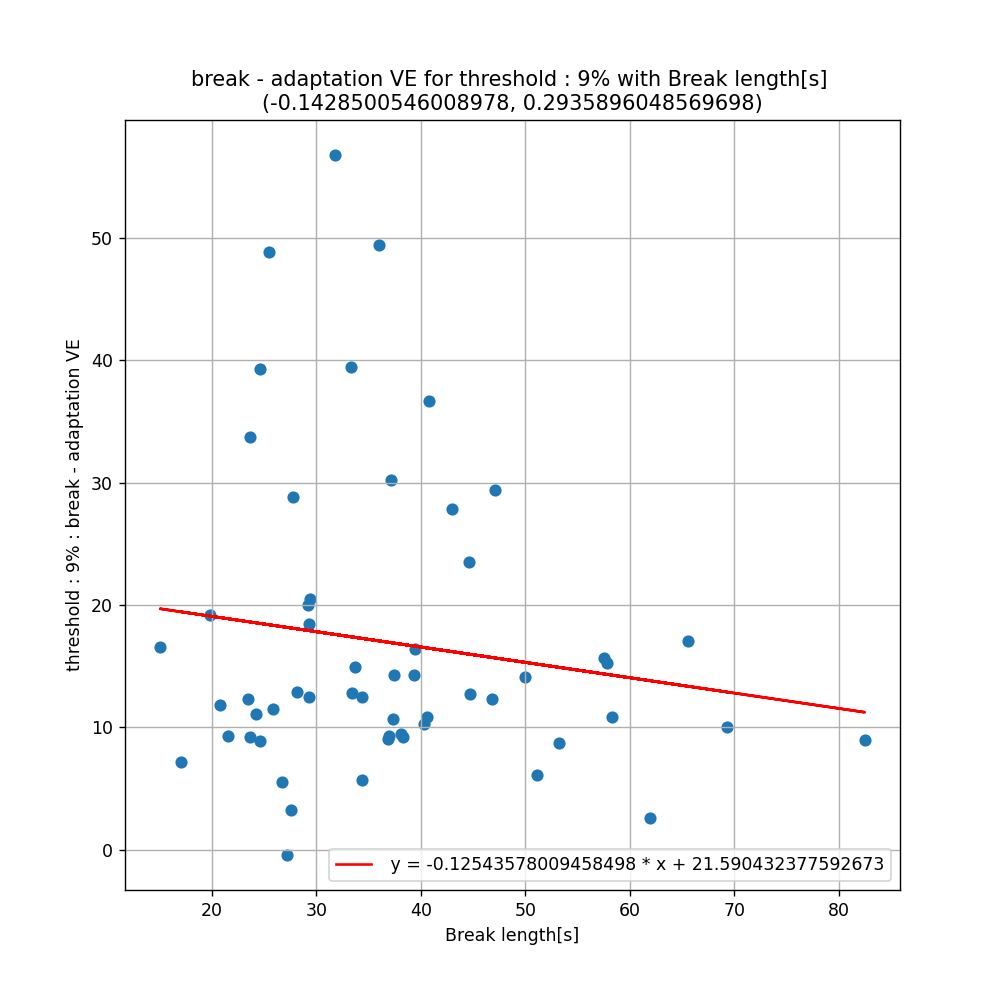

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = -0.2103709182285414 (p = 0.11965170402504591)
regressive line first order :  y = -0.24121712917709498 * x + 23.978973234132322


<IPython.core.display.Javascript object>


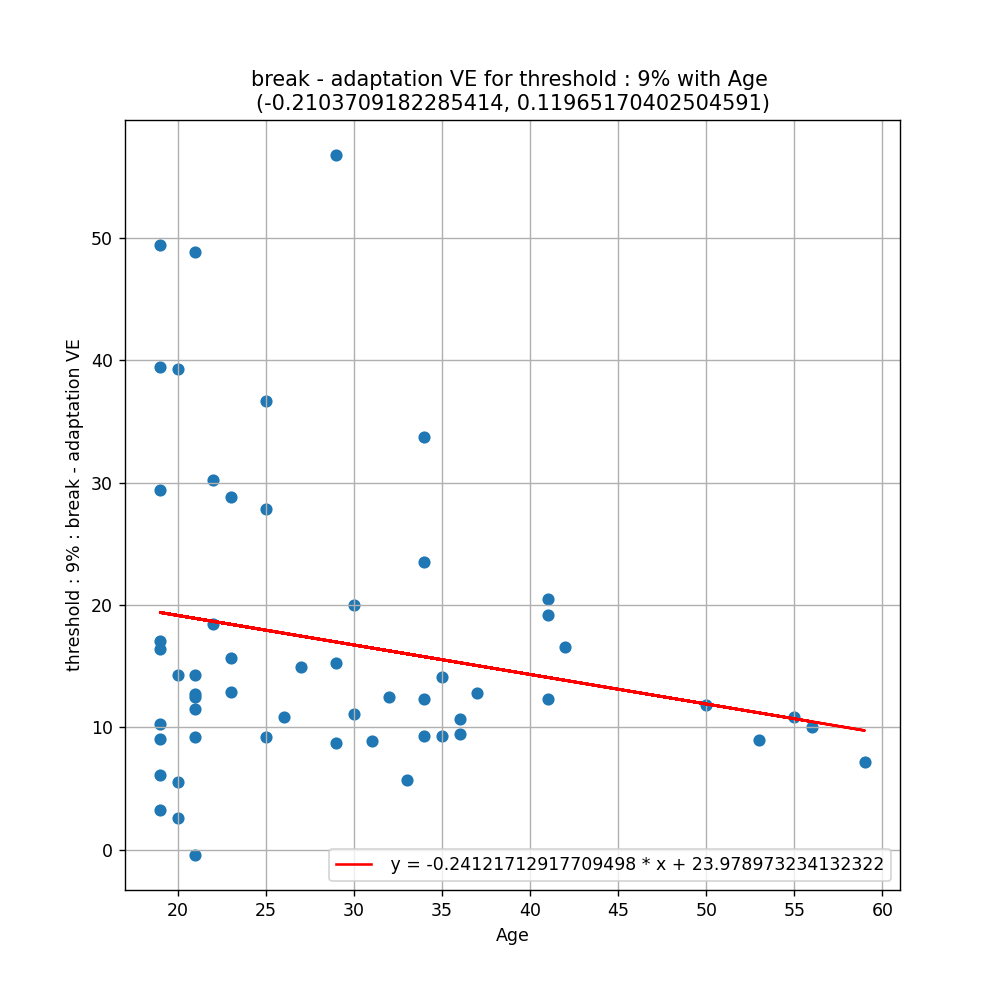

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Heart Rate(HR)[threshold : 9%] :
pearson r = 0.08945647982918839 (p = 0.5120500881134453)
regressive line first order :  y = 0.04647768224167327 * x + 15.9718826453935


<IPython.core.display.Javascript object>


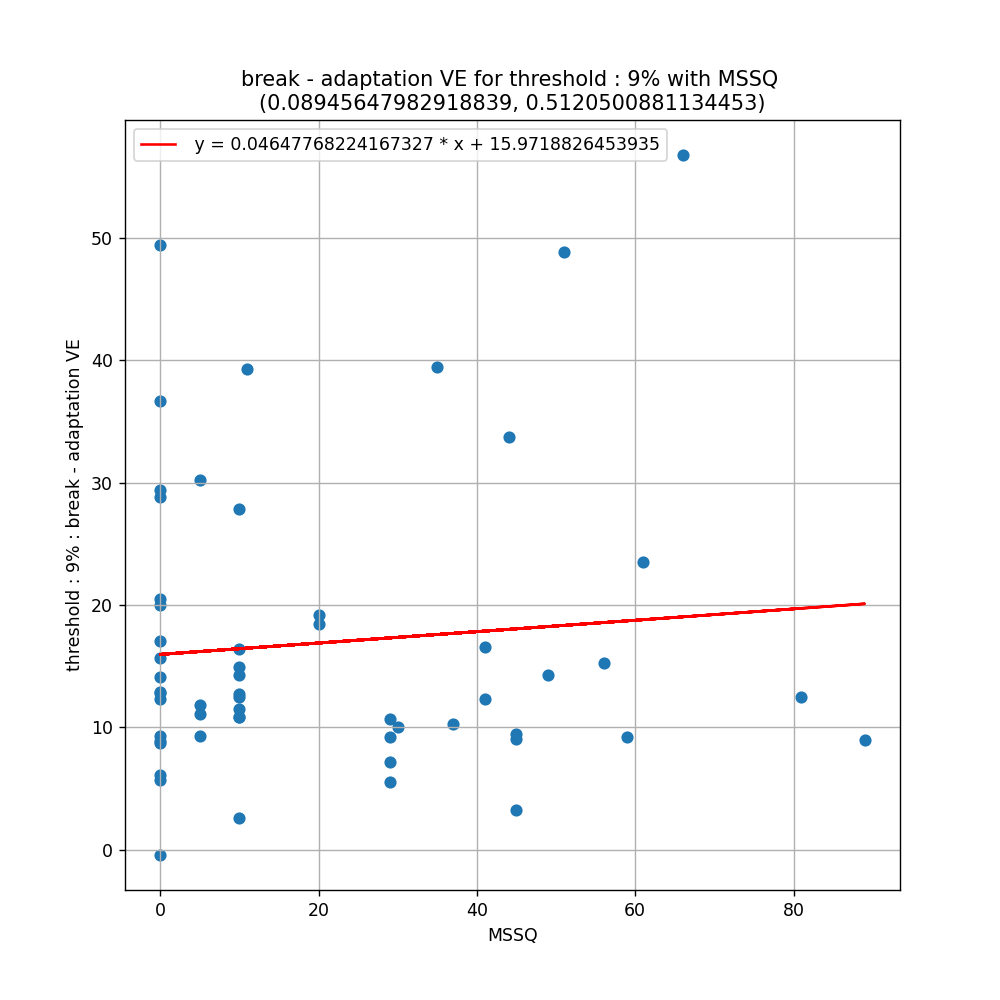




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 50%] for break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 50%] for break - adaptation VE : 13.514196360844663
standard deviation for differences in HR[0.5] for break - adaptation VE : 7.026927509503556
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8471341133117676, pvalue=0.00019866309594362974)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=3.047296309460059, pvalue=0.0023090996461239176)
__________________________________________________
Skew : 1.6985646477401755
__________________________________________________


<IPython.core.display.Javascript object>


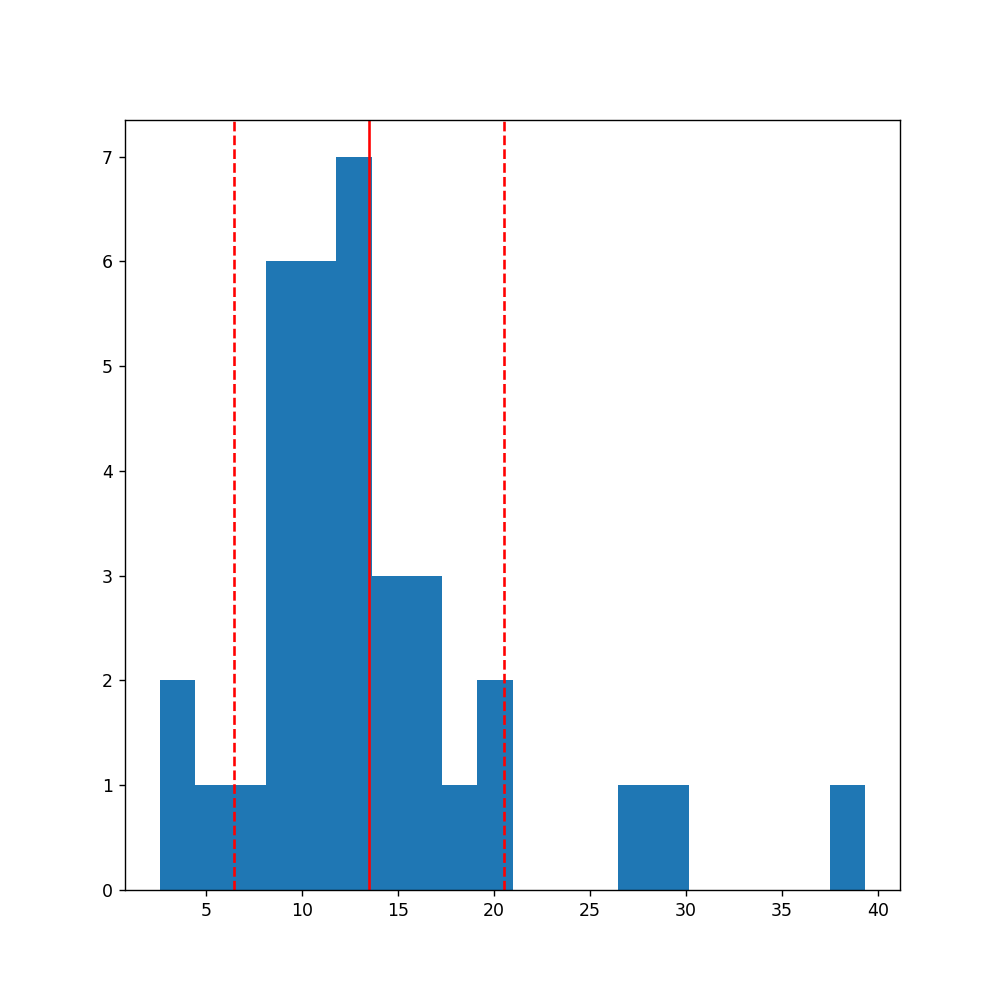

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 50% for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=11.214094463192463, pvalue=5.729799706111197e-13)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=2.4770276393652366e-07)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.18445968002773555 (p = 0.28878894941031413)
regressive line first order :  y = -0.07974049282742665 * x + 16.577917227266187


<IPython.core.display.Javascript object>


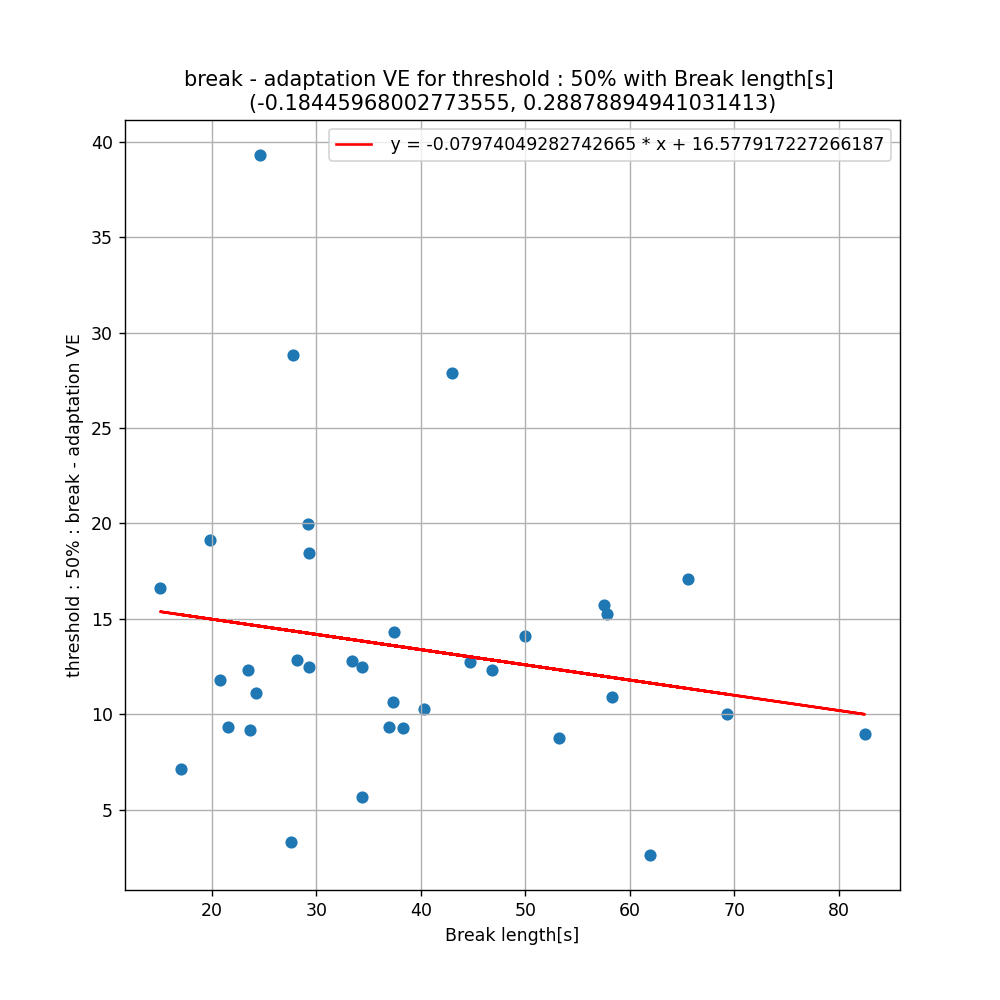

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.23846832010351093 (p = 0.16772263330949969)
regressive line first order :  y = -0.14501215882070845 * x + 18.12558301134319


<IPython.core.display.Javascript object>


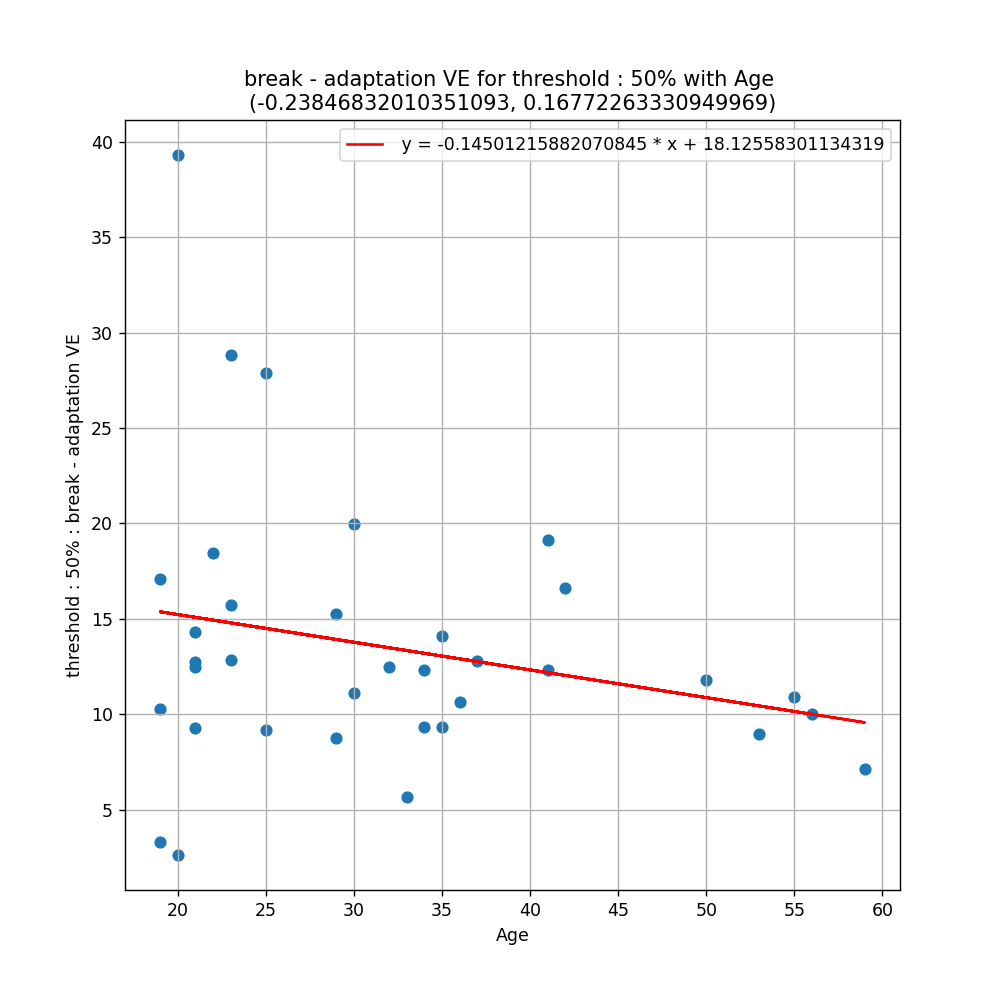

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Heart Rate(HR)[threshold : 50%] :
pearson r = -0.20661549915788968 (p = 0.23370713321849493)
regressive line first order :  y = -0.06200123427555463 * x + 14.74004933566419


<IPython.core.display.Javascript object>


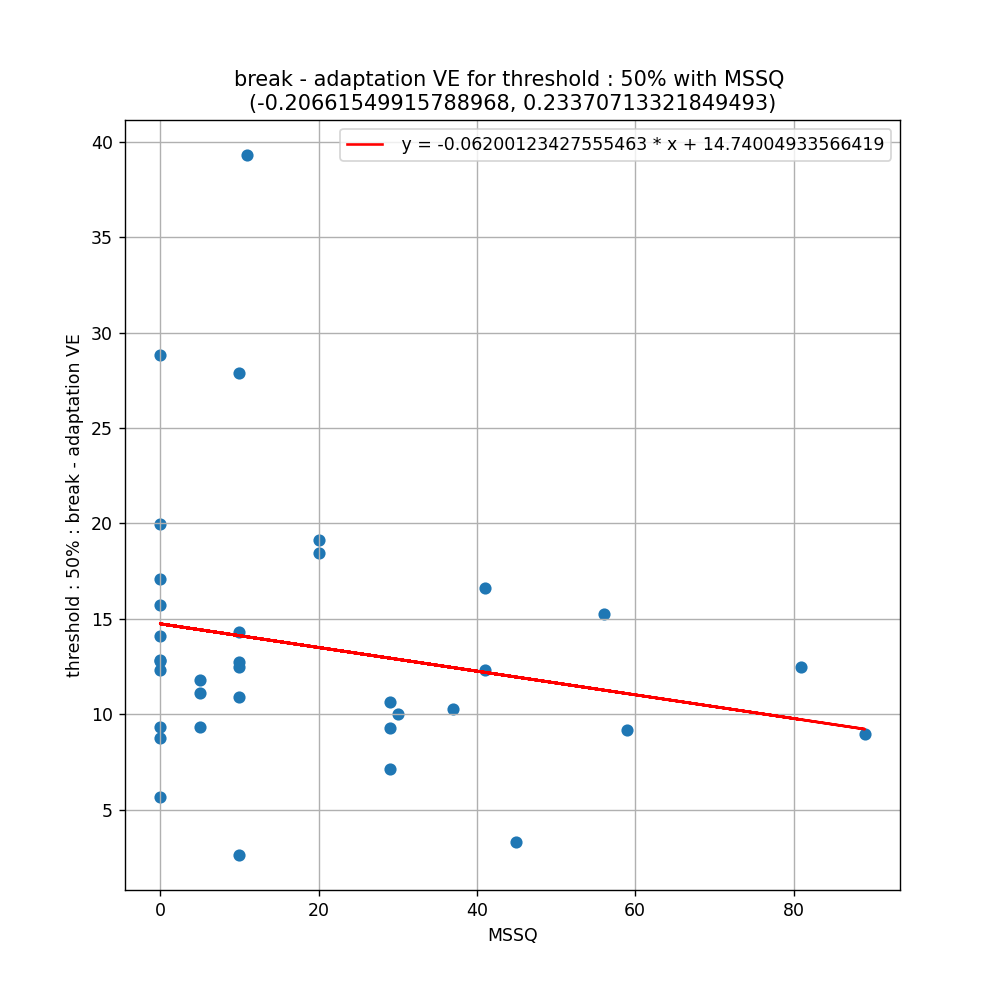




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 90%] for break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 90%] for break - adaptation VE : 13.192999997782248
standard deviation for differences in HR[0.1] for break - adaptation VE : 2.6235560422735142
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.964346706867218, pvalue=0.837878406047821)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=0.6320258672085752, pvalue=0.5273699746727198)
__________________________________________________
Skew : -0.1693690227313645
__________________________________________________


C:\Users\Krzyniu\anaconda3\lib\site-packages\scipy\stats\stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=5
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<IPython.core.display.Javascript object>


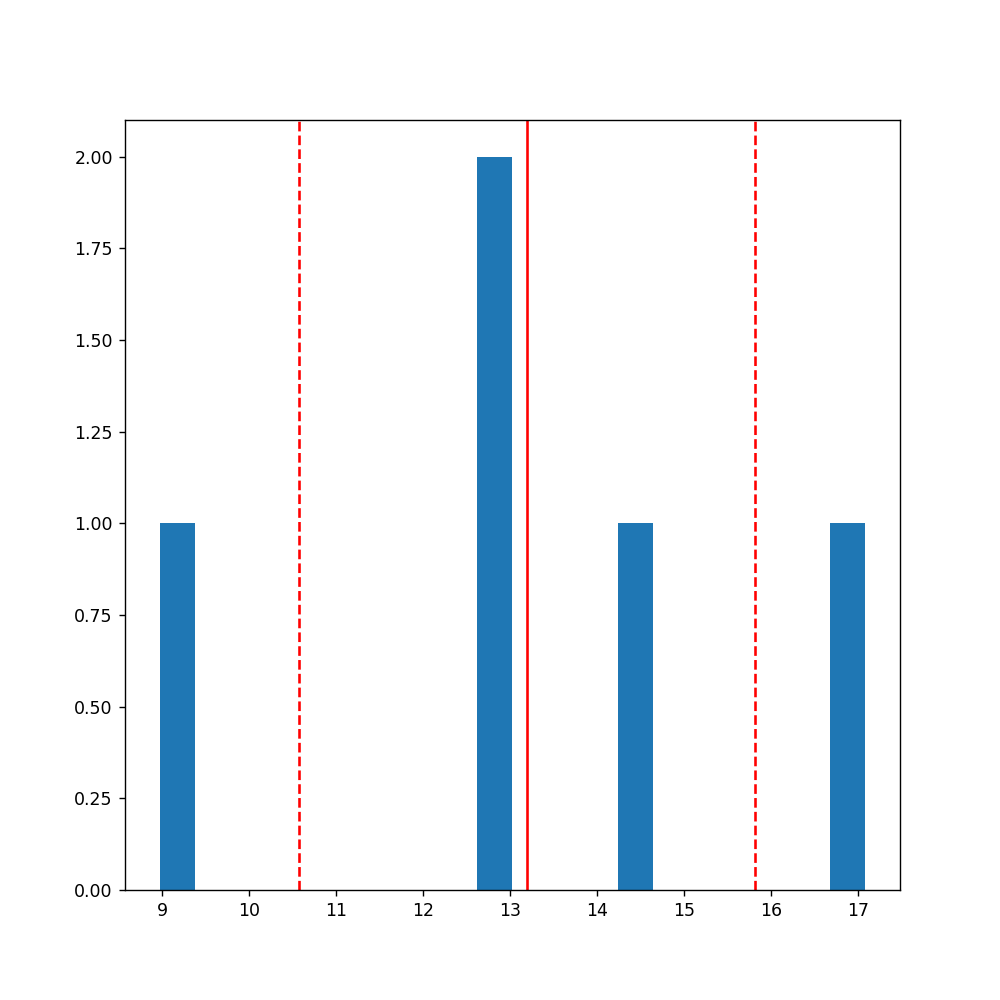

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 90% for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=10.057341856017295, pvalue=0.0005496970393904364)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=0.0625)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.313074559020595 (p = 0.6079921678838585)
regressive line first order :  y = -0.04162436167599273 * x + 15.343980511750846


<IPython.core.display.Javascript object>


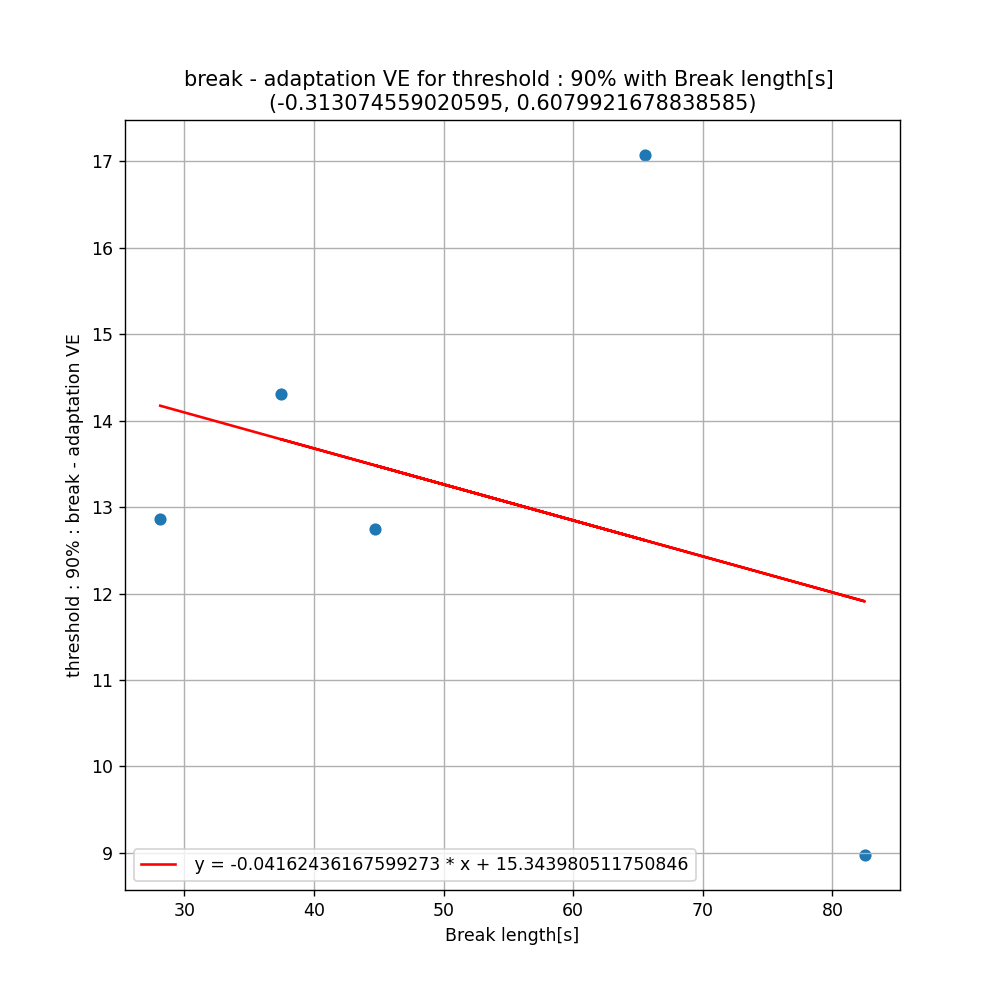

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.8498325147195402 (p = 0.06825980466034755)
regressive line first order :  y = -0.173341850372278 * x + 17.94256669798267


<IPython.core.display.Javascript object>


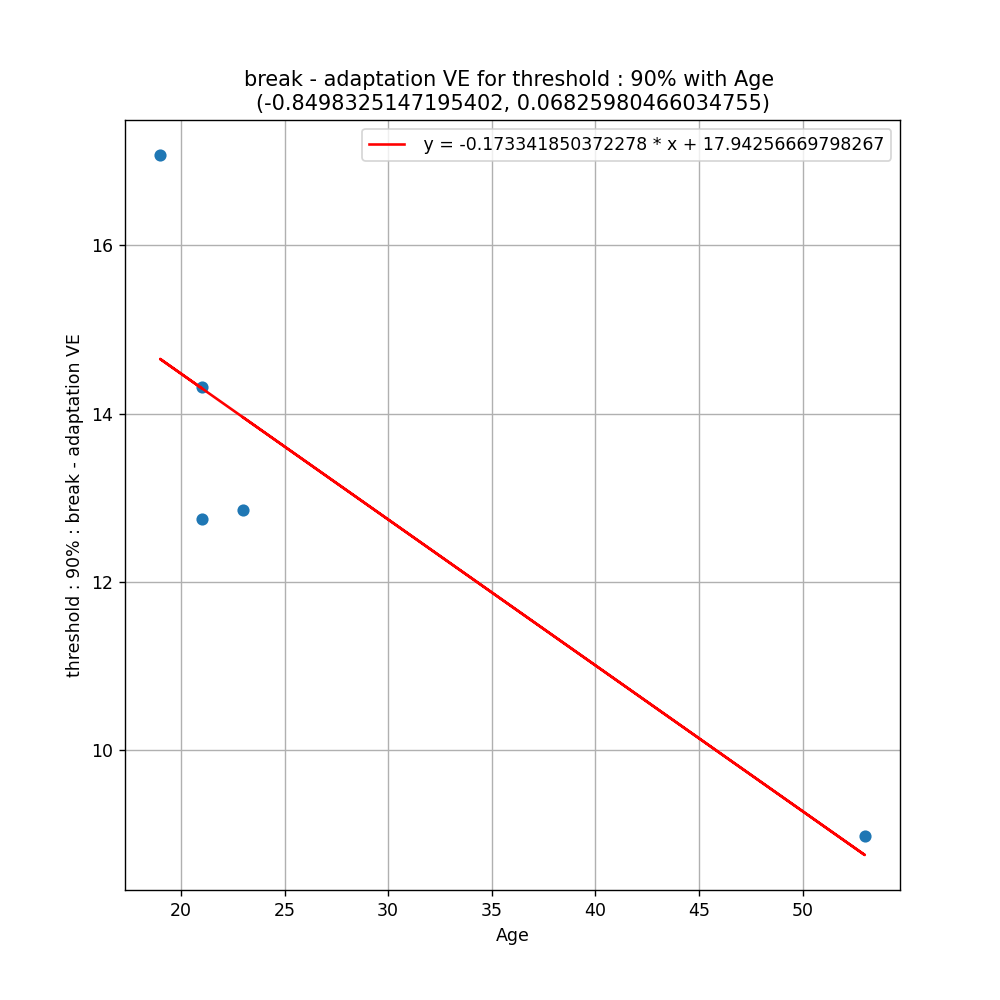

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Heart Rate(HR)[threshold : 90%] :
pearson r = -0.8290119349326204 (p = 0.08266424482103452)
regressive line first order :  y = -0.0641650702284579 * x + 14.591798528762633


<IPython.core.display.Javascript object>


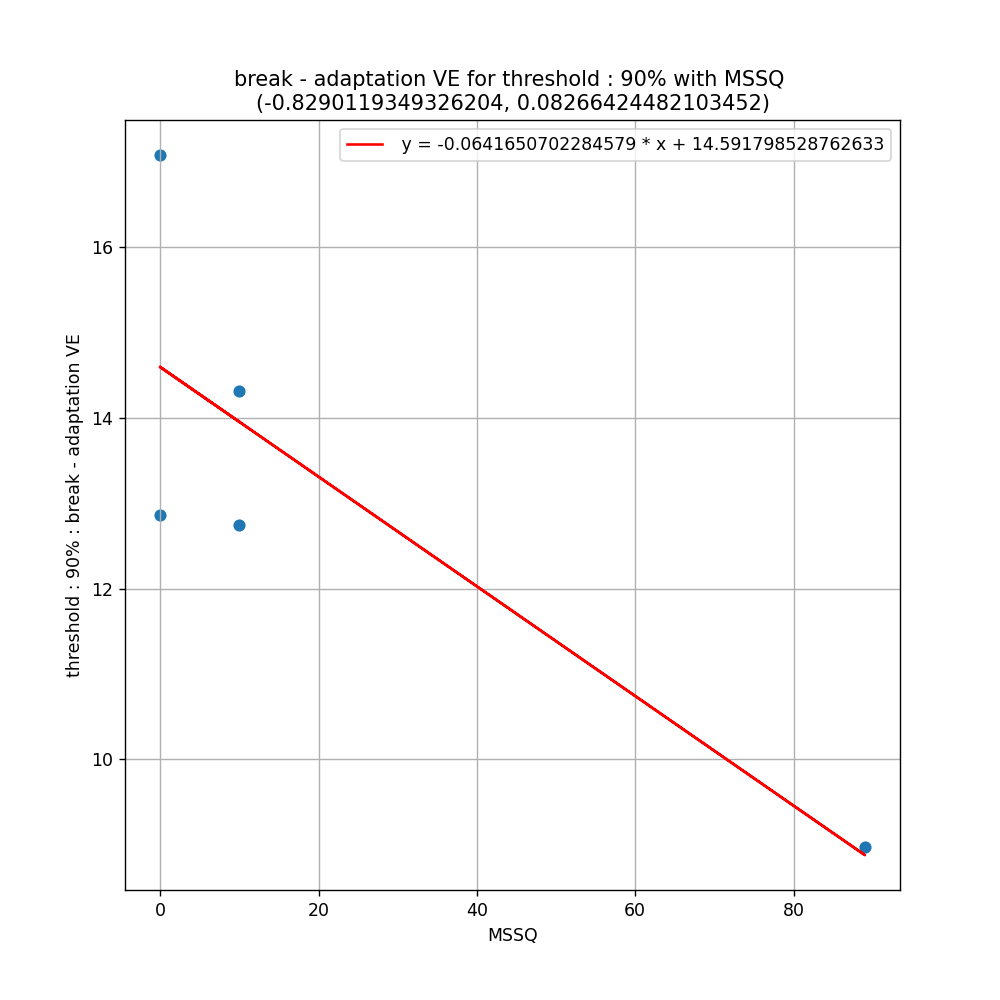


statisticalTestsOnData in 4.669492299959529s


N mean difference  \
adaptation PE - instruction   threshold : 0%    64          -3.673   
                              threshold : 9%    56          -3.337   
                              threshold : 50%   35          -3.162   
                              threshold : 90%    5          -2.551   
adaptation PE - break         threshold : 0%    64         -18.642   
                              threshold : 9%    56         -18.051   
                              threshold : 50%   35         -13.214   
                              threshold : 90%    5         -12.088   
adaptation PE - adaptation VE threshold : 0%    64          -2.437   
                              threshold : 9%    56          -1.115   
                              threshold : 50%   35           0.300   
                              threshold : 90%    5           1.105   
instruction - break           threshold : 0%    64         -14.969   
                              threshold : 9%    56         -14.715   
                              threshold : 50%   35         -10.052   
                              threshold : 90%    5          -9.537   
instruction - adaptation VE   threshold : 0%    64           1.237   
                              threshold : 9%    56           2.222   
                              threshold : 50%   35           3.462   
                              threshold : 90%    5           3.656   
break - adaptation VE         threshold : 0%    64          16.205   
                              threshold : 9%    56          16.936   
                              threshold : 50%   35          13.514   
                              threshold : 90%    5          13.193   
adaptation PE - instruction   Skin Conductance  64          -0.042   
                              Phasic Component  64          -1.059   
                              Tonic Component   64           1.048   
adaptation PE - break         Skin Conductance  64          -0.446   
                              Phasic Component  64          -3.372   
                              Tonic Component   64           2.530   
adaptation PE - adaptation VE Skin Conductance  64          -0.253   
                              Phasic Component  64          -0.116   
                              Tonic Component   64          -0.547   
instruction - break           Skin Conductance  64          -0.404   
                              Phasic Component  64          -2.313   
                              Tonic Component   64           1.482   
instruction - adaptation VE   Skin Conductance  64          -0.211   
                              Phasic Component  64           0.943   
                              Tonic Component   64          -1.595   
break - adaptation VE         Skin Conductance  64           0.193   
                              Phasic Component  64           3.256   
                              Tonic Component   64          -3.077   

                                               standard deviation  \
adaptation PE - instruction   threshold : 0%                8.922   
                              threshold : 9%                5.433   
                              threshold : 50%               4.574   
                              threshold : 90%               3.759   
adaptation PE - break         threshold : 0%               20.914   
                              threshold : 9%               13.950   
                              threshold : 50%               6.416   
                              threshold : 90%               3.231   
adaptation PE - adaptation VE threshold : 0%               23.004   
                              threshold : 9%                6.930   
                              threshold : 50%               3.463   
                              threshold : 90%               3.402   
instruction - break           threshold : 0%               17.985   
                              threshold : 9%               12.599   
   


main in 14.078966100001708s


In [307]:
if __name__ == "__main__":
    main(experimentDataList, testMode = False, devMode = devMode)